In [18]:
import os
import re
from math import sqrt
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import pickle
import sys
import copy
import random
import time
from pathlib import Path
from stable_baselines3 import PPO
from stable_baselines3.common.vec_env import DummyVecEnv, VecNormalize
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.callbacks import BaseCallback, EvalCallback,CheckpointCallback,CallbackList
import torch as th
import torch.nn as nn
from stable_baselines3.common.torch_layers import BaseFeaturesExtractor
import gym
from gym import spaces
import numpy as np

def process_log_file(full_path):
    if os.stat(full_path).st_size == 0:
        print(f"Skipping empty file: {full_path}")
        return pd.DataFrame()

    with open(full_path, 'r') as file:
        data = []
        for line in file:
            match = re.search(r'(\d+\.\d+).*Throughput @(\d+\.\d+)s:\s+(\d+\.\d+)Gbps, lossRate: (\d+\.\d+|\d+)\s+parallelism:(\d+)\s+concurrency:(\d+)\s+score:(-?\d+\.\d+)\s+rtt:(\d+\.\d+) ms energy:(\d+\.\d+) Jules s-plr:([\deE.-]+)', line)
            if match:
                time = datetime.fromtimestamp(float(match.group(1)))
                throughput = float(match.group(3))
                loss_rate = float(match.group(4))
                parallelism = int(match.group(5))
                concurrency = int(match.group(6))
                score = float(match.group(7))
                rtt = float(match.group(8))
                energy = float(match.group(9))
                sender_lr = float(match.group(10))

                data.append([time, throughput, loss_rate, parallelism, concurrency, score, rtt, energy, sender_lr])

        if data:
            df = pd.DataFrame(data, columns=['Time', 'Throughput', 'LossRate', 'Parallelism', 'Concurrency', 'Score', 'RTT', 'Energy', 'SenderLR'])
        else:
            df = pd.DataFrame()
            print(f"No valid data in file: {full_path}")

    return df

def process_directory(directory_path):
    all_dfs = []  # List to hold all DataFrames from each log file
    
    for dirpath, dirnames, filenames in os.walk(directory_path):
        for filename in filenames:
            # Construct the full path to the file
            full_path = os.path.join(dirpath, filename)
            # Check if the file has a log extension (assuming you're processing .log files)
            if filename.endswith(".log"):  # Modify the extension as needed
                print(f"Processing file: {full_path}")
                df = process_log_file(full_path)
                if not df.empty:
                    all_dfs.append(df)
                else:
                    print(f"Empty or invalid data in file: {filename}")

    # Concatenate all DataFrames if not empty
    if all_dfs:
        final_df = pd.concat(all_dfs, ignore_index=True)
        return final_df
    else:
        return pd.DataFrame()  # Return an empty DataFrame if no data was found

def print_empty_dataframes(dfs):
    total_rows=0
    for key, df in dfs.items():
        if df.empty:
            print(f"The DataFrame for key '{key}' is empty.")
        else:
            num_rows = len(df)
            total_rows+=num_rows
            print(f"The DataFrame for key '{key}' has {num_rows} rows")
    print(f"\n\n\nThere are toatl {total_rows} rows in all the transitions dictionaries")



def find_transitions_tuple_based(df, col1, col2, old_tuple, target_tuple):
    # Create a new empty DataFrame with the same columns
    new_df = pd.DataFrame(columns=df.columns)
    # Flag to mark if we are currently in a transition block
    in_transition = False
    # Iterate through the DataFrame
    lst=[]
    for index, row in df.iterrows():
        # Check for transition start
        if row[col1] == old_tuple[0] and row[col2] == old_tuple[1] and not in_transition:
            in_transition = True
        # Check for transition end
        elif row[col1] == target_tuple[0] and row[col2] == target_tuple[1] and in_transition:
            new_df = pd.concat([new_df,pd.DataFrame([row])],ignore_index=True)
            # print(type(new_df))
            # lst.append(row)
            # new_df = new_df.append(row, ignore_index=True)
        # If the value is neither start nor target, reset the flag
        elif row[col1] != old_tuple[0] or row[col2] != old_tuple[1]:
            in_transition = False
    
    # new_df= pd.concat(lst)  
    return new_df.reset_index(drop=True)



def filter_df_by_value_tuple(df_original, column_name_1, column_name_2, value_tuple):
    """
    Filters the DataFrame based on specific values in two given columns and creates an independent copy.

    :param df_original: The original DataFrame.
    :param column_name_1: The name of the first column to filter on.
    :param column_name_2: The name of the second column to filter on.
    :param value_tuple: A tuple containing the values to filter by in the specified columns.
    :return: A new DataFrame containing rows where each column matches its corresponding value in value_tuple.
    """
    filtered_df = df_original[(df_original[column_name_1] == value_tuple[0]) & (df_original[column_name_2] == value_tuple[1])].copy()
    return filtered_df



def sample_row_and_neighbors(df, column_name):
    """
    Samples a row based on the distribution of a specific column and returns it with its 4 neighboring rows.
    If fewer than 5 rows are returned, the function duplicates rows to ensure 5 rows are returned.

    :param df: The DataFrame to sample from.
    :param column_name: The column whose distribution to use for sampling.
    :return: A DataFrame containing the sampled row and its 4 neighbors, ensuring 5 rows in total.
    """
    # Ensure the DataFrame's index is reset
    df = df.reset_index(drop=True)
    # Calculate the frequency distribution of the column
    probabilities = df[column_name].value_counts(normalize=True)
    # Map these probabilities back to the DataFrame's index
    probabilities = df[column_name].map(probabilities)
    # Sample one row using these probabilities
    sampled_row = df.sample(n=1, weights=probabilities)
    sampled_index = sampled_row.index[0]

    # Ensure the sampled index is within the DataFrame's range
    if sampled_index >= len(df):
        raise ValueError("Sampled index is out of DataFrame's range.")

    # Attempt to select 2 neighbors from each side
    start_index = max(sampled_index - 2, 0)
    end_index = min(sampled_index + 2, len(df) - 1)
    selected_rows = df.iloc[start_index:end_index + 1]

    # If fewer than 5 rows are selected, duplicate rows to reach 5
    while len(selected_rows) < 5:
        if start_index > 0:
            start_index -= 1
        elif end_index < len(df) - 1:
            end_index += 1
        else:
            # If start and end indices cover the whole DataFrame, duplicate the last row
            selected_rows = pd.concat([selected_rows, selected_rows.iloc[[-1]]], ignore_index=True)
        # Update selected_rows if indices were adjusted
        if len(selected_rows) < 5:
            selected_rows = df.iloc[start_index:end_index + 1]

    return selected_rows


def normalize_and_flatten(df, min_values, max_values):
    # Drop the specified columns
    df = df.drop(columns=['Time'])
    score_array = df['Score'].values
    energy_array=df['Energy'].values
    throughput_array=df['Throughput'].values
#     print(df.describe())
    # Normalize each column
    normalized_df = (df - min_values) / (max_values - min_values)

    # Flatten the DataFrame to a single NumPy array
    flattened_array = normalized_df.values.flatten()

    return flattened_array,score_array,energy_array,throughput_array


In [19]:
with open('initial_dataframes_multi_action.pickle', 'rb') as handle:
    initial_value_cluster_dictionary = pickle.load(handle)

print_empty_dataframes(initial_value_cluster_dictionary)

The DataFrame for key '(1, 1)' has 4134 rows
The DataFrame for key '(1, 2)' has 811 rows
The DataFrame for key '(1, 3)' has 821 rows
The DataFrame for key '(1, 4)' has 830 rows
The DataFrame for key '(1, 5)' has 836 rows
The DataFrame for key '(1, 6)' has 816 rows
The DataFrame for key '(1, 7)' has 831 rows
The DataFrame for key '(1, 8)' has 825 rows
The DataFrame for key '(2, 1)' has 1340 rows
The DataFrame for key '(2, 2)' has 845 rows
The DataFrame for key '(2, 3)' has 808 rows
The DataFrame for key '(2, 4)' has 817 rows
The DataFrame for key '(2, 5)' has 819 rows
The DataFrame for key '(2, 6)' has 812 rows
The DataFrame for key '(2, 7)' has 811 rows
The DataFrame for key '(2, 8)' has 814 rows
The DataFrame for key '(3, 1)' has 841 rows
The DataFrame for key '(3, 2)' has 821 rows
The DataFrame for key '(3, 3)' has 805 rows
The DataFrame for key '(3, 4)' has 821 rows
The DataFrame for key '(3, 5)' has 813 rows
The DataFrame for key '(3, 6)' has 816 rows
The DataFrame for key '(3, 7)'

In [20]:
with open('dataframes_multi_action.pickle', 'rb') as handle:
    cluster_dictionary = pickle.load(handle)

print_empty_dataframes(cluster_dictionary)

The DataFrame for key '((1, 1), (1, 2))' has 20 rows
The DataFrame for key '((1, 1), (1, 3))' has 13 rows
The DataFrame for key '((1, 1), (1, 4))' has 13 rows
The DataFrame for key '((1, 1), (1, 5))' has 30 rows
The DataFrame for key '((1, 1), (1, 6))' has 13 rows
The DataFrame for key '((1, 1), (1, 7))' has 13 rows
The DataFrame for key '((1, 1), (1, 8))' has 13 rows
The DataFrame for key '((1, 1), (2, 1))' has 543 rows
The DataFrame for key '((1, 1), (2, 2))' has 31 rows
The DataFrame for key '((1, 1), (2, 3))' has 13 rows
The DataFrame for key '((1, 1), (2, 4))' has 13 rows
The DataFrame for key '((1, 1), (2, 5))' has 13 rows
The DataFrame for key '((1, 1), (2, 6))' has 13 rows
The DataFrame for key '((1, 1), (2, 7))' has 13 rows
The DataFrame for key '((1, 1), (2, 8))' has 13 rows
The DataFrame for key '((1, 1), (3, 1))' has 13 rows
The DataFrame for key '((1, 1), (3, 2))' has 13 rows
The DataFrame for key '((1, 1), (3, 3))' has 13 rows
The DataFrame for key '((1, 1), (3, 4))' has 

**EnergySLA**

In [21]:
class transferClass_multi_action_increase_decrease_energy_SLA(gym.Env):
    metadata = {"render_modes": ["human"], "render_fps": 30}
    def __init__(self,transaction_dfs,initial_dfs,optimizer,total_steps=20,min_values=[0.32, 0.0, 1, 1, -3081.0, 0.0, 44.0, 0.0],max_values = [19.2, 2.0, 8, 8, 16.0, 70.1, 120.0, 74.166],total_file_size=256):
        super().__init__()
        self.min_action=1
        self.max_action=8
        self.action_i_d_array=[1,4,0,-1,-4]

        self.transaction_dfs = transaction_dfs
        self.initial_dfs= initial_dfs

        self.action_space = spaces.MultiDiscrete([5, 5])  # example action space
        self.current_action_parallelism_value=1
        self.current_action_concurrency_value=1
        self.observation_space = spaces.Box(low=0, high=np.inf, shape=(40,), dtype=np.float32) # example observation space
        self.current_observation = np.zeros(40,) # initialize current observation

        self.energy_sla=75
        self.optimizer=optimizer
        self.old_action=None
        self.step_number=0
        self.total_steps=total_steps
        self.sampling_metric='Score'
        self.min_values=np.array(min_values)
        self.max_values=np.array(max_values)
        self.previous_reward=0
        self.obs_df=[]
        self.total_file_size= total_file_size
        self.current_download_size=0

    def reset(self):
        self.current_observation = np.zeros(40,) # initialize current observation
        self.old_action=None
        self.step_number=0
        self.previous_reward=0
        self.current_action_parallelism_value=1
        self.current_action_concurrency_value=1
        self.obs_df=[]
        self.current_download_size=0
        return self.current_observation

    def step(self, action):
        # perform action using transfer_service
        action_1,action_2=action

        self.current_action_parallelism_value+=self.action_i_d_array[action_1]
        if self.current_action_parallelism_value<self.min_action:
            self.current_action_parallelism_value=self.min_action
        elif self.current_action_parallelism_value>self.max_action:
            self.current_action_parallelism_value=self.max_action

        self.current_action_concurrency_value+=self.action_i_d_array[action_2]
        if self.current_action_concurrency_value<self.min_action:
            self.current_action_concurrency_value=self.min_action
        elif self.current_action_concurrency_value>self.max_action:
            self.current_action_concurrency_value=self.max_action


        action_t=(self.current_action_parallelism_value,self.current_action_concurrency_value)
#         print(f"action_t {action_t}")

        if self.old_action==None:
            done=False
            observation_df=sample_row_and_neighbors(self.initial_dfs[action_t],self.sampling_metric)
            self.obs_df.append(observation_df)
            observation,result_array,e_array,t_array=normalize_and_flatten(observation_df,self.min_values,self.max_values)
            self.current_download_size+=np.sum(t_array)
            energy_part_reward=np.mean(e_array)
            if energy_part_reward > self.energy_sla:
                energy_penalty=energy_part_reward-self.energy_sla
            else:
                energy_penalty=0                
            reward_=np.mean(t_array)-energy_penalty 
            self.old_action=action_t
            reward=reward_- self.previous_reward
            self.previous_reward=reward_

        elif self.old_action==action_t:
            done=False
            observation_df=sample_row_and_neighbors(self.initial_dfs[action_t],self.sampling_metric)
            self.obs_df.append(observation_df)
            observation,result_array,e_array,t_array=normalize_and_flatten(observation_df,self.min_values,self.max_values)
            self.current_download_size+=np.sum(t_array)
            energy_part_reward=np.mean(e_array)
            if energy_part_reward > self.energy_sla:
                energy_penalty=energy_part_reward-self.energy_sla
            else:
                energy_penalty=0                
            reward_=np.mean(t_array)-energy_penalty 
            self.old_action=action_t
            reward=reward_-self.previous_reward
            self.previous_reward=reward_

        else:
            done=False
            key_name=(self.old_action, action_t)
            work_df=self.transaction_dfs[key_name]
            if work_df.empty:
                observation_df=sample_row_and_neighbors(self.initial_dfs[action_t],self.sampling_metric)
            else:
                observation_df=sample_row_and_neighbors(self.transaction_dfs[key_name],self.sampling_metric)
            self.obs_df.append(observation_df)
            observation,result_array,e_array,t_array=normalize_and_flatten(observation_df,self.min_values,self.max_values)
            self.current_download_size+=np.sum(t_array)
            energy_part_reward=np.mean(e_array)            
            if energy_part_reward > self.energy_sla:
                energy_penalty=energy_part_reward-self.energy_sla
            else:
                energy_penalty=0
            reward_=np.mean(t_array)-energy_penalty 
            self.old_action=action_t
            reward=reward_-self.previous_reward
            self.previous_reward=reward_


        self.step_number+=1
        if self.current_download_size>=self.total_file_size:
            done=True
        observation = np.asarray(observation).astype(np.float32)
        self.current_observation=observation
        return self.current_observation, reward, done, {}

    def bayes_step(self,action):
        params = [1 if x<1 else int(np.round(x)) for x in action]
        self.current_action_array_index+=self.action_i_d_array[params[0]]
        if self.current_action_array_index<self.min_action:
            self.current_action_array_index=self.min_action
        elif self.current_action_array_index>self.max_action:
            self.current_action_array_index=self.max_action
        action_t=self.action_array[self.current_action_array_index]

        print("Bayes Step: ",action_t)
        obs,score_b,done_b,__=self.step(action_t)
        print("Bayes Step Score: ", score_b)
        return np.round(score_b * (-1))

    def render(self, mode="human"):
        pass

    def close(self):
        self.reset()


In [5]:
env=transferClass_multi_action_increase_decrease_energy_SLA(cluster_dictionary,initial_value_cluster_dictionary,'energySLA')
evaluation_env=transferClass_multi_action_increase_decrease_energy_SLA(cluster_dictionary,initial_value_cluster_dictionary,'energySLA')

policy_kwargs = dict(activation_fn=th.nn.ReLU,net_arch=[{'pi': [128, 128], 'vf': [128, 128]}])

run_string='multi_action_in_de_energySLA'
model = PPO("MlpPolicy", env=env, policy_kwargs=policy_kwargs, verbose=1,tensorboard_log=f"./ppo_tensorboard_{run_string}/",ent_coef=0.01)

eval_callback = EvalCallback(evaluation_env, best_model_save_path=f'./ppo_{run_string}/ppo_best_model/',
                               log_path=f'./ppo_{run_string}/ppo_logs/', eval_freq=1000,
                               deterministic=True, render=False)
# Callback for saving checkpoints every 1000 timesteps
checkpoint_callback = CheckpointCallback(save_freq=100000, save_path=f'./ppo_{run_string}/ppo_checkpoints/',
                                           name_prefix=f'ppo_model_{run_string}')

# Combine both callbacks
callback = CallbackList([checkpoint_callback, eval_callback])
model.learn(total_timesteps=1000000, callback=callback)

Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


2024-02-22 17:58:53.675166: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-22 17:58:53.748346: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-02-22 17:58:53.764121: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-22 17:58:54.002495: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: li

Logging to ./ppo_tensorboard_multi_action_in_de_energySLA/PPO_1
Eval num_timesteps=1000, episode_reward=2.80 +/- 0.33
Episode length: 20.00 +/- 0.89
---------------------------------
| eval/              |          |
|    mean_ep_length  | 20       |
|    mean_reward     | 2.8      |
| time/              |          |
|    total_timesteps | 1000     |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
Eval num_timesteps=2000, episode_reward=3.72 +/- 0.97
Episode length: 19.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 19.6     |
|    mean_reward     | 3.72     |
| time/              |          |
|    total_timesteps | 2000     |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.9     |
|    ep_rew_mean     | -6.1     |
| time/              |          |
|    fps             | 401      |
|    iterations      | 1        |
|    time_elapsed    | 5        |
|    total_timesteps | 2048     |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=3000, episode_reward=0.73 +/- 0.72
Episode length: 118.60 +/- 4.84
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 119         |
|    mean_reward          | 0.73        |
| time/                   |             |
|    total_timesteps      | 3000        |
| train/                  |             |
|    approx_kl            | 0.008640704 |
|    clip_fraction        | 0.101       |
|    clip_range           | 0.2         |
|    entropy_loss         | -3.21       |
|    explained_variance   | -0.00457    |
|    learning_rate        | 0.0003      |
|    loss                 | 20          |
|    n_updates            | 10          |
|    policy_gradient_loss | -0.0191     |
|    value_loss           | 44.9        |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=4000, episode_reward=1.00 +/- 0.76
Episode length: 119.60 +/- 6.59
---------------------------------
| eval/              |          |
|    mean_ep_length  | 120      |
|    mean_reward     | 0.998    |
| time/              |          |
|    total_timesteps | 4000     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.6     |
|    ep_rew_mean     | -3.3     |
| time/              |          |
|    fps             | 357      |
|    iterations      | 2        |
|    time_elapsed    | 11       |
|    total_timesteps | 4096     |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=5000, episode_reward=0.35 +/- 0.05
Episode length: 124.80 +/- 8.38
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 125          |
|    mean_reward          | 0.346        |
| time/                   |              |
|    total_timesteps      | 5000         |
| train/                  |              |
|    approx_kl            | 0.0082208365 |
|    clip_fraction        | 0.12         |
|    clip_range           | 0.2          |
|    entropy_loss         | -3.19        |
|    explained_variance   | 0.189        |
|    learning_rate        | 0.0003       |
|    loss                 | 11.4         |
|    n_updates            | 20           |
|    policy_gradient_loss | -0.0155      |
|    value_loss           | 27.5         |
------------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=6000, episode_reward=0.96 +/- 1.18
Episode length: 123.20 +/- 10.68
---------------------------------
| eval/              |          |
|    mean_ep_length  | 123      |
|    mean_reward     | 0.96     |
| time/              |          |
|    total_timesteps | 6000     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20.2     |
|    ep_rew_mean     | -2.62    |
| time/              |          |
|    fps             | 346      |
|    iterations      | 3        |
|    time_elapsed    | 17       |
|    total_timesteps | 6144     |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=7000, episode_reward=1.27 +/- 0.62
Episode length: 57.60 +/- 4.59
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 57.6        |
|    mean_reward          | 1.27        |
| time/                   |             |
|    total_timesteps      | 7000        |
| train/                  |             |
|    approx_kl            | 0.010646343 |
|    clip_fraction        | 0.144       |
|    clip_range           | 0.2         |
|    entropy_loss         | -3.16       |
|    explained_variance   | 0.301       |
|    learning_rate        | 0.0003      |
|    loss                 | 7.73        |
|    n_updates            | 30          |
|    policy_gradient_loss | -0.0193     |
|    value_loss           | 20.8        |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=8000, episode_reward=1.51 +/- 1.14
Episode length: 58.80 +/- 5.34
---------------------------------
| eval/              |          |
|    mean_ep_length  | 58.8     |
|    mean_reward     | 1.51     |
| time/              |          |
|    total_timesteps | 8000     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 24.1     |
|    ep_rew_mean     | -0.554   |
| time/              |          |
|    fps             | 357      |
|    iterations      | 4        |
|    time_elapsed    | 22       |
|    total_timesteps | 8192     |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=9000, episode_reward=1.16 +/- 0.80
Episode length: 58.80 +/- 6.65
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 58.8        |
|    mean_reward          | 1.16        |
| time/                   |             |
|    total_timesteps      | 9000        |
| train/                  |             |
|    approx_kl            | 0.008651268 |
|    clip_fraction        | 0.0875      |
|    clip_range           | 0.2         |
|    entropy_loss         | -3.14       |
|    explained_variance   | 0.334       |
|    learning_rate        | 0.0003      |
|    loss                 | 2.64        |
|    n_updates            | 40          |
|    policy_gradient_loss | -0.0108     |
|    value_loss           | 12          |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=10000, episode_reward=1.09 +/- 0.48
Episode length: 56.80 +/- 3.25
---------------------------------
| eval/              |          |
|    mean_ep_length  | 56.8     |
|    mean_reward     | 1.09     |
| time/              |          |
|    total_timesteps | 10000    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 25.2     |
|    ep_rew_mean     | 0.661    |
| time/              |          |
|    fps             | 364      |
|    iterations      | 5        |
|    time_elapsed    | 28       |
|    total_timesteps | 10240    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=11000, episode_reward=1.54 +/- 0.92
Episode length: 60.00 +/- 7.18
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 60          |
|    mean_reward          | 1.54        |
| time/                   |             |
|    total_timesteps      | 11000       |
| train/                  |             |
|    approx_kl            | 0.011426991 |
|    clip_fraction        | 0.122       |
|    clip_range           | 0.2         |
|    entropy_loss         | -3.11       |
|    explained_variance   | 0.378       |
|    learning_rate        | 0.0003      |
|    loss                 | 5.61        |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.0103     |
|    value_loss           | 8.98        |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=12000, episode_reward=1.40 +/- 0.98
Episode length: 58.40 +/- 4.76
---------------------------------
| eval/              |          |
|    mean_ep_length  | 58.4     |
|    mean_reward     | 1.4      |
| time/              |          |
|    total_timesteps | 12000    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 26.5     |
|    ep_rew_mean     | 1.33     |
| time/              |          |
|    fps             | 366      |
|    iterations      | 6        |
|    time_elapsed    | 33       |
|    total_timesteps | 12288    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=13000, episode_reward=1.32 +/- 1.01
Episode length: 56.40 +/- 3.01
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 56.4        |
|    mean_reward          | 1.32        |
| time/                   |             |
|    total_timesteps      | 13000       |
| train/                  |             |
|    approx_kl            | 0.012427539 |
|    clip_fraction        | 0.137       |
|    clip_range           | 0.2         |
|    entropy_loss         | -3.1        |
|    explained_variance   | 0.47        |
|    learning_rate        | 0.0003      |
|    loss                 | 1.21        |
|    n_updates            | 60          |
|    policy_gradient_loss | -0.0133     |
|    value_loss           | 4.65        |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=14000, episode_reward=1.24 +/- 0.75
Episode length: 57.80 +/- 4.17
---------------------------------
| eval/              |          |
|    mean_ep_length  | 57.8     |
|    mean_reward     | 1.24     |
| time/              |          |
|    total_timesteps | 14000    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 26.8     |
|    ep_rew_mean     | 1.4      |
| time/              |          |
|    fps             | 370      |
|    iterations      | 7        |
|    time_elapsed    | 38       |
|    total_timesteps | 14336    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=15000, episode_reward=0.79 +/- 0.24
Episode length: 59.80 +/- 5.84
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 59.8        |
|    mean_reward          | 0.794       |
| time/                   |             |
|    total_timesteps      | 15000       |
| train/                  |             |
|    approx_kl            | 0.011901757 |
|    clip_fraction        | 0.124       |
|    clip_range           | 0.2         |
|    entropy_loss         | -3.06       |
|    explained_variance   | 0.436       |
|    learning_rate        | 0.0003      |
|    loss                 | 2.5         |
|    n_updates            | 70          |
|    policy_gradient_loss | -0.0104     |
|    value_loss           | 5.61        |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=16000, episode_reward=1.41 +/- 0.79
Episode length: 63.40 +/- 3.38
---------------------------------
| eval/              |          |
|    mean_ep_length  | 63.4     |
|    mean_reward     | 1.41     |
| time/              |          |
|    total_timesteps | 16000    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 27.2     |
|    ep_rew_mean     | 1.54     |
| time/              |          |
|    fps             | 371      |
|    iterations      | 8        |
|    time_elapsed    | 44       |
|    total_timesteps | 16384    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=17000, episode_reward=1.61 +/- 0.47
Episode length: 41.60 +/- 2.06
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 41.6        |
|    mean_reward          | 1.61        |
| time/                   |             |
|    total_timesteps      | 17000       |
| train/                  |             |
|    approx_kl            | 0.013333943 |
|    clip_fraction        | 0.14        |
|    clip_range           | 0.2         |
|    entropy_loss         | -3.04       |
|    explained_variance   | 0.504       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.95        |
|    n_updates            | 80          |
|    policy_gradient_loss | -0.0129     |
|    value_loss           | 3.51        |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=18000, episode_reward=1.55 +/- 0.93
Episode length: 42.80 +/- 2.14
---------------------------------
| eval/              |          |
|    mean_ep_length  | 42.8     |
|    mean_reward     | 1.55     |
| time/              |          |
|    total_timesteps | 18000    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 25.6     |
|    ep_rew_mean     | 1.46     |
| time/              |          |
|    fps             | 376      |
|    iterations      | 9        |
|    time_elapsed    | 49       |
|    total_timesteps | 18432    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=19000, episode_reward=1.44 +/- 0.87
Episode length: 39.00 +/- 1.10
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 39          |
|    mean_reward          | 1.44        |
| time/                   |             |
|    total_timesteps      | 19000       |
| train/                  |             |
|    approx_kl            | 0.014796446 |
|    clip_fraction        | 0.199       |
|    clip_range           | 0.2         |
|    entropy_loss         | -3.01       |
|    explained_variance   | 0.425       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.99        |
|    n_updates            | 90          |
|    policy_gradient_loss | -0.016      |
|    value_loss           | 4.9         |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=20000, episode_reward=1.86 +/- 0.76
Episode length: 37.00 +/- 1.41
---------------------------------
| eval/              |          |
|    mean_ep_length  | 37       |
|    mean_reward     | 1.86     |
| time/              |          |
|    total_timesteps | 20000    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 23.4     |
|    ep_rew_mean     | 1.77     |
| time/              |          |
|    fps             | 378      |
|    iterations      | 10       |
|    time_elapsed    | 54       |
|    total_timesteps | 20480    |
---------------------------------
Eval num_timesteps=21000, episode_reward=3.35 +/- 0.68
Episode length: 19.40 +/- 1.36
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 19.4        |
|    mean_reward          | 3.35        |
| time/                   |             |
|    total_timesteps      | 21000       

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=22000, episode_reward=3.39 +/- 0.96
Episode length: 19.40 +/- 1.02
---------------------------------
| eval/              |          |
|    mean_ep_length  | 19.4     |
|    mean_reward     | 3.39     |
| time/              |          |
|    total_timesteps | 22000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 22.1     |
|    ep_rew_mean     | 2.55     |
| time/              |          |
|    fps             | 383      |
|    iterations      | 11       |
|    time_elapsed    | 58       |
|    total_timesteps | 22528    |
---------------------------------
Eval num_timesteps=23000, episode_reward=3.00 +/- 0.21
Episode length: 18.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 18.8        |
|    mean_reward          | 3           |
| time/                   |             |
|    total_timesteps      | 23000       |
| train/                  |             |
|    approx_kl            | 0.013657574 |
|    clip_fraction        | 0.188       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.93       |
|    explained_variance   | 0.709       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=24000, episode_reward=3.61 +/- 0.80
Episode length: 17.60 +/- 0.80
---------------------------------
| eval/              |          |
|    mean_ep_length  | 17.6     |
|    mean_reward     | 3.61     |
| time/              |          |
|    total_timesteps | 24000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20.9     |
|    ep_rew_mean     | 2.7      |
| time/              |          |
|    fps             | 388      |
|    iterations      | 12       |
|    time_elapsed    | 63       |
|    total_timesteps | 24576    |
---------------------------------
Eval num_timesteps=25000, episode_reward=2.98 +/- 0.21
Episode length: 18.00 +/- 0.63
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 18          |
|    mean_reward          | 2.98        |
| time/                   |             |
|    total_timesteps      | 25000       |
| train/                  |             |
|    approx_kl            | 0.013822258 |
|    clip_fraction        | 0.164       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.89       |
|    explained_variance   | 0.754       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=26000, episode_reward=3.38 +/- 0.78
Episode length: 17.40 +/- 0.80
---------------------------------
| eval/              |          |
|    mean_ep_length  | 17.4     |
|    mean_reward     | 3.38     |
| time/              |          |
|    total_timesteps | 26000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 3.37     |
| time/              |          |
|    fps             | 392      |
|    iterations      | 13       |
|    time_elapsed    | 67       |
|    total_timesteps | 26624    |
---------------------------------
Eval num_timesteps=27000, episode_reward=3.01 +/- 0.42
Episode length: 17.20 +/- 0.98
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 17.2        |
|    mean_reward          | 3.01        |
| time/                   |             |
|    total_timesteps      | 27000       |
| train/                  |             |
|    approx_kl            | 0.008985093 |
|    clip_fraction        | 0.132       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.83       |
|    explained_variance   | 0.755       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=28000, episode_reward=3.67 +/- 0.68
Episode length: 16.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 16.2     |
|    mean_reward     | 3.67     |
| time/              |          |
|    total_timesteps | 28000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.4     |
|    ep_rew_mean     | 2.79     |
| time/              |          |
|    fps             | 395      |
|    iterations      | 14       |
|    time_elapsed    | 72       |
|    total_timesteps | 28672    |
---------------------------------
Eval num_timesteps=29000, episode_reward=3.18 +/- 2.33
Episode length: 12.20 +/- 1.60
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.2        |
|    mean_reward          | 3.18        |
| time/                   |             |
|    total_timesteps      | 29000       |
| train/                  |             |
|    approx_kl            | 0.008944772 |
|    clip_fraction        | 0.121       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.78       |
|    explained_variance   | 0.55        |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=30000, episode_reward=4.53 +/- 1.27
Episode length: 11.60 +/- 0.80
---------------------------------
| eval/              |          |
|    mean_ep_length  | 11.6     |
|    mean_reward     | 4.53     |
| time/              |          |
|    total_timesteps | 30000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.3     |
|    ep_rew_mean     | 2.88     |
| time/              |          |
|    fps             | 399      |
|    iterations      | 15       |
|    time_elapsed    | 76       |
|    total_timesteps | 30720    |
---------------------------------
Eval num_timesteps=31000, episode_reward=4.26 +/- 0.87
Episode length: 12.40 +/- 1.36
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.4        |
|    mean_reward          | 4.26        |
| time/                   |             |
|    total_timesteps      | 31000       |
| train/                  |             |
|    approx_kl            | 0.010180656 |
|    clip_fraction        | 0.118       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.76       |
|    explained_variance   | 0.523       |
|    learning_rate        | 0.0003      |
|    l

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=32000, episode_reward=3.73 +/- 1.26
Episode length: 12.60 +/- 1.96
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 3.73     |
| time/              |          |
|    total_timesteps | 32000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.1     |
|    ep_rew_mean     | 3.18     |
| time/              |          |
|    fps             | 403      |
|    iterations      | 16       |
|    time_elapsed    | 81       |
|    total_timesteps | 32768    |
---------------------------------
Eval num_timesteps=33000, episode_reward=3.89 +/- 1.20
Episode length: 14.20 +/- 2.71
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 14.2        |
|    mean_reward          | 3.89        |
| time/                   |             |
|    total_timesteps      | 33000       |
| train/                  |             |
|    approx_kl            | 0.010237932 |
|    clip_fraction        | 0.132       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.73       |
|    explained_variance   | 0.599       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=34000, episode_reward=3.50 +/- 1.82
Episode length: 13.60 +/- 2.15
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.6     |
|    mean_reward     | 3.5      |
| time/              |          |
|    total_timesteps | 34000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | 3.48     |
| time/              |          |
|    fps             | 406      |
|    iterations      | 17       |
|    time_elapsed    | 85       |
|    total_timesteps | 34816    |
---------------------------------
Eval num_timesteps=35000, episode_reward=4.77 +/- 0.77
Episode length: 12.40 +/- 2.33
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.4        |
|    mean_reward          | 4.77        |
| time/                   |             |
|    total_timesteps      | 35000       |
| train/                  |             |
|    approx_kl            | 0.008931104 |
|    clip_fraction        | 0.0941      |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.71       |
|    explained_variance   | 0.689       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
Eval num_timesteps=36000, episode_reward=2.01 +/- 3.35
Episode length: 12.20 +/- 1.17
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.2     |
|    mean_reward     | 2.01     |
| time/              |          |
|    total_timesteps | 36000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | 3.58     |
| time/              |          |
|    fps             | 408      |
|    iterations      | 18       |
|    time_elapsed    | 90       |
|    total_timesteps | 36864    |
---------------------------------
Eval num_timesteps=37000, episode_reward=2.92 +/- 2.08
Episode length: 11.60 +/- 0.80
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 11.6         |
|    mean_reward          | 2.92         |
| time/                   |              |
|    total_timesteps      | 37000        |
| train/                  |              |
|    approx_kl            | 0.0068140123 |
|    clip_fraction        | 0.0992       |
|    clip_range           | 0.2          |
|    entropy_loss         | -2.67        |
|    explained_variance   | 0.767        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=38000, episode_reward=5.22 +/- 0.22
Episode length: 11.60 +/- 0.80
---------------------------------
| eval/              |          |
|    mean_ep_length  | 11.6     |
|    mean_reward     | 5.22     |
| time/              |          |
|    total_timesteps | 38000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | 3.5      |
| time/              |          |
|    fps             | 410      |
|    iterations      | 19       |
|    time_elapsed    | 94       |
|    total_timesteps | 38912    |
---------------------------------
Eval num_timesteps=39000, episode_reward=3.72 +/- 2.17
Episode length: 10.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 10.8         |
|    mean_reward          | 3.72         |
| time/                   |              |
|    total_timesteps      | 39000        |
| train/                  |              |
|    approx_kl            | 0.0104365945 |
|    clip_fraction        | 0.116        |
|    clip_range           | 0.2          |
|    entropy_loss         | -2.59        |
|    explained_variance   | 0.722        |
|    learning_rate        | 0.0003  

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=40000, episode_reward=3.43 +/- 2.18
Episode length: 10.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 10.8     |
|    mean_reward     | 3.43     |
| time/              |          |
|    total_timesteps | 40000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | 2.91     |
| time/              |          |
|    fps             | 412      |
|    iterations      | 20       |
|    time_elapsed    | 99       |
|    total_timesteps | 40960    |
---------------------------------
Eval num_timesteps=41000, episode_reward=1.56 +/- 4.44
Episode length: 13.40 +/- 2.58
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.4        |
|    mean_reward          | 1.56        |
| time/                   |             |
|    total_timesteps      | 41000       |
| train/                  |             |
|    approx_kl            | 0.012292303 |
|    clip_fraction        | 0.158       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.62       |
|    explained_variance   | 0.529       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=42000, episode_reward=3.53 +/- 1.06
Episode length: 11.80 +/- 1.47
---------------------------------
| eval/              |          |
|    mean_ep_length  | 11.8     |
|    mean_reward     | 3.53     |
| time/              |          |
|    total_timesteps | 42000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=43000, episode_reward=5.30 +/- 1.02
Episode length: 11.60 +/- 1.74
---------------------------------
| eval/              |          |
|    mean_ep_length  | 11.6     |
|    mean_reward     | 5.3      |
| time/              |          |
|    total_timesteps | 43000    |
---------------------------------
New best mean reward!
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | 3.39     |
| time/              |          |
|    fps             | 414      |
|    iterations      | 21       |
|    time_elapsed    | 103      |
|    total_timesteps | 43008    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=44000, episode_reward=2.73 +/- 4.96
Episode length: 11.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 11.8        |
|    mean_reward          | 2.73        |
| time/                   |             |
|    total_timesteps      | 44000       |
| train/                  |             |
|    approx_kl            | 0.010263466 |
|    clip_fraction        | 0.124       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.63       |
|    explained_variance   | 0.61        |
|    learning_rate        | 0.0003      |
|    loss                 | 3.51        |
|    n_updates            | 210         |
|    policy_gradient_loss | -0.00653    |
|    value_loss           | 2.41        |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=45000, episode_reward=3.47 +/- 3.27
Episode length: 11.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 11.8     |
|    mean_reward     | 3.47     |
| time/              |          |
|    total_timesteps | 45000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.8     |
|    ep_rew_mean     | 3.57     |
| time/              |          |
|    fps             | 416      |
|    iterations      | 22       |
|    time_elapsed    | 108      |
|    total_timesteps | 45056    |
---------------------------------
Eval num_timesteps=46000, episode_reward=2.63 +/- 3.40
Episode length: 10.60 +/- 0.49
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 10.6         |
|    mean_reward          | 2.63         |
| time/                   |              |
|    total_timesteps      | 46000        |
| train/                  |              |
|    approx_kl            | 0.0079794675 |
|    clip_fraction        | 0.0892       |
|    clip_range           | 0.2          |
|    entropy_loss         | -2.62        |
|    explained_variance   | 0.618        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=47000, episode_reward=5.45 +/- 0.40
Episode length: 10.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 10.4     |
|    mean_reward     | 5.45     |
| time/              |          |
|    total_timesteps | 47000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.1     |
|    ep_rew_mean     | 3.29     |
| time/              |          |
|    fps             | 417      |
|    iterations      | 23       |
|    time_elapsed    | 112      |
|    total_timesteps | 47104    |
---------------------------------
Eval num_timesteps=48000, episode_reward=4.56 +/- 0.61
Episode length: 13.40 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.4        |
|    mean_reward          | 4.56        |
| time/                   |             |
|    total_timesteps      | 48000       |
| train/                  |             |
|    approx_kl            | 0.008090887 |
|    clip_fraction        | 0.109       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.62       |
|    explained_variance   | 0.462       |
|    learning_rate        | 0.0003      |
|    l

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=49000, episode_reward=4.84 +/- 0.83
Episode length: 13.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.6     |
|    mean_reward     | 4.84     |
| time/              |          |
|    total_timesteps | 49000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.8     |
|    ep_rew_mean     | 3.35     |
| time/              |          |
|    fps             | 418      |
|    iterations      | 24       |
|    time_elapsed    | 117      |
|    total_timesteps | 49152    |
---------------------------------
Eval num_timesteps=50000, episode_reward=4.03 +/- 0.86
Episode length: 13.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.8        |
|    mean_reward          | 4.03        |
| time/                   |             |
|    total_timesteps      | 50000       |
| train/                  |             |
|    approx_kl            | 0.009661316 |
|    clip_fraction        | 0.107       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.59       |
|    explained_variance   | 0.56        |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=51000, episode_reward=4.97 +/- 0.51
Episode length: 14.00 +/- 0.63
---------------------------------
| eval/              |          |
|    mean_ep_length  | 14       |
|    mean_reward     | 4.97     |
| time/              |          |
|    total_timesteps | 51000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.7     |
|    ep_rew_mean     | 3.78     |
| time/              |          |
|    fps             | 420      |
|    iterations      | 25       |
|    time_elapsed    | 121      |
|    total_timesteps | 51200    |
---------------------------------
Eval num_timesteps=52000, episode_reward=3.89 +/- 1.39
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 3.89        |
| time/                   |             |
|    total_timesteps      | 52000       |
| train/                  |             |
|    approx_kl            | 0.008591946 |
|    clip_fraction        | 0.105       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.58       |
|    explained_variance   | 0.727       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=53000, episode_reward=4.29 +/- 1.09
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 4.29     |
| time/              |          |
|    total_timesteps | 53000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.6     |
|    ep_rew_mean     | 3.98     |
| time/              |          |
|    fps             | 421      |
|    iterations      | 26       |
|    time_elapsed    | 126      |
|    total_timesteps | 53248    |
---------------------------------
Eval num_timesteps=54000, episode_reward=4.35 +/- 1.19
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.35        |
| time/                   |             |
|    total_timesteps      | 54000       |
| train/                  |             |
|    approx_kl            | 0.009785386 |
|    clip_fraction        | 0.121       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.56       |
|    explained_variance   | 0.785       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=55000, episode_reward=4.97 +/- 1.03
Episode length: 13.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.6     |
|    mean_reward     | 4.97     |
| time/              |          |
|    total_timesteps | 55000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.8     |
|    ep_rew_mean     | 3.93     |
| time/              |          |
|    fps             | 422      |
|    iterations      | 27       |
|    time_elapsed    | 130      |
|    total_timesteps | 55296    |
---------------------------------
Eval num_timesteps=56000, episode_reward=2.91 +/- 2.90
Episode length: 12.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12          |
|    mean_reward          | 2.91        |
| time/                   |             |
|    total_timesteps      | 56000       |
| train/                  |             |
|    approx_kl            | 0.007839216 |
|    clip_fraction        | 0.122       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.53       |
|    explained_variance   | 0.705       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=57000, episode_reward=4.46 +/- 1.16
Episode length: 12.00 +/- 0.63
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12       |
|    mean_reward     | 4.46     |
| time/              |          |
|    total_timesteps | 57000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.1     |
|    ep_rew_mean     | 3.43     |
| time/              |          |
|    fps             | 423      |
|    iterations      | 28       |
|    time_elapsed    | 135      |
|    total_timesteps | 57344    |
---------------------------------
Eval num_timesteps=58000, episode_reward=4.61 +/- 1.15
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.61        |
| time/                   |             |
|    total_timesteps      | 58000       |
| train/                  |             |
|    approx_kl            | 0.009242397 |
|    clip_fraction        | 0.109       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.5        |
|    explained_variance   | 0.475       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=59000, episode_reward=4.74 +/- 1.16
Episode length: 12.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.4     |
|    mean_reward     | 4.74     |
| time/              |          |
|    total_timesteps | 59000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.1     |
|    ep_rew_mean     | 3.65     |
| time/              |          |
|    fps             | 424      |
|    iterations      | 29       |
|    time_elapsed    | 139      |
|    total_timesteps | 59392    |
---------------------------------
Eval num_timesteps=60000, episode_reward=4.18 +/- 1.27
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 4.18        |
| time/                   |             |
|    total_timesteps      | 60000       |
| train/                  |             |
|    approx_kl            | 0.009473395 |
|    clip_fraction        | 0.0883      |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.54       |
|    explained_variance   | 0.609       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=61000, episode_reward=3.43 +/- 2.79
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 3.43     |
| time/              |          |
|    total_timesteps | 61000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.4     |
|    ep_rew_mean     | 3.4      |
| time/              |          |
|    fps             | 425      |
|    iterations      | 30       |
|    time_elapsed    | 144      |
|    total_timesteps | 61440    |
---------------------------------
Eval num_timesteps=62000, episode_reward=4.08 +/- 0.92
Episode length: 13.40 +/- 0.49
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13.4         |
|    mean_reward          | 4.08         |
| time/                   |              |
|    total_timesteps      | 62000        |
| train/                  |              |
|    approx_kl            | 0.0094601195 |
|    clip_fraction        | 0.119        |
|    clip_range           | 0.2          |
|    entropy_loss         | -2.54        |
|    explained_variance   | 0.593        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=63000, episode_reward=4.10 +/- 1.22
Episode length: 13.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.8     |
|    mean_reward     | 4.1      |
| time/              |          |
|    total_timesteps | 63000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.5     |
|    ep_rew_mean     | 3.66     |
| time/              |          |
|    fps             | 426      |
|    iterations      | 31       |
|    time_elapsed    | 148      |
|    total_timesteps | 63488    |
---------------------------------
Eval num_timesteps=64000, episode_reward=4.72 +/- 0.86
Episode length: 13.20 +/- 0.75
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.72        |
| time/                   |             |
|    total_timesteps      | 64000       |
| train/                  |             |
|    approx_kl            | 0.010571741 |
|    clip_fraction        | 0.104       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.54       |
|    explained_variance   | 0.681       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=65000, episode_reward=4.58 +/- 0.91
Episode length: 13.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.6     |
|    mean_reward     | 4.58     |
| time/              |          |
|    total_timesteps | 65000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.1     |
|    ep_rew_mean     | 3.97     |
| time/              |          |
|    fps             | 426      |
|    iterations      | 32       |
|    time_elapsed    | 153      |
|    total_timesteps | 65536    |
---------------------------------
Eval num_timesteps=66000, episode_reward=4.39 +/- 1.28
Episode length: 13.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.8        |
|    mean_reward          | 4.39        |
| time/                   |             |
|    total_timesteps      | 66000       |
| train/                  |             |
|    approx_kl            | 0.012309877 |
|    clip_fraction        | 0.0957      |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.53       |
|    explained_variance   | 0.705       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=67000, episode_reward=5.03 +/- 1.12
Episode length: 13.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.4     |
|    mean_reward     | 5.03     |
| time/              |          |
|    total_timesteps | 67000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.4     |
|    ep_rew_mean     | 3.91     |
| time/              |          |
|    fps             | 427      |
|    iterations      | 33       |
|    time_elapsed    | 158      |
|    total_timesteps | 67584    |
---------------------------------
Eval num_timesteps=68000, episode_reward=4.22 +/- 1.01
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.22        |
| time/                   |             |
|    total_timesteps      | 68000       |
| train/                  |             |
|    approx_kl            | 0.009124889 |
|    clip_fraction        | 0.101       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.51       |
|    explained_variance   | 0.583       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=69000, episode_reward=4.36 +/- 1.09
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 4.36     |
| time/              |          |
|    total_timesteps | 69000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 14.8     |
|    ep_rew_mean     | 3.88     |
| time/              |          |
|    fps             | 428      |
|    iterations      | 34       |
|    time_elapsed    | 162      |
|    total_timesteps | 69632    |
---------------------------------
Eval num_timesteps=70000, episode_reward=4.40 +/- 0.88
Episode length: 14.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 14          |
|    mean_reward          | 4.4         |
| time/                   |             |
|    total_timesteps      | 70000       |
| train/                  |             |
|    approx_kl            | 0.010548227 |
|    clip_fraction        | 0.115       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.48       |
|    explained_variance   | 0.681       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=71000, episode_reward=4.81 +/- 0.51
Episode length: 13.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.4     |
|    mean_reward     | 4.81     |
| time/              |          |
|    total_timesteps | 71000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15       |
|    ep_rew_mean     | 3.78     |
| time/              |          |
|    fps             | 428      |
|    iterations      | 35       |
|    time_elapsed    | 167      |
|    total_timesteps | 71680    |
---------------------------------
Eval num_timesteps=72000, episode_reward=4.97 +/- 0.96
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.97        |
| time/                   |             |
|    total_timesteps      | 72000       |
| train/                  |             |
|    approx_kl            | 0.009222366 |
|    clip_fraction        | 0.12        |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.48       |
|    explained_variance   | 0.592       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=73000, episode_reward=4.85 +/- 0.89
Episode length: 13.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.6     |
|    mean_reward     | 4.85     |
| time/              |          |
|    total_timesteps | 73000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 14.9     |
|    ep_rew_mean     | 3.53     |
| time/              |          |
|    fps             | 429      |
|    iterations      | 36       |
|    time_elapsed    | 171      |
|    total_timesteps | 73728    |
---------------------------------
Eval num_timesteps=74000, episode_reward=4.54 +/- 0.88
Episode length: 13.40 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.4        |
|    mean_reward          | 4.54        |
| time/                   |             |
|    total_timesteps      | 74000       |
| train/                  |             |
|    approx_kl            | 0.012865674 |
|    clip_fraction        | 0.14        |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.44       |
|    explained_variance   | 0.433       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=75000, episode_reward=4.86 +/- 1.00
Episode length: 13.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.4     |
|    mean_reward     | 4.86     |
| time/              |          |
|    total_timesteps | 75000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 14.8     |
|    ep_rew_mean     | 4.17     |
| time/              |          |
|    fps             | 429      |
|    iterations      | 37       |
|    time_elapsed    | 176      |
|    total_timesteps | 75776    |
---------------------------------
Eval num_timesteps=76000, episode_reward=4.98 +/- 1.05
Episode length: 12.60 +/- 0.80
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.98        |
| time/                   |             |
|    total_timesteps      | 76000       |
| train/                  |             |
|    approx_kl            | 0.010554645 |
|    clip_fraction        | 0.158       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.36       |
|    explained_variance   | 0.787       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=77000, episode_reward=4.33 +/- 1.09
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.33     |
| time/              |          |
|    total_timesteps | 77000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 14.3     |
|    ep_rew_mean     | 3.94     |
| time/              |          |
|    fps             | 430      |
|    iterations      | 38       |
|    time_elapsed    | 180      |
|    total_timesteps | 77824    |
---------------------------------
Eval num_timesteps=78000, episode_reward=4.80 +/- 0.88
Episode length: 13.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.8        |
|    mean_reward          | 4.8         |
| time/                   |             |
|    total_timesteps      | 78000       |
| train/                  |             |
|    approx_kl            | 0.008578736 |
|    clip_fraction        | 0.0832      |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.37       |
|    explained_variance   | 0.726       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=79000, episode_reward=4.80 +/- 1.01
Episode length: 13.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.6     |
|    mean_reward     | 4.8      |
| time/              |          |
|    total_timesteps | 79000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 14.4     |
|    ep_rew_mean     | 4.2      |
| time/              |          |
|    fps             | 430      |
|    iterations      | 39       |
|    time_elapsed    | 185      |
|    total_timesteps | 79872    |
---------------------------------
Eval num_timesteps=80000, episode_reward=5.18 +/- 0.54
Episode length: 12.40 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.4        |
|    mean_reward          | 5.18        |
| time/                   |             |
|    total_timesteps      | 80000       |
| train/                  |             |
|    approx_kl            | 0.008295602 |
|    clip_fraction        | 0.116       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.31       |
|    explained_variance   | 0.726       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=81000, episode_reward=4.12 +/- 1.41
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.12     |
| time/              |          |
|    total_timesteps | 81000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 14.1     |
|    ep_rew_mean     | 4.21     |
| time/              |          |
|    fps             | 431      |
|    iterations      | 40       |
|    time_elapsed    | 189      |
|    total_timesteps | 81920    |
---------------------------------
Eval num_timesteps=82000, episode_reward=4.35 +/- 1.12
Episode length: 13.40 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.4        |
|    mean_reward          | 4.35        |
| time/                   |             |
|    total_timesteps      | 82000       |
| train/                  |             |
|    approx_kl            | 0.009201519 |
|    clip_fraction        | 0.0814      |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.29       |
|    explained_variance   | 0.679       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=83000, episode_reward=3.55 +/- 0.70
Episode length: 13.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.4     |
|    mean_reward     | 3.55     |
| time/              |          |
|    total_timesteps | 83000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 14.2     |
|    ep_rew_mean     | 4.28     |
| time/              |          |
|    fps             | 431      |
|    iterations      | 41       |
|    time_elapsed    | 194      |
|    total_timesteps | 83968    |
---------------------------------
Eval num_timesteps=84000, episode_reward=5.11 +/- 0.69
Episode length: 12.40 +/- 0.49
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.4         |
|    mean_reward          | 5.11         |
| time/                   |              |
|    total_timesteps      | 84000        |
| train/                  |              |
|    approx_kl            | 0.0074776337 |
|    clip_fraction        | 0.0978       |
|    clip_range           | 0.2          |
|    entropy_loss         | -2.31        |
|    explained_variance   | 0.689        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=85000, episode_reward=4.33 +/- 1.02
Episode length: 12.80 +/- 0.75
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.33     |
| time/              |          |
|    total_timesteps | 85000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=86000, episode_reward=4.66 +/- 1.32
Episode length: 12.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.4     |
|    mean_reward     | 4.66     |
| time/              |          |
|    total_timesteps | 86000    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 14.1     |
|    ep_rew_mean     | 4.03     |
| time/              |          |
|    fps             | 432      |
|    iterations      | 42       |
|    time_elapsed    | 199      |
|    total_timesteps | 86016    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=87000, episode_reward=4.56 +/- 1.27
Episode length: 12.60 +/- 0.49
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.6         |
|    mean_reward          | 4.56         |
| time/                   |              |
|    total_timesteps      | 87000        |
| train/                  |              |
|    approx_kl            | 0.0076756356 |
|    clip_fraction        | 0.0693       |
|    clip_range           | 0.2          |
|    entropy_loss         | -2.28        |
|    explained_variance   | 0.729        |
|    learning_rate        | 0.0003       |
|    loss                 | 1.77         |
|    n_updates            | 420          |
|    policy_gradient_loss | -0.00574     |
|    value_loss           | 1.37         |
------------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=88000, episode_reward=4.16 +/- 1.26
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.16     |
| time/              |          |
|    total_timesteps | 88000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.9     |
|    ep_rew_mean     | 3.79     |
| time/              |          |
|    fps             | 432      |
|    iterations      | 43       |
|    time_elapsed    | 203      |
|    total_timesteps | 88064    |
---------------------------------
Eval num_timesteps=89000, episode_reward=5.21 +/- 0.85
Episode length: 12.60 +/- 0.80
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 5.21        |
| time/                   |             |
|    total_timesteps      | 89000       |
| train/                  |             |
|    approx_kl            | 0.009506287 |
|    clip_fraction        | 0.0947      |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.28       |
|    explained_variance   | 0.571       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=90000, episode_reward=4.77 +/- 0.88
Episode length: 12.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.2     |
|    mean_reward     | 4.77     |
| time/              |          |
|    total_timesteps | 90000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 14       |
|    ep_rew_mean     | 4.17     |
| time/              |          |
|    fps             | 433      |
|    iterations      | 44       |
|    time_elapsed    | 208      |
|    total_timesteps | 90112    |
---------------------------------
Eval num_timesteps=91000, episode_reward=4.79 +/- 0.89
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.79        |
| time/                   |             |
|    total_timesteps      | 91000       |
| train/                  |             |
|    approx_kl            | 0.009335602 |
|    clip_fraction        | 0.0996      |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.24       |
|    explained_variance   | 0.72        |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=92000, episode_reward=4.72 +/- 0.57
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.72     |
| time/              |          |
|    total_timesteps | 92000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.9     |
|    ep_rew_mean     | 4.19     |
| time/              |          |
|    fps             | 433      |
|    iterations      | 45       |
|    time_elapsed    | 212      |
|    total_timesteps | 92160    |
---------------------------------
Eval num_timesteps=93000, episode_reward=5.13 +/- 0.82
Episode length: 12.20 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.2         |
|    mean_reward          | 5.13         |
| time/                   |              |
|    total_timesteps      | 93000        |
| train/                  |              |
|    approx_kl            | 0.0131986085 |
|    clip_fraction        | 0.102        |
|    clip_range           | 0.2          |
|    entropy_loss         | -2.21        |
|    explained_variance   | 0.743        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=94000, episode_reward=4.06 +/- 1.06
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.06     |
| time/              |          |
|    total_timesteps | 94000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.8     |
|    ep_rew_mean     | 4.04     |
| time/              |          |
|    fps             | 433      |
|    iterations      | 46       |
|    time_elapsed    | 217      |
|    total_timesteps | 94208    |
---------------------------------
Eval num_timesteps=95000, episode_reward=4.16 +/- 1.13
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.16        |
| time/                   |             |
|    total_timesteps      | 95000       |
| train/                  |             |
|    approx_kl            | 0.012509931 |
|    clip_fraction        | 0.114       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.19       |
|    explained_variance   | 0.55        |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=96000, episode_reward=4.57 +/- 0.91
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.57     |
| time/              |          |
|    total_timesteps | 96000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.9     |
|    ep_rew_mean     | 4.3      |
| time/              |          |
|    fps             | 434      |
|    iterations      | 47       |
|    time_elapsed    | 221      |
|    total_timesteps | 96256    |
---------------------------------
Eval num_timesteps=97000, episode_reward=4.61 +/- 1.29
Episode length: 12.60 +/- 0.49
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.6         |
|    mean_reward          | 4.61         |
| time/                   |              |
|    total_timesteps      | 97000        |
| train/                  |              |
|    approx_kl            | 0.0105051175 |
|    clip_fraction        | 0.0985       |
|    clip_range           | 0.2          |
|    entropy_loss         | -2.19        |
|    explained_variance   | 0.829        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=98000, episode_reward=4.33 +/- 1.04
Episode length: 12.80 +/- 0.75
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.33     |
| time/              |          |
|    total_timesteps | 98000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.8     |
|    ep_rew_mean     | 4.49     |
| time/              |          |
|    fps             | 434      |
|    iterations      | 48       |
|    time_elapsed    | 226      |
|    total_timesteps | 98304    |
---------------------------------
Eval num_timesteps=99000, episode_reward=5.12 +/- 1.13
Episode length: 12.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.2        |
|    mean_reward          | 5.12        |
| time/                   |             |
|    total_timesteps      | 99000       |
| train/                  |             |
|    approx_kl            | 0.009722423 |
|    clip_fraction        | 0.093       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.21       |
|    explained_variance   | 0.771       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=100000, episode_reward=4.17 +/- 0.78
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.17     |
| time/              |          |
|    total_timesteps | 100000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.9     |
|    ep_rew_mean     | 4.26     |
| time/              |          |
|    fps             | 435      |
|    iterations      | 49       |
|    time_elapsed    | 230      |
|    total_timesteps | 100352   |
---------------------------------
Eval num_timesteps=101000, episode_reward=5.00 +/- 0.53
Episode length: 12.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.2        |
|    mean_reward          | 5           |
| time/                   |             |
|    total_timesteps      | 101000      |
| train/                  |             |
|    approx_kl            | 0.010711043 |
|    clip_fraction        | 0.118       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.18       |
|    explained_variance   | 0.62        |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=102000, episode_reward=4.86 +/- 0.90
Episode length: 12.60 +/- 0.80
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.86     |
| time/              |          |
|    total_timesteps | 102000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.9     |
|    ep_rew_mean     | 4.38     |
| time/              |          |
|    fps             | 435      |
|    iterations      | 50       |
|    time_elapsed    | 235      |
|    total_timesteps | 102400   |
---------------------------------
Eval num_timesteps=103000, episode_reward=4.08 +/- 1.07
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.08        |
| time/                   |             |
|    total_timesteps      | 103000      |
| train/                  |             |
|    approx_kl            | 0.008772671 |
|    clip_fraction        | 0.0711      |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.15       |
|    explained_variance   | 0.785       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=104000, episode_reward=5.40 +/- 0.77
Episode length: 12.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.2     |
|    mean_reward     | 5.4      |
| time/              |          |
|    total_timesteps | 104000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.9     |
|    ep_rew_mean     | 4.01     |
| time/              |          |
|    fps             | 435      |
|    iterations      | 51       |
|    time_elapsed    | 239      |
|    total_timesteps | 104448   |
---------------------------------
Eval num_timesteps=105000, episode_reward=3.99 +/- 1.13
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 3.99        |
| time/                   |             |
|    total_timesteps      | 105000      |
| train/                  |             |
|    approx_kl            | 0.010758112 |
|    clip_fraction        | 0.108       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.14       |
|    explained_variance   | 0.738       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=106000, episode_reward=3.96 +/- 0.98
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 3.96     |
| time/              |          |
|    total_timesteps | 106000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.9     |
|    ep_rew_mean     | 4.12     |
| time/              |          |
|    fps             | 436      |
|    iterations      | 52       |
|    time_elapsed    | 244      |
|    total_timesteps | 106496   |
---------------------------------
Eval num_timesteps=107000, episode_reward=3.65 +/- 0.89
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 3.65        |
| time/                   |             |
|    total_timesteps      | 107000      |
| train/                  |             |
|    approx_kl            | 0.008433926 |
|    clip_fraction        | 0.0774      |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.07       |
|    explained_variance   | 0.566       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=108000, episode_reward=5.40 +/- 0.15
Episode length: 13.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.8     |
|    mean_reward     | 5.4      |
| time/              |          |
|    total_timesteps | 108000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.8     |
|    ep_rew_mean     | 4.57     |
| time/              |          |
|    fps             | 436      |
|    iterations      | 53       |
|    time_elapsed    | 248      |
|    total_timesteps | 108544   |
---------------------------------
Eval num_timesteps=109000, episode_reward=5.04 +/- 1.08
Episode length: 13.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.6        |
|    mean_reward          | 5.04        |
| time/                   |             |
|    total_timesteps      | 109000      |
| train/                  |             |
|    approx_kl            | 0.006634277 |
|    clip_fraction        | 0.0938      |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.01       |
|    explained_variance   | 0.841       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=110000, episode_reward=4.16 +/- 1.19
Episode length: 13.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.4     |
|    mean_reward     | 4.16     |
| time/              |          |
|    total_timesteps | 110000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.8     |
|    ep_rew_mean     | 4.47     |
| time/              |          |
|    fps             | 436      |
|    iterations      | 54       |
|    time_elapsed    | 253      |
|    total_timesteps | 110592   |
---------------------------------
Eval num_timesteps=111000, episode_reward=4.97 +/- 0.96
Episode length: 12.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.2        |
|    mean_reward          | 4.97        |
| time/                   |             |
|    total_timesteps      | 111000      |
| train/                  |             |
|    approx_kl            | 0.011078194 |
|    clip_fraction        | 0.115       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.99       |
|    explained_variance   | 0.775       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=112000, episode_reward=4.84 +/- 0.98
Episode length: 12.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.2     |
|    mean_reward     | 4.84     |
| time/              |          |
|    total_timesteps | 112000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.8     |
|    ep_rew_mean     | 4.32     |
| time/              |          |
|    fps             | 436      |
|    iterations      | 55       |
|    time_elapsed    | 257      |
|    total_timesteps | 112640   |
---------------------------------
Eval num_timesteps=113000, episode_reward=4.39 +/- 1.16
Episode length: 12.40 +/- 0.49
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 12.4       |
|    mean_reward          | 4.39       |
| time/                   |            |
|    total_timesteps      | 113000     |
| train/                  |            |
|    approx_kl            | 0.01367398 |
|    clip_fraction        | 0.147      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.01      |
|    explained_variance   | 0.799      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.564      |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=114000, episode_reward=4.61 +/- 0.84
Episode length: 12.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.4     |
|    mean_reward     | 4.61     |
| time/              |          |
|    total_timesteps | 114000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.7     |
|    ep_rew_mean     | 4.29     |
| time/              |          |
|    fps             | 437      |
|    iterations      | 56       |
|    time_elapsed    | 262      |
|    total_timesteps | 114688   |
---------------------------------
Eval num_timesteps=115000, episode_reward=5.06 +/- 0.43
Episode length: 12.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.8         |
|    mean_reward          | 5.06         |
| time/                   |              |
|    total_timesteps      | 115000       |
| train/                  |              |
|    approx_kl            | 0.0141939325 |
|    clip_fraction        | 0.135        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.96        |
|    explained_variance   | 0.779        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=116000, episode_reward=5.18 +/- 0.45
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.18     |
| time/              |          |
|    total_timesteps | 116000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.9     |
|    ep_rew_mean     | 4.47     |
| time/              |          |
|    fps             | 437      |
|    iterations      | 57       |
|    time_elapsed    | 266      |
|    total_timesteps | 116736   |
---------------------------------
Eval num_timesteps=117000, episode_reward=5.06 +/- 1.04
Episode length: 13.20 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13.2         |
|    mean_reward          | 5.06         |
| time/                   |              |
|    total_timesteps      | 117000       |
| train/                  |              |
|    approx_kl            | 0.0077390345 |
|    clip_fraction        | 0.0821       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.97        |
|    explained_variance   | 0.683        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=118000, episode_reward=5.32 +/- 0.24
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.32     |
| time/              |          |
|    total_timesteps | 118000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.8     |
|    ep_rew_mean     | 4.61     |
| time/              |          |
|    fps             | 437      |
|    iterations      | 58       |
|    time_elapsed    | 271      |
|    total_timesteps | 118784   |
---------------------------------
Eval num_timesteps=119000, episode_reward=5.13 +/- 0.50
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.13        |
| time/                   |             |
|    total_timesteps      | 119000      |
| train/                  |             |
|    approx_kl            | 0.007995125 |
|    clip_fraction        | 0.0948      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.88       |
|    explained_variance   | 0.703       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=120000, episode_reward=4.47 +/- 0.87
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.47     |
| time/              |          |
|    total_timesteps | 120000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.6     |
|    ep_rew_mean     | 4.37     |
| time/              |          |
|    fps             | 437      |
|    iterations      | 59       |
|    time_elapsed    | 276      |
|    total_timesteps | 120832   |
---------------------------------
Eval num_timesteps=121000, episode_reward=4.81 +/- 0.89
Episode length: 12.80 +/- 0.40
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 12.8       |
|    mean_reward          | 4.81       |
| time/                   |            |
|    total_timesteps      | 121000     |
| train/                  |            |
|    approx_kl            | 0.01004621 |
|    clip_fraction        | 0.0842     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.88      |
|    explained_variance   | 0.79       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.233      |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=122000, episode_reward=4.97 +/- 1.33
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.97     |
| time/              |          |
|    total_timesteps | 122000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.7     |
|    ep_rew_mean     | 4.57     |
| time/              |          |
|    fps             | 438      |
|    iterations      | 60       |
|    time_elapsed    | 280      |
|    total_timesteps | 122880   |
---------------------------------
Eval num_timesteps=123000, episode_reward=4.62 +/- 0.84
Episode length: 12.40 +/- 0.49
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 12.4       |
|    mean_reward          | 4.62       |
| time/                   |            |
|    total_timesteps      | 123000     |
| train/                  |            |
|    approx_kl            | 0.00831973 |
|    clip_fraction        | 0.09       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.85      |
|    explained_variance   | 0.822      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.298      |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=124000, episode_reward=4.06 +/- 1.21
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.06     |
| time/              |          |
|    total_timesteps | 124000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.6     |
|    ep_rew_mean     | 4.56     |
| time/              |          |
|    fps             | 438      |
|    iterations      | 61       |
|    time_elapsed    | 285      |
|    total_timesteps | 124928   |
---------------------------------
Eval num_timesteps=125000, episode_reward=4.54 +/- 1.26
Episode length: 12.80 +/- 0.75
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.54        |
| time/                   |             |
|    total_timesteps      | 125000      |
| train/                  |             |
|    approx_kl            | 0.011679112 |
|    clip_fraction        | 0.096       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.8        |
|    explained_variance   | 0.795       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=126000, episode_reward=3.89 +/- 0.87
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 3.89     |
| time/              |          |
|    total_timesteps | 126000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.5     |
|    ep_rew_mean     | 4.65     |
| time/              |          |
|    fps             | 438      |
|    iterations      | 62       |
|    time_elapsed    | 289      |
|    total_timesteps | 126976   |
---------------------------------
Eval num_timesteps=127000, episode_reward=4.65 +/- 1.14
Episode length: 12.40 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.4        |
|    mean_reward          | 4.65        |
| time/                   |             |
|    total_timesteps      | 127000      |
| train/                  |             |
|    approx_kl            | 0.007340525 |
|    clip_fraction        | 0.0725      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.79       |
|    explained_variance   | 0.79        |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=128000, episode_reward=4.25 +/- 1.02
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.25     |
| time/              |          |
|    total_timesteps | 128000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=129000, episode_reward=4.88 +/- 0.94
Episode length: 12.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.2     |
|    mean_reward     | 4.88     |
| time/              |          |
|    total_timesteps | 129000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.6     |
|    ep_rew_mean     | 4.34     |
| time/              |          |
|    fps             | 438      |
|    iterations      | 63       |
|    time_elapsed    | 294      |
|    total_timesteps | 129024   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=130000, episode_reward=4.07 +/- 1.07
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.07        |
| time/                   |             |
|    total_timesteps      | 130000      |
| train/                  |             |
|    approx_kl            | 0.007446644 |
|    clip_fraction        | 0.0661      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.76       |
|    explained_variance   | 0.809       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.352       |
|    n_updates            | 630         |
|    policy_gradient_loss | -0.00436    |
|    value_loss           | 0.715       |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=131000, episode_reward=4.42 +/- 1.29
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.42     |
| time/              |          |
|    total_timesteps | 131000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.6     |
|    ep_rew_mean     | 4.27     |
| time/              |          |
|    fps             | 438      |
|    iterations      | 64       |
|    time_elapsed    | 298      |
|    total_timesteps | 131072   |
---------------------------------
Eval num_timesteps=132000, episode_reward=4.47 +/- 0.84
Episode length: 12.60 +/- 0.49
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 12.6       |
|    mean_reward          | 4.47       |
| time/                   |            |
|    total_timesteps      | 132000     |
| train/                  |            |
|    approx_kl            | 0.00957717 |
|    clip_fraction        | 0.0937     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.72      |
|    explained_variance   | 0.481      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.817      |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=133000, episode_reward=4.40 +/- 0.99
Episode length: 12.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.4     |
|    mean_reward     | 4.4      |
| time/              |          |
|    total_timesteps | 133000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.6     |
|    ep_rew_mean     | 4.62     |
| time/              |          |
|    fps             | 438      |
|    iterations      | 65       |
|    time_elapsed    | 303      |
|    total_timesteps | 133120   |
---------------------------------
Eval num_timesteps=134000, episode_reward=3.89 +/- 1.02
Episode length: 13.00 +/- 0.63
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 3.89        |
| time/                   |             |
|    total_timesteps      | 134000      |
| train/                  |             |
|    approx_kl            | 0.007886237 |
|    clip_fraction        | 0.09        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.71       |
|    explained_variance   | 0.804       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=135000, episode_reward=4.29 +/- 0.91
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.29     |
| time/              |          |
|    total_timesteps | 135000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.5     |
|    ep_rew_mean     | 4.45     |
| time/              |          |
|    fps             | 438      |
|    iterations      | 66       |
|    time_elapsed    | 307      |
|    total_timesteps | 135168   |
---------------------------------
Eval num_timesteps=136000, episode_reward=3.49 +/- 0.71
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 3.49        |
| time/                   |             |
|    total_timesteps      | 136000      |
| train/                  |             |
|    approx_kl            | 0.008815549 |
|    clip_fraction        | 0.0917      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.67       |
|    explained_variance   | 0.843       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=137000, episode_reward=4.71 +/- 1.12
Episode length: 13.20 +/- 0.75
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 4.71     |
| time/              |          |
|    total_timesteps | 137000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.5     |
|    ep_rew_mean     | 4.19     |
| time/              |          |
|    fps             | 439      |
|    iterations      | 67       |
|    time_elapsed    | 312      |
|    total_timesteps | 137216   |
---------------------------------
Eval num_timesteps=138000, episode_reward=4.24 +/- 1.05
Episode length: 13.00 +/- 0.63
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 4.24         |
| time/                   |              |
|    total_timesteps      | 138000       |
| train/                  |              |
|    approx_kl            | 0.0061684567 |
|    clip_fraction        | 0.0692       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.68        |
|    explained_variance   | 0.561        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=139000, episode_reward=4.89 +/- 0.70
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.89     |
| time/              |          |
|    total_timesteps | 139000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.5     |
|    ep_rew_mean     | 4.52     |
| time/              |          |
|    fps             | 439      |
|    iterations      | 68       |
|    time_elapsed    | 316      |
|    total_timesteps | 139264   |
---------------------------------
Eval num_timesteps=140000, episode_reward=4.25 +/- 0.70
Episode length: 12.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.8         |
|    mean_reward          | 4.25         |
| time/                   |              |
|    total_timesteps      | 140000       |
| train/                  |              |
|    approx_kl            | 0.0072049764 |
|    clip_fraction        | 0.0805       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.73        |
|    explained_variance   | 0.817        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=141000, episode_reward=4.80 +/- 1.08
Episode length: 12.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.4     |
|    mean_reward     | 4.8      |
| time/              |          |
|    total_timesteps | 141000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.7     |
|    ep_rew_mean     | 4.42     |
| time/              |          |
|    fps             | 439      |
|    iterations      | 69       |
|    time_elapsed    | 321      |
|    total_timesteps | 141312   |
---------------------------------
Eval num_timesteps=142000, episode_reward=3.46 +/- 0.47
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 3.46        |
| time/                   |             |
|    total_timesteps      | 142000      |
| train/                  |             |
|    approx_kl            | 0.008557502 |
|    clip_fraction        | 0.0769      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.74       |
|    explained_variance   | 0.833       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=143000, episode_reward=3.25 +/- 0.28
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 3.25     |
| time/              |          |
|    total_timesteps | 143000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.6     |
|    ep_rew_mean     | 4.51     |
| time/              |          |
|    fps             | 439      |
|    iterations      | 70       |
|    time_elapsed    | 325      |
|    total_timesteps | 143360   |
---------------------------------
Eval num_timesteps=144000, episode_reward=4.39 +/- 0.89
Episode length: 12.40 +/- 0.49
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.4         |
|    mean_reward          | 4.39         |
| time/                   |              |
|    total_timesteps      | 144000       |
| train/                  |              |
|    approx_kl            | 0.0064940355 |
|    clip_fraction        | 0.0899       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.72        |
|    explained_variance   | 0.799        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=145000, episode_reward=4.06 +/- 1.27
Episode length: 13.00 +/- 0.63
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 4.06     |
| time/              |          |
|    total_timesteps | 145000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.7     |
|    ep_rew_mean     | 4.58     |
| time/              |          |
|    fps             | 439      |
|    iterations      | 71       |
|    time_elapsed    | 330      |
|    total_timesteps | 145408   |
---------------------------------
Eval num_timesteps=146000, episode_reward=4.40 +/- 1.11
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.4         |
| time/                   |             |
|    total_timesteps      | 146000      |
| train/                  |             |
|    approx_kl            | 0.008156111 |
|    clip_fraction        | 0.0929      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.64       |
|    explained_variance   | 0.835       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=147000, episode_reward=5.00 +/- 0.98
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5        |
| time/              |          |
|    total_timesteps | 147000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.5     |
|    ep_rew_mean     | 4.45     |
| time/              |          |
|    fps             | 439      |
|    iterations      | 72       |
|    time_elapsed    | 335      |
|    total_timesteps | 147456   |
---------------------------------
Eval num_timesteps=148000, episode_reward=4.86 +/- 1.06
Episode length: 12.60 +/- 0.49
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.6         |
|    mean_reward          | 4.86         |
| time/                   |              |
|    total_timesteps      | 148000       |
| train/                  |              |
|    approx_kl            | 0.0073844744 |
|    clip_fraction        | 0.0875       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.64        |
|    explained_variance   | 0.83         |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=149000, episode_reward=4.44 +/- 1.12
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.44     |
| time/              |          |
|    total_timesteps | 149000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.7     |
|    ep_rew_mean     | 4.33     |
| time/              |          |
|    fps             | 440      |
|    iterations      | 73       |
|    time_elapsed    | 339      |
|    total_timesteps | 149504   |
---------------------------------
Eval num_timesteps=150000, episode_reward=3.72 +/- 0.91
Episode length: 13.00 +/- 0.63
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 3.72        |
| time/                   |             |
|    total_timesteps      | 150000      |
| train/                  |             |
|    approx_kl            | 0.006746387 |
|    clip_fraction        | 0.0724      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.69       |
|    explained_variance   | 0.744       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=151000, episode_reward=4.51 +/- 1.24
Episode length: 13.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.6     |
|    mean_reward     | 4.51     |
| time/              |          |
|    total_timesteps | 151000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.7     |
|    ep_rew_mean     | 4.44     |
| time/              |          |
|    fps             | 440      |
|    iterations      | 74       |
|    time_elapsed    | 344      |
|    total_timesteps | 151552   |
---------------------------------
Eval num_timesteps=152000, episode_reward=4.86 +/- 1.04
Episode length: 12.80 +/- 0.75
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.86        |
| time/                   |             |
|    total_timesteps      | 152000      |
| train/                  |             |
|    approx_kl            | 0.006896019 |
|    clip_fraction        | 0.0782      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.67       |
|    explained_variance   | 0.819       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=153000, episode_reward=4.04 +/- 1.26
Episode length: 13.00 +/- 0.63
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 4.04     |
| time/              |          |
|    total_timesteps | 153000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.5     |
|    ep_rew_mean     | 4.7      |
| time/              |          |
|    fps             | 440      |
|    iterations      | 75       |
|    time_elapsed    | 348      |
|    total_timesteps | 153600   |
---------------------------------
Eval num_timesteps=154000, episode_reward=4.56 +/- 1.06
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.56        |
| time/                   |             |
|    total_timesteps      | 154000      |
| train/                  |             |
|    approx_kl            | 0.005759735 |
|    clip_fraction        | 0.0604      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.67       |
|    explained_variance   | 0.766       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=155000, episode_reward=4.13 +/- 0.86
Episode length: 12.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.4     |
|    mean_reward     | 4.13     |
| time/              |          |
|    total_timesteps | 155000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.6     |
|    ep_rew_mean     | 4.46     |
| time/              |          |
|    fps             | 440      |
|    iterations      | 76       |
|    time_elapsed    | 353      |
|    total_timesteps | 155648   |
---------------------------------
Eval num_timesteps=156000, episode_reward=4.79 +/- 1.16
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.79        |
| time/                   |             |
|    total_timesteps      | 156000      |
| train/                  |             |
|    approx_kl            | 0.007849253 |
|    clip_fraction        | 0.113       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.68       |
|    explained_variance   | 0.857       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=157000, episode_reward=5.35 +/- 0.33
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.35     |
| time/              |          |
|    total_timesteps | 157000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.5     |
|    ep_rew_mean     | 4.73     |
| time/              |          |
|    fps             | 440      |
|    iterations      | 77       |
|    time_elapsed    | 357      |
|    total_timesteps | 157696   |
---------------------------------
Eval num_timesteps=158000, episode_reward=5.27 +/- 0.28
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.27        |
| time/                   |             |
|    total_timesteps      | 158000      |
| train/                  |             |
|    approx_kl            | 0.008867506 |
|    clip_fraction        | 0.113       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.74       |
|    explained_variance   | 0.836       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=159000, episode_reward=4.71 +/- 0.19
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.71     |
| time/              |          |
|    total_timesteps | 159000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.5     |
|    ep_rew_mean     | 4.57     |
| time/              |          |
|    fps             | 440      |
|    iterations      | 78       |
|    time_elapsed    | 362      |
|    total_timesteps | 159744   |
---------------------------------
Eval num_timesteps=160000, episode_reward=5.38 +/- 0.43
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.38        |
| time/                   |             |
|    total_timesteps      | 160000      |
| train/                  |             |
|    approx_kl            | 0.012391197 |
|    clip_fraction        | 0.095       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.7        |
|    explained_variance   | 0.843       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=161000, episode_reward=5.26 +/- 0.47
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.26     |
| time/              |          |
|    total_timesteps | 161000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.5     |
|    ep_rew_mean     | 4.54     |
| time/              |          |
|    fps             | 441      |
|    iterations      | 79       |
|    time_elapsed    | 366      |
|    total_timesteps | 161792   |
---------------------------------
Eval num_timesteps=162000, episode_reward=4.01 +/- 1.03
Episode length: 12.40 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.4        |
|    mean_reward          | 4.01        |
| time/                   |             |
|    total_timesteps      | 162000      |
| train/                  |             |
|    approx_kl            | 0.008582069 |
|    clip_fraction        | 0.0997      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.69       |
|    explained_variance   | 0.842       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=163000, episode_reward=5.30 +/- 0.80
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.3      |
| time/              |          |
|    total_timesteps | 163000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.5     |
|    ep_rew_mean     | 4.65     |
| time/              |          |
|    fps             | 441      |
|    iterations      | 80       |
|    time_elapsed    | 371      |
|    total_timesteps | 163840   |
---------------------------------
Eval num_timesteps=164000, episode_reward=4.34 +/- 1.05
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.34        |
| time/                   |             |
|    total_timesteps      | 164000      |
| train/                  |             |
|    approx_kl            | 0.007890067 |
|    clip_fraction        | 0.0882      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.68       |
|    explained_variance   | 0.855       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=165000, episode_reward=4.49 +/- 0.80
Episode length: 12.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.4     |
|    mean_reward     | 4.49     |
| time/              |          |
|    total_timesteps | 165000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.3     |
|    ep_rew_mean     | 4.56     |
| time/              |          |
|    fps             | 441      |
|    iterations      | 81       |
|    time_elapsed    | 375      |
|    total_timesteps | 165888   |
---------------------------------
Eval num_timesteps=166000, episode_reward=4.80 +/- 0.88
Episode length: 12.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.8         |
|    mean_reward          | 4.8          |
| time/                   |              |
|    total_timesteps      | 166000       |
| train/                  |              |
|    approx_kl            | 0.0064091817 |
|    clip_fraction        | 0.0722       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.67        |
|    explained_variance   | 0.834        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=167000, episode_reward=4.42 +/- 0.90
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.42     |
| time/              |          |
|    total_timesteps | 167000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.5     |
|    ep_rew_mean     | 4.46     |
| time/              |          |
|    fps             | 441      |
|    iterations      | 82       |
|    time_elapsed    | 380      |
|    total_timesteps | 167936   |
---------------------------------
Eval num_timesteps=168000, episode_reward=4.52 +/- 1.20
Episode length: 12.60 +/- 0.49
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.6         |
|    mean_reward          | 4.52         |
| time/                   |              |
|    total_timesteps      | 168000       |
| train/                  |              |
|    approx_kl            | 0.0073327716 |
|    clip_fraction        | 0.0551       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.65        |
|    explained_variance   | 0.698        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=169000, episode_reward=4.97 +/- 0.56
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.97     |
| time/              |          |
|    total_timesteps | 169000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.4     |
|    ep_rew_mean     | 4.7      |
| time/              |          |
|    fps             | 441      |
|    iterations      | 83       |
|    time_elapsed    | 384      |
|    total_timesteps | 169984   |
---------------------------------
Eval num_timesteps=170000, episode_reward=4.72 +/- 0.89
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.72        |
| time/                   |             |
|    total_timesteps      | 170000      |
| train/                  |             |
|    approx_kl            | 0.007612939 |
|    clip_fraction        | 0.0801      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.61       |
|    explained_variance   | 0.837       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=171000, episode_reward=4.71 +/- 0.85
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.71     |
| time/              |          |
|    total_timesteps | 171000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=172000, episode_reward=4.53 +/- 0.78
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.53     |
| time/              |          |
|    total_timesteps | 172000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.4     |
|    ep_rew_mean     | 4.51     |
| time/              |          |
|    fps             | 441      |
|    iterations      | 84       |
|    time_elapsed    | 389      |
|    total_timesteps | 172032   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=173000, episode_reward=5.16 +/- 0.70
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.16        |
| time/                   |             |
|    total_timesteps      | 173000      |
| train/                  |             |
|    approx_kl            | 0.005767237 |
|    clip_fraction        | 0.0711      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.62       |
|    explained_variance   | 0.788       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.654       |
|    n_updates            | 840         |
|    policy_gradient_loss | -0.00577    |
|    value_loss           | 0.866       |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=174000, episode_reward=5.17 +/- 0.26
Episode length: 12.60 +/- 0.80
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 5.17     |
| time/              |          |
|    total_timesteps | 174000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.4     |
|    ep_rew_mean     | 4.75     |
| time/              |          |
|    fps             | 441      |
|    iterations      | 85       |
|    time_elapsed    | 394      |
|    total_timesteps | 174080   |
---------------------------------
Eval num_timesteps=175000, episode_reward=5.49 +/- 0.42
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.49        |
| time/                   |             |
|    total_timesteps      | 175000      |
| train/                  |             |
|    approx_kl            | 0.010144235 |
|    clip_fraction        | 0.117       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.63       |
|    explained_variance   | 0.804       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
Eval num_timesteps=176000, episode_reward=5.45 +/- 0.73
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.45     |
| time/              |          |
|    total_timesteps | 176000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.4     |
|    ep_rew_mean     | 4.52     |
| time/              |          |
|    fps             | 441      |
|    iterations      | 86       |
|    time_elapsed    | 398      |
|    total_timesteps | 176128   |
---------------------------------
Eval num_timesteps=177000, episode_reward=4.90 +/- 0.36
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.9         |
| time/                   |             |
|    total_timesteps      | 177000      |
| train/                  |             |
|    approx_kl            | 0.007978559 |
|    clip_fraction        | 0.107       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.58       |
|    explained_variance   | 0.808       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=178000, episode_reward=4.48 +/- 1.27
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.48     |
| time/              |          |
|    total_timesteps | 178000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.4     |
|    ep_rew_mean     | 4.68     |
| time/              |          |
|    fps             | 442      |
|    iterations      | 87       |
|    time_elapsed    | 402      |
|    total_timesteps | 178176   |
---------------------------------
Eval num_timesteps=179000, episode_reward=4.99 +/- 0.68
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.99        |
| time/                   |             |
|    total_timesteps      | 179000      |
| train/                  |             |
|    approx_kl            | 0.008410229 |
|    clip_fraction        | 0.0837      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.54       |
|    explained_variance   | 0.868       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=180000, episode_reward=4.94 +/- 0.30
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.94     |
| time/              |          |
|    total_timesteps | 180000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.2     |
|    ep_rew_mean     | 4.56     |
| time/              |          |
|    fps             | 442      |
|    iterations      | 88       |
|    time_elapsed    | 407      |
|    total_timesteps | 180224   |
---------------------------------
Eval num_timesteps=181000, episode_reward=4.67 +/- 0.86
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.67        |
| time/                   |             |
|    total_timesteps      | 181000      |
| train/                  |             |
|    approx_kl            | 0.009148639 |
|    clip_fraction        | 0.0856      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.48       |
|    explained_variance   | 0.825       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=182000, episode_reward=4.83 +/- 0.52
Episode length: 13.00 +/- 0.63
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 4.83     |
| time/              |          |
|    total_timesteps | 182000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 4.68     |
| time/              |          |
|    fps             | 442      |
|    iterations      | 89       |
|    time_elapsed    | 411      |
|    total_timesteps | 182272   |
---------------------------------
Eval num_timesteps=183000, episode_reward=4.31 +/- 1.06
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.31        |
| time/                   |             |
|    total_timesteps      | 183000      |
| train/                  |             |
|    approx_kl            | 0.008113828 |
|    clip_fraction        | 0.0839      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.51       |
|    explained_variance   | 0.87        |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=184000, episode_reward=5.06 +/- 0.52
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.06     |
| time/              |          |
|    total_timesteps | 184000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 4.5      |
| time/              |          |
|    fps             | 442      |
|    iterations      | 90       |
|    time_elapsed    | 416      |
|    total_timesteps | 184320   |
---------------------------------
Eval num_timesteps=185000, episode_reward=5.30 +/- 0.29
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.3         |
| time/                   |             |
|    total_timesteps      | 185000      |
| train/                  |             |
|    approx_kl            | 0.013630124 |
|    clip_fraction        | 0.0775      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.53       |
|    explained_variance   | 0.669       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=186000, episode_reward=4.85 +/- 0.96
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.85     |
| time/              |          |
|    total_timesteps | 186000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.3     |
|    ep_rew_mean     | 4.67     |
| time/              |          |
|    fps             | 442      |
|    iterations      | 91       |
|    time_elapsed    | 421      |
|    total_timesteps | 186368   |
---------------------------------
Eval num_timesteps=187000, episode_reward=5.30 +/- 0.53
Episode length: 12.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.8         |
|    mean_reward          | 5.3          |
| time/                   |              |
|    total_timesteps      | 187000       |
| train/                  |              |
|    approx_kl            | 0.0091602765 |
|    clip_fraction        | 0.11         |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.53        |
|    explained_variance   | 0.829        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=188000, episode_reward=3.85 +/- 1.02
Episode length: 12.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.4     |
|    mean_reward     | 3.85     |
| time/              |          |
|    total_timesteps | 188000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.2     |
|    ep_rew_mean     | 4.34     |
| time/              |          |
|    fps             | 442      |
|    iterations      | 92       |
|    time_elapsed    | 425      |
|    total_timesteps | 188416   |
---------------------------------
Eval num_timesteps=189000, episode_reward=4.56 +/- 1.24
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.56        |
| time/                   |             |
|    total_timesteps      | 189000      |
| train/                  |             |
|    approx_kl            | 0.003964484 |
|    clip_fraction        | 0.0614      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.52       |
|    explained_variance   | 0.476       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=190000, episode_reward=5.48 +/- 0.41
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.48     |
| time/              |          |
|    total_timesteps | 190000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.2     |
|    ep_rew_mean     | 4.83     |
| time/              |          |
|    fps             | 442      |
|    iterations      | 93       |
|    time_elapsed    | 430      |
|    total_timesteps | 190464   |
---------------------------------
Eval num_timesteps=191000, episode_reward=5.12 +/- 0.51
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.12        |
| time/                   |             |
|    total_timesteps      | 191000      |
| train/                  |             |
|    approx_kl            | 0.008278362 |
|    clip_fraction        | 0.115       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.5        |
|    explained_variance   | 0.815       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=192000, episode_reward=4.90 +/- 0.82
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.9      |
| time/              |          |
|    total_timesteps | 192000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 4.68     |
| time/              |          |
|    fps             | 443      |
|    iterations      | 94       |
|    time_elapsed    | 434      |
|    total_timesteps | 192512   |
---------------------------------
Eval num_timesteps=193000, episode_reward=5.31 +/- 0.70
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.31        |
| time/                   |             |
|    total_timesteps      | 193000      |
| train/                  |             |
|    approx_kl            | 0.010957933 |
|    clip_fraction        | 0.093       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.52       |
|    explained_variance   | 0.842       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=194000, episode_reward=4.90 +/- 0.92
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.9      |
| time/              |          |
|    total_timesteps | 194000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 4.85     |
| time/              |          |
|    fps             | 443      |
|    iterations      | 95       |
|    time_elapsed    | 439      |
|    total_timesteps | 194560   |
---------------------------------
Eval num_timesteps=195000, episode_reward=4.97 +/- 0.20
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 4.97         |
| time/                   |              |
|    total_timesteps      | 195000       |
| train/                  |              |
|    approx_kl            | 0.0050985953 |
|    clip_fraction        | 0.0437       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.49        |
|    explained_variance   | 0.83         |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=196000, episode_reward=5.25 +/- 0.34
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.25     |
| time/              |          |
|    total_timesteps | 196000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.63     |
| time/              |          |
|    fps             | 443      |
|    iterations      | 96       |
|    time_elapsed    | 443      |
|    total_timesteps | 196608   |
---------------------------------
Eval num_timesteps=197000, episode_reward=4.72 +/- 0.57
Episode length: 12.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.8         |
|    mean_reward          | 4.72         |
| time/                   |              |
|    total_timesteps      | 197000       |
| train/                  |              |
|    approx_kl            | 0.0061286595 |
|    clip_fraction        | 0.0584       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.48        |
|    explained_variance   | 0.853        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=198000, episode_reward=4.81 +/- 0.69
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.81     |
| time/              |          |
|    total_timesteps | 198000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.43     |
| time/              |          |
|    fps             | 443      |
|    iterations      | 97       |
|    time_elapsed    | 447      |
|    total_timesteps | 198656   |
---------------------------------
Eval num_timesteps=199000, episode_reward=5.22 +/- 0.47
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.22         |
| time/                   |              |
|    total_timesteps      | 199000       |
| train/                  |              |
|    approx_kl            | 0.0086956145 |
|    clip_fraction        | 0.122        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.47        |
|    explained_variance   | 0.734        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=200000, episode_reward=5.34 +/- 0.78
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.34     |
| time/              |          |
|    total_timesteps | 200000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 4.8      |
| time/              |          |
|    fps             | 443      |
|    iterations      | 98       |
|    time_elapsed    | 452      |
|    total_timesteps | 200704   |
---------------------------------
Eval num_timesteps=201000, episode_reward=4.95 +/- 1.03
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.95        |
| time/                   |             |
|    total_timesteps      | 201000      |
| train/                  |             |
|    approx_kl            | 0.007973341 |
|    clip_fraction        | 0.0656      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.48       |
|    explained_variance   | 0.862       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=202000, episode_reward=5.02 +/- 0.37
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.02     |
| time/              |          |
|    total_timesteps | 202000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.76     |
| time/              |          |
|    fps             | 443      |
|    iterations      | 99       |
|    time_elapsed    | 457      |
|    total_timesteps | 202752   |
---------------------------------
Eval num_timesteps=203000, episode_reward=4.42 +/- 1.13
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.42        |
| time/                   |             |
|    total_timesteps      | 203000      |
| train/                  |             |
|    approx_kl            | 0.009736807 |
|    clip_fraction        | 0.0879      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.45       |
|    explained_variance   | 0.521       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=204000, episode_reward=5.44 +/- 0.55
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.44     |
| time/              |          |
|    total_timesteps | 204000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.7     |
|    ep_rew_mean     | 4.38     |
| time/              |          |
|    fps             | 443      |
|    iterations      | 100      |
|    time_elapsed    | 461      |
|    total_timesteps | 204800   |
---------------------------------
Eval num_timesteps=205000, episode_reward=5.40 +/- 0.36
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.4         |
| time/                   |             |
|    total_timesteps      | 205000      |
| train/                  |             |
|    approx_kl            | 0.009121239 |
|    clip_fraction        | 0.0994      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.49       |
|    explained_variance   | 0.624       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=206000, episode_reward=4.99 +/- 0.79
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.99     |
| time/              |          |
|    total_timesteps | 206000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 4.77     |
| time/              |          |
|    fps             | 443      |
|    iterations      | 101      |
|    time_elapsed    | 466      |
|    total_timesteps | 206848   |
---------------------------------
Eval num_timesteps=207000, episode_reward=5.17 +/- 0.35
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.17        |
| time/                   |             |
|    total_timesteps      | 207000      |
| train/                  |             |
|    approx_kl            | 0.008526657 |
|    clip_fraction        | 0.0889      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.46       |
|    explained_variance   | 0.856       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=208000, episode_reward=5.22 +/- 0.37
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.22     |
| time/              |          |
|    total_timesteps | 208000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.8     |
|    ep_rew_mean     | 4.94     |
| time/              |          |
|    fps             | 444      |
|    iterations      | 102      |
|    time_elapsed    | 470      |
|    total_timesteps | 208896   |
---------------------------------
Eval num_timesteps=209000, episode_reward=5.08 +/- 0.74
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 5.08        |
| time/                   |             |
|    total_timesteps      | 209000      |
| train/                  |             |
|    approx_kl            | 0.007237821 |
|    clip_fraction        | 0.0868      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.46       |
|    explained_variance   | 0.695       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=210000, episode_reward=4.80 +/- 0.94
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.8      |
| time/              |          |
|    total_timesteps | 210000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.77     |
| time/              |          |
|    fps             | 443      |
|    iterations      | 103      |
|    time_elapsed    | 475      |
|    total_timesteps | 210944   |
---------------------------------
Eval num_timesteps=211000, episode_reward=5.44 +/- 0.45
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.44        |
| time/                   |             |
|    total_timesteps      | 211000      |
| train/                  |             |
|    approx_kl            | 0.008537515 |
|    clip_fraction        | 0.0899      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.47       |
|    explained_variance   | 0.845       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=212000, episode_reward=4.33 +/- 1.04
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.33     |
| time/              |          |
|    total_timesteps | 212000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.56     |
| time/              |          |
|    fps             | 444      |
|    iterations      | 104      |
|    time_elapsed    | 479      |
|    total_timesteps | 212992   |
---------------------------------
Eval num_timesteps=213000, episode_reward=5.06 +/- 0.24
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.06        |
| time/                   |             |
|    total_timesteps      | 213000      |
| train/                  |             |
|    approx_kl            | 0.006568543 |
|    clip_fraction        | 0.0639      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.44       |
|    explained_variance   | 0.715       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=214000, episode_reward=4.33 +/- 1.09
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.33     |
| time/              |          |
|    total_timesteps | 214000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=215000, episode_reward=4.70 +/- 0.93
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.7      |
| time/              |          |
|    total_timesteps | 215000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.8     |
|    ep_rew_mean     | 4.68     |
| time/              |          |
|    fps             | 444      |
|    iterations      | 105      |
|    time_elapsed    | 484      |
|    total_timesteps | 215040   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=216000, episode_reward=5.45 +/- 0.14
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.45        |
| time/                   |             |
|    total_timesteps      | 216000      |
| train/                  |             |
|    approx_kl            | 0.008852058 |
|    clip_fraction        | 0.0904      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.46       |
|    explained_variance   | 0.85        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.282       |
|    n_updates            | 1050        |
|    policy_gradient_loss | -0.00626    |
|    value_loss           | 0.504       |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=217000, episode_reward=4.72 +/- 0.93
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.72     |
| time/              |          |
|    total_timesteps | 217000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.8      |
| time/              |          |
|    fps             | 444      |
|    iterations      | 106      |
|    time_elapsed    | 488      |
|    total_timesteps | 217088   |
---------------------------------
Eval num_timesteps=218000, episode_reward=5.29 +/- 0.53
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.29        |
| time/                   |             |
|    total_timesteps      | 218000      |
| train/                  |             |
|    approx_kl            | 0.008583475 |
|    clip_fraction        | 0.0757      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.44       |
|    explained_variance   | 0.807       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=219000, episode_reward=4.70 +/- 0.91
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.7      |
| time/              |          |
|    total_timesteps | 219000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.8     |
|    ep_rew_mean     | 5.03     |
| time/              |          |
|    fps             | 444      |
|    iterations      | 107      |
|    time_elapsed    | 493      |
|    total_timesteps | 219136   |
---------------------------------
Eval num_timesteps=220000, episode_reward=4.90 +/- 0.46
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.9         |
| time/                   |             |
|    total_timesteps      | 220000      |
| train/                  |             |
|    approx_kl            | 0.009365054 |
|    clip_fraction        | 0.0748      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.44       |
|    explained_variance   | 0.869       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=221000, episode_reward=5.02 +/- 0.74
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.02     |
| time/              |          |
|    total_timesteps | 221000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.74     |
| time/              |          |
|    fps             | 444      |
|    iterations      | 108      |
|    time_elapsed    | 497      |
|    total_timesteps | 221184   |
---------------------------------
Eval num_timesteps=222000, episode_reward=4.98 +/- 0.73
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.98        |
| time/                   |             |
|    total_timesteps      | 222000      |
| train/                  |             |
|    approx_kl            | 0.008113524 |
|    clip_fraction        | 0.0843      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.45       |
|    explained_variance   | 0.833       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=223000, episode_reward=4.80 +/- 0.95
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.8      |
| time/              |          |
|    total_timesteps | 223000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.8     |
|    ep_rew_mean     | 4.78     |
| time/              |          |
|    fps             | 444      |
|    iterations      | 109      |
|    time_elapsed    | 502      |
|    total_timesteps | 223232   |
---------------------------------
Eval num_timesteps=224000, episode_reward=5.49 +/- 0.45
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.49         |
| time/                   |              |
|    total_timesteps      | 224000       |
| train/                  |              |
|    approx_kl            | 0.0098656565 |
|    clip_fraction        | 0.105        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.46        |
|    explained_variance   | 0.854        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
Eval num_timesteps=225000, episode_reward=5.32 +/- 0.27
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.32     |
| time/              |          |
|    total_timesteps | 225000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.8     |
|    ep_rew_mean     | 4.7      |
| time/              |          |
|    fps             | 444      |
|    iterations      | 110      |
|    time_elapsed    | 506      |
|    total_timesteps | 225280   |
---------------------------------
Eval num_timesteps=226000, episode_reward=4.65 +/- 1.36
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.65        |
| time/                   |             |
|    total_timesteps      | 226000      |
| train/                  |             |
|    approx_kl            | 0.008748069 |
|    clip_fraction        | 0.101       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.51       |
|    explained_variance   | 0.836       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=227000, episode_reward=4.99 +/- 0.72
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.99     |
| time/              |          |
|    total_timesteps | 227000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.88     |
| time/              |          |
|    fps             | 444      |
|    iterations      | 111      |
|    time_elapsed    | 511      |
|    total_timesteps | 227328   |
---------------------------------
Eval num_timesteps=228000, episode_reward=4.99 +/- 0.52
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.99        |
| time/                   |             |
|    total_timesteps      | 228000      |
| train/                  |             |
|    approx_kl            | 0.008714501 |
|    clip_fraction        | 0.0677      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.53       |
|    explained_variance   | 0.846       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=229000, episode_reward=5.35 +/- 0.33
Episode length: 12.60 +/- 0.80
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 5.35     |
| time/              |          |
|    total_timesteps | 229000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.8      |
| time/              |          |
|    fps             | 444      |
|    iterations      | 112      |
|    time_elapsed    | 515      |
|    total_timesteps | 229376   |
---------------------------------
Eval num_timesteps=230000, episode_reward=5.39 +/- 0.49
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.39        |
| time/                   |             |
|    total_timesteps      | 230000      |
| train/                  |             |
|    approx_kl            | 0.013107173 |
|    clip_fraction        | 0.0994      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.52       |
|    explained_variance   | 0.858       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=231000, episode_reward=5.32 +/- 0.44
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.32     |
| time/              |          |
|    total_timesteps | 231000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 4.68     |
| time/              |          |
|    fps             | 444      |
|    iterations      | 113      |
|    time_elapsed    | 520      |
|    total_timesteps | 231424   |
---------------------------------
Eval num_timesteps=232000, episode_reward=3.99 +/- 1.13
Episode length: 12.40 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.4        |
|    mean_reward          | 3.99        |
| time/                   |             |
|    total_timesteps      | 232000      |
| train/                  |             |
|    approx_kl            | 0.009690501 |
|    clip_fraction        | 0.115       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.54       |
|    explained_variance   | 0.849       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=233000, episode_reward=5.06 +/- 1.04
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.06     |
| time/              |          |
|    total_timesteps | 233000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.71     |
| time/              |          |
|    fps             | 444      |
|    iterations      | 114      |
|    time_elapsed    | 524      |
|    total_timesteps | 233472   |
---------------------------------
Eval num_timesteps=234000, episode_reward=5.64 +/- 0.49
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.64        |
| time/                   |             |
|    total_timesteps      | 234000      |
| train/                  |             |
|    approx_kl            | 0.010499559 |
|    clip_fraction        | 0.106       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.48       |
|    explained_variance   | 0.854       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
Eval num_timesteps=235000, episode_reward=4.72 +/- 0.88
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.72     |
| time/              |          |
|    total_timesteps | 235000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.78     |
| time/              |          |
|    fps             | 444      |
|    iterations      | 115      |
|    time_elapsed    | 529      |
|    total_timesteps | 235520   |
---------------------------------
Eval num_timesteps=236000, episode_reward=4.56 +/- 1.01
Episode length: 12.40 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.4        |
|    mean_reward          | 4.56        |
| time/                   |             |
|    total_timesteps      | 236000      |
| train/                  |             |
|    approx_kl            | 0.007891125 |
|    clip_fraction        | 0.0777      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.45       |
|    explained_variance   | 0.728       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=237000, episode_reward=4.62 +/- 0.49
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.62     |
| time/              |          |
|    total_timesteps | 237000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.8     |
|    ep_rew_mean     | 4.89     |
| time/              |          |
|    fps             | 444      |
|    iterations      | 116      |
|    time_elapsed    | 533      |
|    total_timesteps | 237568   |
---------------------------------
Eval num_timesteps=238000, episode_reward=5.31 +/- 0.29
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.31        |
| time/                   |             |
|    total_timesteps      | 238000      |
| train/                  |             |
|    approx_kl            | 0.009530311 |
|    clip_fraction        | 0.0869      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.45       |
|    explained_variance   | 0.829       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=239000, episode_reward=4.54 +/- 1.03
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.54     |
| time/              |          |
|    total_timesteps | 239000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.8     |
|    ep_rew_mean     | 4.84     |
| time/              |          |
|    fps             | 445      |
|    iterations      | 117      |
|    time_elapsed    | 538      |
|    total_timesteps | 239616   |
---------------------------------
Eval num_timesteps=240000, episode_reward=4.68 +/- 0.84
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.68        |
| time/                   |             |
|    total_timesteps      | 240000      |
| train/                  |             |
|    approx_kl            | 0.009948259 |
|    clip_fraction        | 0.1         |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.46       |
|    explained_variance   | 0.861       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=241000, episode_reward=4.44 +/- 0.74
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.44     |
| time/              |          |
|    total_timesteps | 241000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.77     |
| time/              |          |
|    fps             | 445      |
|    iterations      | 118      |
|    time_elapsed    | 542      |
|    total_timesteps | 241664   |
---------------------------------
Eval num_timesteps=242000, episode_reward=5.27 +/- 0.13
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.27        |
| time/                   |             |
|    total_timesteps      | 242000      |
| train/                  |             |
|    approx_kl            | 0.009122519 |
|    clip_fraction        | 0.0933      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.83        |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=243000, episode_reward=5.34 +/- 0.50
Episode length: 12.60 +/- 0.80
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 5.34     |
| time/              |          |
|    total_timesteps | 243000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.8     |
|    ep_rew_mean     | 4.86     |
| time/              |          |
|    fps             | 445      |
|    iterations      | 119      |
|    time_elapsed    | 547      |
|    total_timesteps | 243712   |
---------------------------------
Eval num_timesteps=244000, episode_reward=5.20 +/- 0.56
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.2         |
| time/                   |             |
|    total_timesteps      | 244000      |
| train/                  |             |
|    approx_kl            | 0.007856966 |
|    clip_fraction        | 0.084       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.854       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=245000, episode_reward=5.02 +/- 0.81
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 5.02     |
| time/              |          |
|    total_timesteps | 245000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.74     |
| time/              |          |
|    fps             | 445      |
|    iterations      | 120      |
|    time_elapsed    | 551      |
|    total_timesteps | 245760   |
---------------------------------
Eval num_timesteps=246000, episode_reward=4.94 +/- 0.98
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.94        |
| time/                   |             |
|    total_timesteps      | 246000      |
| train/                  |             |
|    approx_kl            | 0.009216884 |
|    clip_fraction        | 0.117       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.86        |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=247000, episode_reward=5.17 +/- 0.47
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.17     |
| time/              |          |
|    total_timesteps | 247000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.8     |
|    ep_rew_mean     | 4.51     |
| time/              |          |
|    fps             | 445      |
|    iterations      | 121      |
|    time_elapsed    | 556      |
|    total_timesteps | 247808   |
---------------------------------
Eval num_timesteps=248000, episode_reward=4.95 +/- 0.84
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.95        |
| time/                   |             |
|    total_timesteps      | 248000      |
| train/                  |             |
|    approx_kl            | 0.009640808 |
|    clip_fraction        | 0.0871      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.632       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=249000, episode_reward=4.97 +/- 0.32
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.97     |
| time/              |          |
|    total_timesteps | 249000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.8     |
|    ep_rew_mean     | 4.76     |
| time/              |          |
|    fps             | 445      |
|    iterations      | 122      |
|    time_elapsed    | 560      |
|    total_timesteps | 249856   |
---------------------------------
Eval num_timesteps=250000, episode_reward=4.71 +/- 1.19
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.71        |
| time/                   |             |
|    total_timesteps      | 250000      |
| train/                  |             |
|    approx_kl            | 0.008673871 |
|    clip_fraction        | 0.114       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.803       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=251000, episode_reward=5.59 +/- 0.45
Episode length: 12.60 +/- 0.80
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 5.59     |
| time/              |          |
|    total_timesteps | 251000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.8     |
|    ep_rew_mean     | 4.94     |
| time/              |          |
|    fps             | 445      |
|    iterations      | 123      |
|    time_elapsed    | 565      |
|    total_timesteps | 251904   |
---------------------------------
Eval num_timesteps=252000, episode_reward=4.70 +/- 1.15
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.7         |
| time/                   |             |
|    total_timesteps      | 252000      |
| train/                  |             |
|    approx_kl            | 0.008948408 |
|    clip_fraction        | 0.0777      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.848       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=253000, episode_reward=5.61 +/- 0.30
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.61     |
| time/              |          |
|    total_timesteps | 253000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.82     |
| time/              |          |
|    fps             | 445      |
|    iterations      | 124      |
|    time_elapsed    | 569      |
|    total_timesteps | 253952   |
---------------------------------
Eval num_timesteps=254000, episode_reward=3.84 +/- 0.94
Episode length: 12.40 +/- 0.49
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 12.4       |
|    mean_reward          | 3.84       |
| time/                   |            |
|    total_timesteps      | 254000     |
| train/                  |            |
|    approx_kl            | 0.01020032 |
|    clip_fraction        | 0.108      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.41      |
|    explained_variance   | 0.801      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.19       |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=255000, episode_reward=4.36 +/- 1.11
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.36     |
| time/              |          |
|    total_timesteps | 255000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=256000, episode_reward=5.08 +/- 0.83
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.08     |
| time/              |          |
|    total_timesteps | 256000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.89     |
| time/              |          |
|    fps             | 445      |
|    iterations      | 125      |
|    time_elapsed    | 574      |
|    total_timesteps | 256000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=257000, episode_reward=4.89 +/- 0.91
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.89        |
| time/                   |             |
|    total_timesteps      | 257000      |
| train/                  |             |
|    approx_kl            | 0.007949702 |
|    clip_fraction        | 0.0991      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.858       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.208       |
|    n_updates            | 1250        |
|    policy_gradient_loss | -0.00561    |
|    value_loss           | 0.414       |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=258000, episode_reward=4.24 +/- 1.03
Episode length: 12.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.4     |
|    mean_reward     | 4.24     |
| time/              |          |
|    total_timesteps | 258000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.06     |
| time/              |          |
|    fps             | 445      |
|    iterations      | 126      |
|    time_elapsed    | 579      |
|    total_timesteps | 258048   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=259000, episode_reward=5.02 +/- 0.48
Episode length: 12.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.8         |
|    mean_reward          | 5.02         |
| time/                   |              |
|    total_timesteps      | 259000       |
| train/                  |              |
|    approx_kl            | 0.0074395807 |
|    clip_fraction        | 0.0905       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.855        |
|    learning_rate        | 0.0003       |
|    loss                 | 0.188        |
|    n_updates            | 1260         |
|    policy_gradient_loss | -0.00717     |
|    value_loss           | 0.494        |
------------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=260000, episode_reward=5.39 +/- 0.06
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.39     |
| time/              |          |
|    total_timesteps | 260000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.99     |
| time/              |          |
|    fps             | 445      |
|    iterations      | 127      |
|    time_elapsed    | 583      |
|    total_timesteps | 260096   |
---------------------------------
Eval num_timesteps=261000, episode_reward=4.22 +/- 0.66
Episode length: 12.40 +/- 0.49
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 12.4       |
|    mean_reward          | 4.22       |
| time/                   |            |
|    total_timesteps      | 261000     |
| train/                  |            |
|    approx_kl            | 0.01292114 |
|    clip_fraction        | 0.149      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.43      |
|    explained_variance   | 0.877      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.202      |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=262000, episode_reward=5.31 +/- 0.47
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.31     |
| time/              |          |
|    total_timesteps | 262000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.8     |
|    ep_rew_mean     | 4.72     |
| time/              |          |
|    fps             | 445      |
|    iterations      | 128      |
|    time_elapsed    | 588      |
|    total_timesteps | 262144   |
---------------------------------
Eval num_timesteps=263000, episode_reward=5.44 +/- 0.41
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.44        |
| time/                   |             |
|    total_timesteps      | 263000      |
| train/                  |             |
|    approx_kl            | 0.012446321 |
|    clip_fraction        | 0.109       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | 0.766       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=264000, episode_reward=4.39 +/- 1.12
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.39     |
| time/              |          |
|    total_timesteps | 264000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.83     |
| time/              |          |
|    fps             | 445      |
|    iterations      | 129      |
|    time_elapsed    | 592      |
|    total_timesteps | 264192   |
---------------------------------
Eval num_timesteps=265000, episode_reward=5.73 +/- 0.47
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.73         |
| time/                   |              |
|    total_timesteps      | 265000       |
| train/                  |              |
|    approx_kl            | 0.0064758314 |
|    clip_fraction        | 0.0625       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | 0.784        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
Eval num_timesteps=266000, episode_reward=4.29 +/- 0.94
Episode length: 12.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.4     |
|    mean_reward     | 4.29     |
| time/              |          |
|    total_timesteps | 266000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.8     |
|    ep_rew_mean     | 4.84     |
| time/              |          |
|    fps             | 445      |
|    iterations      | 130      |
|    time_elapsed    | 597      |
|    total_timesteps | 266240   |
---------------------------------
Eval num_timesteps=267000, episode_reward=4.43 +/- 0.95
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.43        |
| time/                   |             |
|    total_timesteps      | 267000      |
| train/                  |             |
|    approx_kl            | 0.010811057 |
|    clip_fraction        | 0.0878      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.45       |
|    explained_variance   | 0.807       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=268000, episode_reward=4.43 +/- 0.94
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.43     |
| time/              |          |
|    total_timesteps | 268000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.8     |
|    ep_rew_mean     | 4.77     |
| time/              |          |
|    fps             | 445      |
|    iterations      | 131      |
|    time_elapsed    | 601      |
|    total_timesteps | 268288   |
---------------------------------
Eval num_timesteps=269000, episode_reward=5.18 +/- 0.47
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.18        |
| time/                   |             |
|    total_timesteps      | 269000      |
| train/                  |             |
|    approx_kl            | 0.010058563 |
|    clip_fraction        | 0.104       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.85        |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=270000, episode_reward=4.80 +/- 0.68
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.8      |
| time/              |          |
|    total_timesteps | 270000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.86     |
| time/              |          |
|    fps             | 445      |
|    iterations      | 132      |
|    time_elapsed    | 606      |
|    total_timesteps | 270336   |
---------------------------------
Eval num_timesteps=271000, episode_reward=4.88 +/- 0.85
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.88        |
| time/                   |             |
|    total_timesteps      | 271000      |
| train/                  |             |
|    approx_kl            | 0.011970971 |
|    clip_fraction        | 0.119       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.809       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=272000, episode_reward=5.30 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.3      |
| time/              |          |
|    total_timesteps | 272000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.8      |
| time/              |          |
|    fps             | 446      |
|    iterations      | 133      |
|    time_elapsed    | 610      |
|    total_timesteps | 272384   |
---------------------------------
Eval num_timesteps=273000, episode_reward=4.72 +/- 0.74
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.72        |
| time/                   |             |
|    total_timesteps      | 273000      |
| train/                  |             |
|    approx_kl            | 0.008085655 |
|    clip_fraction        | 0.0859      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | 0.856       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=274000, episode_reward=4.76 +/- 0.87
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.76     |
| time/              |          |
|    total_timesteps | 274000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.91     |
| time/              |          |
|    fps             | 446      |
|    iterations      | 134      |
|    time_elapsed    | 615      |
|    total_timesteps | 274432   |
---------------------------------
Eval num_timesteps=275000, episode_reward=4.54 +/- 0.88
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.54        |
| time/                   |             |
|    total_timesteps      | 275000      |
| train/                  |             |
|    approx_kl            | 0.011479018 |
|    clip_fraction        | 0.0872      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.862       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=276000, episode_reward=4.74 +/- 1.02
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.74     |
| time/              |          |
|    total_timesteps | 276000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.9      |
| time/              |          |
|    fps             | 446      |
|    iterations      | 135      |
|    time_elapsed    | 619      |
|    total_timesteps | 276480   |
---------------------------------
Eval num_timesteps=277000, episode_reward=5.54 +/- 0.58
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.54        |
| time/                   |             |
|    total_timesteps      | 277000      |
| train/                  |             |
|    approx_kl            | 0.008795528 |
|    clip_fraction        | 0.13        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.857       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=278000, episode_reward=5.03 +/- 0.98
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.03     |
| time/              |          |
|    total_timesteps | 278000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.8     |
|    ep_rew_mean     | 4.8      |
| time/              |          |
|    fps             | 446      |
|    iterations      | 136      |
|    time_elapsed    | 624      |
|    total_timesteps | 278528   |
---------------------------------
Eval num_timesteps=279000, episode_reward=4.75 +/- 0.65
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.75        |
| time/                   |             |
|    total_timesteps      | 279000      |
| train/                  |             |
|    approx_kl            | 0.005593301 |
|    clip_fraction        | 0.0671      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | 0.844       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=280000, episode_reward=4.30 +/- 1.06
Episode length: 12.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.4     |
|    mean_reward     | 4.3      |
| time/              |          |
|    total_timesteps | 280000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.94     |
| time/              |          |
|    fps             | 446      |
|    iterations      | 137      |
|    time_elapsed    | 628      |
|    total_timesteps | 280576   |
---------------------------------
Eval num_timesteps=281000, episode_reward=4.13 +/- 0.98
Episode length: 12.40 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.4        |
|    mean_reward          | 4.13        |
| time/                   |             |
|    total_timesteps      | 281000      |
| train/                  |             |
|    approx_kl            | 0.006607944 |
|    clip_fraction        | 0.066       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.862       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=282000, episode_reward=4.61 +/- 0.79
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.61     |
| time/              |          |
|    total_timesteps | 282000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.8     |
|    ep_rew_mean     | 4.64     |
| time/              |          |
|    fps             | 446      |
|    iterations      | 138      |
|    time_elapsed    | 633      |
|    total_timesteps | 282624   |
---------------------------------
Eval num_timesteps=283000, episode_reward=4.83 +/- 0.61
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.83        |
| time/                   |             |
|    total_timesteps      | 283000      |
| train/                  |             |
|    approx_kl            | 0.009830722 |
|    clip_fraction        | 0.0936      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | 0.858       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=284000, episode_reward=4.70 +/- 0.84
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.7      |
| time/              |          |
|    total_timesteps | 284000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.94     |
| time/              |          |
|    fps             | 446      |
|    iterations      | 139      |
|    time_elapsed    | 637      |
|    total_timesteps | 284672   |
---------------------------------
Eval num_timesteps=285000, episode_reward=4.76 +/- 0.46
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.76        |
| time/                   |             |
|    total_timesteps      | 285000      |
| train/                  |             |
|    approx_kl            | 0.011977942 |
|    clip_fraction        | 0.118       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.869       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=286000, episode_reward=4.56 +/- 0.90
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.56     |
| time/              |          |
|    total_timesteps | 286000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5        |
| time/              |          |
|    fps             | 446      |
|    iterations      | 140      |
|    time_elapsed    | 642      |
|    total_timesteps | 286720   |
---------------------------------
Eval num_timesteps=287000, episode_reward=4.89 +/- 0.77
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.89        |
| time/                   |             |
|    total_timesteps      | 287000      |
| train/                  |             |
|    approx_kl            | 0.007829834 |
|    clip_fraction        | 0.0767      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.8         |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=288000, episode_reward=4.56 +/- 0.75
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.56     |
| time/              |          |
|    total_timesteps | 288000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.71     |
| time/              |          |
|    fps             | 446      |
|    iterations      | 141      |
|    time_elapsed    | 646      |
|    total_timesteps | 288768   |
---------------------------------
Eval num_timesteps=289000, episode_reward=5.26 +/- 0.59
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.26        |
| time/                   |             |
|    total_timesteps      | 289000      |
| train/                  |             |
|    approx_kl            | 0.005558894 |
|    clip_fraction        | 0.0657      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.511       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=290000, episode_reward=5.43 +/- 0.31
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.43     |
| time/              |          |
|    total_timesteps | 290000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 4.92     |
| time/              |          |
|    fps             | 446      |
|    iterations      | 142      |
|    time_elapsed    | 651      |
|    total_timesteps | 290816   |
---------------------------------
Eval num_timesteps=291000, episode_reward=5.24 +/- 0.32
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.24        |
| time/                   |             |
|    total_timesteps      | 291000      |
| train/                  |             |
|    approx_kl            | 0.011060639 |
|    clip_fraction        | 0.104       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.838       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=292000, episode_reward=4.62 +/- 0.89
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.62     |
| time/              |          |
|    total_timesteps | 292000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 4.94     |
| time/              |          |
|    fps             | 446      |
|    iterations      | 143      |
|    time_elapsed    | 655      |
|    total_timesteps | 292864   |
---------------------------------
Eval num_timesteps=293000, episode_reward=5.27 +/- 0.57
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.27        |
| time/                   |             |
|    total_timesteps      | 293000      |
| train/                  |             |
|    approx_kl            | 0.009509027 |
|    clip_fraction        | 0.0902      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.675       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=294000, episode_reward=4.36 +/- 0.86
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.36     |
| time/              |          |
|    total_timesteps | 294000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.11     |
| time/              |          |
|    fps             | 446      |
|    iterations      | 144      |
|    time_elapsed    | 660      |
|    total_timesteps | 294912   |
---------------------------------
Eval num_timesteps=295000, episode_reward=5.09 +/- 0.86
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.09        |
| time/                   |             |
|    total_timesteps      | 295000      |
| train/                  |             |
|    approx_kl            | 0.008729108 |
|    clip_fraction        | 0.109       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.898       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=296000, episode_reward=5.02 +/- 0.13
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.02     |
| time/              |          |
|    total_timesteps | 296000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.75     |
| time/              |          |
|    fps             | 446      |
|    iterations      | 145      |
|    time_elapsed    | 664      |
|    total_timesteps | 296960   |
---------------------------------
Eval num_timesteps=297000, episode_reward=4.74 +/- 0.73
Episode length: 12.40 +/- 0.49
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 12.4       |
|    mean_reward          | 4.74       |
| time/                   |            |
|    total_timesteps      | 297000     |
| train/                  |            |
|    approx_kl            | 0.01046014 |
|    clip_fraction        | 0.0926     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.35      |
|    explained_variance   | 0.822      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.211      |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=298000, episode_reward=5.66 +/- 0.32
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.66     |
| time/              |          |
|    total_timesteps | 298000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=299000, episode_reward=4.98 +/- 0.72
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.98     |
| time/              |          |
|    total_timesteps | 299000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.94     |
| time/              |          |
|    fps             | 446      |
|    iterations      | 146      |
|    time_elapsed    | 669      |
|    total_timesteps | 299008   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=300000, episode_reward=5.30 +/- 0.42
Episode length: 12.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.8         |
|    mean_reward          | 5.3          |
| time/                   |              |
|    total_timesteps      | 300000       |
| train/                  |              |
|    approx_kl            | 0.0060942466 |
|    clip_fraction        | 0.0791       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.32        |
|    explained_variance   | 0.842        |
|    learning_rate        | 0.0003       |
|    loss                 | 0.149        |
|    n_updates            | 1460         |
|    policy_gradient_loss | -0.00554     |
|    value_loss           | 0.489        |
------------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=301000, episode_reward=4.68 +/- 0.98
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.68     |
| time/              |          |
|    total_timesteps | 301000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.06     |
| time/              |          |
|    fps             | 446      |
|    iterations      | 147      |
|    time_elapsed    | 673      |
|    total_timesteps | 301056   |
---------------------------------
Eval num_timesteps=302000, episode_reward=5.31 +/- 0.27
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.31        |
| time/                   |             |
|    total_timesteps      | 302000      |
| train/                  |             |
|    approx_kl            | 0.009680051 |
|    clip_fraction        | 0.123       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | 0.865       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=303000, episode_reward=4.65 +/- 1.08
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.65     |
| time/              |          |
|    total_timesteps | 303000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 4.98     |
| time/              |          |
|    fps             | 446      |
|    iterations      | 148      |
|    time_elapsed    | 678      |
|    total_timesteps | 303104   |
---------------------------------
Eval num_timesteps=304000, episode_reward=4.06 +/- 0.96
Episode length: 12.40 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.4        |
|    mean_reward          | 4.06        |
| time/                   |             |
|    total_timesteps      | 304000      |
| train/                  |             |
|    approx_kl            | 0.005797347 |
|    clip_fraction        | 0.0646      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | 0.857       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=305000, episode_reward=4.98 +/- 0.51
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.98     |
| time/              |          |
|    total_timesteps | 305000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.8     |
|    ep_rew_mean     | 4.97     |
| time/              |          |
|    fps             | 446      |
|    iterations      | 149      |
|    time_elapsed    | 682      |
|    total_timesteps | 305152   |
---------------------------------
Eval num_timesteps=306000, episode_reward=4.97 +/- 0.56
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.97        |
| time/                   |             |
|    total_timesteps      | 306000      |
| train/                  |             |
|    approx_kl            | 0.009331898 |
|    clip_fraction        | 0.0885      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | 0.895       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=307000, episode_reward=4.42 +/- 0.79
Episode length: 12.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.4     |
|    mean_reward     | 4.42     |
| time/              |          |
|    total_timesteps | 307000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.01     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 150      |
|    time_elapsed    | 687      |
|    total_timesteps | 307200   |
---------------------------------
Eval num_timesteps=308000, episode_reward=5.26 +/- 0.34
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.26        |
| time/                   |             |
|    total_timesteps      | 308000      |
| train/                  |             |
|    approx_kl            | 0.006894714 |
|    clip_fraction        | 0.0809      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.29       |
|    explained_variance   | 0.878       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=309000, episode_reward=5.26 +/- 0.34
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.26     |
| time/              |          |
|    total_timesteps | 309000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.03     |
| time/              |          |
|    fps             | 446      |
|    iterations      | 151      |
|    time_elapsed    | 691      |
|    total_timesteps | 309248   |
---------------------------------
Eval num_timesteps=310000, episode_reward=4.90 +/- 1.02
Episode length: 12.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.8         |
|    mean_reward          | 4.9          |
| time/                   |              |
|    total_timesteps      | 310000       |
| train/                  |              |
|    approx_kl            | 0.0050478457 |
|    clip_fraction        | 0.0466       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.26        |
|    explained_variance   | 0.887        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=311000, episode_reward=5.12 +/- 0.90
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.12     |
| time/              |          |
|    total_timesteps | 311000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.15     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 152      |
|    time_elapsed    | 696      |
|    total_timesteps | 311296   |
---------------------------------
Eval num_timesteps=312000, episode_reward=5.02 +/- 0.37
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.02        |
| time/                   |             |
|    total_timesteps      | 312000      |
| train/                  |             |
|    approx_kl            | 0.008618847 |
|    clip_fraction        | 0.137       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.29       |
|    explained_variance   | 0.891       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=313000, episode_reward=4.16 +/- 1.12
Episode length: 12.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.4     |
|    mean_reward     | 4.16     |
| time/              |          |
|    total_timesteps | 313000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.09     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 153      |
|    time_elapsed    | 700      |
|    total_timesteps | 313344   |
---------------------------------
Eval num_timesteps=314000, episode_reward=5.18 +/- 0.27
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.18        |
| time/                   |             |
|    total_timesteps      | 314000      |
| train/                  |             |
|    approx_kl            | 0.009645007 |
|    clip_fraction        | 0.0827      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.31       |
|    explained_variance   | 0.895       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=315000, episode_reward=4.88 +/- 0.91
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.88     |
| time/              |          |
|    total_timesteps | 315000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.16     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 154      |
|    time_elapsed    | 705      |
|    total_timesteps | 315392   |
---------------------------------
Eval num_timesteps=316000, episode_reward=4.75 +/- 0.86
Episode length: 12.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.8         |
|    mean_reward          | 4.75         |
| time/                   |              |
|    total_timesteps      | 316000       |
| train/                  |              |
|    approx_kl            | 0.0071111415 |
|    clip_fraction        | 0.0683       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | 0.917        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=317000, episode_reward=4.89 +/- 0.57
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.89     |
| time/              |          |
|    total_timesteps | 317000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.92     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 155      |
|    time_elapsed    | 709      |
|    total_timesteps | 317440   |
---------------------------------
Eval num_timesteps=318000, episode_reward=3.83 +/- 0.73
Episode length: 12.20 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.2         |
|    mean_reward          | 3.83         |
| time/                   |              |
|    total_timesteps      | 318000       |
| train/                  |              |
|    approx_kl            | 0.0076743364 |
|    clip_fraction        | 0.0726       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.26        |
|    explained_variance   | 0.863        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=319000, episode_reward=4.83 +/- 0.90
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.83     |
| time/              |          |
|    total_timesteps | 319000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.08     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 156      |
|    time_elapsed    | 714      |
|    total_timesteps | 319488   |
---------------------------------
Eval num_timesteps=320000, episode_reward=4.85 +/- 0.45
Episode length: 12.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.8         |
|    mean_reward          | 4.85         |
| time/                   |              |
|    total_timesteps      | 320000       |
| train/                  |              |
|    approx_kl            | 0.0067089815 |
|    clip_fraction        | 0.066        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.27        |
|    explained_variance   | 0.904        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=321000, episode_reward=4.67 +/- 0.86
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.67     |
| time/              |          |
|    total_timesteps | 321000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.07     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 157      |
|    time_elapsed    | 718      |
|    total_timesteps | 321536   |
---------------------------------
Eval num_timesteps=322000, episode_reward=5.38 +/- 0.43
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.38        |
| time/                   |             |
|    total_timesteps      | 322000      |
| train/                  |             |
|    approx_kl            | 0.010491425 |
|    clip_fraction        | 0.107       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.26       |
|    explained_variance   | 0.904       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=323000, episode_reward=5.12 +/- 0.90
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 5.12     |
| time/              |          |
|    total_timesteps | 323000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.04     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 158      |
|    time_elapsed    | 723      |
|    total_timesteps | 323584   |
---------------------------------
Eval num_timesteps=324000, episode_reward=5.22 +/- 0.62
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.22        |
| time/                   |             |
|    total_timesteps      | 324000      |
| train/                  |             |
|    approx_kl            | 0.007211181 |
|    clip_fraction        | 0.0746      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.26       |
|    explained_variance   | 0.883       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=325000, episode_reward=5.39 +/- 0.31
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.39     |
| time/              |          |
|    total_timesteps | 325000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.01     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 159      |
|    time_elapsed    | 727      |
|    total_timesteps | 325632   |
---------------------------------
Eval num_timesteps=326000, episode_reward=4.40 +/- 1.18
Episode length: 12.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.6        |
|    mean_reward          | 4.4         |
| time/                   |             |
|    total_timesteps      | 326000      |
| train/                  |             |
|    approx_kl            | 0.014411911 |
|    clip_fraction        | 0.125       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.31       |
|    explained_variance   | 0.894       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=327000, episode_reward=5.64 +/- 0.30
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.64     |
| time/              |          |
|    total_timesteps | 327000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.86     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 160      |
|    time_elapsed    | 732      |
|    total_timesteps | 327680   |
---------------------------------
Eval num_timesteps=328000, episode_reward=5.32 +/- 0.24
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.32        |
| time/                   |             |
|    total_timesteps      | 328000      |
| train/                  |             |
|    approx_kl            | 0.012085671 |
|    clip_fraction        | 0.109       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.29       |
|    explained_variance   | 0.656       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=329000, episode_reward=4.36 +/- 1.01
Episode length: 12.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.4     |
|    mean_reward     | 4.36     |
| time/              |          |
|    total_timesteps | 329000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.8     |
|    ep_rew_mean     | 4.74     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 161      |
|    time_elapsed    | 736      |
|    total_timesteps | 329728   |
---------------------------------
Eval num_timesteps=330000, episode_reward=5.25 +/- 0.19
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.25        |
| time/                   |             |
|    total_timesteps      | 330000      |
| train/                  |             |
|    approx_kl            | 0.007534556 |
|    clip_fraction        | 0.0938      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.29       |
|    explained_variance   | 0.543       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=331000, episode_reward=5.48 +/- 0.41
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.48     |
| time/              |          |
|    total_timesteps | 331000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.98     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 162      |
|    time_elapsed    | 741      |
|    total_timesteps | 331776   |
---------------------------------
Eval num_timesteps=332000, episode_reward=5.40 +/- 0.19
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.4         |
| time/                   |             |
|    total_timesteps      | 332000      |
| train/                  |             |
|    approx_kl            | 0.008229187 |
|    clip_fraction        | 0.0864      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.28       |
|    explained_variance   | 0.865       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=333000, episode_reward=5.06 +/- 0.69
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.06     |
| time/              |          |
|    total_timesteps | 333000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.83     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 163      |
|    time_elapsed    | 745      |
|    total_timesteps | 333824   |
---------------------------------
Eval num_timesteps=334000, episode_reward=5.04 +/- 0.25
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.04        |
| time/                   |             |
|    total_timesteps      | 334000      |
| train/                  |             |
|    approx_kl            | 0.008134032 |
|    clip_fraction        | 0.0808      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.28       |
|    explained_variance   | 0.865       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=335000, episode_reward=5.09 +/- 0.55
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.09     |
| time/              |          |
|    total_timesteps | 335000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.02     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 164      |
|    time_elapsed    | 750      |
|    total_timesteps | 335872   |
---------------------------------
Eval num_timesteps=336000, episode_reward=4.93 +/- 1.05
Episode length: 12.80 +/- 0.40
---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 12.8      |
|    mean_reward          | 4.93      |
| time/                   |           |
|    total_timesteps      | 336000    |
| train/                  |           |
|    approx_kl            | 0.0068387 |
|    clip_fraction        | 0.0936    |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.31     |
|    explained_variance   | 0.895     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.133     |
|    n_update

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=337000, episode_reward=4.99 +/- 0.72
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.99     |
| time/              |          |
|    total_timesteps | 337000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.83     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 165      |
|    time_elapsed    | 754      |
|    total_timesteps | 337920   |
---------------------------------
Eval num_timesteps=338000, episode_reward=5.16 +/- 0.39
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.16        |
| time/                   |             |
|    total_timesteps      | 338000      |
| train/                  |             |
|    approx_kl            | 0.011369653 |
|    clip_fraction        | 0.107       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.26       |
|    explained_variance   | 0.742       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=339000, episode_reward=4.52 +/- 1.00
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.52     |
| time/              |          |
|    total_timesteps | 339000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.88     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 166      |
|    time_elapsed    | 759      |
|    total_timesteps | 339968   |
---------------------------------
Eval num_timesteps=340000, episode_reward=4.99 +/- 0.70
Episode length: 12.40 +/- 0.80
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.4         |
|    mean_reward          | 4.99         |
| time/                   |              |
|    total_timesteps      | 340000       |
| train/                  |              |
|    approx_kl            | 0.0074664084 |
|    clip_fraction        | 0.104        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.28        |
|    explained_variance   | 0.86         |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=341000, episode_reward=4.68 +/- 0.96
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.68     |
| time/              |          |
|    total_timesteps | 341000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=342000, episode_reward=4.44 +/- 1.23
Episode length: 12.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.4     |
|    mean_reward     | 4.44     |
| time/              |          |
|    total_timesteps | 342000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.94     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 167      |
|    time_elapsed    | 763      |
|    total_timesteps | 342016   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=343000, episode_reward=5.27 +/- 0.27
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.27        |
| time/                   |             |
|    total_timesteps      | 343000      |
| train/                  |             |
|    approx_kl            | 0.009757765 |
|    clip_fraction        | 0.127       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.29       |
|    explained_variance   | 0.739       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.165       |
|    n_updates            | 1670        |
|    policy_gradient_loss | -0.00881    |
|    value_loss           | 0.93        |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=344000, episode_reward=5.30 +/- 0.48
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.3      |
| time/              |          |
|    total_timesteps | 344000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.01     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 168      |
|    time_elapsed    | 768      |
|    total_timesteps | 344064   |
---------------------------------
Eval num_timesteps=345000, episode_reward=5.26 +/- 0.34
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.26        |
| time/                   |             |
|    total_timesteps      | 345000      |
| train/                  |             |
|    approx_kl            | 0.009282198 |
|    clip_fraction        | 0.105       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.29       |
|    explained_variance   | 0.771       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=346000, episode_reward=5.02 +/- 0.56
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.02     |
| time/              |          |
|    total_timesteps | 346000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.16     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 169      |
|    time_elapsed    | 772      |
|    total_timesteps | 346112   |
---------------------------------
Eval num_timesteps=347000, episode_reward=5.29 +/- 0.22
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.29        |
| time/                   |             |
|    total_timesteps      | 347000      |
| train/                  |             |
|    approx_kl            | 0.009997755 |
|    clip_fraction        | 0.118       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.27       |
|    explained_variance   | 0.877       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=348000, episode_reward=5.57 +/- 0.34
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.57     |
| time/              |          |
|    total_timesteps | 348000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.01     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 170      |
|    time_elapsed    | 777      |
|    total_timesteps | 348160   |
---------------------------------
Eval num_timesteps=349000, episode_reward=5.22 +/- 0.37
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.22        |
| time/                   |             |
|    total_timesteps      | 349000      |
| train/                  |             |
|    approx_kl            | 0.005299459 |
|    clip_fraction        | 0.087       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.28       |
|    explained_variance   | 0.858       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=350000, episode_reward=5.47 +/- 0.34
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.47     |
| time/              |          |
|    total_timesteps | 350000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.12     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 171      |
|    time_elapsed    | 782      |
|    total_timesteps | 350208   |
---------------------------------
Eval num_timesteps=351000, episode_reward=4.95 +/- 0.50
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.95        |
| time/                   |             |
|    total_timesteps      | 351000      |
| train/                  |             |
|    approx_kl            | 0.009104752 |
|    clip_fraction        | 0.0973      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.25       |
|    explained_variance   | 0.894       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=352000, episode_reward=5.50 +/- 0.34
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.5      |
| time/              |          |
|    total_timesteps | 352000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.05     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 172      |
|    time_elapsed    | 786      |
|    total_timesteps | 352256   |
---------------------------------
Eval num_timesteps=353000, episode_reward=5.22 +/- 0.19
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.22        |
| time/                   |             |
|    total_timesteps      | 353000      |
| train/                  |             |
|    approx_kl            | 0.009206302 |
|    clip_fraction        | 0.104       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.25       |
|    explained_variance   | 0.876       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=354000, episode_reward=5.24 +/- 0.27
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.24     |
| time/              |          |
|    total_timesteps | 354000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.98     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 173      |
|    time_elapsed    | 791      |
|    total_timesteps | 354304   |
---------------------------------
Eval num_timesteps=355000, episode_reward=4.48 +/- 1.18
Episode length: 13.00 +/- 0.63
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 4.48         |
| time/                   |              |
|    total_timesteps      | 355000       |
| train/                  |              |
|    approx_kl            | 0.0059839864 |
|    clip_fraction        | 0.0875       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.24        |
|    explained_variance   | 0.895        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=356000, episode_reward=4.98 +/- 0.73
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.98     |
| time/              |          |
|    total_timesteps | 356000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.97     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 174      |
|    time_elapsed    | 795      |
|    total_timesteps | 356352   |
---------------------------------
Eval num_timesteps=357000, episode_reward=5.00 +/- 1.03
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 5           |
| time/                   |             |
|    total_timesteps      | 357000      |
| train/                  |             |
|    approx_kl            | 0.010029779 |
|    clip_fraction        | 0.117       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.24       |
|    explained_variance   | 0.883       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=358000, episode_reward=5.36 +/- 0.19
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.36     |
| time/              |          |
|    total_timesteps | 358000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.02     |
| time/              |          |
|    fps             | 447      |
|    iterations      | 175      |
|    time_elapsed    | 800      |
|    total_timesteps | 358400   |
---------------------------------
Eval num_timesteps=359000, episode_reward=5.41 +/- 0.23
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.41         |
| time/                   |              |
|    total_timesteps      | 359000       |
| train/                  |              |
|    approx_kl            | 0.0053732614 |
|    clip_fraction        | 0.0792       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.22        |
|    explained_variance   | 0.89         |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=360000, episode_reward=5.38 +/- 0.39
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.38     |
| time/              |          |
|    total_timesteps | 360000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.19     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 176      |
|    time_elapsed    | 804      |
|    total_timesteps | 360448   |
---------------------------------
Eval num_timesteps=361000, episode_reward=4.83 +/- 0.90
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.83        |
| time/                   |             |
|    total_timesteps      | 361000      |
| train/                  |             |
|    approx_kl            | 0.009696386 |
|    clip_fraction        | 0.094       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.2        |
|    explained_variance   | 0.915       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=362000, episode_reward=4.84 +/- 1.03
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.84     |
| time/              |          |
|    total_timesteps | 362000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.24     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 177      |
|    time_elapsed    | 808      |
|    total_timesteps | 362496   |
---------------------------------
Eval num_timesteps=363000, episode_reward=5.00 +/- 1.00
Episode length: 12.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.8         |
|    mean_reward          | 5            |
| time/                   |              |
|    total_timesteps      | 363000       |
| train/                  |              |
|    approx_kl            | 0.0052963244 |
|    clip_fraction        | 0.0771       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.17        |
|    explained_variance   | 0.883        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=364000, episode_reward=5.32 +/- 0.15
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.32     |
| time/              |          |
|    total_timesteps | 364000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 4.72     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 178      |
|    time_elapsed    | 813      |
|    total_timesteps | 364544   |
---------------------------------
Eval num_timesteps=365000, episode_reward=5.48 +/- 0.36
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.48        |
| time/                   |             |
|    total_timesteps      | 365000      |
| train/                  |             |
|    approx_kl            | 0.009829587 |
|    clip_fraction        | 0.0965      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.2        |
|    explained_variance   | 0.651       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=366000, episode_reward=4.67 +/- 1.15
Episode length: 13.00 +/- 0.63
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 4.67     |
| time/              |          |
|    total_timesteps | 366000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 4.89     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 179      |
|    time_elapsed    | 818      |
|    total_timesteps | 366592   |
---------------------------------
Eval num_timesteps=367000, episode_reward=5.21 +/- 0.48
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.21         |
| time/                   |              |
|    total_timesteps      | 367000       |
| train/                  |              |
|    approx_kl            | 0.0066435495 |
|    clip_fraction        | 0.103        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.18        |
|    explained_variance   | 0.669        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=368000, episode_reward=4.86 +/- 0.97
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.86     |
| time/              |          |
|    total_timesteps | 368000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.19     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 180      |
|    time_elapsed    | 822      |
|    total_timesteps | 368640   |
---------------------------------
Eval num_timesteps=369000, episode_reward=5.57 +/- 0.37
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.57        |
| time/                   |             |
|    total_timesteps      | 369000      |
| train/                  |             |
|    approx_kl            | 0.009076498 |
|    clip_fraction        | 0.106       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.18       |
|    explained_variance   | 0.882       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=370000, episode_reward=5.47 +/- 0.32
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.47     |
| time/              |          |
|    total_timesteps | 370000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.16     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 181      |
|    time_elapsed    | 827      |
|    total_timesteps | 370688   |
---------------------------------
Eval num_timesteps=371000, episode_reward=5.18 +/- 1.12
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.18        |
| time/                   |             |
|    total_timesteps      | 371000      |
| train/                  |             |
|    approx_kl            | 0.008177748 |
|    clip_fraction        | 0.0907      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.18       |
|    explained_variance   | 0.894       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=372000, episode_reward=5.82 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.82     |
| time/              |          |
|    total_timesteps | 372000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.25     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 182      |
|    time_elapsed    | 831      |
|    total_timesteps | 372736   |
---------------------------------
Eval num_timesteps=373000, episode_reward=5.11 +/- 0.13
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.11        |
| time/                   |             |
|    total_timesteps      | 373000      |
| train/                  |             |
|    approx_kl            | 0.008189989 |
|    clip_fraction        | 0.112       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.16       |
|    explained_variance   | 0.907       |
|    learning_rate        | 0.0003      |
|    

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=374000, episode_reward=5.61 +/- 0.44
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.61     |
| time/              |          |
|    total_timesteps | 374000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.16     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 183      |
|    time_elapsed    | 836      |
|    total_timesteps | 374784   |
---------------------------------
Eval num_timesteps=375000, episode_reward=5.68 +/- 0.43
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.68        |
| time/                   |             |
|    total_timesteps      | 375000      |
| train/                  |             |
|    approx_kl            | 0.010498681 |
|    clip_fraction        | 0.142       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.15       |
|    explained_variance   | 0.904       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=376000, episode_reward=5.38 +/- 0.33
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.38     |
| time/              |          |
|    total_timesteps | 376000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.09     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 184      |
|    time_elapsed    | 840      |
|    total_timesteps | 376832   |
---------------------------------
Eval num_timesteps=377000, episode_reward=5.39 +/- 0.22
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.39        |
| time/                   |             |
|    total_timesteps      | 377000      |
| train/                  |             |
|    approx_kl            | 0.008324002 |
|    clip_fraction        | 0.109       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.14       |
|    explained_variance   | 0.897       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=378000, episode_reward=5.44 +/- 0.24
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.44     |
| time/              |          |
|    total_timesteps | 378000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.12     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 185      |
|    time_elapsed    | 845      |
|    total_timesteps | 378880   |
---------------------------------
Eval num_timesteps=379000, episode_reward=4.88 +/- 0.65
Episode length: 12.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.8         |
|    mean_reward          | 4.88         |
| time/                   |              |
|    total_timesteps      | 379000       |
| train/                  |              |
|    approx_kl            | 0.0072668907 |
|    clip_fraction        | 0.0759       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.13        |
|    explained_variance   | 0.902        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=380000, episode_reward=5.49 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.49     |
| time/              |          |
|    total_timesteps | 380000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.11     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 186      |
|    time_elapsed    | 849      |
|    total_timesteps | 380928   |
---------------------------------
Eval num_timesteps=381000, episode_reward=5.44 +/- 0.39
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.44        |
| time/                   |             |
|    total_timesteps      | 381000      |
| train/                  |             |
|    approx_kl            | 0.008987607 |
|    clip_fraction        | 0.12        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.15       |
|    explained_variance   | 0.898       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=382000, episode_reward=4.95 +/- 0.36
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.95     |
| time/              |          |
|    total_timesteps | 382000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5        |
| time/              |          |
|    fps             | 448      |
|    iterations      | 187      |
|    time_elapsed    | 854      |
|    total_timesteps | 382976   |
---------------------------------
Eval num_timesteps=383000, episode_reward=5.32 +/- 0.48
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.32        |
| time/                   |             |
|    total_timesteps      | 383000      |
| train/                  |             |
|    approx_kl            | 0.007508592 |
|    clip_fraction        | 0.12        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.11       |
|    explained_variance   | 0.786       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=384000, episode_reward=4.79 +/- 0.86
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 4.79     |
| time/              |          |
|    total_timesteps | 384000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=385000, episode_reward=4.83 +/- 1.21
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 4.83     |
| time/              |          |
|    total_timesteps | 385000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.05     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 188      |
|    time_elapsed    | 858      |
|    total_timesteps | 385024   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=386000, episode_reward=4.93 +/- 1.30
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.93        |
| time/                   |             |
|    total_timesteps      | 386000      |
| train/                  |             |
|    approx_kl            | 0.006762107 |
|    clip_fraction        | 0.0793      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.06       |
|    explained_variance   | 0.809       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.923       |
|    n_updates            | 1880        |
|    policy_gradient_loss | -0.00502    |
|    value_loss           | 0.685       |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=387000, episode_reward=5.30 +/- 0.17
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.3      |
| time/              |          |
|    total_timesteps | 387000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.14     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 189      |
|    time_elapsed    | 863      |
|    total_timesteps | 387072   |
---------------------------------
Eval num_timesteps=388000, episode_reward=4.28 +/- 1.20
Episode length: 12.60 +/- 0.49
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.6         |
|    mean_reward          | 4.28         |
| time/                   |              |
|    total_timesteps      | 388000       |
| train/                  |              |
|    approx_kl            | 0.0055965525 |
|    clip_fraction        | 0.0794       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.08        |
|    explained_variance   | 0.866        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=389000, episode_reward=5.72 +/- 0.32
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.72     |
| time/              |          |
|    total_timesteps | 389000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.07     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 190      |
|    time_elapsed    | 867      |
|    total_timesteps | 389120   |
---------------------------------
Eval num_timesteps=390000, episode_reward=5.30 +/- 0.31
Episode length: 13.00 +/- 0.00
---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 13        |
|    mean_reward          | 5.3       |
| time/                   |           |
|    total_timesteps      | 390000    |
| train/                  |           |
|    approx_kl            | 0.0078626 |
|    clip_fraction        | 0.0691    |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.09     |
|    explained_variance   | 0.871     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.158     |
|    n_update

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=391000, episode_reward=5.58 +/- 0.47
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.58     |
| time/              |          |
|    total_timesteps | 391000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.14     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 191      |
|    time_elapsed    | 872      |
|    total_timesteps | 391168   |
---------------------------------
Eval num_timesteps=392000, episode_reward=5.72 +/- 0.49
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.72        |
| time/                   |             |
|    total_timesteps      | 392000      |
| train/                  |             |
|    approx_kl            | 0.007080793 |
|    clip_fraction        | 0.0919      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.1        |
|    explained_variance   | 0.909       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=393000, episode_reward=5.73 +/- 0.47
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.73     |
| time/              |          |
|    total_timesteps | 393000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.11     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 192      |
|    time_elapsed    | 876      |
|    total_timesteps | 393216   |
---------------------------------
Eval num_timesteps=394000, episode_reward=5.20 +/- 0.33
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.2         |
| time/                   |             |
|    total_timesteps      | 394000      |
| train/                  |             |
|    approx_kl            | 0.008035002 |
|    clip_fraction        | 0.0919      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.11       |
|    explained_variance   | 0.885       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=395000, episode_reward=5.48 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.48     |
| time/              |          |
|    total_timesteps | 395000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.21     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 193      |
|    time_elapsed    | 881      |
|    total_timesteps | 395264   |
---------------------------------
Eval num_timesteps=396000, episode_reward=5.30 +/- 0.24
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.3          |
| time/                   |              |
|    total_timesteps      | 396000       |
| train/                  |              |
|    approx_kl            | 0.0074067977 |
|    clip_fraction        | 0.0798       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.09        |
|    explained_variance   | 0.917        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=397000, episode_reward=5.16 +/- 0.05
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.16     |
| time/              |          |
|    total_timesteps | 397000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.21     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 194      |
|    time_elapsed    | 885      |
|    total_timesteps | 397312   |
---------------------------------
Eval num_timesteps=398000, episode_reward=5.66 +/- 0.37
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.66         |
| time/                   |              |
|    total_timesteps      | 398000       |
| train/                  |              |
|    approx_kl            | 0.0079604145 |
|    clip_fraction        | 0.1          |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.08        |
|    explained_variance   | 0.902        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=399000, episode_reward=5.35 +/- 0.24
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.35     |
| time/              |          |
|    total_timesteps | 399000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.3      |
| time/              |          |
|    fps             | 448      |
|    iterations      | 195      |
|    time_elapsed    | 890      |
|    total_timesteps | 399360   |
---------------------------------
Eval num_timesteps=400000, episode_reward=5.35 +/- 0.40
Episode length: 13.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 13         |
|    mean_reward          | 5.35       |
| time/                   |            |
|    total_timesteps      | 400000     |
| train/                  |            |
|    approx_kl            | 0.00777081 |
|    clip_fraction        | 0.111      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.11      |
|    explained_variance   | 0.894      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.14       |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=401000, episode_reward=5.75 +/- 0.43
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.75     |
| time/              |          |
|    total_timesteps | 401000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.16     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 196      |
|    time_elapsed    | 895      |
|    total_timesteps | 401408   |
---------------------------------
Eval num_timesteps=402000, episode_reward=5.52 +/- 0.49
Episode length: 13.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 13         |
|    mean_reward          | 5.52       |
| time/                   |            |
|    total_timesteps      | 402000     |
| train/                  |            |
|    approx_kl            | 0.00921438 |
|    clip_fraction        | 0.109      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.16      |
|    explained_variance   | 0.876      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.0755     |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=403000, episode_reward=4.94 +/- 1.05
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 4.94     |
| time/              |          |
|    total_timesteps | 403000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.01     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 197      |
|    time_elapsed    | 899      |
|    total_timesteps | 403456   |
---------------------------------
Eval num_timesteps=404000, episode_reward=4.97 +/- 1.07
Episode length: 13.20 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13.2         |
|    mean_reward          | 4.97         |
| time/                   |              |
|    total_timesteps      | 404000       |
| train/                  |              |
|    approx_kl            | 0.0067543723 |
|    clip_fraction        | 0.0643       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.14        |
|    explained_variance   | 0.846        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=405000, episode_reward=5.04 +/- 1.10
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 5.04     |
| time/              |          |
|    total_timesteps | 405000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.19     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 198      |
|    time_elapsed    | 903      |
|    total_timesteps | 405504   |
---------------------------------
Eval num_timesteps=406000, episode_reward=5.58 +/- 0.46
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.58        |
| time/                   |             |
|    total_timesteps      | 406000      |
| train/                  |             |
|    approx_kl            | 0.006839904 |
|    clip_fraction        | 0.0588      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.15       |
|    explained_variance   | 0.895       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=407000, episode_reward=5.30 +/- 0.17
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.3      |
| time/              |          |
|    total_timesteps | 407000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 4.89     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 199      |
|    time_elapsed    | 908      |
|    total_timesteps | 407552   |
---------------------------------
Eval num_timesteps=408000, episode_reward=5.20 +/- 0.85
Episode length: 12.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.8         |
|    mean_reward          | 5.2          |
| time/                   |              |
|    total_timesteps      | 408000       |
| train/                  |              |
|    approx_kl            | 0.0064126677 |
|    clip_fraction        | 0.0829       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.13        |
|    explained_variance   | 0.711        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=409000, episode_reward=5.59 +/- 0.45
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.59     |
| time/              |          |
|    total_timesteps | 409000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.12     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 200      |
|    time_elapsed    | 912      |
|    total_timesteps | 409600   |
---------------------------------
Eval num_timesteps=410000, episode_reward=5.25 +/- 0.26
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.25        |
| time/                   |             |
|    total_timesteps      | 410000      |
| train/                  |             |
|    approx_kl            | 0.011644122 |
|    clip_fraction        | 0.125       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.09       |
|    explained_variance   | 0.892       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=411000, episode_reward=5.30 +/- 1.23
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 5.3      |
| time/              |          |
|    total_timesteps | 411000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.12     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 201      |
|    time_elapsed    | 917      |
|    total_timesteps | 411648   |
---------------------------------
Eval num_timesteps=412000, episode_reward=5.13 +/- 0.03
Episode length: 13.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 13         |
|    mean_reward          | 5.13       |
| time/                   |            |
|    total_timesteps      | 412000     |
| train/                  |            |
|    approx_kl            | 0.00751317 |
|    clip_fraction        | 0.0926     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.1       |
|    explained_variance   | 0.889      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.126      |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=413000, episode_reward=5.47 +/- 0.39
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.47     |
| time/              |          |
|    total_timesteps | 413000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 4.98     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 202      |
|    time_elapsed    | 921      |
|    total_timesteps | 413696   |
---------------------------------
Eval num_timesteps=414000, episode_reward=4.70 +/- 0.88
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.7         |
| time/                   |             |
|    total_timesteps      | 414000      |
| train/                  |             |
|    approx_kl            | 0.010808276 |
|    clip_fraction        | 0.117       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.06       |
|    explained_variance   | 0.611       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=415000, episode_reward=5.40 +/- 0.40
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.4      |
| time/              |          |
|    total_timesteps | 415000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 4.95     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 203      |
|    time_elapsed    | 926      |
|    total_timesteps | 415744   |
---------------------------------
Eval num_timesteps=416000, episode_reward=5.53 +/- 0.39
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.53         |
| time/                   |              |
|    total_timesteps      | 416000       |
| train/                  |              |
|    approx_kl            | 0.0062093353 |
|    clip_fraction        | 0.0861       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.1         |
|    explained_variance   | 0.879        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=417000, episode_reward=5.15 +/- 1.04
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 5.15     |
| time/              |          |
|    total_timesteps | 417000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.22     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 204      |
|    time_elapsed    | 931      |
|    total_timesteps | 417792   |
---------------------------------
Eval num_timesteps=418000, episode_reward=5.29 +/- 0.24
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.29        |
| time/                   |             |
|    total_timesteps      | 418000      |
| train/                  |             |
|    approx_kl            | 0.007881459 |
|    clip_fraction        | 0.0919      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.14       |
|    explained_variance   | 0.919       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=419000, episode_reward=5.49 +/- 0.40
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.49     |
| time/              |          |
|    total_timesteps | 419000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.12     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 205      |
|    time_elapsed    | 935      |
|    total_timesteps | 419840   |
---------------------------------
Eval num_timesteps=420000, episode_reward=4.85 +/- 0.90
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.85        |
| time/                   |             |
|    total_timesteps      | 420000      |
| train/                  |             |
|    approx_kl            | 0.008627033 |
|    clip_fraction        | 0.092       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.14       |
|    explained_variance   | 0.771       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=421000, episode_reward=5.38 +/- 0.39
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.38     |
| time/              |          |
|    total_timesteps | 421000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.08     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 206      |
|    time_elapsed    | 940      |
|    total_timesteps | 421888   |
---------------------------------
Eval num_timesteps=422000, episode_reward=4.79 +/- 0.86
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.79        |
| time/                   |             |
|    total_timesteps      | 422000      |
| train/                  |             |
|    approx_kl            | 0.007451609 |
|    clip_fraction        | 0.0812      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.06       |
|    explained_variance   | 0.887       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=423000, episode_reward=5.24 +/- 0.14
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.24     |
| time/              |          |
|    total_timesteps | 423000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.1      |
| time/              |          |
|    fps             | 448      |
|    iterations      | 207      |
|    time_elapsed    | 944      |
|    total_timesteps | 423936   |
---------------------------------
Eval num_timesteps=424000, episode_reward=5.57 +/- 0.45
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.57        |
| time/                   |             |
|    total_timesteps      | 424000      |
| train/                  |             |
|    approx_kl            | 0.008423961 |
|    clip_fraction        | 0.0745      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.03       |
|    explained_variance   | 0.879       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=425000, episode_reward=5.32 +/- 0.22
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.32     |
| time/              |          |
|    total_timesteps | 425000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5        |
| time/              |          |
|    fps             | 448      |
|    iterations      | 208      |
|    time_elapsed    | 948      |
|    total_timesteps | 425984   |
---------------------------------
Eval num_timesteps=426000, episode_reward=5.40 +/- 0.34
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.4         |
| time/                   |             |
|    total_timesteps      | 426000      |
| train/                  |             |
|    approx_kl            | 0.007430396 |
|    clip_fraction        | 0.107       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.05       |
|    explained_variance   | 0.848       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=427000, episode_reward=5.39 +/- 0.35
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.39     |
| time/              |          |
|    total_timesteps | 427000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=428000, episode_reward=5.75 +/- 0.46
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.75     |
| time/              |          |
|    total_timesteps | 428000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.03     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 209      |
|    time_elapsed    | 953      |
|    total_timesteps | 428032   |
---------------------------------
Eval num_timesteps=429000, episode_reward=5.66 +/- 0.46
Episode length: 13.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 13         |
|    mean_reward          | 5.66       |
| time/                   |            |
|    total_timesteps      | 429000     |
| train/                  |            |
|    approx_kl            | 0.00820999 |
|    clip_fraction        | 0.098      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.06      |
|    explained_variance   | 0.882      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.157      |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=430000, episode_reward=5.50 +/- 0.47
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.5      |
| time/              |          |
|    total_timesteps | 430000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.18     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 210      |
|    time_elapsed    | 958      |
|    total_timesteps | 430080   |
---------------------------------
Eval num_timesteps=431000, episode_reward=4.75 +/- 1.13
Episode length: 13.00 +/- 0.63
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 4.75        |
| time/                   |             |
|    total_timesteps      | 431000      |
| train/                  |             |
|    approx_kl            | 0.005154389 |
|    clip_fraction        | 0.082       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.05       |
|    explained_variance   | 0.867       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=432000, episode_reward=5.48 +/- 0.34
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.48     |
| time/              |          |
|    total_timesteps | 432000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.2      |
| time/              |          |
|    fps             | 448      |
|    iterations      | 211      |
|    time_elapsed    | 962      |
|    total_timesteps | 432128   |
---------------------------------
Eval num_timesteps=433000, episode_reward=5.72 +/- 0.44
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.72         |
| time/                   |              |
|    total_timesteps      | 433000       |
| train/                  |              |
|    approx_kl            | 0.0094907135 |
|    clip_fraction        | 0.0977       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.05        |
|    explained_variance   | 0.882        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=434000, episode_reward=5.27 +/- 0.19
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.27     |
| time/              |          |
|    total_timesteps | 434000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.15     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 212      |
|    time_elapsed    | 967      |
|    total_timesteps | 434176   |
---------------------------------
Eval num_timesteps=435000, episode_reward=4.84 +/- 1.22
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.84        |
| time/                   |             |
|    total_timesteps      | 435000      |
| train/                  |             |
|    approx_kl            | 0.006716974 |
|    clip_fraction        | 0.0962      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.07       |
|    explained_variance   | 0.893       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=436000, episode_reward=5.73 +/- 0.45
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.73     |
| time/              |          |
|    total_timesteps | 436000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.07     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 213      |
|    time_elapsed    | 971      |
|    total_timesteps | 436224   |
---------------------------------
Eval num_timesteps=437000, episode_reward=5.08 +/- 1.06
Episode length: 13.20 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13.2         |
|    mean_reward          | 5.08         |
| time/                   |              |
|    total_timesteps      | 437000       |
| train/                  |              |
|    approx_kl            | 0.0073962808 |
|    clip_fraction        | 0.0748       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.01        |
|    explained_variance   | 0.867        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=438000, episode_reward=5.49 +/- 0.40
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.49     |
| time/              |          |
|    total_timesteps | 438000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.15     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 214      |
|    time_elapsed    | 976      |
|    total_timesteps | 438272   |
---------------------------------
Eval num_timesteps=439000, episode_reward=5.48 +/- 0.26
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.48        |
| time/                   |             |
|    total_timesteps      | 439000      |
| train/                  |             |
|    approx_kl            | 0.010374462 |
|    clip_fraction        | 0.088       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.947      |
|    explained_variance   | 0.89        |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=440000, episode_reward=5.68 +/- 0.43
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.68     |
| time/              |          |
|    total_timesteps | 440000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.22     |
| time/              |          |
|    fps             | 448      |
|    iterations      | 215      |
|    time_elapsed    | 980      |
|    total_timesteps | 440320   |
---------------------------------
Eval num_timesteps=441000, episode_reward=4.81 +/- 0.97
Episode length: 13.20 +/- 0.40
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 13.2       |
|    mean_reward          | 4.81       |
| time/                   |            |
|    total_timesteps      | 441000     |
| train/                  |            |
|    approx_kl            | 0.01178004 |
|    clip_fraction        | 0.104      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.904     |
|    explained_variance   | 0.888      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.0509     |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=442000, episode_reward=5.11 +/- 1.04
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 5.11     |
| time/              |          |
|    total_timesteps | 442000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.26     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 216      |
|    time_elapsed    | 985      |
|    total_timesteps | 442368   |
---------------------------------
Eval num_timesteps=443000, episode_reward=5.56 +/- 0.43
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.56         |
| time/                   |              |
|    total_timesteps      | 443000       |
| train/                  |              |
|    approx_kl            | 0.0077909906 |
|    clip_fraction        | 0.0899       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.895       |
|    explained_variance   | 0.911        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=444000, episode_reward=5.35 +/- 0.25
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.35     |
| time/              |          |
|    total_timesteps | 444000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.23     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 217      |
|    time_elapsed    | 989      |
|    total_timesteps | 444416   |
---------------------------------
Eval num_timesteps=445000, episode_reward=5.27 +/- 0.19
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.27         |
| time/                   |              |
|    total_timesteps      | 445000       |
| train/                  |              |
|    approx_kl            | 0.0061968016 |
|    clip_fraction        | 0.1          |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.884       |
|    explained_variance   | 0.882        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=446000, episode_reward=5.12 +/- 0.81
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.12     |
| time/              |          |
|    total_timesteps | 446000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.15     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 218      |
|    time_elapsed    | 994      |
|    total_timesteps | 446464   |
---------------------------------
Eval num_timesteps=447000, episode_reward=5.34 +/- 0.25
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.34         |
| time/                   |              |
|    total_timesteps      | 447000       |
| train/                  |              |
|    approx_kl            | 0.0070348345 |
|    clip_fraction        | 0.115        |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.966       |
|    explained_variance   | 0.885        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=448000, episode_reward=5.57 +/- 0.38
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.57     |
| time/              |          |
|    total_timesteps | 448000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.2      |
| time/              |          |
|    fps             | 449      |
|    iterations      | 219      |
|    time_elapsed    | 998      |
|    total_timesteps | 448512   |
---------------------------------
Eval num_timesteps=449000, episode_reward=4.76 +/- 1.19
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.76        |
| time/                   |             |
|    total_timesteps      | 449000      |
| train/                  |             |
|    approx_kl            | 0.006743961 |
|    clip_fraction        | 0.0791      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.955      |
|    explained_variance   | 0.885       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=450000, episode_reward=5.20 +/- 0.15
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.2      |
| time/              |          |
|    total_timesteps | 450000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.21     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 220      |
|    time_elapsed    | 1003     |
|    total_timesteps | 450560   |
---------------------------------
Eval num_timesteps=451000, episode_reward=5.49 +/- 0.40
Episode length: 13.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 13         |
|    mean_reward          | 5.49       |
| time/                   |            |
|    total_timesteps      | 451000     |
| train/                  |            |
|    approx_kl            | 0.00978023 |
|    clip_fraction        | 0.097      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.987     |
|    explained_variance   | 0.888      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.0752     |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=452000, episode_reward=5.38 +/- 0.39
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.38     |
| time/              |          |
|    total_timesteps | 452000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.19     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 221      |
|    time_elapsed    | 1007     |
|    total_timesteps | 452608   |
---------------------------------
Eval num_timesteps=453000, episode_reward=5.70 +/- 0.31
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.7          |
| time/                   |              |
|    total_timesteps      | 453000       |
| train/                  |              |
|    approx_kl            | 0.0077387234 |
|    clip_fraction        | 0.104        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.03        |
|    explained_variance   | 0.897        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=454000, episode_reward=5.45 +/- 0.33
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.45     |
| time/              |          |
|    total_timesteps | 454000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.08     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 222      |
|    time_elapsed    | 1012     |
|    total_timesteps | 454656   |
---------------------------------
Eval num_timesteps=455000, episode_reward=5.38 +/- 0.39
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.38        |
| time/                   |             |
|    total_timesteps      | 455000      |
| train/                  |             |
|    approx_kl            | 0.009320991 |
|    clip_fraction        | 0.117       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.05       |
|    explained_variance   | 0.896       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=456000, episode_reward=5.54 +/- 0.35
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.54     |
| time/              |          |
|    total_timesteps | 456000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.24     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 223      |
|    time_elapsed    | 1016     |
|    total_timesteps | 456704   |
---------------------------------
Eval num_timesteps=457000, episode_reward=5.35 +/- 0.37
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.35         |
| time/                   |              |
|    total_timesteps      | 457000       |
| train/                  |              |
|    approx_kl            | 0.0071931137 |
|    clip_fraction        | 0.0765       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.07        |
|    explained_variance   | 0.929        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=458000, episode_reward=5.58 +/- 0.46
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.58     |
| time/              |          |
|    total_timesteps | 458000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.2      |
| time/              |          |
|    fps             | 449      |
|    iterations      | 224      |
|    time_elapsed    | 1021     |
|    total_timesteps | 458752   |
---------------------------------
Eval num_timesteps=459000, episode_reward=4.88 +/- 0.88
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.88        |
| time/                   |             |
|    total_timesteps      | 459000      |
| train/                  |             |
|    approx_kl            | 0.005614512 |
|    clip_fraction        | 0.061       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.08       |
|    explained_variance   | 0.883       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=460000, episode_reward=5.41 +/- 0.33
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.41     |
| time/              |          |
|    total_timesteps | 460000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.22     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 225      |
|    time_elapsed    | 1025     |
|    total_timesteps | 460800   |
---------------------------------
Eval num_timesteps=461000, episode_reward=4.97 +/- 1.29
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.97        |
| time/                   |             |
|    total_timesteps      | 461000      |
| train/                  |             |
|    approx_kl            | 0.007508112 |
|    clip_fraction        | 0.0749      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.09       |
|    explained_variance   | 0.903       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=462000, episode_reward=5.72 +/- 0.49
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.72     |
| time/              |          |
|    total_timesteps | 462000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 4.94     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 226      |
|    time_elapsed    | 1030     |
|    total_timesteps | 462848   |
---------------------------------
Eval num_timesteps=463000, episode_reward=5.20 +/- 0.06
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.2         |
| time/                   |             |
|    total_timesteps      | 463000      |
| train/                  |             |
|    approx_kl            | 0.009360997 |
|    clip_fraction        | 0.094       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.13       |
|    explained_variance   | 0.879       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=464000, episode_reward=4.71 +/- 1.43
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 4.71     |
| time/              |          |
|    total_timesteps | 464000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.11     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 227      |
|    time_elapsed    | 1034     |
|    total_timesteps | 464896   |
---------------------------------
Eval num_timesteps=465000, episode_reward=5.62 +/- 0.42
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.62        |
| time/                   |             |
|    total_timesteps      | 465000      |
| train/                  |             |
|    approx_kl            | 0.010820949 |
|    clip_fraction        | 0.107       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.18       |
|    explained_variance   | 0.851       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=466000, episode_reward=5.68 +/- 0.25
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.68     |
| time/              |          |
|    total_timesteps | 466000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.13     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 228      |
|    time_elapsed    | 1039     |
|    total_timesteps | 466944   |
---------------------------------
Eval num_timesteps=467000, episode_reward=5.27 +/- 0.25
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.27        |
| time/                   |             |
|    total_timesteps      | 467000      |
| train/                  |             |
|    approx_kl            | 0.006750627 |
|    clip_fraction        | 0.0673      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.17       |
|    explained_variance   | 0.898       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=468000, episode_reward=5.47 +/- 0.39
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.47     |
| time/              |          |
|    total_timesteps | 468000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.11     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 229      |
|    time_elapsed    | 1043     |
|    total_timesteps | 468992   |
---------------------------------
Eval num_timesteps=469000, episode_reward=4.68 +/- 0.53
Episode length: 13.40 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.4        |
|    mean_reward          | 4.68        |
| time/                   |             |
|    total_timesteps      | 469000      |
| train/                  |             |
|    approx_kl            | 0.009426983 |
|    clip_fraction        | 0.0847      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.19       |
|    explained_variance   | 0.891       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=470000, episode_reward=5.39 +/- 0.89
Episode length: 12.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.6     |
|    mean_reward     | 5.39     |
| time/              |          |
|    total_timesteps | 470000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=471000, episode_reward=5.45 +/- 0.40
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.45     |
| time/              |          |
|    total_timesteps | 471000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.02     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 230      |
|    time_elapsed    | 1048     |
|    total_timesteps | 471040   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=472000, episode_reward=5.62 +/- 0.42
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.62        |
| time/                   |             |
|    total_timesteps      | 472000      |
| train/                  |             |
|    approx_kl            | 0.009506939 |
|    clip_fraction        | 0.0862      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.15       |
|    explained_variance   | 0.837       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.226       |
|    n_updates            | 2300        |
|    policy_gradient_loss | -0.00689    |
|    value_loss           | 0.58        |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=473000, episode_reward=5.76 +/- 0.45
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.76     |
| time/              |          |
|    total_timesteps | 473000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.09     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 231      |
|    time_elapsed    | 1053     |
|    total_timesteps | 473088   |
---------------------------------
Eval num_timesteps=474000, episode_reward=5.41 +/- 0.36
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.41        |
| time/                   |             |
|    total_timesteps      | 474000      |
| train/                  |             |
|    approx_kl            | 0.009688878 |
|    clip_fraction        | 0.101       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.12       |
|    explained_variance   | 0.858       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=475000, episode_reward=5.02 +/- 1.35
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 5.02     |
| time/              |          |
|    total_timesteps | 475000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.11     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 232      |
|    time_elapsed    | 1057     |
|    total_timesteps | 475136   |
---------------------------------
Eval num_timesteps=476000, episode_reward=4.79 +/- 0.80
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.79        |
| time/                   |             |
|    total_timesteps      | 476000      |
| train/                  |             |
|    approx_kl            | 0.007716821 |
|    clip_fraction        | 0.091       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.1        |
|    explained_variance   | 0.874       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=477000, episode_reward=5.30 +/- 0.23
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.3      |
| time/              |          |
|    total_timesteps | 477000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.01     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 233      |
|    time_elapsed    | 1062     |
|    total_timesteps | 477184   |
---------------------------------
Eval num_timesteps=478000, episode_reward=5.64 +/- 0.45
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.64        |
| time/                   |             |
|    total_timesteps      | 478000      |
| train/                  |             |
|    approx_kl            | 0.007172449 |
|    clip_fraction        | 0.0812      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.07       |
|    explained_variance   | 0.871       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=479000, episode_reward=5.68 +/- 0.43
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.68     |
| time/              |          |
|    total_timesteps | 479000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.11     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 234      |
|    time_elapsed    | 1066     |
|    total_timesteps | 479232   |
---------------------------------
Eval num_timesteps=480000, episode_reward=5.36 +/- 0.36
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.36        |
| time/                   |             |
|    total_timesteps      | 480000      |
| train/                  |             |
|    approx_kl            | 0.006066164 |
|    clip_fraction        | 0.0831      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.05       |
|    explained_variance   | 0.861       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=481000, episode_reward=5.29 +/- 1.21
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.29     |
| time/              |          |
|    total_timesteps | 481000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.01     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 235      |
|    time_elapsed    | 1070     |
|    total_timesteps | 481280   |
---------------------------------
Eval num_timesteps=482000, episode_reward=4.92 +/- 0.96
Episode length: 12.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.8         |
|    mean_reward          | 4.92         |
| time/                   |              |
|    total_timesteps      | 482000       |
| train/                  |              |
|    approx_kl            | 0.0072388817 |
|    clip_fraction        | 0.079        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.06        |
|    explained_variance   | 0.873        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=483000, episode_reward=5.61 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.61     |
| time/              |          |
|    total_timesteps | 483000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.03     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 236      |
|    time_elapsed    | 1075     |
|    total_timesteps | 483328   |
---------------------------------
Eval num_timesteps=484000, episode_reward=5.75 +/- 0.46
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.75        |
| time/                   |             |
|    total_timesteps      | 484000      |
| train/                  |             |
|    approx_kl            | 0.008082018 |
|    clip_fraction        | 0.104       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.06       |
|    explained_variance   | 0.855       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=485000, episode_reward=5.48 +/- 0.26
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.48     |
| time/              |          |
|    total_timesteps | 485000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.3      |
| time/              |          |
|    fps             | 449      |
|    iterations      | 237      |
|    time_elapsed    | 1080     |
|    total_timesteps | 485376   |
---------------------------------
Eval num_timesteps=486000, episode_reward=5.16 +/- 0.05
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.16        |
| time/                   |             |
|    total_timesteps      | 486000      |
| train/                  |             |
|    approx_kl            | 0.008603593 |
|    clip_fraction        | 0.103       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.05       |
|    explained_variance   | 0.886       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=487000, episode_reward=5.54 +/- 0.44
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.54     |
| time/              |          |
|    total_timesteps | 487000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.25     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 238      |
|    time_elapsed    | 1084     |
|    total_timesteps | 487424   |
---------------------------------
Eval num_timesteps=488000, episode_reward=5.45 +/- 0.33
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.45         |
| time/                   |              |
|    total_timesteps      | 488000       |
| train/                  |              |
|    approx_kl            | 0.0094176335 |
|    clip_fraction        | 0.135        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.01        |
|    explained_variance   | 0.907        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=489000, episode_reward=5.68 +/- 0.43
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.68     |
| time/              |          |
|    total_timesteps | 489000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.07     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 239      |
|    time_elapsed    | 1089     |
|    total_timesteps | 489472   |
---------------------------------
Eval num_timesteps=490000, episode_reward=5.25 +/- 0.26
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.25        |
| time/                   |             |
|    total_timesteps      | 490000      |
| train/                  |             |
|    approx_kl            | 0.011650749 |
|    clip_fraction        | 0.137       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.05       |
|    explained_variance   | 0.862       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=491000, episode_reward=5.56 +/- 0.29
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.56     |
| time/              |          |
|    total_timesteps | 491000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.04     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 240      |
|    time_elapsed    | 1093     |
|    total_timesteps | 491520   |
---------------------------------
Eval num_timesteps=492000, episode_reward=5.20 +/- 0.15
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.2         |
| time/                   |             |
|    total_timesteps      | 492000      |
| train/                  |             |
|    approx_kl            | 0.014062336 |
|    clip_fraction        | 0.106       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.08       |
|    explained_variance   | 0.877       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=493000, episode_reward=5.29 +/- 0.24
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.29     |
| time/              |          |
|    total_timesteps | 493000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.19     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 241      |
|    time_elapsed    | 1098     |
|    total_timesteps | 493568   |
---------------------------------
Eval num_timesteps=494000, episode_reward=4.77 +/- 1.23
Episode length: 12.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.8         |
|    mean_reward          | 4.77         |
| time/                   |              |
|    total_timesteps      | 494000       |
| train/                  |              |
|    approx_kl            | 0.0071245986 |
|    clip_fraction        | 0.101        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.05        |
|    explained_variance   | 0.914        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=495000, episode_reward=5.18 +/- 0.06
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.18     |
| time/              |          |
|    total_timesteps | 495000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.15     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 242      |
|    time_elapsed    | 1102     |
|    total_timesteps | 495616   |
---------------------------------
Eval num_timesteps=496000, episode_reward=5.22 +/- 0.03
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.22         |
| time/                   |              |
|    total_timesteps      | 496000       |
| train/                  |              |
|    approx_kl            | 0.0060489886 |
|    clip_fraction        | 0.0815       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.07        |
|    explained_variance   | 0.876        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=497000, episode_reward=5.32 +/- 1.13
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 5.32     |
| time/              |          |
|    total_timesteps | 497000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.12     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 243      |
|    time_elapsed    | 1106     |
|    total_timesteps | 497664   |
---------------------------------
Eval num_timesteps=498000, episode_reward=5.58 +/- 0.34
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.58        |
| time/                   |             |
|    total_timesteps      | 498000      |
| train/                  |             |
|    approx_kl            | 0.008413551 |
|    clip_fraction        | 0.0983      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.07       |
|    explained_variance   | 0.906       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=499000, episode_reward=5.36 +/- 0.39
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.36     |
| time/              |          |
|    total_timesteps | 499000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.07     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 244      |
|    time_elapsed    | 1111     |
|    total_timesteps | 499712   |
---------------------------------
Eval num_timesteps=500000, episode_reward=5.49 +/- 0.36
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.49        |
| time/                   |             |
|    total_timesteps      | 500000      |
| train/                  |             |
|    approx_kl            | 0.008380499 |
|    clip_fraction        | 0.12        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.09       |
|    explained_variance   | 0.892       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=501000, episode_reward=5.30 +/- 0.23
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.3      |
| time/              |          |
|    total_timesteps | 501000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.24     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 245      |
|    time_elapsed    | 1116     |
|    total_timesteps | 501760   |
---------------------------------
Eval num_timesteps=502000, episode_reward=5.03 +/- 1.10
Episode length: 12.80 +/- 0.40
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 12.8       |
|    mean_reward          | 5.03       |
| time/                   |            |
|    total_timesteps      | 502000     |
| train/                  |            |
|    approx_kl            | 0.00989108 |
|    clip_fraction        | 0.0959     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.1       |
|    explained_variance   | 0.885      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.0894     |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=503000, episode_reward=4.40 +/- 1.12
Episode length: 13.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.4     |
|    mean_reward     | 4.4      |
| time/              |          |
|    total_timesteps | 503000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.12     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 246      |
|    time_elapsed    | 1120     |
|    total_timesteps | 503808   |
---------------------------------
Eval num_timesteps=504000, episode_reward=5.12 +/- 1.09
Episode length: 13.20 +/- 0.40
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 13.2       |
|    mean_reward          | 5.12       |
| time/                   |            |
|    total_timesteps      | 504000     |
| train/                  |            |
|    approx_kl            | 0.00672118 |
|    clip_fraction        | 0.0791     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.09      |
|    explained_variance   | 0.874      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.264      |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=505000, episode_reward=5.18 +/- 0.04
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.18     |
| time/              |          |
|    total_timesteps | 505000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.22     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 247      |
|    time_elapsed    | 1124     |
|    total_timesteps | 505856   |
---------------------------------
Eval num_timesteps=506000, episode_reward=5.94 +/- 0.41
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.94         |
| time/                   |              |
|    total_timesteps      | 506000       |
| train/                  |              |
|    approx_kl            | 0.0072532864 |
|    clip_fraction        | 0.0955       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.1         |
|    explained_variance   | 0.925        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
Eval num_timesteps=507000, episode_reward=5.13 +/- 0.03
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.13     |
| time/              |          |
|    total_timesteps | 507000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.25     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 248      |
|    time_elapsed    | 1129     |
|    total_timesteps | 507904   |
---------------------------------
Eval num_timesteps=508000, episode_reward=5.53 +/- 0.48
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.53        |
| time/                   |             |
|    total_timesteps      | 508000      |
| train/                  |             |
|    approx_kl            | 0.009396847 |
|    clip_fraction        | 0.103       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.09       |
|    explained_variance   | 0.888       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=509000, episode_reward=5.62 +/- 0.42
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.62     |
| time/              |          |
|    total_timesteps | 509000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.3      |
| time/              |          |
|    fps             | 449      |
|    iterations      | 249      |
|    time_elapsed    | 1134     |
|    total_timesteps | 509952   |
---------------------------------
Eval num_timesteps=510000, episode_reward=5.36 +/- 0.39
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.36        |
| time/                   |             |
|    total_timesteps      | 510000      |
| train/                  |             |
|    approx_kl            | 0.009889473 |
|    clip_fraction        | 0.131       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.03       |
|    explained_variance   | 0.918       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=511000, episode_reward=5.32 +/- 0.26
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.32     |
| time/              |          |
|    total_timesteps | 511000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=512000, episode_reward=5.48 +/- 0.26
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.48     |
| time/              |          |
|    total_timesteps | 512000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.25     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 250      |
|    time_elapsed    | 1138     |
|    total_timesteps | 512000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=513000, episode_reward=5.47 +/- 0.35
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.47        |
| time/                   |             |
|    total_timesteps      | 513000      |
| train/                  |             |
|    approx_kl            | 0.010389176 |
|    clip_fraction        | 0.134       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.02       |
|    explained_variance   | 0.902       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.131       |
|    n_updates            | 2500        |
|    policy_gradient_loss | -0.0078     |
|    value_loss           | 0.32        |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=514000, episode_reward=5.54 +/- 0.35
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.54     |
| time/              |          |
|    total_timesteps | 514000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.35     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 251      |
|    time_elapsed    | 1143     |
|    total_timesteps | 514048   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=515000, episode_reward=5.12 +/- 1.02
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 5.12        |
| time/                   |             |
|    total_timesteps      | 515000      |
| train/                  |             |
|    approx_kl            | 0.008817436 |
|    clip_fraction        | 0.117       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.02       |
|    explained_variance   | 0.93        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.0548      |
|    n_updates            | 2510        |
|    policy_gradient_loss | -0.00658    |
|    value_loss           | 0.208       |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=516000, episode_reward=5.34 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.34     |
| time/              |          |
|    total_timesteps | 516000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.21     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 252      |
|    time_elapsed    | 1147     |
|    total_timesteps | 516096   |
---------------------------------
Eval num_timesteps=517000, episode_reward=5.86 +/- 0.40
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.86        |
| time/                   |             |
|    total_timesteps      | 517000      |
| train/                  |             |
|    approx_kl            | 0.007850219 |
|    clip_fraction        | 0.0866      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.04       |
|    explained_variance   | 0.889       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=518000, episode_reward=5.61 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.61     |
| time/              |          |
|    total_timesteps | 518000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.25     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 253      |
|    time_elapsed    | 1152     |
|    total_timesteps | 518144   |
---------------------------------
Eval num_timesteps=519000, episode_reward=5.03 +/- 1.03
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.03        |
| time/                   |             |
|    total_timesteps      | 519000      |
| train/                  |             |
|    approx_kl            | 0.005709009 |
|    clip_fraction        | 0.0884      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.02       |
|    explained_variance   | 0.9         |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=520000, episode_reward=5.38 +/- 0.31
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.38     |
| time/              |          |
|    total_timesteps | 520000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.28     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 254      |
|    time_elapsed    | 1156     |
|    total_timesteps | 520192   |
---------------------------------
Eval num_timesteps=521000, episode_reward=5.35 +/- 0.37
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.35        |
| time/                   |             |
|    total_timesteps      | 521000      |
| train/                  |             |
|    approx_kl            | 0.008675337 |
|    clip_fraction        | 0.128       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.983      |
|    explained_variance   | 0.914       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=522000, episode_reward=5.57 +/- 0.35
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.57     |
| time/              |          |
|    total_timesteps | 522000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.22     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 255      |
|    time_elapsed    | 1161     |
|    total_timesteps | 522240   |
---------------------------------
Eval num_timesteps=523000, episode_reward=5.34 +/- 0.37
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.34        |
| time/                   |             |
|    total_timesteps      | 523000      |
| train/                  |             |
|    approx_kl            | 0.008786302 |
|    clip_fraction        | 0.0835      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.973      |
|    explained_variance   | 0.907       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=524000, episode_reward=4.58 +/- 1.27
Episode length: 13.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.4     |
|    mean_reward     | 4.58     |
| time/              |          |
|    total_timesteps | 524000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.05     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 256      |
|    time_elapsed    | 1165     |
|    total_timesteps | 524288   |
---------------------------------
Eval num_timesteps=525000, episode_reward=4.51 +/- 0.90
Episode length: 13.00 +/- 0.63
---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 13        |
|    mean_reward          | 4.51      |
| time/                   |           |
|    total_timesteps      | 525000    |
| train/                  |           |
|    approx_kl            | 0.0106705 |
|    clip_fraction        | 0.146     |
|    clip_range           | 0.2       |
|    entropy_loss         | -0.925    |
|    explained_variance   | 0.874     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.144     |
|    n_update

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=526000, episode_reward=5.49 +/- 0.33
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.49     |
| time/              |          |
|    total_timesteps | 526000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.15     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 257      |
|    time_elapsed    | 1170     |
|    total_timesteps | 526336   |
---------------------------------
Eval num_timesteps=527000, episode_reward=4.63 +/- 1.10
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.63        |
| time/                   |             |
|    total_timesteps      | 527000      |
| train/                  |             |
|    approx_kl            | 0.008749567 |
|    clip_fraction        | 0.0834      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.914      |
|    explained_variance   | 0.878       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=528000, episode_reward=5.17 +/- 1.09
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 5.17     |
| time/              |          |
|    total_timesteps | 528000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.31     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 258      |
|    time_elapsed    | 1174     |
|    total_timesteps | 528384   |
---------------------------------
Eval num_timesteps=529000, episode_reward=5.47 +/- 0.32
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.47        |
| time/                   |             |
|    total_timesteps      | 529000      |
| train/                  |             |
|    approx_kl            | 0.009138935 |
|    clip_fraction        | 0.104       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.885      |
|    explained_variance   | 0.943       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=530000, episode_reward=4.83 +/- 0.95
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 4.83     |
| time/              |          |
|    total_timesteps | 530000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.16     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 259      |
|    time_elapsed    | 1179     |
|    total_timesteps | 530432   |
---------------------------------
Eval num_timesteps=531000, episode_reward=5.64 +/- 0.42
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.64        |
| time/                   |             |
|    total_timesteps      | 531000      |
| train/                  |             |
|    approx_kl            | 0.009564316 |
|    clip_fraction        | 0.1         |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.884      |
|    explained_variance   | 0.886       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=532000, episode_reward=5.40 +/- 0.40
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.4      |
| time/              |          |
|    total_timesteps | 532000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.2      |
| time/              |          |
|    fps             | 449      |
|    iterations      | 260      |
|    time_elapsed    | 1183     |
|    total_timesteps | 532480   |
---------------------------------
Eval num_timesteps=533000, episode_reward=5.48 +/- 0.38
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.48        |
| time/                   |             |
|    total_timesteps      | 533000      |
| train/                  |             |
|    approx_kl            | 0.007040335 |
|    clip_fraction        | 0.1         |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.9        |
|    explained_variance   | 0.903       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=534000, episode_reward=4.83 +/- 0.97
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 4.83     |
| time/              |          |
|    total_timesteps | 534000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.16     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 261      |
|    time_elapsed    | 1188     |
|    total_timesteps | 534528   |
---------------------------------
Eval num_timesteps=535000, episode_reward=5.50 +/- 0.47
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.5         |
| time/                   |             |
|    total_timesteps      | 535000      |
| train/                  |             |
|    approx_kl            | 0.007747125 |
|    clip_fraction        | 0.0778      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.886      |
|    explained_variance   | 0.907       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=536000, episode_reward=5.77 +/- 0.43
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.77     |
| time/              |          |
|    total_timesteps | 536000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.32     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 262      |
|    time_elapsed    | 1192     |
|    total_timesteps | 536576   |
---------------------------------
Eval num_timesteps=537000, episode_reward=5.29 +/- 0.11
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.29        |
| time/                   |             |
|    total_timesteps      | 537000      |
| train/                  |             |
|    approx_kl            | 0.009678245 |
|    clip_fraction        | 0.0998      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.892      |
|    explained_variance   | 0.905       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=538000, episode_reward=5.04 +/- 0.56
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.04     |
| time/              |          |
|    total_timesteps | 538000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.13     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 263      |
|    time_elapsed    | 1197     |
|    total_timesteps | 538624   |
---------------------------------
Eval num_timesteps=539000, episode_reward=5.36 +/- 0.39
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.36        |
| time/                   |             |
|    total_timesteps      | 539000      |
| train/                  |             |
|    approx_kl            | 0.012056642 |
|    clip_fraction        | 0.0925      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.93       |
|    explained_variance   | 0.852       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=540000, episode_reward=5.03 +/- 1.11
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.03     |
| time/              |          |
|    total_timesteps | 540000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.19     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 264      |
|    time_elapsed    | 1201     |
|    total_timesteps | 540672   |
---------------------------------
Eval num_timesteps=541000, episode_reward=5.94 +/- 0.35
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.94         |
| time/                   |              |
|    total_timesteps      | 541000       |
| train/                  |              |
|    approx_kl            | 0.0058786855 |
|    clip_fraction        | 0.0721       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.951       |
|    explained_variance   | 0.911        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
Eval num_timesteps=542000, episode_reward=4.17 +/- 1.42
Episode length: 13.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.4     |
|    mean_reward     | 4.17     |
| time/              |          |
|    total_timesteps | 542000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.33     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 265      |
|    time_elapsed    | 1206     |
|    total_timesteps | 542720   |
---------------------------------
Eval num_timesteps=543000, episode_reward=5.59 +/- 0.32
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.59        |
| time/                   |             |
|    total_timesteps      | 543000      |
| train/                  |             |
|    approx_kl            | 0.010841221 |
|    clip_fraction        | 0.106       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.984      |
|    explained_variance   | 0.9         |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=544000, episode_reward=5.34 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.34     |
| time/              |          |
|    total_timesteps | 544000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.22     |
| time/              |          |
|    fps             | 449      |
|    iterations      | 266      |
|    time_elapsed    | 1210     |
|    total_timesteps | 544768   |
---------------------------------
Eval num_timesteps=545000, episode_reward=4.93 +/- 1.05
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.93        |
| time/                   |             |
|    total_timesteps      | 545000      |
| train/                  |             |
|    approx_kl            | 0.010522561 |
|    clip_fraction        | 0.0897      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.01       |
|    explained_variance   | 0.928       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=546000, episode_reward=4.99 +/- 1.35
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.99     |
| time/              |          |
|    total_timesteps | 546000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.2      |
| time/              |          |
|    fps             | 450      |
|    iterations      | 267      |
|    time_elapsed    | 1215     |
|    total_timesteps | 546816   |
---------------------------------
Eval num_timesteps=547000, episode_reward=5.57 +/- 0.35
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.57        |
| time/                   |             |
|    total_timesteps      | 547000      |
| train/                  |             |
|    approx_kl            | 0.008475771 |
|    clip_fraction        | 0.0818      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1          |
|    explained_variance   | 0.86        |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=548000, episode_reward=5.43 +/- 0.36
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.43     |
| time/              |          |
|    total_timesteps | 548000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.22     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 268      |
|    time_elapsed    | 1219     |
|    total_timesteps | 548864   |
---------------------------------
Eval num_timesteps=549000, episode_reward=5.63 +/- 0.38
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.63        |
| time/                   |             |
|    total_timesteps      | 549000      |
| train/                  |             |
|    approx_kl            | 0.012763405 |
|    clip_fraction        | 0.113       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.97       |
|    explained_variance   | 0.888       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=550000, episode_reward=5.66 +/- 0.43
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.66     |
| time/              |          |
|    total_timesteps | 550000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.02     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 269      |
|    time_elapsed    | 1224     |
|    total_timesteps | 550912   |
---------------------------------
Eval num_timesteps=551000, episode_reward=5.45 +/- 0.40
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.45        |
| time/                   |             |
|    total_timesteps      | 551000      |
| train/                  |             |
|    approx_kl            | 0.013843373 |
|    clip_fraction        | 0.101       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.927      |
|    explained_variance   | 0.865       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=552000, episode_reward=4.77 +/- 0.92
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.77     |
| time/              |          |
|    total_timesteps | 552000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.16     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 270      |
|    time_elapsed    | 1228     |
|    total_timesteps | 552960   |
---------------------------------
Eval num_timesteps=553000, episode_reward=5.21 +/- 0.15
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.21         |
| time/                   |              |
|    total_timesteps      | 553000       |
| train/                  |              |
|    approx_kl            | 0.0072803777 |
|    clip_fraction        | 0.0677       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.899       |
|    explained_variance   | 0.887        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=554000, episode_reward=5.00 +/- 0.97
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 5        |
| time/              |          |
|    total_timesteps | 554000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=555000, episode_reward=5.39 +/- 0.86
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.39     |
| time/              |          |
|    total_timesteps | 555000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.07     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 271      |
|    time_elapsed    | 1233     |
|    total_timesteps | 555008   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=556000, episode_reward=5.39 +/- 0.38
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.39        |
| time/                   |             |
|    total_timesteps      | 556000      |
| train/                  |             |
|    approx_kl            | 0.014051267 |
|    clip_fraction        | 0.142       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.858      |
|    explained_variance   | 0.888       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.19        |
|    n_updates            | 2710        |
|    policy_gradient_loss | -0.0101     |
|    value_loss           | 0.357       |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=557000, episode_reward=5.36 +/- 0.39
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.36     |
| time/              |          |
|    total_timesteps | 557000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.18     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 272      |
|    time_elapsed    | 1237     |
|    total_timesteps | 557056   |
---------------------------------
Eval num_timesteps=558000, episode_reward=5.58 +/- 0.34
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.58        |
| time/                   |             |
|    total_timesteps      | 558000      |
| train/                  |             |
|    approx_kl            | 0.006103691 |
|    clip_fraction        | 0.0579      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.83       |
|    explained_variance   | 0.894       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=559000, episode_reward=5.73 +/- 0.45
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.73     |
| time/              |          |
|    total_timesteps | 559000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.19     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 273      |
|    time_elapsed    | 1242     |
|    total_timesteps | 559104   |
---------------------------------
Eval num_timesteps=560000, episode_reward=5.54 +/- 0.44
Episode length: 13.00 +/- 0.00
---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 13        |
|    mean_reward          | 5.54      |
| time/                   |           |
|    total_timesteps      | 560000    |
| train/                  |           |
|    approx_kl            | 0.0081343 |
|    clip_fraction        | 0.0805    |
|    clip_range           | 0.2       |
|    entropy_loss         | -0.847    |
|    explained_variance   | 0.9       |
|    learning_rate        | 0.0003    |
|    loss                 | 0.13      |
|    n_update

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=561000, episode_reward=5.25 +/- 0.14
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.25     |
| time/              |          |
|    total_timesteps | 561000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.13     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 274      |
|    time_elapsed    | 1246     |
|    total_timesteps | 561152   |
---------------------------------
Eval num_timesteps=562000, episode_reward=4.79 +/- 1.20
Episode length: 13.20 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13.2         |
|    mean_reward          | 4.79         |
| time/                   |              |
|    total_timesteps      | 562000       |
| train/                  |              |
|    approx_kl            | 0.0075218882 |
|    clip_fraction        | 0.085        |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.829       |
|    explained_variance   | 0.886        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=563000, episode_reward=5.38 +/- 0.23
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.38     |
| time/              |          |
|    total_timesteps | 563000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.26     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 275      |
|    time_elapsed    | 1251     |
|    total_timesteps | 563200   |
---------------------------------
Eval num_timesteps=564000, episode_reward=5.57 +/- 0.47
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.57        |
| time/                   |             |
|    total_timesteps      | 564000      |
| train/                  |             |
|    approx_kl            | 0.008644345 |
|    clip_fraction        | 0.0918      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.848      |
|    explained_variance   | 0.89        |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=565000, episode_reward=5.02 +/- 0.66
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.02     |
| time/              |          |
|    total_timesteps | 565000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.08     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 276      |
|    time_elapsed    | 1255     |
|    total_timesteps | 565248   |
---------------------------------
Eval num_timesteps=566000, episode_reward=5.38 +/- 0.23
Episode length: 13.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 13         |
|    mean_reward          | 5.38       |
| time/                   |            |
|    total_timesteps      | 566000     |
| train/                  |            |
|    approx_kl            | 0.01262204 |
|    clip_fraction        | 0.112      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.832     |
|    explained_variance   | 0.887      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.191      |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=567000, episode_reward=5.54 +/- 0.38
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.54     |
| time/              |          |
|    total_timesteps | 567000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.24     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 277      |
|    time_elapsed    | 1260     |
|    total_timesteps | 567296   |
---------------------------------
Eval num_timesteps=568000, episode_reward=5.72 +/- 0.38
Episode length: 13.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 13         |
|    mean_reward          | 5.72       |
| time/                   |            |
|    total_timesteps      | 568000     |
| train/                  |            |
|    approx_kl            | 0.00744187 |
|    clip_fraction        | 0.0771     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.832     |
|    explained_variance   | 0.893      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.0854     |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=569000, episode_reward=5.35 +/- 0.40
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.35     |
| time/              |          |
|    total_timesteps | 569000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.15     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 278      |
|    time_elapsed    | 1264     |
|    total_timesteps | 569344   |
---------------------------------
Eval num_timesteps=570000, episode_reward=5.56 +/- 0.46
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.56        |
| time/                   |             |
|    total_timesteps      | 570000      |
| train/                  |             |
|    approx_kl            | 0.011473684 |
|    clip_fraction        | 0.108       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.877      |
|    explained_variance   | 0.883       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=571000, episode_reward=5.71 +/- 0.48
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.71     |
| time/              |          |
|    total_timesteps | 571000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.33     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 279      |
|    time_elapsed    | 1269     |
|    total_timesteps | 571392   |
---------------------------------
Eval num_timesteps=572000, episode_reward=5.50 +/- 0.35
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.5         |
| time/                   |             |
|    total_timesteps      | 572000      |
| train/                  |             |
|    approx_kl            | 0.009792192 |
|    clip_fraction        | 0.0859      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.883      |
|    explained_variance   | 0.899       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=573000, episode_reward=4.76 +/- 1.03
Episode length: 13.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.4     |
|    mean_reward     | 4.76     |
| time/              |          |
|    total_timesteps | 573000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.21     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 280      |
|    time_elapsed    | 1273     |
|    total_timesteps | 573440   |
---------------------------------
Eval num_timesteps=574000, episode_reward=4.58 +/- 1.23
Episode length: 13.00 +/- 0.63
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 4.58        |
| time/                   |             |
|    total_timesteps      | 574000      |
| train/                  |             |
|    approx_kl            | 0.011711784 |
|    clip_fraction        | 0.116       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.854      |
|    explained_variance   | 0.915       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=575000, episode_reward=4.86 +/- 1.26
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 4.86     |
| time/              |          |
|    total_timesteps | 575000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.33     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 281      |
|    time_elapsed    | 1278     |
|    total_timesteps | 575488   |
---------------------------------
Eval num_timesteps=576000, episode_reward=5.48 +/- 0.26
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.48        |
| time/                   |             |
|    total_timesteps      | 576000      |
| train/                  |             |
|    approx_kl            | 0.008455608 |
|    clip_fraction        | 0.0706      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.865      |
|    explained_variance   | 0.904       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=577000, episode_reward=5.53 +/- 0.33
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.53     |
| time/              |          |
|    total_timesteps | 577000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.33     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 282      |
|    time_elapsed    | 1282     |
|    total_timesteps | 577536   |
---------------------------------
Eval num_timesteps=578000, episode_reward=5.27 +/- 0.19
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.27        |
| time/                   |             |
|    total_timesteps      | 578000      |
| train/                  |             |
|    approx_kl            | 0.007608788 |
|    clip_fraction        | 0.0688      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.86       |
|    explained_variance   | 0.901       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=579000, episode_reward=5.24 +/- 0.72
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 5.24     |
| time/              |          |
|    total_timesteps | 579000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.25     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 283      |
|    time_elapsed    | 1287     |
|    total_timesteps | 579584   |
---------------------------------
Eval num_timesteps=580000, episode_reward=5.91 +/- 0.37
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.91        |
| time/                   |             |
|    total_timesteps      | 580000      |
| train/                  |             |
|    approx_kl            | 0.004417152 |
|    clip_fraction        | 0.0468      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.84       |
|    explained_variance   | 0.916       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=581000, episode_reward=5.44 +/- 0.34
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.44     |
| time/              |          |
|    total_timesteps | 581000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.17     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 284      |
|    time_elapsed    | 1291     |
|    total_timesteps | 581632   |
---------------------------------
Eval num_timesteps=582000, episode_reward=5.21 +/- 0.15
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.21        |
| time/                   |             |
|    total_timesteps      | 582000      |
| train/                  |             |
|    approx_kl            | 0.009729999 |
|    clip_fraction        | 0.0786      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.864      |
|    explained_variance   | 0.875       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=583000, episode_reward=5.54 +/- 0.44
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.54     |
| time/              |          |
|    total_timesteps | 583000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.35     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 285      |
|    time_elapsed    | 1296     |
|    total_timesteps | 583680   |
---------------------------------
Eval num_timesteps=584000, episode_reward=5.54 +/- 0.38
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.54        |
| time/                   |             |
|    total_timesteps      | 584000      |
| train/                  |             |
|    approx_kl            | 0.008407084 |
|    clip_fraction        | 0.0893      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.839      |
|    explained_variance   | 0.934       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=585000, episode_reward=5.22 +/- 1.18
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 5.22     |
| time/              |          |
|    total_timesteps | 585000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.14     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 286      |
|    time_elapsed    | 1300     |
|    total_timesteps | 585728   |
---------------------------------
Eval num_timesteps=586000, episode_reward=5.70 +/- 0.39
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.7         |
| time/                   |             |
|    total_timesteps      | 586000      |
| train/                  |             |
|    approx_kl            | 0.008464405 |
|    clip_fraction        | 0.0781      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.841      |
|    explained_variance   | 0.871       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=587000, episode_reward=5.02 +/- 0.51
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 5.02     |
| time/              |          |
|    total_timesteps | 587000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.14     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 287      |
|    time_elapsed    | 1305     |
|    total_timesteps | 587776   |
---------------------------------
Eval num_timesteps=588000, episode_reward=5.67 +/- 0.42
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.67        |
| time/                   |             |
|    total_timesteps      | 588000      |
| train/                  |             |
|    approx_kl            | 0.010504143 |
|    clip_fraction        | 0.0818      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.866      |
|    explained_variance   | 0.881       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=589000, episode_reward=5.68 +/- 0.43
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.68     |
| time/              |          |
|    total_timesteps | 589000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.27     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 288      |
|    time_elapsed    | 1309     |
|    total_timesteps | 589824   |
---------------------------------
Eval num_timesteps=590000, episode_reward=5.00 +/- 1.35
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5           |
| time/                   |             |
|    total_timesteps      | 590000      |
| train/                  |             |
|    approx_kl            | 0.006410322 |
|    clip_fraction        | 0.0571      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.877      |
|    explained_variance   | 0.908       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=591000, episode_reward=5.22 +/- 0.15
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.22     |
| time/              |          |
|    total_timesteps | 591000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.25     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 289      |
|    time_elapsed    | 1314     |
|    total_timesteps | 591872   |
---------------------------------
Eval num_timesteps=592000, episode_reward=5.35 +/- 0.40
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.35        |
| time/                   |             |
|    total_timesteps      | 592000      |
| train/                  |             |
|    approx_kl            | 0.009448683 |
|    clip_fraction        | 0.0662      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.884      |
|    explained_variance   | 0.883       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=593000, episode_reward=5.38 +/- 0.23
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.38     |
| time/              |          |
|    total_timesteps | 593000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.2      |
| time/              |          |
|    fps             | 450      |
|    iterations      | 290      |
|    time_elapsed    | 1318     |
|    total_timesteps | 593920   |
---------------------------------
Eval num_timesteps=594000, episode_reward=5.36 +/- 0.74
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.36        |
| time/                   |             |
|    total_timesteps      | 594000      |
| train/                  |             |
|    approx_kl            | 0.011575926 |
|    clip_fraction        | 0.11        |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.864      |
|    explained_variance   | 0.895       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=595000, episode_reward=5.12 +/- 0.65
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.12     |
| time/              |          |
|    total_timesteps | 595000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.05     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 291      |
|    time_elapsed    | 1323     |
|    total_timesteps | 595968   |
---------------------------------
Eval num_timesteps=596000, episode_reward=5.36 +/- 0.36
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.36         |
| time/                   |              |
|    total_timesteps      | 596000       |
| train/                  |              |
|    approx_kl            | 0.0068602776 |
|    clip_fraction        | 0.0699       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.87        |
|    explained_variance   | 0.874        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=597000, episode_reward=4.90 +/- 1.01
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.9      |
| time/              |          |
|    total_timesteps | 597000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=598000, episode_reward=5.36 +/- 0.36
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.36     |
| time/              |          |
|    total_timesteps | 598000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5        |
| time/              |          |
|    fps             | 450      |
|    iterations      | 292      |
|    time_elapsed    | 1327     |
|    total_timesteps | 598016   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=599000, episode_reward=5.73 +/- 0.45
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.73        |
| time/                   |             |
|    total_timesteps      | 599000      |
| train/                  |             |
|    approx_kl            | 0.008782037 |
|    clip_fraction        | 0.109       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.906      |
|    explained_variance   | 0.858       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.135       |
|    n_updates            | 2920        |
|    policy_gradient_loss | -0.0082     |
|    value_loss           | 0.443       |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=600000, episode_reward=5.57 +/- 0.47
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.57     |
| time/              |          |
|    total_timesteps | 600000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.2      |
| time/              |          |
|    fps             | 450      |
|    iterations      | 293      |
|    time_elapsed    | 1332     |
|    total_timesteps | 600064   |
---------------------------------
Eval num_timesteps=601000, episode_reward=5.39 +/- 0.35
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.39         |
| time/                   |              |
|    total_timesteps      | 601000       |
| train/                  |              |
|    approx_kl            | 0.0080979355 |
|    clip_fraction        | 0.0854       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.884       |
|    explained_variance   | 0.853        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=602000, episode_reward=5.16 +/- 0.05
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.16     |
| time/              |          |
|    total_timesteps | 602000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.2      |
| time/              |          |
|    fps             | 450      |
|    iterations      | 294      |
|    time_elapsed    | 1336     |
|    total_timesteps | 602112   |
---------------------------------
Eval num_timesteps=603000, episode_reward=5.13 +/- 0.03
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.13        |
| time/                   |             |
|    total_timesteps      | 603000      |
| train/                  |             |
|    approx_kl            | 0.011125735 |
|    clip_fraction        | 0.102       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.859      |
|    explained_variance   | 0.84        |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=604000, episode_reward=5.35 +/- 0.40
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.35     |
| time/              |          |
|    total_timesteps | 604000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.12     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 295      |
|    time_elapsed    | 1341     |
|    total_timesteps | 604160   |
---------------------------------
Eval num_timesteps=605000, episode_reward=5.32 +/- 0.38
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.32        |
| time/                   |             |
|    total_timesteps      | 605000      |
| train/                  |             |
|    approx_kl            | 0.008387021 |
|    clip_fraction        | 0.0704      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.833      |
|    explained_variance   | 0.899       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=606000, episode_reward=5.44 +/- 0.38
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.44     |
| time/              |          |
|    total_timesteps | 606000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.38     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 296      |
|    time_elapsed    | 1345     |
|    total_timesteps | 606208   |
---------------------------------
Eval num_timesteps=607000, episode_reward=4.85 +/- 0.81
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.85        |
| time/                   |             |
|    total_timesteps      | 607000      |
| train/                  |             |
|    approx_kl            | 0.008954212 |
|    clip_fraction        | 0.118       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.856      |
|    explained_variance   | 0.909       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=608000, episode_reward=5.31 +/- 0.23
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.31     |
| time/              |          |
|    total_timesteps | 608000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.26     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 297      |
|    time_elapsed    | 1350     |
|    total_timesteps | 608256   |
---------------------------------
Eval num_timesteps=609000, episode_reward=5.79 +/- 0.34
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.79         |
| time/                   |              |
|    total_timesteps      | 609000       |
| train/                  |              |
|    approx_kl            | 0.0065626614 |
|    clip_fraction        | 0.0715       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.847       |
|    explained_variance   | 0.932        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=610000, episode_reward=5.30 +/- 0.24
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.3      |
| time/              |          |
|    total_timesteps | 610000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.23     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 298      |
|    time_elapsed    | 1354     |
|    total_timesteps | 610304   |
---------------------------------
Eval num_timesteps=611000, episode_reward=5.50 +/- 0.39
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.5         |
| time/                   |             |
|    total_timesteps      | 611000      |
| train/                  |             |
|    approx_kl            | 0.007059723 |
|    clip_fraction        | 0.0783      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.852      |
|    explained_variance   | 0.91        |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=612000, episode_reward=5.53 +/- 0.36
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.53     |
| time/              |          |
|    total_timesteps | 612000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.38     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 299      |
|    time_elapsed    | 1359     |
|    total_timesteps | 612352   |
---------------------------------
Eval num_timesteps=613000, episode_reward=5.34 +/- 0.40
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.34         |
| time/                   |              |
|    total_timesteps      | 613000       |
| train/                  |              |
|    approx_kl            | 0.0072189467 |
|    clip_fraction        | 0.0834       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.803       |
|    explained_variance   | 0.926        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=614000, episode_reward=5.58 +/- 0.40
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.58     |
| time/              |          |
|    total_timesteps | 614000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.23     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 300      |
|    time_elapsed    | 1363     |
|    total_timesteps | 614400   |
---------------------------------
Eval num_timesteps=615000, episode_reward=5.38 +/- 0.23
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.38        |
| time/                   |             |
|    total_timesteps      | 615000      |
| train/                  |             |
|    approx_kl            | 0.009417551 |
|    clip_fraction        | 0.0894      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.813      |
|    explained_variance   | 0.897       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=616000, episode_reward=5.85 +/- 0.33
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.85     |
| time/              |          |
|    total_timesteps | 616000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.17     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 301      |
|    time_elapsed    | 1368     |
|    total_timesteps | 616448   |
---------------------------------
Eval num_timesteps=617000, episode_reward=5.38 +/- 0.39
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.38        |
| time/                   |             |
|    total_timesteps      | 617000      |
| train/                  |             |
|    approx_kl            | 0.009413805 |
|    clip_fraction        | 0.0957      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.779      |
|    explained_variance   | 0.89        |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=618000, episode_reward=5.38 +/- 0.39
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.38     |
| time/              |          |
|    total_timesteps | 618000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.28     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 302      |
|    time_elapsed    | 1372     |
|    total_timesteps | 618496   |
---------------------------------
Eval num_timesteps=619000, episode_reward=5.43 +/- 0.38
Episode length: 13.00 +/- 0.00
---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 13        |
|    mean_reward          | 5.43      |
| time/                   |           |
|    total_timesteps      | 619000    |
| train/                  |           |
|    approx_kl            | 0.0275632 |
|    clip_fraction        | 0.0644    |
|    clip_range           | 0.2       |
|    entropy_loss         | -0.797    |
|    explained_variance   | 0.896     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.178     |
|    n_update

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=620000, episode_reward=5.25 +/- 0.72
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.25     |
| time/              |          |
|    total_timesteps | 620000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.27     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 303      |
|    time_elapsed    | 1377     |
|    total_timesteps | 620544   |
---------------------------------
Eval num_timesteps=621000, episode_reward=5.30 +/- 0.24
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.3          |
| time/                   |              |
|    total_timesteps      | 621000       |
| train/                  |              |
|    approx_kl            | 0.0086112255 |
|    clip_fraction        | 0.0826       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.848       |
|    explained_variance   | 0.922        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=622000, episode_reward=5.30 +/- 0.24
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.3      |
| time/              |          |
|    total_timesteps | 622000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 4.98     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 304      |
|    time_elapsed    | 1381     |
|    total_timesteps | 622592   |
---------------------------------
Eval num_timesteps=623000, episode_reward=5.45 +/- 0.37
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.45        |
| time/                   |             |
|    total_timesteps      | 623000      |
| train/                  |             |
|    approx_kl            | 0.010554427 |
|    clip_fraction        | 0.0898      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.901      |
|    explained_variance   | 0.802       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=624000, episode_reward=5.49 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.49     |
| time/              |          |
|    total_timesteps | 624000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.14     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 305      |
|    time_elapsed    | 1386     |
|    total_timesteps | 624640   |
---------------------------------
Eval num_timesteps=625000, episode_reward=5.53 +/- 0.82
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.53        |
| time/                   |             |
|    total_timesteps      | 625000      |
| train/                  |             |
|    approx_kl            | 0.009393871 |
|    clip_fraction        | 0.0718      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.897      |
|    explained_variance   | 0.879       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=626000, episode_reward=5.03 +/- 1.36
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 5.03     |
| time/              |          |
|    total_timesteps | 626000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.31     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 306      |
|    time_elapsed    | 1390     |
|    total_timesteps | 626688   |
---------------------------------
Eval num_timesteps=627000, episode_reward=5.22 +/- 0.80
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.22        |
| time/                   |             |
|    total_timesteps      | 627000      |
| train/                  |             |
|    approx_kl            | 0.011464851 |
|    clip_fraction        | 0.0895      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.914      |
|    explained_variance   | 0.894       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=628000, episode_reward=5.52 +/- 0.34
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.52     |
| time/              |          |
|    total_timesteps | 628000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.18     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 307      |
|    time_elapsed    | 1395     |
|    total_timesteps | 628736   |
---------------------------------
Eval num_timesteps=629000, episode_reward=4.79 +/- 0.93
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.79        |
| time/                   |             |
|    total_timesteps      | 629000      |
| train/                  |             |
|    approx_kl            | 0.011163297 |
|    clip_fraction        | 0.115       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.9        |
|    explained_variance   | 0.903       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=630000, episode_reward=5.34 +/- 0.40
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.34     |
| time/              |          |
|    total_timesteps | 630000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.17     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 308      |
|    time_elapsed    | 1399     |
|    total_timesteps | 630784   |
---------------------------------
Eval num_timesteps=631000, episode_reward=5.48 +/- 0.41
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.48        |
| time/                   |             |
|    total_timesteps      | 631000      |
| train/                  |             |
|    approx_kl            | 0.009143993 |
|    clip_fraction        | 0.0858      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.89       |
|    explained_variance   | 0.894       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=632000, episode_reward=5.22 +/- 0.15
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.22     |
| time/              |          |
|    total_timesteps | 632000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.17     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 309      |
|    time_elapsed    | 1404     |
|    total_timesteps | 632832   |
---------------------------------
Eval num_timesteps=633000, episode_reward=4.85 +/- 1.26
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.85        |
| time/                   |             |
|    total_timesteps      | 633000      |
| train/                  |             |
|    approx_kl            | 0.007083187 |
|    clip_fraction        | 0.0804      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.925      |
|    explained_variance   | 0.913       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=634000, episode_reward=5.47 +/- 0.39
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.47     |
| time/              |          |
|    total_timesteps | 634000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.12     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 310      |
|    time_elapsed    | 1408     |
|    total_timesteps | 634880   |
---------------------------------
Eval num_timesteps=635000, episode_reward=4.83 +/- 1.24
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.83        |
| time/                   |             |
|    total_timesteps      | 635000      |
| train/                  |             |
|    approx_kl            | 0.010204345 |
|    clip_fraction        | 0.0815      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.91       |
|    explained_variance   | 0.894       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=636000, episode_reward=5.36 +/- 0.36
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.36     |
| time/              |          |
|    total_timesteps | 636000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.17     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 311      |
|    time_elapsed    | 1413     |
|    total_timesteps | 636928   |
---------------------------------
Eval num_timesteps=637000, episode_reward=4.99 +/- 1.08
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.99        |
| time/                   |             |
|    total_timesteps      | 637000      |
| train/                  |             |
|    approx_kl            | 0.009088509 |
|    clip_fraction        | 0.0922      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.878      |
|    explained_variance   | 0.901       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=638000, episode_reward=5.57 +/- 0.32
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.57     |
| time/              |          |
|    total_timesteps | 638000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.27     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 312      |
|    time_elapsed    | 1417     |
|    total_timesteps | 638976   |
---------------------------------
Eval num_timesteps=639000, episode_reward=5.48 +/- 0.38
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.48        |
| time/                   |             |
|    total_timesteps      | 639000      |
| train/                  |             |
|    approx_kl            | 0.004972459 |
|    clip_fraction        | 0.0515      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.885      |
|    explained_variance   | 0.675       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=640000, episode_reward=5.53 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.53     |
| time/              |          |
|    total_timesteps | 640000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=641000, episode_reward=5.08 +/- 0.76
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.08     |
| time/              |          |
|    total_timesteps | 641000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.27     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 313      |
|    time_elapsed    | 1422     |
|    total_timesteps | 641024   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=642000, episode_reward=5.73 +/- 0.36
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.73        |
| time/                   |             |
|    total_timesteps      | 642000      |
| train/                  |             |
|    approx_kl            | 0.008711576 |
|    clip_fraction        | 0.0911      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.863      |
|    explained_variance   | 0.904       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.113       |
|    n_updates            | 3130        |
|    policy_gradient_loss | -0.00619    |
|    value_loss           | 0.3         |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=643000, episode_reward=5.52 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.52     |
| time/              |          |
|    total_timesteps | 643000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.28     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 314      |
|    time_elapsed    | 1426     |
|    total_timesteps | 643072   |
---------------------------------
Eval num_timesteps=644000, episode_reward=5.62 +/- 0.45
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.62         |
| time/                   |              |
|    total_timesteps      | 644000       |
| train/                  |              |
|    approx_kl            | 0.0061182445 |
|    clip_fraction        | 0.0753       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.839       |
|    explained_variance   | 0.894        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=645000, episode_reward=5.08 +/- 1.05
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.08     |
| time/              |          |
|    total_timesteps | 645000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.3      |
| time/              |          |
|    fps             | 450      |
|    iterations      | 315      |
|    time_elapsed    | 1431     |
|    total_timesteps | 645120   |
---------------------------------
Eval num_timesteps=646000, episode_reward=5.17 +/- 0.06
Episode length: 13.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 13         |
|    mean_reward          | 5.17       |
| time/                   |            |
|    total_timesteps      | 646000     |
| train/                  |            |
|    approx_kl            | 0.00805823 |
|    clip_fraction        | 0.0945     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.822     |
|    explained_variance   | 0.899      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.209      |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=647000, episode_reward=5.57 +/- 0.47
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.57     |
| time/              |          |
|    total_timesteps | 647000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.05     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 316      |
|    time_elapsed    | 1436     |
|    total_timesteps | 647168   |
---------------------------------
Eval num_timesteps=648000, episode_reward=5.04 +/- 0.97
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 5.04        |
| time/                   |             |
|    total_timesteps      | 648000      |
| train/                  |             |
|    approx_kl            | 0.011375073 |
|    clip_fraction        | 0.0746      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.842      |
|    explained_variance   | 0.865       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=649000, episode_reward=5.31 +/- 0.38
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.31     |
| time/              |          |
|    total_timesteps | 649000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.37     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 317      |
|    time_elapsed    | 1440     |
|    total_timesteps | 649216   |
---------------------------------
Eval num_timesteps=650000, episode_reward=4.40 +/- 1.10
Episode length: 13.40 +/- 0.49
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 13.4       |
|    mean_reward          | 4.4        |
| time/                   |            |
|    total_timesteps      | 650000     |
| train/                  |            |
|    approx_kl            | 0.00794974 |
|    clip_fraction        | 0.0903     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.864     |
|    explained_variance   | 0.916      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.0772     |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=651000, episode_reward=5.52 +/- 0.46
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.52     |
| time/              |          |
|    total_timesteps | 651000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.26     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 318      |
|    time_elapsed    | 1445     |
|    total_timesteps | 651264   |
---------------------------------
Eval num_timesteps=652000, episode_reward=5.80 +/- 0.42
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.8         |
| time/                   |             |
|    total_timesteps      | 652000      |
| train/                  |             |
|    approx_kl            | 0.007950602 |
|    clip_fraction        | 0.0936      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.874      |
|    explained_variance   | 0.931       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=653000, episode_reward=5.16 +/- 0.05
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.16     |
| time/              |          |
|    total_timesteps | 653000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.17     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 319      |
|    time_elapsed    | 1449     |
|    total_timesteps | 653312   |
---------------------------------
Eval num_timesteps=654000, episode_reward=5.56 +/- 0.46
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.56        |
| time/                   |             |
|    total_timesteps      | 654000      |
| train/                  |             |
|    approx_kl            | 0.007497577 |
|    clip_fraction        | 0.0719      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.92       |
|    explained_variance   | 0.908       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=655000, episode_reward=4.76 +/- 0.81
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.76     |
| time/              |          |
|    total_timesteps | 655000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.24     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 320      |
|    time_elapsed    | 1454     |
|    total_timesteps | 655360   |
---------------------------------
Eval num_timesteps=656000, episode_reward=5.50 +/- 0.83
Episode length: 12.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 12.8         |
|    mean_reward          | 5.5          |
| time/                   |              |
|    total_timesteps      | 656000       |
| train/                  |              |
|    approx_kl            | 0.0068613356 |
|    clip_fraction        | 0.0922       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.902       |
|    explained_variance   | 0.904        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=657000, episode_reward=5.50 +/- 0.39
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.5      |
| time/              |          |
|    total_timesteps | 657000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.2      |
| time/              |          |
|    fps             | 450      |
|    iterations      | 321      |
|    time_elapsed    | 1458     |
|    total_timesteps | 657408   |
---------------------------------
Eval num_timesteps=658000, episode_reward=5.54 +/- 0.49
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.54        |
| time/                   |             |
|    total_timesteps      | 658000      |
| train/                  |             |
|    approx_kl            | 0.011906552 |
|    clip_fraction        | 0.105       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.906      |
|    explained_variance   | 0.603       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=659000, episode_reward=5.43 +/- 0.35
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.43     |
| time/              |          |
|    total_timesteps | 659000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.29     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 322      |
|    time_elapsed    | 1462     |
|    total_timesteps | 659456   |
---------------------------------
Eval num_timesteps=660000, episode_reward=4.76 +/- 1.19
Episode length: 13.00 +/- 0.63
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 4.76        |
| time/                   |             |
|    total_timesteps      | 660000      |
| train/                  |             |
|    approx_kl            | 0.009411672 |
|    clip_fraction        | 0.0804      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.9        |
|    explained_variance   | 0.91        |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=661000, episode_reward=5.45 +/- 0.43
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.45     |
| time/              |          |
|    total_timesteps | 661000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.18     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 323      |
|    time_elapsed    | 1467     |
|    total_timesteps | 661504   |
---------------------------------
Eval num_timesteps=662000, episode_reward=5.27 +/- 0.25
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.27        |
| time/                   |             |
|    total_timesteps      | 662000      |
| train/                  |             |
|    approx_kl            | 0.008513673 |
|    clip_fraction        | 0.0666      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.884      |
|    explained_variance   | 0.895       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=663000, episode_reward=5.38 +/- 0.36
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.38     |
| time/              |          |
|    total_timesteps | 663000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.32     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 324      |
|    time_elapsed    | 1472     |
|    total_timesteps | 663552   |
---------------------------------
Eval num_timesteps=664000, episode_reward=5.56 +/- 0.48
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.56        |
| time/                   |             |
|    total_timesteps      | 664000      |
| train/                  |             |
|    approx_kl            | 0.005430569 |
|    clip_fraction        | 0.0801      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.944      |
|    explained_variance   | 0.894       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=665000, episode_reward=5.66 +/- 0.30
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.66     |
| time/              |          |
|    total_timesteps | 665000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.22     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 325      |
|    time_elapsed    | 1476     |
|    total_timesteps | 665600   |
---------------------------------
Eval num_timesteps=666000, episode_reward=5.49 +/- 0.40
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.49         |
| time/                   |              |
|    total_timesteps      | 666000       |
| train/                  |              |
|    approx_kl            | 0.0070366585 |
|    clip_fraction        | 0.0887       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.958       |
|    explained_variance   | 0.871        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=667000, episode_reward=5.03 +/- 1.05
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.03     |
| time/              |          |
|    total_timesteps | 667000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.07     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 326      |
|    time_elapsed    | 1481     |
|    total_timesteps | 667648   |
---------------------------------
Eval num_timesteps=668000, episode_reward=5.43 +/- 0.38
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.43        |
| time/                   |             |
|    total_timesteps      | 668000      |
| train/                  |             |
|    approx_kl            | 0.009176364 |
|    clip_fraction        | 0.111       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.933      |
|    explained_variance   | 0.869       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=669000, episode_reward=5.29 +/- 0.18
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.29     |
| time/              |          |
|    total_timesteps | 669000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.21     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 327      |
|    time_elapsed    | 1485     |
|    total_timesteps | 669696   |
---------------------------------
Eval num_timesteps=670000, episode_reward=5.85 +/- 0.39
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.85        |
| time/                   |             |
|    total_timesteps      | 670000      |
| train/                  |             |
|    approx_kl            | 0.010303951 |
|    clip_fraction        | 0.107       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.92       |
|    explained_variance   | 0.898       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=671000, episode_reward=5.54 +/- 0.47
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.54     |
| time/              |          |
|    total_timesteps | 671000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.26     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 328      |
|    time_elapsed    | 1489     |
|    total_timesteps | 671744   |
---------------------------------
Eval num_timesteps=672000, episode_reward=5.03 +/- 1.05
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 5.03        |
| time/                   |             |
|    total_timesteps      | 672000      |
| train/                  |             |
|    approx_kl            | 0.006882509 |
|    clip_fraction        | 0.0842      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.912      |
|    explained_variance   | 0.873       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=673000, episode_reward=5.61 +/- 0.30
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.61     |
| time/              |          |
|    total_timesteps | 673000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.32     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 329      |
|    time_elapsed    | 1494     |
|    total_timesteps | 673792   |
---------------------------------
Eval num_timesteps=674000, episode_reward=5.18 +/- 0.04
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.18        |
| time/                   |             |
|    total_timesteps      | 674000      |
| train/                  |             |
|    approx_kl            | 0.009676833 |
|    clip_fraction        | 0.104       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.913      |
|    explained_variance   | 0.926       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=675000, episode_reward=5.59 +/- 0.45
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.59     |
| time/              |          |
|    total_timesteps | 675000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.14     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 330      |
|    time_elapsed    | 1499     |
|    total_timesteps | 675840   |
---------------------------------
Eval num_timesteps=676000, episode_reward=4.45 +/- 1.37
Episode length: 13.20 +/- 0.75
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.45        |
| time/                   |             |
|    total_timesteps      | 676000      |
| train/                  |             |
|    approx_kl            | 0.006850573 |
|    clip_fraction        | 0.0919      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.916      |
|    explained_variance   | 0.912       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=677000, episode_reward=4.88 +/- 0.93
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 4.88     |
| time/              |          |
|    total_timesteps | 677000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.2      |
| time/              |          |
|    fps             | 450      |
|    iterations      | 331      |
|    time_elapsed    | 1503     |
|    total_timesteps | 677888   |
---------------------------------
Eval num_timesteps=678000, episode_reward=4.89 +/- 1.00
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.89        |
| time/                   |             |
|    total_timesteps      | 678000      |
| train/                  |             |
|    approx_kl            | 0.008467049 |
|    clip_fraction        | 0.0791      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.927      |
|    explained_variance   | 0.893       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=679000, episode_reward=5.73 +/- 0.33
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.73     |
| time/              |          |
|    total_timesteps | 679000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.29     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 332      |
|    time_elapsed    | 1508     |
|    total_timesteps | 679936   |
---------------------------------
Eval num_timesteps=680000, episode_reward=5.56 +/- 0.43
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.56        |
| time/                   |             |
|    total_timesteps      | 680000      |
| train/                  |             |
|    approx_kl            | 0.009211587 |
|    clip_fraction        | 0.0704      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.94       |
|    explained_variance   | 0.917       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=681000, episode_reward=5.72 +/- 0.44
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.72     |
| time/              |          |
|    total_timesteps | 681000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.24     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 333      |
|    time_elapsed    | 1512     |
|    total_timesteps | 681984   |
---------------------------------
Eval num_timesteps=682000, episode_reward=4.97 +/- 1.01
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.97        |
| time/                   |             |
|    total_timesteps      | 682000      |
| train/                  |             |
|    approx_kl            | 0.010753102 |
|    clip_fraction        | 0.106       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.944      |
|    explained_variance   | 0.895       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=683000, episode_reward=4.68 +/- 1.44
Episode length: 13.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.4     |
|    mean_reward     | 4.68     |
| time/              |          |
|    total_timesteps | 683000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=684000, episode_reward=5.66 +/- 0.43
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.66     |
| time/              |          |
|    total_timesteps | 684000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.32     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 334      |
|    time_elapsed    | 1517     |
|    total_timesteps | 684032   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=685000, episode_reward=4.95 +/- 1.01
Episode length: 12.80 +/- 0.40
---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 12.8      |
|    mean_reward          | 4.95      |
| time/                   |           |
|    total_timesteps      | 685000    |
| train/                  |           |
|    approx_kl            | 0.0089966 |
|    clip_fraction        | 0.0942    |
|    clip_range           | 0.2       |
|    entropy_loss         | -0.921    |
|    explained_variance   | 0.903     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.134     |
|    n_updates            | 3340      |
|    policy_gradient_loss | -0.0059   |
|    value_loss           | 0.312     |
---------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=686000, episode_reward=5.56 +/- 0.48
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.56     |
| time/              |          |
|    total_timesteps | 686000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.22     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 335      |
|    time_elapsed    | 1521     |
|    total_timesteps | 686080   |
---------------------------------
Eval num_timesteps=687000, episode_reward=5.24 +/- 0.86
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.24        |
| time/                   |             |
|    total_timesteps      | 687000      |
| train/                  |             |
|    approx_kl            | 0.009886609 |
|    clip_fraction        | 0.069       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.918      |
|    explained_variance   | 0.896       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=688000, episode_reward=5.22 +/- 0.15
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.22     |
| time/              |          |
|    total_timesteps | 688000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.11     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 336      |
|    time_elapsed    | 1526     |
|    total_timesteps | 688128   |
---------------------------------
Eval num_timesteps=689000, episode_reward=5.06 +/- 0.99
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.06        |
| time/                   |             |
|    total_timesteps      | 689000      |
| train/                  |             |
|    approx_kl            | 0.010884044 |
|    clip_fraction        | 0.146       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.957      |
|    explained_variance   | 0.872       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=690000, episode_reward=5.54 +/- 0.47
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.54     |
| time/              |          |
|    total_timesteps | 690000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.13     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 337      |
|    time_elapsed    | 1530     |
|    total_timesteps | 690176   |
---------------------------------
Eval num_timesteps=691000, episode_reward=5.58 +/- 0.46
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.58        |
| time/                   |             |
|    total_timesteps      | 691000      |
| train/                  |             |
|    approx_kl            | 0.015622448 |
|    clip_fraction        | 0.113       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.975      |
|    explained_variance   | 0.84        |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=692000, episode_reward=5.68 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.68     |
| time/              |          |
|    total_timesteps | 692000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.25     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 338      |
|    time_elapsed    | 1535     |
|    total_timesteps | 692224   |
---------------------------------
Eval num_timesteps=693000, episode_reward=4.85 +/- 1.03
Episode length: 13.00 +/- 0.63
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 4.85        |
| time/                   |             |
|    total_timesteps      | 693000      |
| train/                  |             |
|    approx_kl            | 0.010502005 |
|    clip_fraction        | 0.106       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.998      |
|    explained_variance   | 0.875       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=694000, episode_reward=5.66 +/- 0.43
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.66     |
| time/              |          |
|    total_timesteps | 694000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.07     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 339      |
|    time_elapsed    | 1539     |
|    total_timesteps | 694272   |
---------------------------------
Eval num_timesteps=695000, episode_reward=5.40 +/- 0.37
Episode length: 13.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 13         |
|    mean_reward          | 5.4        |
| time/                   |            |
|    total_timesteps      | 695000     |
| train/                  |            |
|    approx_kl            | 0.01136346 |
|    clip_fraction        | 0.0918     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.98      |
|    explained_variance   | 0.693      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.35       |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=696000, episode_reward=5.22 +/- 0.15
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.22     |
| time/              |          |
|    total_timesteps | 696000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.19     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 340      |
|    time_elapsed    | 1544     |
|    total_timesteps | 696320   |
---------------------------------
Eval num_timesteps=697000, episode_reward=5.44 +/- 0.40
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.44        |
| time/                   |             |
|    total_timesteps      | 697000      |
| train/                  |             |
|    approx_kl            | 0.013746712 |
|    clip_fraction        | 0.116       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.969      |
|    explained_variance   | 0.87        |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=698000, episode_reward=5.77 +/- 0.36
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.77     |
| time/              |          |
|    total_timesteps | 698000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.16     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 341      |
|    time_elapsed    | 1548     |
|    total_timesteps | 698368   |
---------------------------------
Eval num_timesteps=699000, episode_reward=5.53 +/- 0.36
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.53        |
| time/                   |             |
|    total_timesteps      | 699000      |
| train/                  |             |
|    approx_kl            | 0.012479776 |
|    clip_fraction        | 0.172       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.985      |
|    explained_variance   | 0.878       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=700000, episode_reward=5.57 +/- 0.45
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.57     |
| time/              |          |
|    total_timesteps | 700000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.21     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 342      |
|    time_elapsed    | 1553     |
|    total_timesteps | 700416   |
---------------------------------
Eval num_timesteps=701000, episode_reward=4.95 +/- 0.61
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.95        |
| time/                   |             |
|    total_timesteps      | 701000      |
| train/                  |             |
|    approx_kl            | 0.007693814 |
|    clip_fraction        | 0.0984      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.973      |
|    explained_variance   | 0.891       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=702000, episode_reward=5.27 +/- 0.13
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.27     |
| time/              |          |
|    total_timesteps | 702000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.15     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 343      |
|    time_elapsed    | 1557     |
|    total_timesteps | 702464   |
---------------------------------
Eval num_timesteps=703000, episode_reward=5.49 +/- 0.33
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.49        |
| time/                   |             |
|    total_timesteps      | 703000      |
| train/                  |             |
|    approx_kl            | 0.007448511 |
|    clip_fraction        | 0.0702      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.969      |
|    explained_variance   | 0.86        |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=704000, episode_reward=5.30 +/- 0.17
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.3      |
| time/              |          |
|    total_timesteps | 704000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.24     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 344      |
|    time_elapsed    | 1562     |
|    total_timesteps | 704512   |
---------------------------------
Eval num_timesteps=705000, episode_reward=5.56 +/- 0.25
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.56        |
| time/                   |             |
|    total_timesteps      | 705000      |
| train/                  |             |
|    approx_kl            | 0.009003985 |
|    clip_fraction        | 0.0657      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.997      |
|    explained_variance   | 0.905       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=706000, episode_reward=5.47 +/- 0.36
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.47     |
| time/              |          |
|    total_timesteps | 706000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.2      |
| time/              |          |
|    fps             | 450      |
|    iterations      | 345      |
|    time_elapsed    | 1567     |
|    total_timesteps | 706560   |
---------------------------------
Eval num_timesteps=707000, episode_reward=5.13 +/- 1.17
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.13        |
| time/                   |             |
|    total_timesteps      | 707000      |
| train/                  |             |
|    approx_kl            | 0.010066013 |
|    clip_fraction        | 0.0913      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.01       |
|    explained_variance   | 0.868       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=708000, episode_reward=5.56 +/- 0.48
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.56     |
| time/              |          |
|    total_timesteps | 708000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.22     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 346      |
|    time_elapsed    | 1571     |
|    total_timesteps | 708608   |
---------------------------------
Eval num_timesteps=709000, episode_reward=5.44 +/- 0.34
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.44        |
| time/                   |             |
|    total_timesteps      | 709000      |
| train/                  |             |
|    approx_kl            | 0.011135833 |
|    clip_fraction        | 0.0989      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1          |
|    explained_variance   | 0.879       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=710000, episode_reward=5.39 +/- 0.38
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.39     |
| time/              |          |
|    total_timesteps | 710000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.3      |
| time/              |          |
|    fps             | 450      |
|    iterations      | 347      |
|    time_elapsed    | 1576     |
|    total_timesteps | 710656   |
---------------------------------
Eval num_timesteps=711000, episode_reward=5.41 +/- 0.36
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.41        |
| time/                   |             |
|    total_timesteps      | 711000      |
| train/                  |             |
|    approx_kl            | 0.013614097 |
|    clip_fraction        | 0.104       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.01       |
|    explained_variance   | 0.918       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=712000, episode_reward=5.16 +/- 0.67
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.16     |
| time/              |          |
|    total_timesteps | 712000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.34     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 348      |
|    time_elapsed    | 1580     |
|    total_timesteps | 712704   |
---------------------------------
Eval num_timesteps=713000, episode_reward=5.44 +/- 0.38
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.44        |
| time/                   |             |
|    total_timesteps      | 713000      |
| train/                  |             |
|    approx_kl            | 0.008768463 |
|    clip_fraction        | 0.0828      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.03       |
|    explained_variance   | 0.918       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=714000, episode_reward=5.44 +/- 0.34
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.44     |
| time/              |          |
|    total_timesteps | 714000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.22     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 349      |
|    time_elapsed    | 1585     |
|    total_timesteps | 714752   |
---------------------------------
Eval num_timesteps=715000, episode_reward=5.40 +/- 0.40
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.4         |
| time/                   |             |
|    total_timesteps      | 715000      |
| train/                  |             |
|    approx_kl            | 0.008835457 |
|    clip_fraction        | 0.0851      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.999      |
|    explained_variance   | 0.888       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=716000, episode_reward=5.09 +/- 0.65
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.09     |
| time/              |          |
|    total_timesteps | 716000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.18     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 350      |
|    time_elapsed    | 1589     |
|    total_timesteps | 716800   |
---------------------------------
Eval num_timesteps=717000, episode_reward=5.58 +/- 0.46
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.58        |
| time/                   |             |
|    total_timesteps      | 717000      |
| train/                  |             |
|    approx_kl            | 0.012190478 |
|    clip_fraction        | 0.14        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.01       |
|    explained_variance   | 0.872       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=718000, episode_reward=5.68 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.68     |
| time/              |          |
|    total_timesteps | 718000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.27     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 351      |
|    time_elapsed    | 1594     |
|    total_timesteps | 718848   |
---------------------------------
Eval num_timesteps=719000, episode_reward=5.67 +/- 0.28
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.67        |
| time/                   |             |
|    total_timesteps      | 719000      |
| train/                  |             |
|    approx_kl            | 0.008639562 |
|    clip_fraction        | 0.0952      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.03       |
|    explained_variance   | 0.922       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=720000, episode_reward=5.09 +/- 1.16
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 5.09     |
| time/              |          |
|    total_timesteps | 720000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.13     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 352      |
|    time_elapsed    | 1598     |
|    total_timesteps | 720896   |
---------------------------------
Eval num_timesteps=721000, episode_reward=5.17 +/- 0.06
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.17        |
| time/                   |             |
|    total_timesteps      | 721000      |
| train/                  |             |
|    approx_kl            | 0.008497437 |
|    clip_fraction        | 0.0623      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.02       |
|    explained_variance   | 0.884       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=722000, episode_reward=5.20 +/- 0.06
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.2      |
| time/              |          |
|    total_timesteps | 722000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.07     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 353      |
|    time_elapsed    | 1603     |
|    total_timesteps | 722944   |
---------------------------------
Eval num_timesteps=723000, episode_reward=5.58 +/- 0.43
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.58        |
| time/                   |             |
|    total_timesteps      | 723000      |
| train/                  |             |
|    approx_kl            | 0.009678857 |
|    clip_fraction        | 0.0961      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1          |
|    explained_variance   | 0.882       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=724000, episode_reward=5.39 +/- 0.30
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.39     |
| time/              |          |
|    total_timesteps | 724000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.17     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 354      |
|    time_elapsed    | 1607     |
|    total_timesteps | 724992   |
---------------------------------
Eval num_timesteps=725000, episode_reward=4.90 +/- 1.04
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.9         |
| time/                   |             |
|    total_timesteps      | 725000      |
| train/                  |             |
|    approx_kl            | 0.010783162 |
|    clip_fraction        | 0.113       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.03       |
|    explained_variance   | 0.873       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=726000, episode_reward=5.56 +/- 0.46
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.56     |
| time/              |          |
|    total_timesteps | 726000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=727000, episode_reward=5.54 +/- 0.35
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.54     |
| time/              |          |
|    total_timesteps | 727000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.09     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 355      |
|    time_elapsed    | 1612     |
|    total_timesteps | 727040   |
---------------------------------
Eval num_timesteps=728000, episode_reward=5.36 +/- 0.39
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.36        |
| time/                   |             |
|    total_timesteps      | 728000      |
| train/                  |             |
|    approx_kl            | 0.012767686 |
|    clip_fraction        | 0.094       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.02       |
|    explained_variance   | 0.899       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=729000, episode_reward=5.13 +/- 1.08
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.13     |
| time/              |          |
|    total_timesteps | 729000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.22     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 356      |
|    time_elapsed    | 1617     |
|    total_timesteps | 729088   |
---------------------------------
Eval num_timesteps=730000, episode_reward=5.17 +/- 1.42
Episode length: 13.20 +/- 0.40
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 13.2       |
|    mean_reward          | 5.17       |
| time/                   |            |
|    total_timesteps      | 730000     |
| train/                  |            |
|    approx_kl            | 0.01150565 |
|    clip_fraction        | 0.125      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.978     |
|    explained_variance   | 0.899      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.18       |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=731000, episode_reward=5.54 +/- 0.47
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.54     |
| time/              |          |
|    total_timesteps | 731000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.31     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 357      |
|    time_elapsed    | 1621     |
|    total_timesteps | 731136   |
---------------------------------
Eval num_timesteps=732000, episode_reward=5.59 +/- 0.45
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.59        |
| time/                   |             |
|    total_timesteps      | 732000      |
| train/                  |             |
|    approx_kl            | 0.012314566 |
|    clip_fraction        | 0.0937      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.955      |
|    explained_variance   | 0.905       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=733000, episode_reward=5.36 +/- 0.39
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.36     |
| time/              |          |
|    total_timesteps | 733000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.27     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 358      |
|    time_elapsed    | 1626     |
|    total_timesteps | 733184   |
---------------------------------
Eval num_timesteps=734000, episode_reward=5.75 +/- 0.46
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.75        |
| time/                   |             |
|    total_timesteps      | 734000      |
| train/                  |             |
|    approx_kl            | 0.014237218 |
|    clip_fraction        | 0.123       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.893      |
|    explained_variance   | 0.942       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=735000, episode_reward=5.25 +/- 0.14
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.25     |
| time/              |          |
|    total_timesteps | 735000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.18     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 359      |
|    time_elapsed    | 1630     |
|    total_timesteps | 735232   |
---------------------------------
Eval num_timesteps=736000, episode_reward=5.66 +/- 0.43
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.66        |
| time/                   |             |
|    total_timesteps      | 736000      |
| train/                  |             |
|    approx_kl            | 0.005994722 |
|    clip_fraction        | 0.0702      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.856      |
|    explained_variance   | 0.913       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=737000, episode_reward=5.54 +/- 0.21
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.54     |
| time/              |          |
|    total_timesteps | 737000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.3      |
| time/              |          |
|    fps             | 450      |
|    iterations      | 360      |
|    time_elapsed    | 1635     |
|    total_timesteps | 737280   |
---------------------------------
Eval num_timesteps=738000, episode_reward=4.42 +/- 1.45
Episode length: 13.00 +/- 0.63
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 4.42        |
| time/                   |             |
|    total_timesteps      | 738000      |
| train/                  |             |
|    approx_kl            | 0.006108409 |
|    clip_fraction        | 0.0892      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.84       |
|    explained_variance   | 0.921       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=739000, episode_reward=5.66 +/- 0.43
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.66     |
| time/              |          |
|    total_timesteps | 739000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.24     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 361      |
|    time_elapsed    | 1639     |
|    total_timesteps | 739328   |
---------------------------------
Eval num_timesteps=740000, episode_reward=5.50 +/- 0.35
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.5          |
| time/                   |              |
|    total_timesteps      | 740000       |
| train/                  |              |
|    approx_kl            | 0.0065445323 |
|    clip_fraction        | 0.0588       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.866       |
|    explained_variance   | 0.887        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=741000, episode_reward=5.38 +/- 0.36
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.38     |
| time/              |          |
|    total_timesteps | 741000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.26     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 362      |
|    time_elapsed    | 1644     |
|    total_timesteps | 741376   |
---------------------------------
Eval num_timesteps=742000, episode_reward=5.32 +/- 0.22
Episode length: 13.40 +/- 0.80
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.4        |
|    mean_reward          | 5.32        |
| time/                   |             |
|    total_timesteps      | 742000      |
| train/                  |             |
|    approx_kl            | 0.008419302 |
|    clip_fraction        | 0.0652      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.848      |
|    explained_variance   | 0.885       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=743000, episode_reward=5.16 +/- 0.05
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.16     |
| time/              |          |
|    total_timesteps | 743000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.06     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 363      |
|    time_elapsed    | 1648     |
|    total_timesteps | 743424   |
---------------------------------
Eval num_timesteps=744000, episode_reward=5.17 +/- 0.06
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.17        |
| time/                   |             |
|    total_timesteps      | 744000      |
| train/                  |             |
|    approx_kl            | 0.010321853 |
|    clip_fraction        | 0.0838      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.845      |
|    explained_variance   | 0.771       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=745000, episode_reward=5.41 +/- 1.24
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.41     |
| time/              |          |
|    total_timesteps | 745000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.21     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 364      |
|    time_elapsed    | 1653     |
|    total_timesteps | 745472   |
---------------------------------
Eval num_timesteps=746000, episode_reward=5.45 +/- 0.19
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.45        |
| time/                   |             |
|    total_timesteps      | 746000      |
| train/                  |             |
|    approx_kl            | 0.010604123 |
|    clip_fraction        | 0.0683      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.781      |
|    explained_variance   | 0.901       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=747000, episode_reward=5.61 +/- 0.46
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.61     |
| time/              |          |
|    total_timesteps | 747000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.22     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 365      |
|    time_elapsed    | 1657     |
|    total_timesteps | 747520   |
---------------------------------
Eval num_timesteps=748000, episode_reward=5.52 +/- 0.46
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.52        |
| time/                   |             |
|    total_timesteps      | 748000      |
| train/                  |             |
|    approx_kl            | 0.009188883 |
|    clip_fraction        | 0.0922      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.788      |
|    explained_variance   | 0.884       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=749000, episode_reward=5.70 +/- 0.42
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.7      |
| time/              |          |
|    total_timesteps | 749000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.28     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 366      |
|    time_elapsed    | 1662     |
|    total_timesteps | 749568   |
---------------------------------
Eval num_timesteps=750000, episode_reward=6.14 +/- 0.00
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 6.14        |
| time/                   |             |
|    total_timesteps      | 750000      |
| train/                  |             |
|    approx_kl            | 0.008326454 |
|    clip_fraction        | 0.103       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.774      |
|    explained_variance   | 0.909       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
Eval num_timesteps=751000, episode_reward=5.38 +/- 0.39
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.38     |
| time/              |          |
|    total_timesteps | 751000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.12     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 367      |
|    time_elapsed    | 1666     |
|    total_timesteps | 751616   |
---------------------------------
Eval num_timesteps=752000, episode_reward=5.39 +/- 0.38
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.39         |
| time/                   |              |
|    total_timesteps      | 752000       |
| train/                  |              |
|    approx_kl            | 0.0067254957 |
|    clip_fraction        | 0.0751       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.794       |
|    explained_variance   | 0.875        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=753000, episode_reward=5.15 +/- 0.05
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.15     |
| time/              |          |
|    total_timesteps | 753000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.23     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 368      |
|    time_elapsed    | 1671     |
|    total_timesteps | 753664   |
---------------------------------
Eval num_timesteps=754000, episode_reward=5.54 +/- 0.35
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.54        |
| time/                   |             |
|    total_timesteps      | 754000      |
| train/                  |             |
|    approx_kl            | 0.016224606 |
|    clip_fraction        | 0.131       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.839      |
|    explained_variance   | 0.914       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=755000, episode_reward=4.93 +/- 1.06
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 4.93     |
| time/              |          |
|    total_timesteps | 755000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.3      |
| time/              |          |
|    fps             | 450      |
|    iterations      | 369      |
|    time_elapsed    | 1676     |
|    total_timesteps | 755712   |
---------------------------------
Eval num_timesteps=756000, episode_reward=5.56 +/- 0.46
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.56         |
| time/                   |              |
|    total_timesteps      | 756000       |
| train/                  |              |
|    approx_kl            | 0.0088380035 |
|    clip_fraction        | 0.107        |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.871       |
|    explained_variance   | 0.882        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=757000, episode_reward=5.41 +/- 0.39
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.41     |
| time/              |          |
|    total_timesteps | 757000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.26     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 370      |
|    time_elapsed    | 1680     |
|    total_timesteps | 757760   |
---------------------------------
Eval num_timesteps=758000, episode_reward=5.61 +/- 0.44
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.61        |
| time/                   |             |
|    total_timesteps      | 758000      |
| train/                  |             |
|    approx_kl            | 0.008364901 |
|    clip_fraction        | 0.0646      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.86       |
|    explained_variance   | 0.901       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=759000, episode_reward=5.25 +/- 0.14
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.25     |
| time/              |          |
|    total_timesteps | 759000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.18     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 371      |
|    time_elapsed    | 1685     |
|    total_timesteps | 759808   |
---------------------------------
Eval num_timesteps=760000, episode_reward=5.18 +/- 0.85
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.18        |
| time/                   |             |
|    total_timesteps      | 760000      |
| train/                  |             |
|    approx_kl            | 0.009126421 |
|    clip_fraction        | 0.0918      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.885      |
|    explained_variance   | 0.894       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=761000, episode_reward=5.35 +/- 0.25
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.35     |
| time/              |          |
|    total_timesteps | 761000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.3      |
| time/              |          |
|    fps             | 450      |
|    iterations      | 372      |
|    time_elapsed    | 1689     |
|    total_timesteps | 761856   |
---------------------------------
Eval num_timesteps=762000, episode_reward=5.54 +/- 0.38
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.54        |
| time/                   |             |
|    total_timesteps      | 762000      |
| train/                  |             |
|    approx_kl            | 0.010745689 |
|    clip_fraction        | 0.0957      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.89       |
|    explained_variance   | 0.926       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=763000, episode_reward=5.17 +/- 0.06
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.17     |
| time/              |          |
|    total_timesteps | 763000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.18     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 373      |
|    time_elapsed    | 1694     |
|    total_timesteps | 763904   |
---------------------------------
Eval num_timesteps=764000, episode_reward=5.13 +/- 1.06
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 5.13        |
| time/                   |             |
|    total_timesteps      | 764000      |
| train/                  |             |
|    approx_kl            | 0.012731763 |
|    clip_fraction        | 0.0769      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.887      |
|    explained_variance   | 0.893       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=765000, episode_reward=5.09 +/- 1.16
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.09     |
| time/              |          |
|    total_timesteps | 765000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.14     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 374      |
|    time_elapsed    | 1698     |
|    total_timesteps | 765952   |
---------------------------------
Eval num_timesteps=766000, episode_reward=5.50 +/- 0.36
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.5         |
| time/                   |             |
|    total_timesteps      | 766000      |
| train/                  |             |
|    approx_kl            | 0.010531324 |
|    clip_fraction        | 0.0922      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.903      |
|    explained_variance   | 0.897       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=767000, episode_reward=5.63 +/- 0.44
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.63     |
| time/              |          |
|    total_timesteps | 767000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=768000, episode_reward=5.81 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.81     |
| time/              |          |
|    total_timesteps | 768000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.25     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 375      |
|    time_elapsed    | 1703     |
|    total_timesteps | 768000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=769000, episode_reward=5.48 +/- 0.41
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.48         |
| time/                   |              |
|    total_timesteps      | 769000       |
| train/                  |              |
|    approx_kl            | 0.0061769653 |
|    clip_fraction        | 0.0829       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.952       |
|    explained_variance   | 0.919        |
|    learning_rate        | 0.0003       |
|    loss                 | 0.0885       |
|    n_updates            | 3750         |
|    policy_gradient_loss | -0.00183     |
|    value_loss           | 0.29         |
------------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=770000, episode_reward=5.56 +/- 0.33
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.56     |
| time/              |          |
|    total_timesteps | 770000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.15     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 376      |
|    time_elapsed    | 1707     |
|    total_timesteps | 770048   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=771000, episode_reward=5.57 +/- 0.32
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.57        |
| time/                   |             |
|    total_timesteps      | 771000      |
| train/                  |             |
|    approx_kl            | 0.009935455 |
|    clip_fraction        | 0.102       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.93       |
|    explained_variance   | 0.904       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.186       |
|    n_updates            | 3760        |
|    policy_gradient_loss | -0.00828    |
|    value_loss           | 0.343       |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=772000, episode_reward=5.48 +/- 0.41
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.48     |
| time/              |          |
|    total_timesteps | 772000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.35     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 377      |
|    time_elapsed    | 1712     |
|    total_timesteps | 772096   |
---------------------------------
Eval num_timesteps=773000, episode_reward=5.45 +/- 0.37
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.45        |
| time/                   |             |
|    total_timesteps      | 773000      |
| train/                  |             |
|    approx_kl            | 0.005302747 |
|    clip_fraction        | 0.0828      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.862      |
|    explained_variance   | 0.931       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=774000, episode_reward=5.25 +/- 0.14
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.25     |
| time/              |          |
|    total_timesteps | 774000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.06     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 378      |
|    time_elapsed    | 1716     |
|    total_timesteps | 774144   |
---------------------------------
Eval num_timesteps=775000, episode_reward=4.83 +/- 1.24
Episode length: 12.80 +/- 0.40
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 12.8       |
|    mean_reward          | 4.83       |
| time/                   |            |
|    total_timesteps      | 775000     |
| train/                  |            |
|    approx_kl            | 0.00967584 |
|    clip_fraction        | 0.102      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.857     |
|    explained_variance   | 0.751      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.572      |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=776000, episode_reward=5.32 +/- 0.15
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.32     |
| time/              |          |
|    total_timesteps | 776000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.18     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 379      |
|    time_elapsed    | 1721     |
|    total_timesteps | 776192   |
---------------------------------
Eval num_timesteps=777000, episode_reward=4.72 +/- 0.89
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.72        |
| time/                   |             |
|    total_timesteps      | 777000      |
| train/                  |             |
|    approx_kl            | 0.008323858 |
|    clip_fraction        | 0.0754      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.844      |
|    explained_variance   | 0.889       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=778000, episode_reward=5.72 +/- 0.47
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.72     |
| time/              |          |
|    total_timesteps | 778000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.2      |
| time/              |          |
|    fps             | 450      |
|    iterations      | 380      |
|    time_elapsed    | 1725     |
|    total_timesteps | 778240   |
---------------------------------
Eval num_timesteps=779000, episode_reward=4.83 +/- 1.24
Episode length: 13.20 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13.2         |
|    mean_reward          | 4.83         |
| time/                   |              |
|    total_timesteps      | 779000       |
| train/                  |              |
|    approx_kl            | 0.0057714544 |
|    clip_fraction        | 0.0752       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.812       |
|    explained_variance   | 0.918        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=780000, episode_reward=5.48 +/- 0.26
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.48     |
| time/              |          |
|    total_timesteps | 780000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.08     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 381      |
|    time_elapsed    | 1730     |
|    total_timesteps | 780288   |
---------------------------------
Eval num_timesteps=781000, episode_reward=5.76 +/- 0.35
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.76        |
| time/                   |             |
|    total_timesteps      | 781000      |
| train/                  |             |
|    approx_kl            | 0.009087624 |
|    clip_fraction        | 0.0863      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.76       |
|    explained_variance   | 0.801       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=782000, episode_reward=4.36 +/- 1.32
Episode length: 13.00 +/- 0.63
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 4.36     |
| time/              |          |
|    total_timesteps | 782000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.26     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 382      |
|    time_elapsed    | 1735     |
|    total_timesteps | 782336   |
---------------------------------
Eval num_timesteps=783000, episode_reward=5.04 +/- 1.05
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 5.04        |
| time/                   |             |
|    total_timesteps      | 783000      |
| train/                  |             |
|    approx_kl            | 0.009243201 |
|    clip_fraction        | 0.0737      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.804      |
|    explained_variance   | 0.888       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=784000, episode_reward=5.20 +/- 1.04
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.2      |
| time/              |          |
|    total_timesteps | 784000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.26     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 383      |
|    time_elapsed    | 1739     |
|    total_timesteps | 784384   |
---------------------------------
Eval num_timesteps=785000, episode_reward=5.34 +/- 0.40
Episode length: 13.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 13         |
|    mean_reward          | 5.34       |
| time/                   |            |
|    total_timesteps      | 785000     |
| train/                  |            |
|    approx_kl            | 0.01061763 |
|    clip_fraction        | 0.0941     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.858     |
|    explained_variance   | 0.909      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.257      |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=786000, episode_reward=5.80 +/- 0.42
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.8      |
| time/              |          |
|    total_timesteps | 786000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.25     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 384      |
|    time_elapsed    | 1744     |
|    total_timesteps | 786432   |
---------------------------------
Eval num_timesteps=787000, episode_reward=5.45 +/- 0.37
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.45        |
| time/                   |             |
|    total_timesteps      | 787000      |
| train/                  |             |
|    approx_kl            | 0.010792369 |
|    clip_fraction        | 0.104       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.917      |
|    explained_variance   | 0.904       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=788000, episode_reward=5.72 +/- 0.38
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.72     |
| time/              |          |
|    total_timesteps | 788000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.33     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 385      |
|    time_elapsed    | 1748     |
|    total_timesteps | 788480   |
---------------------------------
Eval num_timesteps=789000, episode_reward=4.26 +/- 1.24
Episode length: 13.00 +/- 0.63
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 4.26        |
| time/                   |             |
|    total_timesteps      | 789000      |
| train/                  |             |
|    approx_kl            | 0.009981455 |
|    clip_fraction        | 0.0806      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.913      |
|    explained_variance   | 0.897       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=790000, episode_reward=5.26 +/- 0.25
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.26     |
| time/              |          |
|    total_timesteps | 790000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.12     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 386      |
|    time_elapsed    | 1753     |
|    total_timesteps | 790528   |
---------------------------------
Eval num_timesteps=791000, episode_reward=4.80 +/- 0.77
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.8         |
| time/                   |             |
|    total_timesteps      | 791000      |
| train/                  |             |
|    approx_kl            | 0.008983164 |
|    clip_fraction        | 0.078       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.932      |
|    explained_variance   | 0.897       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=792000, episode_reward=5.77 +/- 0.36
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.77     |
| time/              |          |
|    total_timesteps | 792000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.15     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 387      |
|    time_elapsed    | 1757     |
|    total_timesteps | 792576   |
---------------------------------
Eval num_timesteps=793000, episode_reward=4.17 +/- 1.22
Episode length: 13.00 +/- 0.63
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 4.17        |
| time/                   |             |
|    total_timesteps      | 793000      |
| train/                  |             |
|    approx_kl            | 0.015322836 |
|    clip_fraction        | 0.117       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.874      |
|    explained_variance   | 0.808       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=794000, episode_reward=5.17 +/- 1.05
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.17     |
| time/              |          |
|    total_timesteps | 794000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.35     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 388      |
|    time_elapsed    | 1762     |
|    total_timesteps | 794624   |
---------------------------------
Eval num_timesteps=795000, episode_reward=5.30 +/- 0.24
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.3         |
| time/                   |             |
|    total_timesteps      | 795000      |
| train/                  |             |
|    approx_kl            | 0.004827842 |
|    clip_fraction        | 0.0779      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.816      |
|    explained_variance   | 0.911       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=796000, episode_reward=5.59 +/- 0.32
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.59     |
| time/              |          |
|    total_timesteps | 796000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.22     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 389      |
|    time_elapsed    | 1766     |
|    total_timesteps | 796672   |
---------------------------------
Eval num_timesteps=797000, episode_reward=5.29 +/- 0.24
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.29        |
| time/                   |             |
|    total_timesteps      | 797000      |
| train/                  |             |
|    approx_kl            | 0.008700086 |
|    clip_fraction        | 0.107       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.813      |
|    explained_variance   | 0.902       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=798000, episode_reward=5.36 +/- 0.24
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.36     |
| time/              |          |
|    total_timesteps | 798000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.18     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 390      |
|    time_elapsed    | 1771     |
|    total_timesteps | 798720   |
---------------------------------
Eval num_timesteps=799000, episode_reward=5.43 +/- 0.28
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.43         |
| time/                   |              |
|    total_timesteps      | 799000       |
| train/                  |              |
|    approx_kl            | 0.0048414124 |
|    clip_fraction        | 0.0616       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.814       |
|    explained_variance   | 0.873        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=800000, episode_reward=5.48 +/- 0.26
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.48     |
| time/              |          |
|    total_timesteps | 800000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.12     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 391      |
|    time_elapsed    | 1775     |
|    total_timesteps | 800768   |
---------------------------------
Eval num_timesteps=801000, episode_reward=5.68 +/- 0.40
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.68        |
| time/                   |             |
|    total_timesteps      | 801000      |
| train/                  |             |
|    approx_kl            | 0.005835795 |
|    clip_fraction        | 0.0775      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.833      |
|    explained_variance   | 0.894       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=802000, episode_reward=4.95 +/- 0.94
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.95     |
| time/              |          |
|    total_timesteps | 802000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.25     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 392      |
|    time_elapsed    | 1780     |
|    total_timesteps | 802816   |
---------------------------------
Eval num_timesteps=803000, episode_reward=4.77 +/- 1.23
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.77        |
| time/                   |             |
|    total_timesteps      | 803000      |
| train/                  |             |
|    approx_kl            | 0.010046011 |
|    clip_fraction        | 0.0858      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.852      |
|    explained_variance   | 0.887       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=804000, episode_reward=5.68 +/- 0.30
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.68     |
| time/              |          |
|    total_timesteps | 804000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.18     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 393      |
|    time_elapsed    | 1784     |
|    total_timesteps | 804864   |
---------------------------------
Eval num_timesteps=805000, episode_reward=5.44 +/- 0.34
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.44        |
| time/                   |             |
|    total_timesteps      | 805000      |
| train/                  |             |
|    approx_kl            | 0.011550778 |
|    clip_fraction        | 0.114       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.849      |
|    explained_variance   | 0.874       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=806000, episode_reward=5.25 +/- 0.14
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.25     |
| time/              |          |
|    total_timesteps | 806000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.29     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 394      |
|    time_elapsed    | 1789     |
|    total_timesteps | 806912   |
---------------------------------
Eval num_timesteps=807000, episode_reward=4.43 +/- 1.44
Episode length: 13.40 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.4        |
|    mean_reward          | 4.43        |
| time/                   |             |
|    total_timesteps      | 807000      |
| train/                  |             |
|    approx_kl            | 0.011190121 |
|    clip_fraction        | 0.0938      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.876      |
|    explained_variance   | 0.875       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=808000, episode_reward=5.56 +/- 0.48
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.56     |
| time/              |          |
|    total_timesteps | 808000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.16     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 395      |
|    time_elapsed    | 1793     |
|    total_timesteps | 808960   |
---------------------------------
Eval num_timesteps=809000, episode_reward=5.13 +/- 0.77
Episode length: 13.20 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13.2         |
|    mean_reward          | 5.13         |
| time/                   |              |
|    total_timesteps      | 809000       |
| train/                  |              |
|    approx_kl            | 0.0058839982 |
|    clip_fraction        | 0.0692       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.923       |
|    explained_variance   | 0.891        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=810000, episode_reward=5.72 +/- 0.38
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.72     |
| time/              |          |
|    total_timesteps | 810000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=811000, episode_reward=5.47 +/- 0.42
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.47     |
| time/              |          |
|    total_timesteps | 811000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.25     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 396      |
|    time_elapsed    | 1798     |
|    total_timesteps | 811008   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=812000, episode_reward=5.38 +/- 0.36
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.38        |
| time/                   |             |
|    total_timesteps      | 812000      |
| train/                  |             |
|    approx_kl            | 0.010039624 |
|    clip_fraction        | 0.106       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.927      |
|    explained_variance   | 0.903       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.227       |
|    n_updates            | 3960        |
|    policy_gradient_loss | -0.00587    |
|    value_loss           | 0.299       |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=813000, episode_reward=4.81 +/- 0.94
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 4.81     |
| time/              |          |
|    total_timesteps | 813000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.35     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 397      |
|    time_elapsed    | 1802     |
|    total_timesteps | 813056   |
---------------------------------
Eval num_timesteps=814000, episode_reward=5.64 +/- 0.32
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.64        |
| time/                   |             |
|    total_timesteps      | 814000      |
| train/                  |             |
|    approx_kl            | 0.010201374 |
|    clip_fraction        | 0.0787      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.933      |
|    explained_variance   | 0.852       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=815000, episode_reward=5.63 +/- 0.43
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.63     |
| time/              |          |
|    total_timesteps | 815000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.21     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 398      |
|    time_elapsed    | 1807     |
|    total_timesteps | 815104   |
---------------------------------
Eval num_timesteps=816000, episode_reward=4.61 +/- 1.17
Episode length: 13.00 +/- 0.63
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 4.61        |
| time/                   |             |
|    total_timesteps      | 816000      |
| train/                  |             |
|    approx_kl            | 0.010411257 |
|    clip_fraction        | 0.0829      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.923      |
|    explained_variance   | 0.879       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=817000, episode_reward=5.66 +/- 0.46
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.66     |
| time/              |          |
|    total_timesteps | 817000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.15     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 399      |
|    time_elapsed    | 1812     |
|    total_timesteps | 817152   |
---------------------------------
Eval num_timesteps=818000, episode_reward=5.50 +/- 0.39
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.5         |
| time/                   |             |
|    total_timesteps      | 818000      |
| train/                  |             |
|    approx_kl            | 0.010375416 |
|    clip_fraction        | 0.126       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.956      |
|    explained_variance   | 0.858       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=819000, episode_reward=4.44 +/- 1.18
Episode length: 13.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.4     |
|    mean_reward     | 4.44     |
| time/              |          |
|    total_timesteps | 819000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.28     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 400      |
|    time_elapsed    | 1816     |
|    total_timesteps | 819200   |
---------------------------------
Eval num_timesteps=820000, episode_reward=4.81 +/- 1.25
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.81        |
| time/                   |             |
|    total_timesteps      | 820000      |
| train/                  |             |
|    approx_kl            | 0.009210243 |
|    clip_fraction        | 0.115       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.927      |
|    explained_variance   | 0.907       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=821000, episode_reward=5.08 +/- 0.57
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.08     |
| time/              |          |
|    total_timesteps | 821000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.26     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 401      |
|    time_elapsed    | 1821     |
|    total_timesteps | 821248   |
---------------------------------
Eval num_timesteps=822000, episode_reward=5.66 +/- 0.30
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.66         |
| time/                   |              |
|    total_timesteps      | 822000       |
| train/                  |              |
|    approx_kl            | 0.0096876845 |
|    clip_fraction        | 0.121        |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.96        |
|    explained_variance   | 0.874        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=823000, episode_reward=5.39 +/- 0.38
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.39     |
| time/              |          |
|    total_timesteps | 823000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.18     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 402      |
|    time_elapsed    | 1825     |
|    total_timesteps | 823296   |
---------------------------------
Eval num_timesteps=824000, episode_reward=5.44 +/- 0.26
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.44        |
| time/                   |             |
|    total_timesteps      | 824000      |
| train/                  |             |
|    approx_kl            | 0.012056041 |
|    clip_fraction        | 0.0963      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.988      |
|    explained_variance   | 0.889       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=825000, episode_reward=5.27 +/- 0.24
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.27     |
| time/              |          |
|    total_timesteps | 825000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.18     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 403      |
|    time_elapsed    | 1830     |
|    total_timesteps | 825344   |
---------------------------------
Eval num_timesteps=826000, episode_reward=5.59 +/- 0.36
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.59         |
| time/                   |              |
|    total_timesteps      | 826000       |
| train/                  |              |
|    approx_kl            | 0.0059373216 |
|    clip_fraction        | 0.0862       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.969       |
|    explained_variance   | 0.911        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=827000, episode_reward=5.26 +/- 0.13
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.26     |
| time/              |          |
|    total_timesteps | 827000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.1      |
| time/              |          |
|    fps             | 450      |
|    iterations      | 404      |
|    time_elapsed    | 1834     |
|    total_timesteps | 827392   |
---------------------------------
Eval num_timesteps=828000, episode_reward=4.86 +/- 0.98
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.86        |
| time/                   |             |
|    total_timesteps      | 828000      |
| train/                  |             |
|    approx_kl            | 0.008976811 |
|    clip_fraction        | 0.109       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1          |
|    explained_variance   | 0.885       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=829000, episode_reward=5.11 +/- 1.16
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 5.11     |
| time/              |          |
|    total_timesteps | 829000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.26     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 405      |
|    time_elapsed    | 1839     |
|    total_timesteps | 829440   |
---------------------------------
Eval num_timesteps=830000, episode_reward=5.21 +/- 0.05
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.21        |
| time/                   |             |
|    total_timesteps      | 830000      |
| train/                  |             |
|    approx_kl            | 0.009246412 |
|    clip_fraction        | 0.122       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1          |
|    explained_variance   | 0.906       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=831000, episode_reward=5.20 +/- 0.05
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.2      |
| time/              |          |
|    total_timesteps | 831000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.22     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 406      |
|    time_elapsed    | 1843     |
|    total_timesteps | 831488   |
---------------------------------
Eval num_timesteps=832000, episode_reward=4.92 +/- 1.29
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.92        |
| time/                   |             |
|    total_timesteps      | 832000      |
| train/                  |             |
|    approx_kl            | 0.011086252 |
|    clip_fraction        | 0.117       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.97       |
|    explained_variance   | 0.915       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=833000, episode_reward=4.75 +/- 1.02
Episode length: 13.00 +/- 0.63
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 4.75     |
| time/              |          |
|    total_timesteps | 833000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5        |
| time/              |          |
|    fps             | 450      |
|    iterations      | 407      |
|    time_elapsed    | 1848     |
|    total_timesteps | 833536   |
---------------------------------
Eval num_timesteps=834000, episode_reward=4.25 +/- 1.29
Episode length: 13.00 +/- 0.63
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 4.25        |
| time/                   |             |
|    total_timesteps      | 834000      |
| train/                  |             |
|    approx_kl            | 0.007929488 |
|    clip_fraction        | 0.0776      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.927      |
|    explained_variance   | 0.824       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=835000, episode_reward=5.56 +/- 0.46
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.56     |
| time/              |          |
|    total_timesteps | 835000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5        |
| time/              |          |
|    fps             | 450      |
|    iterations      | 408      |
|    time_elapsed    | 1852     |
|    total_timesteps | 835584   |
---------------------------------
Eval num_timesteps=836000, episode_reward=5.04 +/- 1.04
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.04        |
| time/                   |             |
|    total_timesteps      | 836000      |
| train/                  |             |
|    approx_kl            | 0.006785628 |
|    clip_fraction        | 0.0772      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.906      |
|    explained_variance   | 0.619       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=837000, episode_reward=5.43 +/- 0.38
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.43     |
| time/              |          |
|    total_timesteps | 837000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.19     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 409      |
|    time_elapsed    | 1857     |
|    total_timesteps | 837632   |
---------------------------------
Eval num_timesteps=838000, episode_reward=5.08 +/- 0.81
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 5.08        |
| time/                   |             |
|    total_timesteps      | 838000      |
| train/                  |             |
|    approx_kl            | 0.010370616 |
|    clip_fraction        | 0.142       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.903      |
|    explained_variance   | 0.895       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=839000, episode_reward=5.36 +/- 0.36
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.36     |
| time/              |          |
|    total_timesteps | 839000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.19     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 410      |
|    time_elapsed    | 1861     |
|    total_timesteps | 839680   |
---------------------------------
Eval num_timesteps=840000, episode_reward=4.21 +/- 1.25
Episode length: 13.40 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.4        |
|    mean_reward          | 4.21        |
| time/                   |             |
|    total_timesteps      | 840000      |
| train/                  |             |
|    approx_kl            | 0.009061457 |
|    clip_fraction        | 0.115       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.908      |
|    explained_variance   | 0.914       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=841000, episode_reward=4.76 +/- 1.19
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 4.76     |
| time/              |          |
|    total_timesteps | 841000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.27     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 411      |
|    time_elapsed    | 1866     |
|    total_timesteps | 841728   |
---------------------------------
Eval num_timesteps=842000, episode_reward=5.66 +/- 0.46
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.66        |
| time/                   |             |
|    total_timesteps      | 842000      |
| train/                  |             |
|    approx_kl            | 0.009019172 |
|    clip_fraction        | 0.0712      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.922      |
|    explained_variance   | 0.902       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=843000, episode_reward=5.57 +/- 0.35
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.57     |
| time/              |          |
|    total_timesteps | 843000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.18     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 412      |
|    time_elapsed    | 1870     |
|    total_timesteps | 843776   |
---------------------------------
Eval num_timesteps=844000, episode_reward=5.20 +/- 0.06
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.2         |
| time/                   |             |
|    total_timesteps      | 844000      |
| train/                  |             |
|    approx_kl            | 0.009144513 |
|    clip_fraction        | 0.0946      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.891      |
|    explained_variance   | 0.907       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=845000, episode_reward=4.88 +/- 1.28
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 4.88     |
| time/              |          |
|    total_timesteps | 845000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.38     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 413      |
|    time_elapsed    | 1875     |
|    total_timesteps | 845824   |
---------------------------------
Eval num_timesteps=846000, episode_reward=5.17 +/- 0.06
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.17        |
| time/                   |             |
|    total_timesteps      | 846000      |
| train/                  |             |
|    approx_kl            | 0.007873024 |
|    clip_fraction        | 0.0813      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.91       |
|    explained_variance   | 0.909       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=847000, episode_reward=5.38 +/- 0.23
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.38     |
| time/              |          |
|    total_timesteps | 847000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.16     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 414      |
|    time_elapsed    | 1879     |
|    total_timesteps | 847872   |
---------------------------------
Eval num_timesteps=848000, episode_reward=5.25 +/- 0.26
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.25        |
| time/                   |             |
|    total_timesteps      | 848000      |
| train/                  |             |
|    approx_kl            | 0.009400094 |
|    clip_fraction        | 0.0823      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.925      |
|    explained_variance   | 0.9         |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=849000, episode_reward=5.15 +/- 0.03
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.15     |
| time/              |          |
|    total_timesteps | 849000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.17     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 415      |
|    time_elapsed    | 1884     |
|    total_timesteps | 849920   |
---------------------------------
Eval num_timesteps=850000, episode_reward=5.53 +/- 0.39
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.53         |
| time/                   |              |
|    total_timesteps      | 850000       |
| train/                  |              |
|    approx_kl            | 0.0130102765 |
|    clip_fraction        | 0.127        |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.967       |
|    explained_variance   | 0.9          |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=851000, episode_reward=5.45 +/- 0.19
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.45     |
| time/              |          |
|    total_timesteps | 851000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.19     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 416      |
|    time_elapsed    | 1888     |
|    total_timesteps | 851968   |
---------------------------------
Eval num_timesteps=852000, episode_reward=5.45 +/- 0.37
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.45        |
| time/                   |             |
|    total_timesteps      | 852000      |
| train/                  |             |
|    approx_kl            | 0.012690391 |
|    clip_fraction        | 0.12        |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.943      |
|    explained_variance   | 0.892       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=853000, episode_reward=5.44 +/- 0.38
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.44     |
| time/              |          |
|    total_timesteps | 853000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=854000, episode_reward=5.30 +/- 0.17
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.3      |
| time/              |          |
|    total_timesteps | 854000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.09     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 417      |
|    time_elapsed    | 1893     |
|    total_timesteps | 854016   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=855000, episode_reward=5.09 +/- 0.76
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.09        |
| time/                   |             |
|    total_timesteps      | 855000      |
| train/                  |             |
|    approx_kl            | 0.010300444 |
|    clip_fraction        | 0.0924      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.982      |
|    explained_variance   | 0.898       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.195       |
|    n_updates            | 4170        |
|    policy_gradient_loss | -0.0068     |
|    value_loss           | 0.347       |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=856000, episode_reward=5.67 +/- 0.42
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.67     |
| time/              |          |
|    total_timesteps | 856000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.31     |
| time/              |          |
|    fps             | 450      |
|    iterations      | 418      |
|    time_elapsed    | 1898     |
|    total_timesteps | 856064   |
---------------------------------
Eval num_timesteps=857000, episode_reward=5.56 +/- 0.37
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.56        |
| time/                   |             |
|    total_timesteps      | 857000      |
| train/                  |             |
|    approx_kl            | 0.013649681 |
|    clip_fraction        | 0.119       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.979      |
|    explained_variance   | 0.903       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=858000, episode_reward=5.72 +/- 0.34
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.72     |
| time/              |          |
|    total_timesteps | 858000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.13     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 419      |
|    time_elapsed    | 1902     |
|    total_timesteps | 858112   |
---------------------------------
Eval num_timesteps=859000, episode_reward=5.49 +/- 0.37
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.49        |
| time/                   |             |
|    total_timesteps      | 859000      |
| train/                  |             |
|    approx_kl            | 0.010594589 |
|    clip_fraction        | 0.124       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.953      |
|    explained_variance   | 0.901       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=860000, episode_reward=5.91 +/- 0.40
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.91     |
| time/              |          |
|    total_timesteps | 860000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.08     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 420      |
|    time_elapsed    | 1907     |
|    total_timesteps | 860160   |
---------------------------------
Eval num_timesteps=861000, episode_reward=4.70 +/- 1.14
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.7         |
| time/                   |             |
|    total_timesteps      | 861000      |
| train/                  |             |
|    approx_kl            | 0.005601355 |
|    clip_fraction        | 0.0701      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.944      |
|    explained_variance   | 0.894       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=862000, episode_reward=5.38 +/- 0.39
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.38     |
| time/              |          |
|    total_timesteps | 862000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.2     |
|    ep_rew_mean     | 5.18     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 421      |
|    time_elapsed    | 1911     |
|    total_timesteps | 862208   |
---------------------------------
Eval num_timesteps=863000, episode_reward=4.80 +/- 0.77
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.8         |
| time/                   |             |
|    total_timesteps      | 863000      |
| train/                  |             |
|    approx_kl            | 0.008338103 |
|    clip_fraction        | 0.0773      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.932      |
|    explained_variance   | 0.899       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=864000, episode_reward=5.57 +/- 0.47
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.57     |
| time/              |          |
|    total_timesteps | 864000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.08     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 422      |
|    time_elapsed    | 1916     |
|    total_timesteps | 864256   |
---------------------------------
Eval num_timesteps=865000, episode_reward=5.36 +/- 0.36
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.36        |
| time/                   |             |
|    total_timesteps      | 865000      |
| train/                  |             |
|    approx_kl            | 0.006928364 |
|    clip_fraction        | 0.0889      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.929      |
|    explained_variance   | 0.902       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=866000, episode_reward=5.58 +/- 0.46
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.58     |
| time/              |          |
|    total_timesteps | 866000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.25     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 423      |
|    time_elapsed    | 1920     |
|    total_timesteps | 866304   |
---------------------------------
Eval num_timesteps=867000, episode_reward=5.53 +/- 0.36
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.53        |
| time/                   |             |
|    total_timesteps      | 867000      |
| train/                  |             |
|    approx_kl            | 0.009386376 |
|    clip_fraction        | 0.0977      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.964      |
|    explained_variance   | 0.901       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=868000, episode_reward=4.38 +/- 1.10
Episode length: 13.00 +/- 0.63
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 4.38     |
| time/              |          |
|    total_timesteps | 868000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 4.94     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 424      |
|    time_elapsed    | 1925     |
|    total_timesteps | 868352   |
---------------------------------
Eval num_timesteps=869000, episode_reward=5.40 +/- 0.30
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.4         |
| time/                   |             |
|    total_timesteps      | 869000      |
| train/                  |             |
|    approx_kl            | 0.011338932 |
|    clip_fraction        | 0.0911      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.965      |
|    explained_variance   | 0.8         |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=870000, episode_reward=5.64 +/- 0.39
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.64     |
| time/              |          |
|    total_timesteps | 870000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.05     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 425      |
|    time_elapsed    | 1929     |
|    total_timesteps | 870400   |
---------------------------------
Eval num_timesteps=871000, episode_reward=5.36 +/- 0.36
Episode length: 13.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 13         |
|    mean_reward          | 5.36       |
| time/                   |            |
|    total_timesteps      | 871000     |
| train/                  |            |
|    approx_kl            | 0.01600676 |
|    clip_fraction        | 0.114      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.913     |
|    explained_variance   | 0.802      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.195      |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=872000, episode_reward=5.40 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.4      |
| time/              |          |
|    total_timesteps | 872000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.11     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 426      |
|    time_elapsed    | 1934     |
|    total_timesteps | 872448   |
---------------------------------
Eval num_timesteps=873000, episode_reward=5.17 +/- 0.05
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.17        |
| time/                   |             |
|    total_timesteps      | 873000      |
| train/                  |             |
|    approx_kl            | 0.007578499 |
|    clip_fraction        | 0.081       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.888      |
|    explained_variance   | 0.877       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=874000, episode_reward=5.44 +/- 0.40
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.44     |
| time/              |          |
|    total_timesteps | 874000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.28     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 427      |
|    time_elapsed    | 1938     |
|    total_timesteps | 874496   |
---------------------------------
Eval num_timesteps=875000, episode_reward=5.06 +/- 1.04
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.06        |
| time/                   |             |
|    total_timesteps      | 875000      |
| train/                  |             |
|    approx_kl            | 0.008492364 |
|    clip_fraction        | 0.0976      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.869      |
|    explained_variance   | 0.925       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=876000, episode_reward=5.86 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.86     |
| time/              |          |
|    total_timesteps | 876000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.02     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 428      |
|    time_elapsed    | 1943     |
|    total_timesteps | 876544   |
---------------------------------
Eval num_timesteps=877000, episode_reward=5.49 +/- 0.40
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.49         |
| time/                   |              |
|    total_timesteps      | 877000       |
| train/                  |              |
|    approx_kl            | 0.0067377063 |
|    clip_fraction        | 0.0861       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.859       |
|    explained_variance   | 0.804        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=878000, episode_reward=5.45 +/- 0.40
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.45     |
| time/              |          |
|    total_timesteps | 878000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.25     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 429      |
|    time_elapsed    | 1947     |
|    total_timesteps | 878592   |
---------------------------------
Eval num_timesteps=879000, episode_reward=5.43 +/- 0.28
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.43        |
| time/                   |             |
|    total_timesteps      | 879000      |
| train/                  |             |
|    approx_kl            | 0.006237779 |
|    clip_fraction        | 0.0721      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.842      |
|    explained_variance   | 0.905       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=880000, episode_reward=5.40 +/- 0.40
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.4      |
| time/              |          |
|    total_timesteps | 880000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.13     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 430      |
|    time_elapsed    | 1952     |
|    total_timesteps | 880640   |
---------------------------------
Eval num_timesteps=881000, episode_reward=5.49 +/- 0.24
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.49        |
| time/                   |             |
|    total_timesteps      | 881000      |
| train/                  |             |
|    approx_kl            | 0.008365641 |
|    clip_fraction        | 0.101       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.803      |
|    explained_variance   | 0.835       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=882000, episode_reward=5.35 +/- 0.40
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.35     |
| time/              |          |
|    total_timesteps | 882000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.17     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 431      |
|    time_elapsed    | 1956     |
|    total_timesteps | 882688   |
---------------------------------
Eval num_timesteps=883000, episode_reward=5.49 +/- 0.37
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.49        |
| time/                   |             |
|    total_timesteps      | 883000      |
| train/                  |             |
|    approx_kl            | 0.008368245 |
|    clip_fraction        | 0.0843      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.8        |
|    explained_variance   | 0.906       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=884000, episode_reward=5.20 +/- 0.06
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.2      |
| time/              |          |
|    total_timesteps | 884000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.33     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 432      |
|    time_elapsed    | 1961     |
|    total_timesteps | 884736   |
---------------------------------
Eval num_timesteps=885000, episode_reward=5.38 +/- 0.31
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.38        |
| time/                   |             |
|    total_timesteps      | 885000      |
| train/                  |             |
|    approx_kl            | 0.009947889 |
|    clip_fraction        | 0.0805      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.756      |
|    explained_variance   | 0.919       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=886000, episode_reward=5.56 +/- 0.33
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.56     |
| time/              |          |
|    total_timesteps | 886000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.23     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 433      |
|    time_elapsed    | 1965     |
|    total_timesteps | 886784   |
---------------------------------
Eval num_timesteps=887000, episode_reward=5.43 +/- 0.22
Episode length: 13.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 13         |
|    mean_reward          | 5.43       |
| time/                   |            |
|    total_timesteps      | 887000     |
| train/                  |            |
|    approx_kl            | 0.00860272 |
|    clip_fraction        | 0.0896     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.746     |
|    explained_variance   | 0.934      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.107      |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=888000, episode_reward=5.71 +/- 0.48
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.71     |
| time/              |          |
|    total_timesteps | 888000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.1      |
| time/              |          |
|    fps             | 451      |
|    iterations      | 434      |
|    time_elapsed    | 1970     |
|    total_timesteps | 888832   |
---------------------------------
Eval num_timesteps=889000, episode_reward=5.31 +/- 0.79
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.31        |
| time/                   |             |
|    total_timesteps      | 889000      |
| train/                  |             |
|    approx_kl            | 0.009201353 |
|    clip_fraction        | 0.1         |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.76       |
|    explained_variance   | 0.889       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=890000, episode_reward=5.43 +/- 0.38
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.43     |
| time/              |          |
|    total_timesteps | 890000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.19     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 435      |
|    time_elapsed    | 1974     |
|    total_timesteps | 890880   |
---------------------------------
Eval num_timesteps=891000, episode_reward=5.34 +/- 0.21
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.34        |
| time/                   |             |
|    total_timesteps      | 891000      |
| train/                  |             |
|    approx_kl            | 0.008042792 |
|    clip_fraction        | 0.0778      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.719      |
|    explained_variance   | 0.853       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=892000, episode_reward=5.53 +/- 0.33
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.53     |
| time/              |          |
|    total_timesteps | 892000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.27     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 436      |
|    time_elapsed    | 1979     |
|    total_timesteps | 892928   |
---------------------------------
Eval num_timesteps=893000, episode_reward=5.39 +/- 0.38
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.39        |
| time/                   |             |
|    total_timesteps      | 893000      |
| train/                  |             |
|    approx_kl            | 0.004739415 |
|    clip_fraction        | 0.0611      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.726      |
|    explained_variance   | 0.901       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=894000, episode_reward=5.40 +/- 0.40
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.4      |
| time/              |          |
|    total_timesteps | 894000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.33     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 437      |
|    time_elapsed    | 1983     |
|    total_timesteps | 894976   |
---------------------------------
Eval num_timesteps=895000, episode_reward=5.73 +/- 0.39
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.73         |
| time/                   |              |
|    total_timesteps      | 895000       |
| train/                  |              |
|    approx_kl            | 0.0075309975 |
|    clip_fraction        | 0.0774       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.721       |
|    explained_variance   | 0.891        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=896000, episode_reward=5.52 +/- 0.38
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.52     |
| time/              |          |
|    total_timesteps | 896000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=897000, episode_reward=5.54 +/- 0.44
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.54     |
| time/              |          |
|    total_timesteps | 897000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.25     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 438      |
|    time_elapsed    | 1988     |
|    total_timesteps | 897024   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=898000, episode_reward=5.48 +/- 1.27
Episode length: 13.20 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13.2         |
|    mean_reward          | 5.48         |
| time/                   |              |
|    total_timesteps      | 898000       |
| train/                  |              |
|    approx_kl            | 0.0076096924 |
|    clip_fraction        | 0.0712       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.729       |
|    explained_variance   | 0.902        |
|    learning_rate        | 0.0003       |
|    loss                 | 0.0847       |
|    n_updates            | 4380         |
|    policy_gradient_loss | -0.00382     |
|    value_loss           | 0.299        |
------------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=899000, episode_reward=5.45 +/- 0.43
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.45     |
| time/              |          |
|    total_timesteps | 899000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.26     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 439      |
|    time_elapsed    | 1993     |
|    total_timesteps | 899072   |
---------------------------------
Eval num_timesteps=900000, episode_reward=4.98 +/- 0.94
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.98        |
| time/                   |             |
|    total_timesteps      | 900000      |
| train/                  |             |
|    approx_kl            | 0.009307971 |
|    clip_fraction        | 0.0923      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.732      |
|    explained_variance   | 0.884       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=901000, episode_reward=5.06 +/- 1.10
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 5.06     |
| time/              |          |
|    total_timesteps | 901000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.21     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 440      |
|    time_elapsed    | 1997     |
|    total_timesteps | 901120   |
---------------------------------
Eval num_timesteps=902000, episode_reward=5.49 +/- 0.37
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.49        |
| time/                   |             |
|    total_timesteps      | 902000      |
| train/                  |             |
|    approx_kl            | 0.011601176 |
|    clip_fraction        | 0.068       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.736      |
|    explained_variance   | 0.887       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=903000, episode_reward=5.35 +/- 0.40
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.35     |
| time/              |          |
|    total_timesteps | 903000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.25     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 441      |
|    time_elapsed    | 2002     |
|    total_timesteps | 903168   |
---------------------------------
Eval num_timesteps=904000, episode_reward=5.22 +/- 0.15
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.22        |
| time/                   |             |
|    total_timesteps      | 904000      |
| train/                  |             |
|    approx_kl            | 0.007371341 |
|    clip_fraction        | 0.0726      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.793      |
|    explained_variance   | 0.906       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=905000, episode_reward=5.27 +/- 0.24
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.27     |
| time/              |          |
|    total_timesteps | 905000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.14     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 442      |
|    time_elapsed    | 2006     |
|    total_timesteps | 905216   |
---------------------------------
Eval num_timesteps=906000, episode_reward=4.76 +/- 1.19
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.76        |
| time/                   |             |
|    total_timesteps      | 906000      |
| train/                  |             |
|    approx_kl            | 0.005877183 |
|    clip_fraction        | 0.0749      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.8        |
|    explained_variance   | 0.886       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=907000, episode_reward=4.11 +/- 1.30
Episode length: 12.80 +/- 0.75
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.11     |
| time/              |          |
|    total_timesteps | 907000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.4      |
| time/              |          |
|    fps             | 451      |
|    iterations      | 443      |
|    time_elapsed    | 2011     |
|    total_timesteps | 907264   |
---------------------------------
Eval num_timesteps=908000, episode_reward=4.75 +/- 1.18
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.75        |
| time/                   |             |
|    total_timesteps      | 908000      |
| train/                  |             |
|    approx_kl            | 0.005925313 |
|    clip_fraction        | 0.0599      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.813      |
|    explained_variance   | 0.871       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=909000, episode_reward=5.17 +/- 0.67
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.17     |
| time/              |          |
|    total_timesteps | 909000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.2     |
|    ep_rew_mean     | 5.27     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 444      |
|    time_elapsed    | 2015     |
|    total_timesteps | 909312   |
---------------------------------
Eval num_timesteps=910000, episode_reward=5.61 +/- 0.43
Episode length: 13.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 13         |
|    mean_reward          | 5.61       |
| time/                   |            |
|    total_timesteps      | 910000     |
| train/                  |            |
|    approx_kl            | 0.00957444 |
|    clip_fraction        | 0.0705     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.808     |
|    explained_variance   | 0.913      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.121      |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=911000, episode_reward=5.30 +/- 0.17
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.3      |
| time/              |          |
|    total_timesteps | 911000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.3      |
| time/              |          |
|    fps             | 451      |
|    iterations      | 445      |
|    time_elapsed    | 2020     |
|    total_timesteps | 911360   |
---------------------------------
Eval num_timesteps=912000, episode_reward=5.56 +/- 0.48
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.56        |
| time/                   |             |
|    total_timesteps      | 912000      |
| train/                  |             |
|    approx_kl            | 0.008698974 |
|    clip_fraction        | 0.0957      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.824      |
|    explained_variance   | 0.908       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=913000, episode_reward=4.92 +/- 1.01
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 4.92     |
| time/              |          |
|    total_timesteps | 913000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.9     |
|    ep_rew_mean     | 5.24     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 446      |
|    time_elapsed    | 2024     |
|    total_timesteps | 913408   |
---------------------------------
Eval num_timesteps=914000, episode_reward=5.59 +/- 0.42
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.59        |
| time/                   |             |
|    total_timesteps      | 914000      |
| train/                  |             |
|    approx_kl            | 0.007560457 |
|    clip_fraction        | 0.0678      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.797      |
|    explained_variance   | 0.917       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=915000, episode_reward=5.35 +/- 0.25
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.35     |
| time/              |          |
|    total_timesteps | 915000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.18     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 447      |
|    time_elapsed    | 2029     |
|    total_timesteps | 915456   |
---------------------------------
Eval num_timesteps=916000, episode_reward=5.41 +/- 0.39
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.41        |
| time/                   |             |
|    total_timesteps      | 916000      |
| train/                  |             |
|    approx_kl            | 0.010335622 |
|    clip_fraction        | 0.0991      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.747      |
|    explained_variance   | 0.892       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=917000, episode_reward=5.38 +/- 0.23
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.38     |
| time/              |          |
|    total_timesteps | 917000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.09     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 448      |
|    time_elapsed    | 2033     |
|    total_timesteps | 917504   |
---------------------------------
Eval num_timesteps=918000, episode_reward=5.41 +/- 1.24
Episode length: 13.20 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13.2         |
|    mean_reward          | 5.41         |
| time/                   |              |
|    total_timesteps      | 918000       |
| train/                  |              |
|    approx_kl            | 0.0055643436 |
|    clip_fraction        | 0.0613       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.749       |
|    explained_variance   | 0.864        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=919000, episode_reward=5.40 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.4      |
| time/              |          |
|    total_timesteps | 919000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.26     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 449      |
|    time_elapsed    | 2038     |
|    total_timesteps | 919552   |
---------------------------------
Eval num_timesteps=920000, episode_reward=5.48 +/- 0.38
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.48        |
| time/                   |             |
|    total_timesteps      | 920000      |
| train/                  |             |
|    approx_kl            | 0.008059649 |
|    clip_fraction        | 0.0878      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.756      |
|    explained_variance   | 0.915       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=921000, episode_reward=5.67 +/- 0.42
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.67     |
| time/              |          |
|    total_timesteps | 921000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.23     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 450      |
|    time_elapsed    | 2042     |
|    total_timesteps | 921600   |
---------------------------------
Eval num_timesteps=922000, episode_reward=5.09 +/- 0.69
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.09        |
| time/                   |             |
|    total_timesteps      | 922000      |
| train/                  |             |
|    approx_kl            | 0.008200086 |
|    clip_fraction        | 0.0666      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.795      |
|    explained_variance   | 0.897       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=923000, episode_reward=5.35 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.35     |
| time/              |          |
|    total_timesteps | 923000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.27     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 451      |
|    time_elapsed    | 2047     |
|    total_timesteps | 923648   |
---------------------------------
Eval num_timesteps=924000, episode_reward=4.65 +/- 1.02
Episode length: 13.00 +/- 0.63
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 4.65         |
| time/                   |              |
|    total_timesteps      | 924000       |
| train/                  |              |
|    approx_kl            | 0.0063600373 |
|    clip_fraction        | 0.0792       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.795       |
|    explained_variance   | 0.909        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=925000, episode_reward=5.52 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.52     |
| time/              |          |
|    total_timesteps | 925000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.31     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 452      |
|    time_elapsed    | 2051     |
|    total_timesteps | 925696   |
---------------------------------
Eval num_timesteps=926000, episode_reward=5.17 +/- 0.06
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.17         |
| time/                   |              |
|    total_timesteps      | 926000       |
| train/                  |              |
|    approx_kl            | 0.0055243927 |
|    clip_fraction        | 0.0688       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.809       |
|    explained_variance   | 0.894        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=927000, episode_reward=5.72 +/- 0.38
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.72     |
| time/              |          |
|    total_timesteps | 927000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.31     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 453      |
|    time_elapsed    | 2056     |
|    total_timesteps | 927744   |
---------------------------------
Eval num_timesteps=928000, episode_reward=5.36 +/- 0.39
Episode length: 13.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 13         |
|    mean_reward          | 5.36       |
| time/                   |            |
|    total_timesteps      | 928000     |
| train/                  |            |
|    approx_kl            | 0.01213799 |
|    clip_fraction        | 0.128      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.829     |
|    explained_variance   | 0.877      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.155      |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=929000, episode_reward=5.18 +/- 1.42
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.18     |
| time/              |          |
|    total_timesteps | 929000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.2     |
|    ep_rew_mean     | 5.14     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 454      |
|    time_elapsed    | 2060     |
|    total_timesteps | 929792   |
---------------------------------
Eval num_timesteps=930000, episode_reward=4.70 +/- 1.20
Episode length: 13.00 +/- 0.63
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 4.7         |
| time/                   |             |
|    total_timesteps      | 930000      |
| train/                  |             |
|    approx_kl            | 0.009637444 |
|    clip_fraction        | 0.123       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.854      |
|    explained_variance   | 0.778       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=931000, episode_reward=4.31 +/- 1.04
Episode length: 13.00 +/- 0.63
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 4.31     |
| time/              |          |
|    total_timesteps | 931000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.23     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 455      |
|    time_elapsed    | 2065     |
|    total_timesteps | 931840   |
---------------------------------
Eval num_timesteps=932000, episode_reward=5.32 +/- 0.70
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.32        |
| time/                   |             |
|    total_timesteps      | 932000      |
| train/                  |             |
|    approx_kl            | 0.013001277 |
|    clip_fraction        | 0.104       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.868      |
|    explained_variance   | 0.915       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=933000, episode_reward=5.80 +/- 0.42
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.8      |
| time/              |          |
|    total_timesteps | 933000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.24     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 456      |
|    time_elapsed    | 2069     |
|    total_timesteps | 933888   |
---------------------------------
Eval num_timesteps=934000, episode_reward=5.38 +/- 0.23
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.38        |
| time/                   |             |
|    total_timesteps      | 934000      |
| train/                  |             |
|    approx_kl            | 0.010672051 |
|    clip_fraction        | 0.0833      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.872      |
|    explained_variance   | 0.911       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=935000, episode_reward=5.44 +/- 0.34
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.44     |
| time/              |          |
|    total_timesteps | 935000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.17     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 457      |
|    time_elapsed    | 2074     |
|    total_timesteps | 935936   |
---------------------------------
Eval num_timesteps=936000, episode_reward=5.32 +/- 0.15
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.32         |
| time/                   |              |
|    total_timesteps      | 936000       |
| train/                  |              |
|    approx_kl            | 0.0067271683 |
|    clip_fraction        | 0.0855       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.851       |
|    explained_variance   | 0.884        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=937000, episode_reward=5.34 +/- 0.87
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 5.34     |
| time/              |          |
|    total_timesteps | 937000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.2      |
| time/              |          |
|    fps             | 451      |
|    iterations      | 458      |
|    time_elapsed    | 2078     |
|    total_timesteps | 937984   |
---------------------------------
Eval num_timesteps=938000, episode_reward=5.39 +/- 0.35
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.39         |
| time/                   |              |
|    total_timesteps      | 938000       |
| train/                  |              |
|    approx_kl            | 0.0069753574 |
|    clip_fraction        | 0.0813       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.9         |
|    explained_variance   | 0.878        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=939000, episode_reward=5.20 +/- 0.67
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.2      |
| time/              |          |
|    total_timesteps | 939000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=940000, episode_reward=5.50 +/- 0.39
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.5      |
| time/              |          |
|    total_timesteps | 940000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.08     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 459      |
|    time_elapsed    | 2083     |
|    total_timesteps | 940032   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=941000, episode_reward=5.32 +/- 0.38
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.32        |
| time/                   |             |
|    total_timesteps      | 941000      |
| train/                  |             |
|    approx_kl            | 0.009687403 |
|    clip_fraction        | 0.1         |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.932      |
|    explained_variance   | 0.88        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.3         |
|    n_updates            | 4590        |
|    policy_gradient_loss | -0.00602    |
|    value_loss           | 0.398       |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=942000, episode_reward=5.25 +/- 0.70
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.25     |
| time/              |          |
|    total_timesteps | 942000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.17     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 460      |
|    time_elapsed    | 2087     |
|    total_timesteps | 942080   |
---------------------------------
Eval num_timesteps=943000, episode_reward=5.61 +/- 0.37
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.61        |
| time/                   |             |
|    total_timesteps      | 943000      |
| train/                  |             |
|    approx_kl            | 0.032781444 |
|    clip_fraction        | 0.0934      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.963      |
|    explained_variance   | 0.91        |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=944000, episode_reward=5.16 +/- 0.05
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.16     |
| time/              |          |
|    total_timesteps | 944000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.2     |
|    ep_rew_mean     | 4.85     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 461      |
|    time_elapsed    | 2092     |
|    total_timesteps | 944128   |
---------------------------------
Eval num_timesteps=945000, episode_reward=5.32 +/- 0.26
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.32        |
| time/                   |             |
|    total_timesteps      | 945000      |
| train/                  |             |
|    approx_kl            | 0.007540264 |
|    clip_fraction        | 0.0814      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.06       |
|    explained_variance   | 0.818       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=946000, episode_reward=5.45 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.45     |
| time/              |          |
|    total_timesteps | 946000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 4.97     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 462      |
|    time_elapsed    | 2096     |
|    total_timesteps | 946176   |
---------------------------------
Eval num_timesteps=947000, episode_reward=5.53 +/- 0.50
Episode length: 13.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 13         |
|    mean_reward          | 5.53       |
| time/                   |            |
|    total_timesteps      | 947000     |
| train/                  |            |
|    approx_kl            | 0.00921814 |
|    clip_fraction        | 0.075      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.02      |
|    explained_variance   | 0.824      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.256      |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=948000, episode_reward=4.83 +/- 0.97
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 4.83     |
| time/              |          |
|    total_timesteps | 948000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.21     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 463      |
|    time_elapsed    | 2101     |
|    total_timesteps | 948224   |
---------------------------------
Eval num_timesteps=949000, episode_reward=5.12 +/- 1.12
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.12        |
| time/                   |             |
|    total_timesteps      | 949000      |
| train/                  |             |
|    approx_kl            | 0.008111407 |
|    clip_fraction        | 0.105       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.993      |
|    explained_variance   | 0.885       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=950000, episode_reward=5.64 +/- 0.32
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.64     |
| time/              |          |
|    total_timesteps | 950000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.05     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 464      |
|    time_elapsed    | 2105     |
|    total_timesteps | 950272   |
---------------------------------
Eval num_timesteps=951000, episode_reward=4.95 +/- 0.99
Episode length: 13.20 +/- 0.40
---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 13.2      |
|    mean_reward          | 4.95      |
| time/                   |           |
|    total_timesteps      | 951000    |
| train/                  |           |
|    approx_kl            | 0.0081475 |
|    clip_fraction        | 0.0911    |
|    clip_range           | 0.2       |
|    entropy_loss         | -0.997    |
|    explained_variance   | 0.867     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.136     |
|    n_update

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=952000, episode_reward=5.47 +/- 0.42
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.47     |
| time/              |          |
|    total_timesteps | 952000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.05     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 465      |
|    time_elapsed    | 2110     |
|    total_timesteps | 952320   |
---------------------------------
Eval num_timesteps=953000, episode_reward=4.07 +/- 0.93
Episode length: 12.80 +/- 0.75
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.07        |
| time/                   |             |
|    total_timesteps      | 953000      |
| train/                  |             |
|    approx_kl            | 0.008146016 |
|    clip_fraction        | 0.0831      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.963      |
|    explained_variance   | 0.863       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=954000, episode_reward=5.57 +/- 0.45
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.57     |
| time/              |          |
|    total_timesteps | 954000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.2     |
|    ep_rew_mean     | 5.17     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 466      |
|    time_elapsed    | 2114     |
|    total_timesteps | 954368   |
---------------------------------
Eval num_timesteps=955000, episode_reward=5.34 +/- 0.25
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.34        |
| time/                   |             |
|    total_timesteps      | 955000      |
| train/                  |             |
|    approx_kl            | 0.014001837 |
|    clip_fraction        | 0.114       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.907      |
|    explained_variance   | 0.88        |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=956000, episode_reward=5.15 +/- 0.71
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.15     |
| time/              |          |
|    total_timesteps | 956000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.39     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 467      |
|    time_elapsed    | 2119     |
|    total_timesteps | 956416   |
---------------------------------
Eval num_timesteps=957000, episode_reward=5.35 +/- 0.37
Episode length: 13.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 13         |
|    mean_reward          | 5.35       |
| time/                   |            |
|    total_timesteps      | 957000     |
| train/                  |            |
|    approx_kl            | 0.00789536 |
|    clip_fraction        | 0.0701     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.872     |
|    explained_variance   | 0.921      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.103      |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=958000, episode_reward=5.54 +/- 0.38
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.54     |
| time/              |          |
|    total_timesteps | 958000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.19     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 468      |
|    time_elapsed    | 2123     |
|    total_timesteps | 958464   |
---------------------------------
Eval num_timesteps=959000, episode_reward=5.32 +/- 1.17
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 5.32        |
| time/                   |             |
|    total_timesteps      | 959000      |
| train/                  |             |
|    approx_kl            | 0.007279761 |
|    clip_fraction        | 0.0836      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.917      |
|    explained_variance   | 0.889       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=960000, episode_reward=5.27 +/- 0.25
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.27     |
| time/              |          |
|    total_timesteps | 960000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 4.86     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 469      |
|    time_elapsed    | 2128     |
|    total_timesteps | 960512   |
---------------------------------
Eval num_timesteps=961000, episode_reward=5.25 +/- 1.43
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 5.25        |
| time/                   |             |
|    total_timesteps      | 961000      |
| train/                  |             |
|    approx_kl            | 0.005848062 |
|    clip_fraction        | 0.0553      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.958      |
|    explained_variance   | 0.561       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=962000, episode_reward=5.73 +/- 0.29
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.73     |
| time/              |          |
|    total_timesteps | 962000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 4.98     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 470      |
|    time_elapsed    | 2132     |
|    total_timesteps | 962560   |
---------------------------------
Eval num_timesteps=963000, episode_reward=5.57 +/- 0.35
Episode length: 13.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13           |
|    mean_reward          | 5.57         |
| time/                   |              |
|    total_timesteps      | 963000       |
| train/                  |              |
|    approx_kl            | 0.0120803565 |
|    clip_fraction        | 0.0991       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.939       |
|    explained_variance   | 0.767        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=964000, episode_reward=5.18 +/- 1.05
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 5.18     |
| time/              |          |
|    total_timesteps | 964000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.1      |
| time/              |          |
|    fps             | 451      |
|    iterations      | 471      |
|    time_elapsed    | 2137     |
|    total_timesteps | 964608   |
---------------------------------
Eval num_timesteps=965000, episode_reward=5.36 +/- 0.36
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.36        |
| time/                   |             |
|    total_timesteps      | 965000      |
| train/                  |             |
|    approx_kl            | 0.009744807 |
|    clip_fraction        | 0.107       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.925      |
|    explained_variance   | 0.888       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=966000, episode_reward=5.08 +/- 1.00
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 5.08     |
| time/              |          |
|    total_timesteps | 966000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.15     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 472      |
|    time_elapsed    | 2141     |
|    total_timesteps | 966656   |
---------------------------------
Eval num_timesteps=967000, episode_reward=5.57 +/- 0.45
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.57        |
| time/                   |             |
|    total_timesteps      | 967000      |
| train/                  |             |
|    approx_kl            | 0.008566274 |
|    clip_fraction        | 0.0854      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.919      |
|    explained_variance   | 0.84        |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=968000, episode_reward=4.98 +/- 1.35
Episode length: 12.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 12.8     |
|    mean_reward     | 4.98     |
| time/              |          |
|    total_timesteps | 968000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.05     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 473      |
|    time_elapsed    | 2146     |
|    total_timesteps | 968704   |
---------------------------------
Eval num_timesteps=969000, episode_reward=5.47 +/- 0.27
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.47        |
| time/                   |             |
|    total_timesteps      | 969000      |
| train/                  |             |
|    approx_kl            | 0.008162085 |
|    clip_fraction        | 0.107       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.893      |
|    explained_variance   | 0.765       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=970000, episode_reward=4.67 +/- 1.57
Episode length: 13.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.4     |
|    mean_reward     | 4.67     |
| time/              |          |
|    total_timesteps | 970000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.18     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 474      |
|    time_elapsed    | 2150     |
|    total_timesteps | 970752   |
---------------------------------
Eval num_timesteps=971000, episode_reward=5.73 +/- 0.45
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.73        |
| time/                   |             |
|    total_timesteps      | 971000      |
| train/                  |             |
|    approx_kl            | 0.008097421 |
|    clip_fraction        | 0.0771      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.847      |
|    explained_variance   | 0.88        |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=972000, episode_reward=5.45 +/- 0.37
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.45     |
| time/              |          |
|    total_timesteps | 972000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.29     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 475      |
|    time_elapsed    | 2155     |
|    total_timesteps | 972800   |
---------------------------------
Eval num_timesteps=973000, episode_reward=5.12 +/- 1.04
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 5.12        |
| time/                   |             |
|    total_timesteps      | 973000      |
| train/                  |             |
|    approx_kl            | 0.005571479 |
|    clip_fraction        | 0.0561      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.819      |
|    explained_variance   | 0.915       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=974000, episode_reward=4.51 +/- 1.23
Episode length: 13.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.4     |
|    mean_reward     | 4.51     |
| time/              |          |
|    total_timesteps | 974000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.3      |
| time/              |          |
|    fps             | 451      |
|    iterations      | 476      |
|    time_elapsed    | 2159     |
|    total_timesteps | 974848   |
---------------------------------
Eval num_timesteps=975000, episode_reward=5.18 +/- 1.42
Episode length: 13.20 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 13.2         |
|    mean_reward          | 5.18         |
| time/                   |              |
|    total_timesteps      | 975000       |
| train/                  |              |
|    approx_kl            | 0.0046174782 |
|    clip_fraction        | 0.0581       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.825       |
|    explained_variance   | 0.904        |
|    learning_rate        | 0.0003       |
|    loss     

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=976000, episode_reward=4.79 +/- 0.93
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 4.79     |
| time/              |          |
|    total_timesteps | 976000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.25     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 477      |
|    time_elapsed    | 2164     |
|    total_timesteps | 976896   |
---------------------------------
Eval num_timesteps=977000, episode_reward=4.88 +/- 0.89
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.88        |
| time/                   |             |
|    total_timesteps      | 977000      |
| train/                  |             |
|    approx_kl            | 0.006714379 |
|    clip_fraction        | 0.0744      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.85       |
|    explained_variance   | 0.908       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=978000, episode_reward=5.53 +/- 0.45
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.53     |
| time/              |          |
|    total_timesteps | 978000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.21     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 478      |
|    time_elapsed    | 2168     |
|    total_timesteps | 978944   |
---------------------------------
Eval num_timesteps=979000, episode_reward=4.93 +/- 1.01
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.93        |
| time/                   |             |
|    total_timesteps      | 979000      |
| train/                  |             |
|    approx_kl            | 0.012746161 |
|    clip_fraction        | 0.13        |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.895      |
|    explained_variance   | 0.915       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=980000, episode_reward=5.43 +/- 0.35
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.43     |
| time/              |          |
|    total_timesteps | 980000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.35     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 479      |
|    time_elapsed    | 2173     |
|    total_timesteps | 980992   |
---------------------------------
Eval num_timesteps=981000, episode_reward=4.47 +/- 1.29
Episode length: 13.00 +/- 0.63
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 4.47        |
| time/                   |             |
|    total_timesteps      | 981000      |
| train/                  |             |
|    approx_kl            | 0.007975192 |
|    clip_fraction        | 0.0954      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.91       |
|    explained_variance   | 0.922       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=982000, episode_reward=5.41 +/- 0.36
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.41     |
| time/              |          |
|    total_timesteps | 982000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=983000, episode_reward=5.71 +/- 0.48
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.71     |
| time/              |          |
|    total_timesteps | 983000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.35     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 480      |
|    time_elapsed    | 2177     |
|    total_timesteps | 983040   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=984000, episode_reward=5.44 +/- 0.38
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.44        |
| time/                   |             |
|    total_timesteps      | 984000      |
| train/                  |             |
|    approx_kl            | 0.009126314 |
|    clip_fraction        | 0.0924      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.955      |
|    explained_variance   | 0.929       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.0848      |
|    n_updates            | 4800        |
|    policy_gradient_loss | -0.0065     |
|    value_loss           | 0.211       |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=985000, episode_reward=5.30 +/- 0.23
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.3      |
| time/              |          |
|    total_timesteps | 985000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.2      |
| time/              |          |
|    fps             | 451      |
|    iterations      | 481      |
|    time_elapsed    | 2182     |
|    total_timesteps | 985088   |
---------------------------------
Eval num_timesteps=986000, episode_reward=4.93 +/- 0.58
Episode length: 12.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 12.8        |
|    mean_reward          | 4.93        |
| time/                   |             |
|    total_timesteps      | 986000      |
| train/                  |             |
|    approx_kl            | 0.010678861 |
|    clip_fraction        | 0.0986      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.981      |
|    explained_variance   | 0.888       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=987000, episode_reward=5.31 +/- 0.38
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.31     |
| time/              |          |
|    total_timesteps | 987000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.03     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 482      |
|    time_elapsed    | 2186     |
|    total_timesteps | 987136   |
---------------------------------
Eval num_timesteps=988000, episode_reward=5.34 +/- 1.14
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 5.34        |
| time/                   |             |
|    total_timesteps      | 988000      |
| train/                  |             |
|    approx_kl            | 0.012443075 |
|    clip_fraction        | 0.104       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.01       |
|    explained_variance   | 0.764       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=989000, episode_reward=5.32 +/- 0.41
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.32     |
| time/              |          |
|    total_timesteps | 989000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.26     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 483      |
|    time_elapsed    | 2191     |
|    total_timesteps | 989184   |
---------------------------------
Eval num_timesteps=990000, episode_reward=5.48 +/- 0.38
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.48        |
| time/                   |             |
|    total_timesteps      | 990000      |
| train/                  |             |
|    approx_kl            | 0.008227603 |
|    clip_fraction        | 0.0878      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.02       |
|    explained_variance   | 0.899       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=991000, episode_reward=5.16 +/- 0.05
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.16     |
| time/              |          |
|    total_timesteps | 991000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.27     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 484      |
|    time_elapsed    | 2195     |
|    total_timesteps | 991232   |
---------------------------------
Eval num_timesteps=992000, episode_reward=5.56 +/- 0.46
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.56        |
| time/                   |             |
|    total_timesteps      | 992000      |
| train/                  |             |
|    approx_kl            | 0.007991741 |
|    clip_fraction        | 0.0811      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.04       |
|    explained_variance   | 0.894       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=993000, episode_reward=5.70 +/- 0.39
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.7      |
| time/              |          |
|    total_timesteps | 993000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.1      |
| time/              |          |
|    fps             | 451      |
|    iterations      | 485      |
|    time_elapsed    | 2200     |
|    total_timesteps | 993280   |
---------------------------------
Eval num_timesteps=994000, episode_reward=4.84 +/- 1.26
Episode length: 13.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13.2        |
|    mean_reward          | 4.84        |
| time/                   |             |
|    total_timesteps      | 994000      |
| train/                  |             |
|    approx_kl            | 0.011106877 |
|    clip_fraction        | 0.0864      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.05       |
|    explained_variance   | 0.884       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=995000, episode_reward=5.35 +/- 0.40
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.35     |
| time/              |          |
|    total_timesteps | 995000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.33     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 486      |
|    time_elapsed    | 2204     |
|    total_timesteps | 995328   |
---------------------------------
Eval num_timesteps=996000, episode_reward=5.56 +/- 0.33
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.56        |
| time/                   |             |
|    total_timesteps      | 996000      |
| train/                  |             |
|    approx_kl            | 0.008656399 |
|    clip_fraction        | 0.113       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.01       |
|    explained_variance   | 0.912       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=997000, episode_reward=5.18 +/- 0.06
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.18     |
| time/              |          |
|    total_timesteps | 997000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.18     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 487      |
|    time_elapsed    | 2209     |
|    total_timesteps | 997376   |
---------------------------------
Eval num_timesteps=998000, episode_reward=5.36 +/- 0.36
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.36        |
| time/                   |             |
|    total_timesteps      | 998000      |
| train/                  |             |
|    approx_kl            | 0.010787366 |
|    clip_fraction        | 0.0964      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.03       |
|    explained_variance   | 0.882       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=999000, episode_reward=4.79 +/- 1.20
Episode length: 13.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13.2     |
|    mean_reward     | 4.79     |
| time/              |          |
|    total_timesteps | 999000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13       |
|    ep_rew_mean     | 5.24     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 488      |
|    time_elapsed    | 2213     |
|    total_timesteps | 999424   |
---------------------------------
Eval num_timesteps=1000000, episode_reward=5.25 +/- 0.26
Episode length: 13.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 13          |
|    mean_reward          | 5.25        |
| time/                   |             |
|    total_timesteps      | 1000000     |
| train/                  |             |
|    approx_kl            | 0.010269755 |
|    clip_fraction        | 0.0808      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.02       |
|    explained_variance   | 0.901       |
|    learning_rate        | 0.0003      |
|    loss                 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=1001000, episode_reward=5.63 +/- 0.44
Episode length: 13.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 13       |
|    mean_reward     | 5.63     |
| time/              |          |
|    total_timesteps | 1001000  |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.1     |
|    ep_rew_mean     | 5.19     |
| time/              |          |
|    fps             | 451      |
|    iterations      | 489      |
|    time_elapsed    | 2218     |
|    total_timesteps | 1001472  |
---------------------------------


       Throughput  LossRate      Score        RTT      Energy   SenderLR
count    60.00000      60.0  60.000000  60.000000   60.000000  60.000000
mean      4.33600       0.0   3.500000  32.948333   65.566667   0.000128
std       1.75016       0.0   1.359212   0.437439   14.625687   0.000381
min       1.28000       0.0   1.000000  32.600000   48.000000   0.000000
25%       2.88000       0.0   3.000000  32.600000   52.000000   0.000000
50%       4.96000       0.0   4.000000  32.700000   69.000000   0.000000
75%       5.12000       0.0   4.000000  33.100000   73.250000   0.000000
max      11.84000       0.0  10.000000  34.200000  108.000000   0.001884
Episode reward: 2.9440000000000013
actions [array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3])],   12
rewards [-16.608000000000004, 18.144000000000005, 4.48, -1.9840000000000009, 1.088, -1.984, 2.048, -2.112, 2.048,

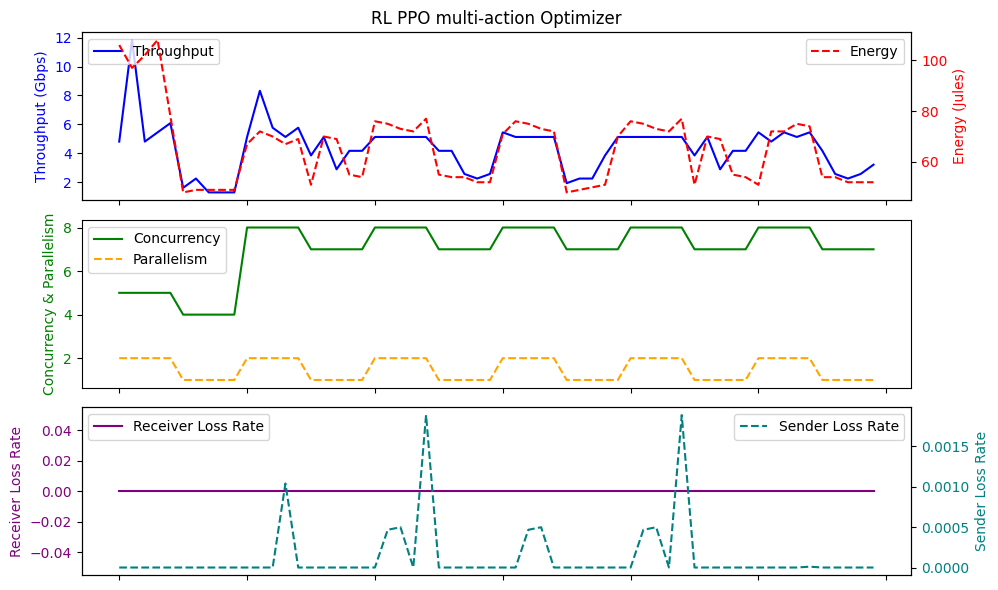

Average Throughput: 4.336
Avg Energy: 65.56666666666666
Total loss rate: 0.007708917943475167
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.169846       0.0   3.338462  32.927692  61.953846   0.000095
std      1.586916       0.0   1.064732   0.509138  11.031816   0.000346
min      1.920000       0.0   2.000000  32.500000  46.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  51.000000   0.000000
50%      4.480000       0.0   4.000000  32.700000  56.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  73.000000   0.000000
max      8.320000       0.0   6.000000  35.100000  77.000000   0.001884
Episode reward: 5.248
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1])],   13
rewards [3.711999999999999

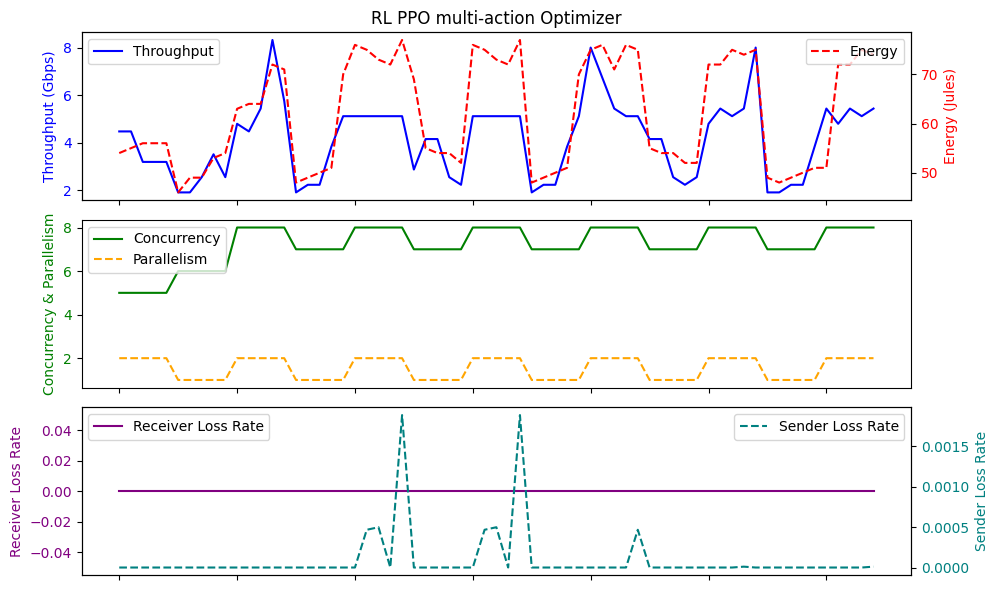

Average Throughput: 4.169846153846154
Avg Energy: 61.95384615384615
Total loss rate: 0.006183486255131004
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.248615       0.0   3.384615  32.927692  62.661538   0.000080
std      1.566150       0.0   1.085304   0.442474  11.679679   0.000306
min      0.960000       0.0   1.000000  32.500000  46.000000   0.000000
25%      2.880000       0.0   2.000000  32.600000  52.000000   0.000000
50%      4.480000       0.0   4.000000  32.700000  63.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  73.000000   0.000000
max      8.320000       0.0   6.000000  34.100000  91.000000   0.001884
Episode reward: 6.144
actions [array([0, 1]), array([4, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0])],   13
rewards [4.224

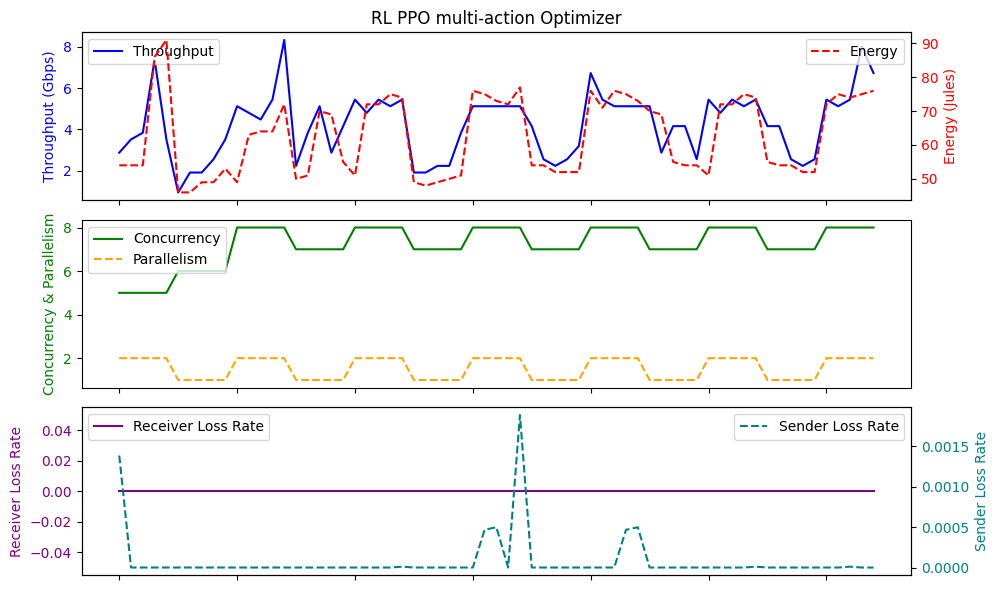

Average Throughput: 4.248615384615384
Avg Energy: 62.66153846153846
Total loss rate: 0.005227814976940756
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.105846       0.0   3.215385  32.881538  60.553846   0.000015
std      1.641043       0.0   1.082421   0.419409  10.627251   0.000112
min      1.920000       0.0   2.000000  32.500000  48.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  51.000000   0.000000
50%      4.160000       0.0   3.000000  32.700000  54.000000   0.000000
75%      5.440000       0.0   4.000000  33.100000  72.000000   0.000000
max      8.320000       0.0   6.000000  34.000000  76.000000   0.000902
Episode reward: 5.248
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0])],   13
rewards [2.944

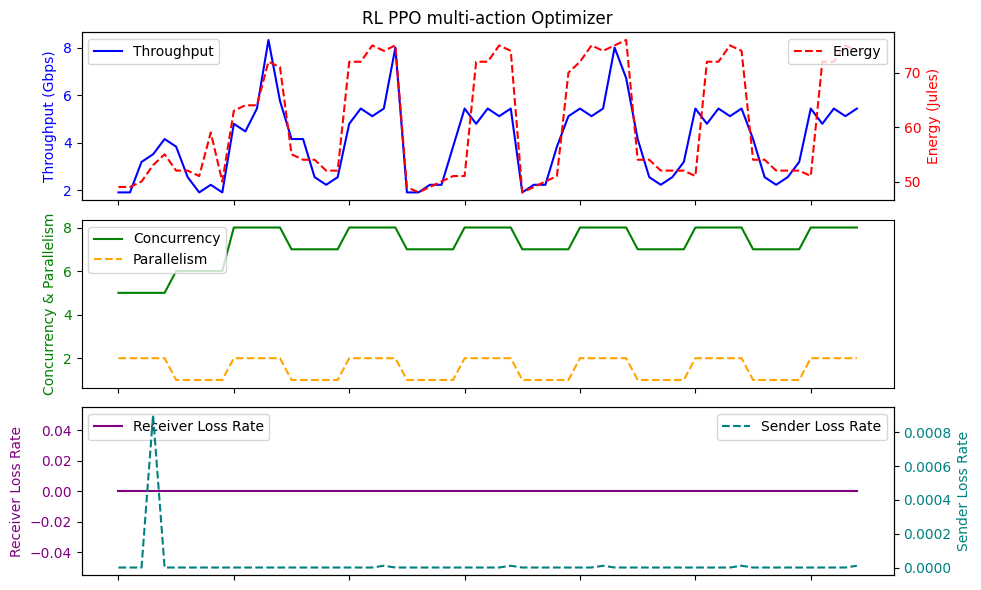

Average Throughput: 4.105846153846155
Avg Energy: 60.55384615384615
Total loss rate: 0.0009543613449826165
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   70.000000      70.0  70.000000  70.000000  70.000000  70.000000
mean     3.821714       0.0   3.071429  33.030000  60.057143   0.000095
std      1.516559       0.0   1.026058   1.495534  11.209320   0.000337
min      0.960000       0.0   1.000000  32.500000  46.000000   0.000000
25%      2.320000       0.0   2.000000  32.600000  51.000000   0.000000
50%      4.000000       0.0   3.000000  32.700000  54.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  72.000000   0.000000
max      8.320000       0.0   6.000000  44.900000  77.000000   0.001884
Episode reward: 3.072
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3])],   1

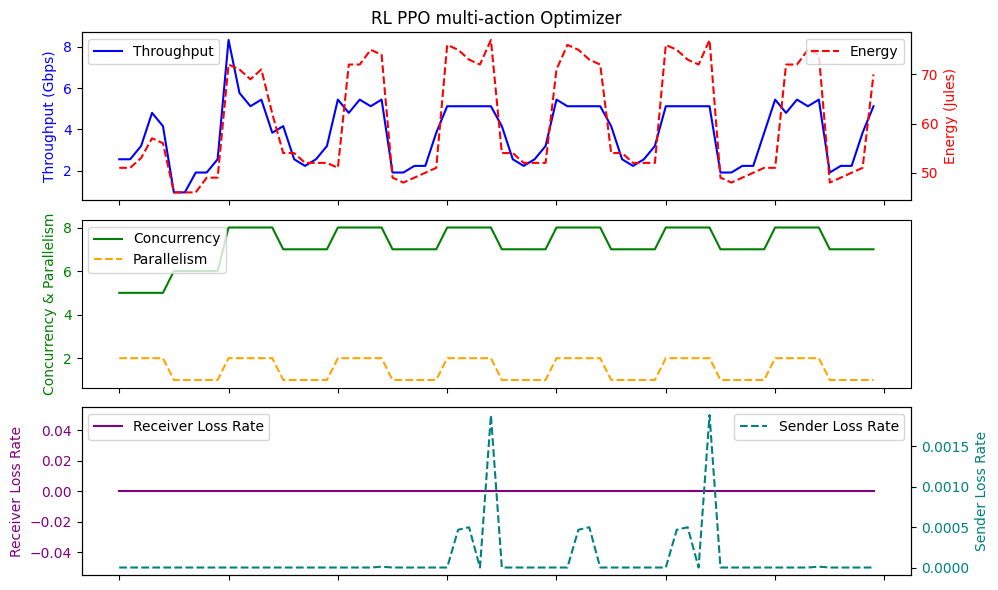

Average Throughput: 3.8217142857142856
Avg Energy: 60.05714285714286
Total loss rate: 0.006681310053953295
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.219077       0.0   3.400000  32.923077  63.000000   0.000074
std      1.515670       0.0   1.042833   0.446083  10.596285   0.000268
min      0.960000       0.0   1.000000  32.500000  46.000000   0.000000
25%      2.880000       0.0   3.000000  32.600000  52.000000   0.000000
50%      4.480000       0.0   4.000000  32.700000  66.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  72.000000   0.000000
max      8.320000       0.0   6.000000  34.100000  77.000000   0.001884
Episode reward: 5.184
actions [array([0, 1]), array([4, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1])],   13
rewards [3.64

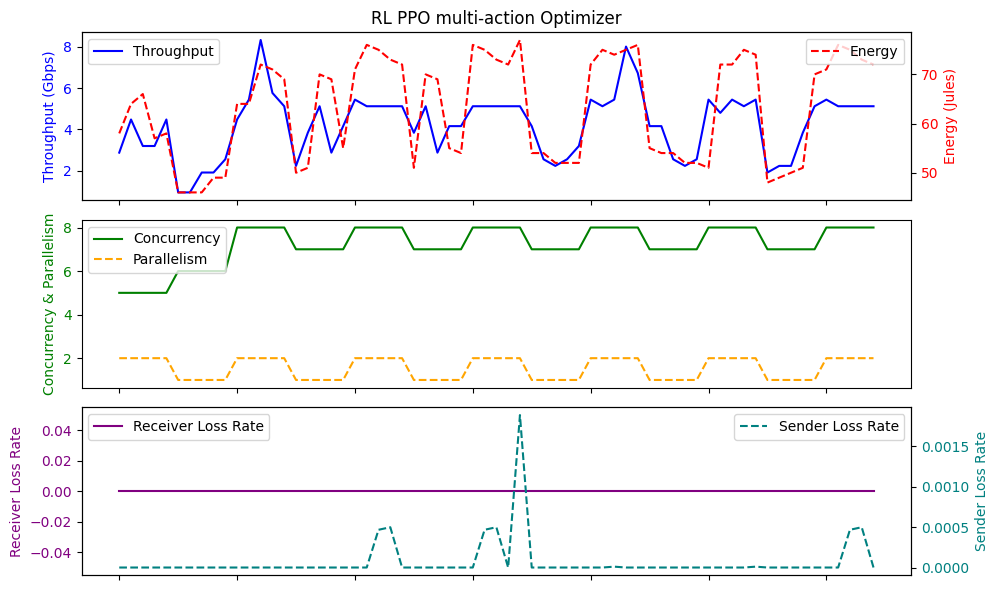

Average Throughput: 4.219076923076924
Avg Energy: 63.0
Total loss rate: 0.004797467769229373
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.125538       0.0   3.246154  32.878462  61.169231   0.000030
std      1.542075       0.0   1.046285   0.427746  10.474029   0.000117
min      1.920000       0.0   2.000000  32.500000  48.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  52.000000   0.000000
50%      4.160000       0.0   3.000000  32.700000  55.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  72.000000   0.000000
max      8.320000       0.0   6.000000  34.100000  76.000000   0.000498
Episode reward: 5.76
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0])],   13
rewards [3.84, -0.8319999999

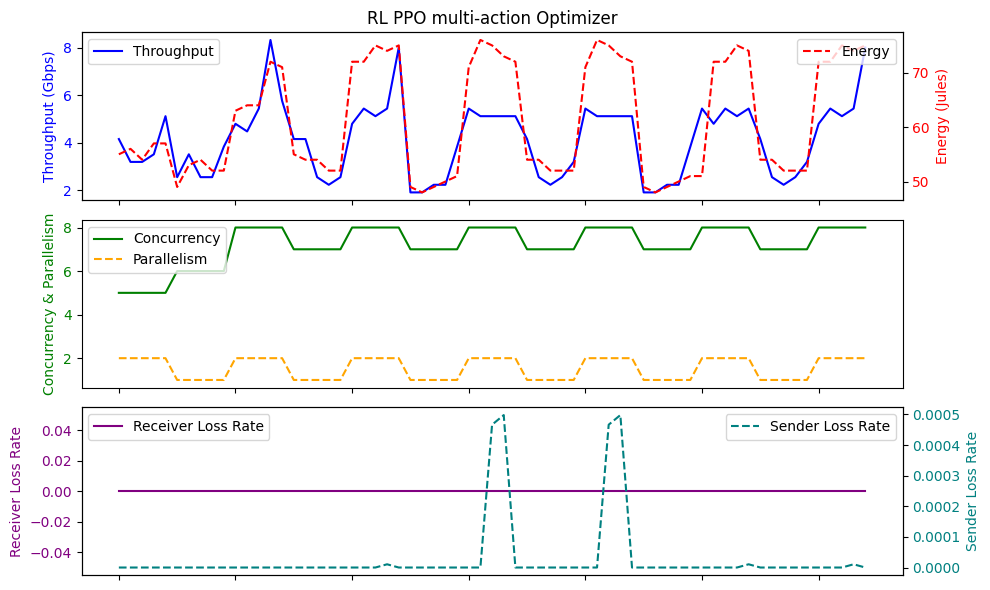

Average Throughput: 4.125538461538462
Avg Energy: 61.16923076923077
Total loss rate: 0.001960009367244944
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.150154       0.0   3.276923  32.889231  60.600000   0.000058
std      1.687573       0.0   1.125107   0.447955  11.184252   0.000257
min      1.920000       0.0   2.000000  32.500000  48.000000   0.000000
25%      2.240000       0.0   2.000000  32.600000  50.000000   0.000000
50%      4.480000       0.0   3.000000  32.700000  54.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  72.000000   0.000000
max      8.320000       0.0   6.000000  34.100000  77.000000   0.001884
Episode reward: 5.248
actions [array([0, 1]), array([4, 0]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1])],   13
rewards [4.864

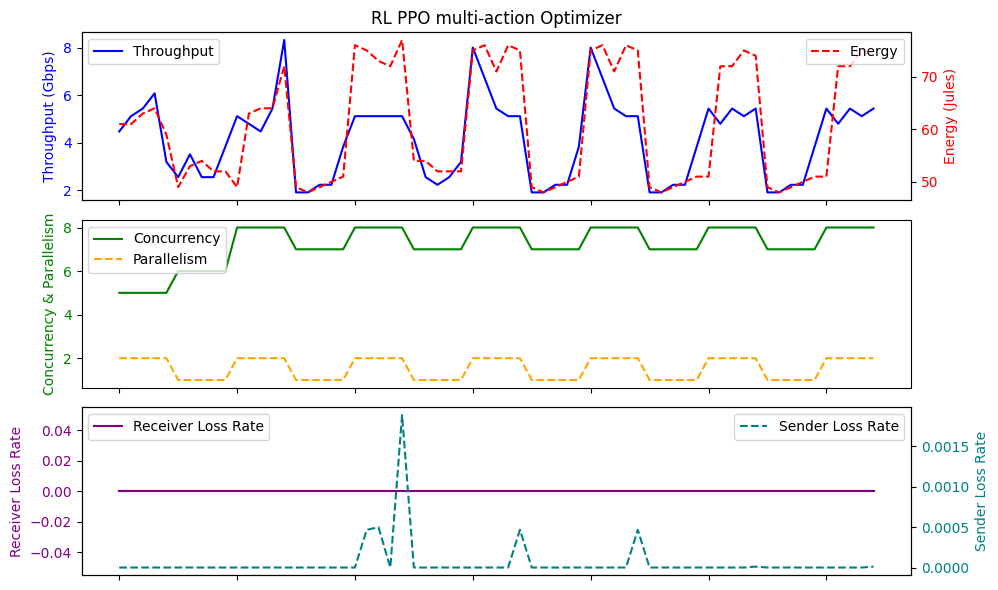

Average Throughput: 4.150153846153847
Avg Energy: 60.6
Total loss rate: 0.0038018201715847902
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.174769       0.0   3.338462  32.910769  62.153846   0.000074
std      1.591408       0.0   1.049954   0.477337  11.296060   0.000268
min      1.920000       0.0   2.000000  32.500000  46.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  51.000000   0.000000
50%      4.160000       0.0   4.000000  32.700000  64.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  73.000000   0.000000
max      8.320000       0.0   6.000000  34.100000  77.000000   0.001884
Episode reward: 5.248
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1])],   13
rewards [3.392000000000000

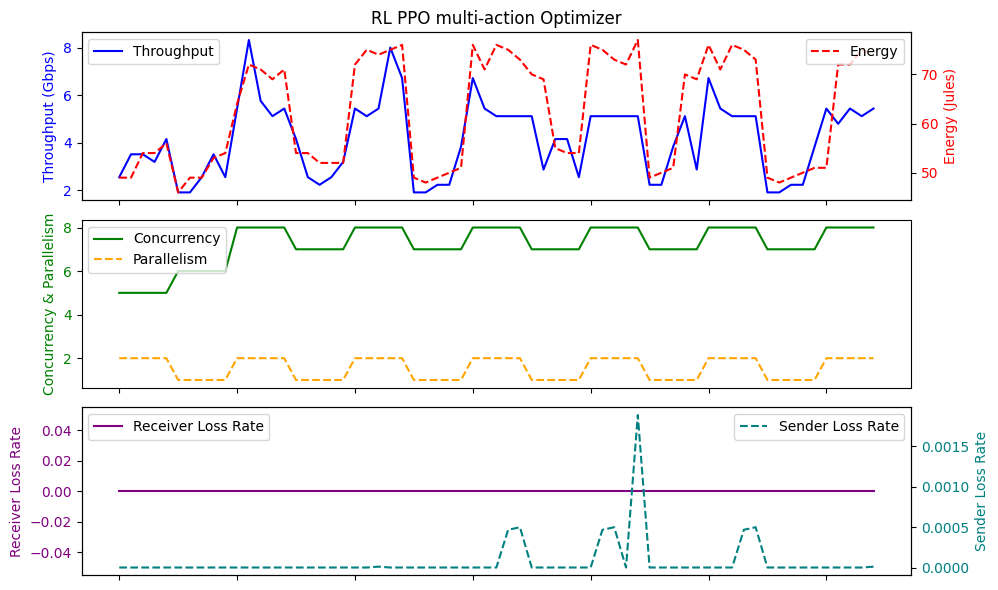

Average Throughput: 4.174769230769231
Avg Energy: 62.15384615384615
Total loss rate: 0.004797467769229373
       Throughput  LossRate      Score        RTT    Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.00000  65.000000
mean     4.110769       0.0   3.292308  32.966154  61.60000   0.000037
std      1.631913       0.0   1.100044   0.531001  10.99119   0.000129
min      1.920000       0.0   2.000000  32.500000  46.00000   0.000000
25%      2.560000       0.0   2.000000  32.600000  51.00000   0.000000
50%      4.160000       0.0   3.000000  32.700000  56.00000   0.000000
75%      5.120000       0.0   4.000000  33.100000  72.00000   0.000000
max      8.000000       0.0   6.000000  34.400000  76.00000   0.000498
Episode reward: 6.08
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1])],   13
rewards [3.5200000000000

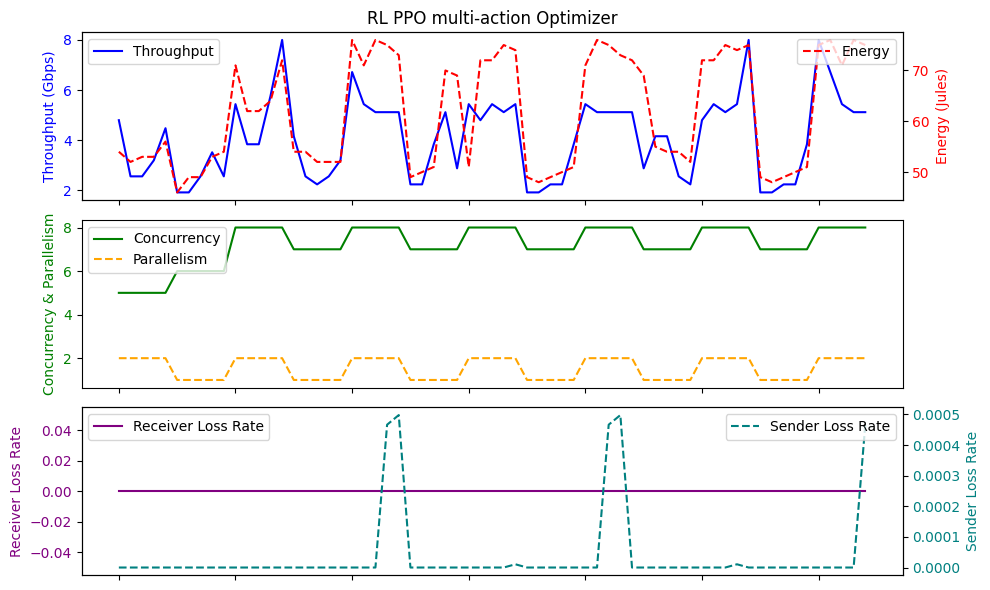

Average Throughput: 4.110769230769232
Avg Energy: 61.6
Total loss rate: 0.0024158016856831582
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.027077       0.0   3.246154  32.910769  61.800000   0.000095
std      1.594884       0.0   1.104406   0.463722  11.619219   0.000346
min      0.960000       0.0   1.000000  32.500000  46.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  51.000000   0.000000
50%      4.160000       0.0   4.000000  32.700000  56.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  73.000000   0.000000
max      8.000000       0.0   6.000000  34.100000  91.000000   0.001884
Episode reward: 5.248
actions [array([0, 1]), array([4, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1])],   13
rewards [3.776, -2.1119999

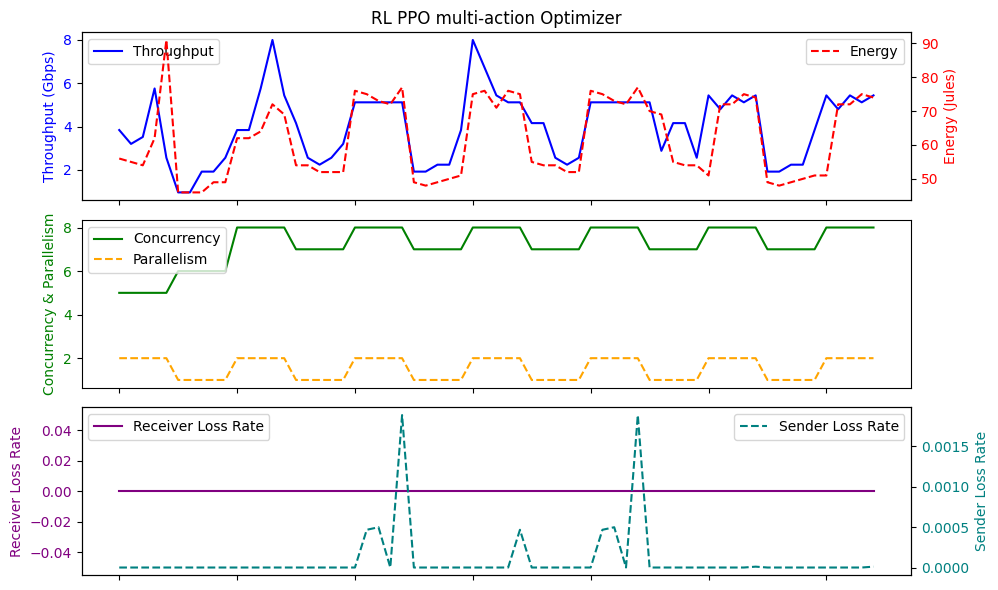

Average Throughput: 4.027076923076923
Avg Energy: 61.8
Total loss rate: 0.006183486255131004
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.209231       0.0   3.338462  32.933846  61.953846   0.000015
std      1.418992       0.0   0.956506   0.750474  10.442448   0.000084
min      1.920000       0.0   2.000000  32.500000  48.000000   0.000000
25%      2.880000       0.0   3.000000  32.600000  52.000000   0.000000
50%      4.160000       0.0   4.000000  32.600000  57.000000   0.000000
75%      5.440000       0.0   4.000000  33.100000  72.000000   0.000000
max      8.000000       0.0   6.000000  37.800000  76.000000   0.000498
Episode reward: 5.248
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0])],   13
rewards [3.84, -0.831999999

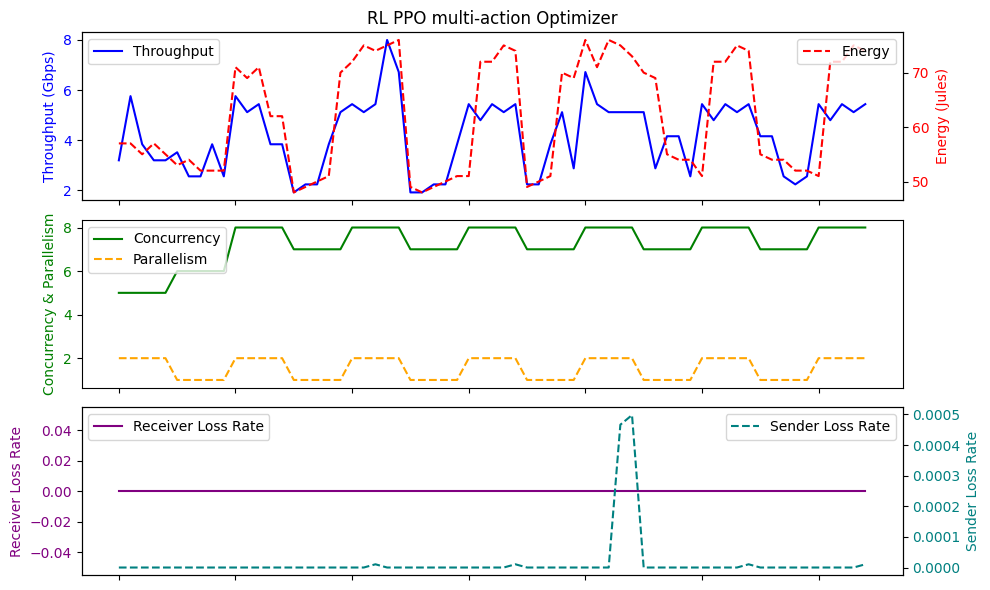

Average Throughput: 4.209230769230769
Avg Energy: 61.95384615384615
Total loss rate: 0.0010063932499844387
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000   65.000000  65.000000
mean     4.238769       0.0   3.353846  32.856923   62.815385   0.000015
std      1.832184       0.0   1.230228   0.436595   12.757219   0.000084
min      0.960000       0.0   1.000000  32.500000   46.000000   0.000000
25%      2.240000       0.0   2.000000  32.600000   50.000000   0.000000
50%      4.800000       0.0   3.000000  32.700000   69.000000   0.000000
75%      5.440000       0.0   4.000000  32.900000   74.000000   0.000000
max      8.000000       0.0   6.000000  34.100000  102.000000   0.000498
Episode reward: 5.76
actions [array([0, 1]), array([4, 0]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1])],   13
rewar

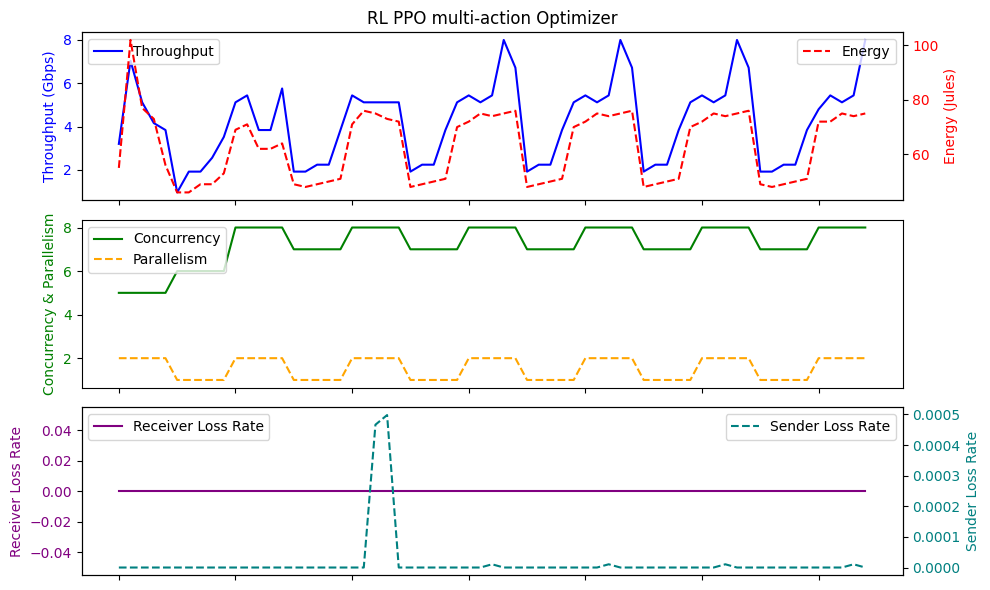

Average Throughput: 4.238769230769232
Avg Energy: 62.815384615384616
Total loss rate: 0.0010063932499844387
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.273231       0.0   3.430769  32.933846  63.000000   0.000103
std      1.652567       0.0   1.089283   0.464448  11.094762   0.000349
min      1.920000       0.0   2.000000  32.500000  48.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  51.000000   0.000000
50%      5.120000       0.0   4.000000  32.700000  69.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  74.000000   0.000000
max      8.320000       0.0   6.000000  34.100000  77.000000   0.001884
Episode reward: 5.12
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0])],   13
rewards [3.84

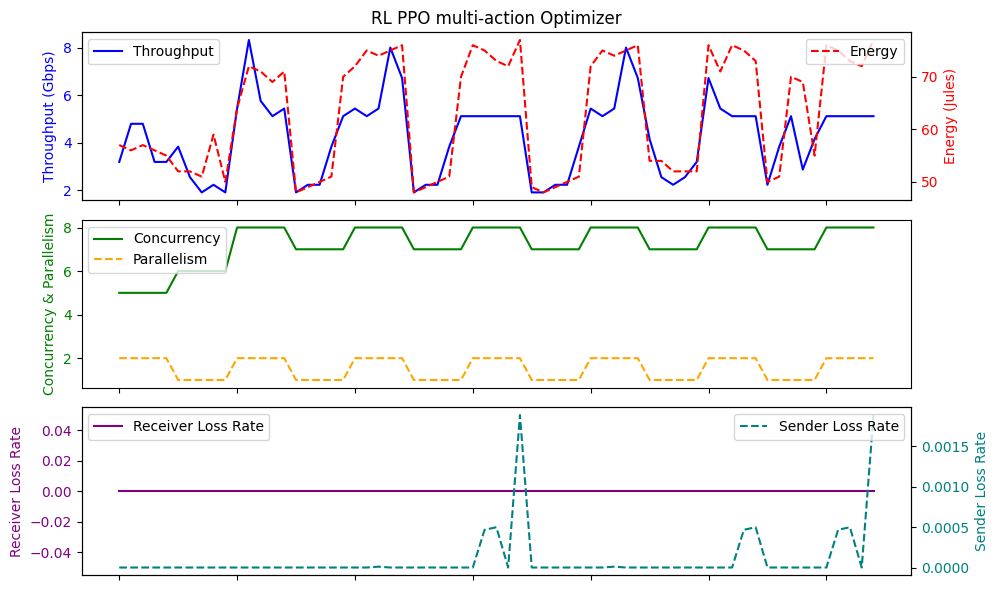

Average Throughput: 4.273230769230769
Avg Energy: 63.0
Total loss rate: 0.006681310053953296
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.258462       0.0   3.353846  32.867692  62.553846   0.000022
std      1.730593       0.0   1.164994   0.461691  11.679350   0.000101
min      1.920000       0.0   2.000000  32.500000  48.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  51.000000   0.000000
50%      4.160000       0.0   3.000000  32.600000  62.000000   0.000000
75%      5.440000       0.0   4.000000  33.100000  74.000000   0.000000
max      8.320000       0.0   6.000000  34.100000  91.000000   0.000498
Episode reward: 5.76
actions [array([0, 1]), array([4, 0]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1])],   13
rewards [3.776, -0.767999999

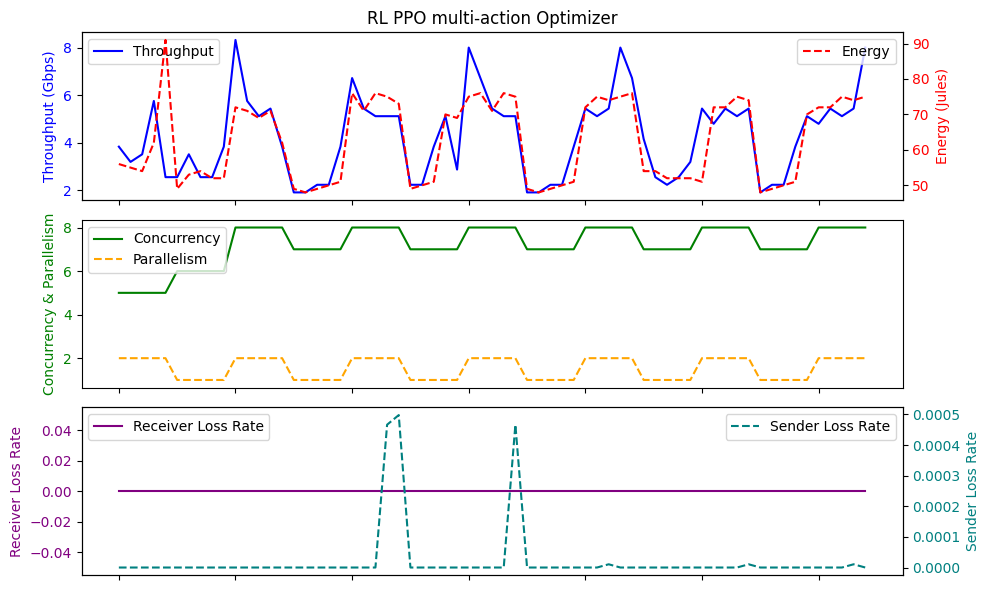

Average Throughput: 4.258461538461538
Avg Energy: 62.55384615384615
Total loss rate: 0.0014621855684226529
       Throughput  LossRate      Score        RTT     Energy      SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  6.500000e+01
mean     4.174769       0.0   3.276923  32.867692  62.046154  8.119559e-07
std      1.790134       0.0   1.205556   0.439854  11.317065  2.834587e-06
min      1.600000       0.0   1.000000  32.500000  48.000000  0.000000e+00
25%      2.560000       0.0   2.000000  32.600000  51.000000  0.000000e+00
50%      3.840000       0.0   3.000000  32.600000  62.000000  0.000000e+00
75%      5.440000       0.0   4.000000  33.100000  74.000000  0.000000e+00
max      8.000000       0.0   6.000000  34.100000  82.000000  1.055543e-05
Episode reward: 6.144
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([

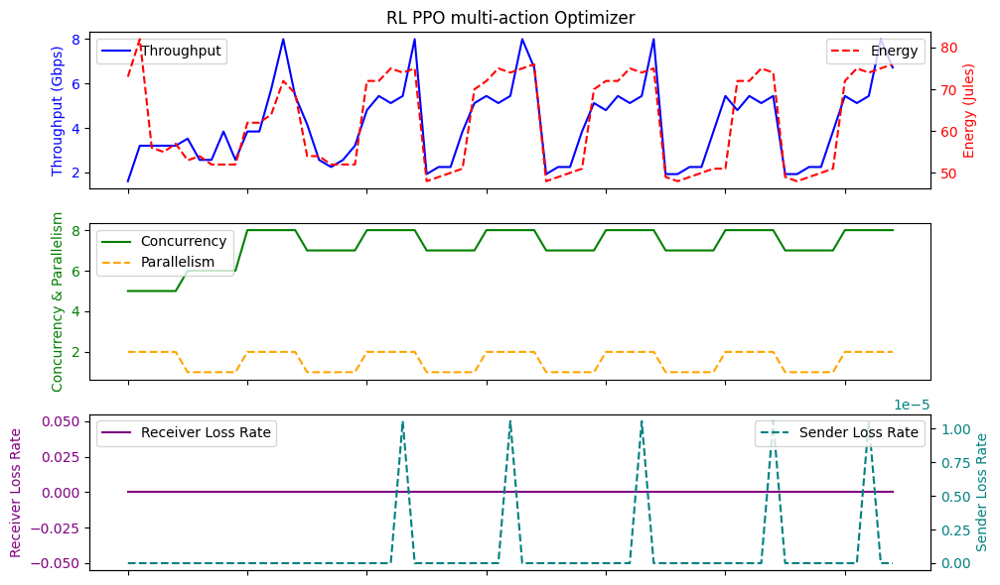

Average Throughput: 4.174769230769231
Avg Energy: 62.04615384615385
Total loss rate: 5.277713272393338e-05
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.160000       0.0   3.307692  32.915385  62.415385   0.000074
std      1.629724       0.0   1.088621   0.453194  11.159206   0.000268
min      1.920000       0.0   2.000000  32.500000  48.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  52.000000   0.000000
50%      4.160000       0.0   3.000000  32.700000  64.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  73.000000   0.000000
max      8.320000       0.0   6.000000  34.100000  77.000000   0.001884
Episode reward: 5.76
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0])],   13
rewards [3.648

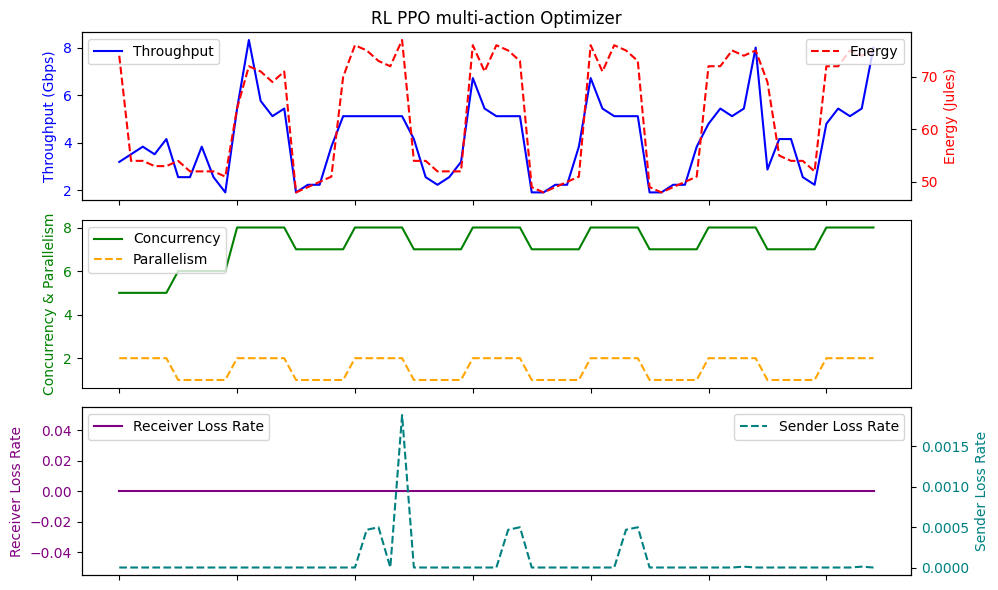

Average Throughput: 4.16
Avg Energy: 62.41538461538462
Total loss rate: 0.004797467769229373
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000   65.000000  65.000000
mean     4.283077       0.0   3.415385  32.944615   62.523077   0.000015
std      1.591671       0.0   1.102445   0.452435   12.045626   0.000084
min      0.960000       0.0   1.000000  32.500000   46.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000   52.000000   0.000000
50%      4.480000       0.0   4.000000  32.700000   57.000000   0.000000
75%      5.440000       0.0   4.000000  33.100000   72.000000   0.000000
max      8.320000       0.0   6.000000  34.100000  109.000000   0.000498
Episode reward: 5.5040000000000004
actions [array([0, 1]), array([4, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1])],   13
rewar

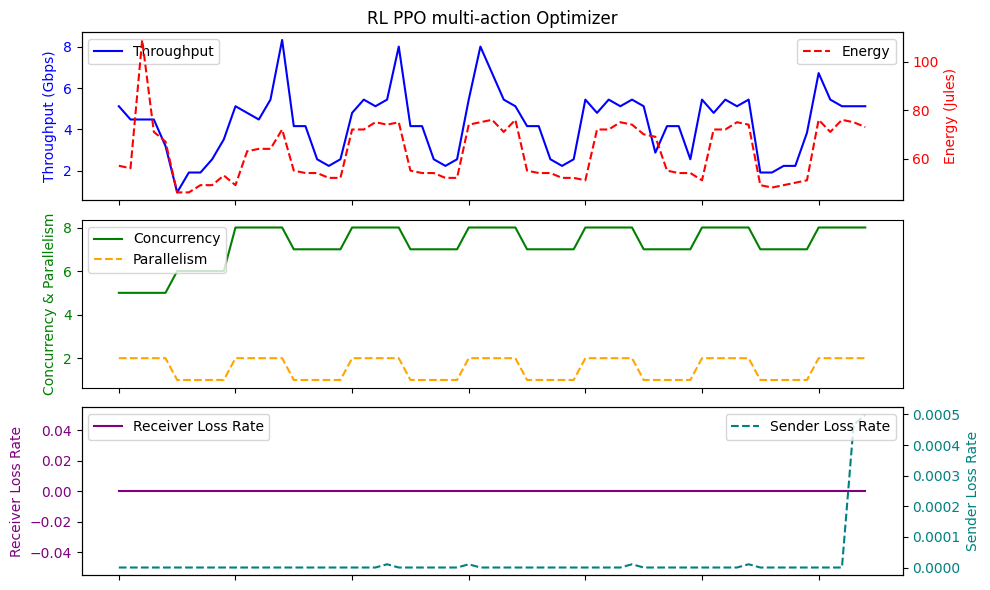

Average Throughput: 4.283076923076923
Avg Energy: 62.52307692307692
Total loss rate: 0.0010063932499844387
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.302769       0.0   3.446154  33.120000  63.046154   0.000021
std      1.572800       0.0   1.075738   1.650587  10.151094   0.000095
min      1.920000       0.0   2.000000  32.500000  48.000000   0.000000
25%      2.880000       0.0   3.000000  32.600000  52.000000   0.000000
50%      4.160000       0.0   4.000000  32.700000  62.000000   0.000000
75%      5.440000       0.0   4.000000  33.100000  73.000000   0.000000
max      8.000000       0.0   6.000000  45.600000  76.000000   0.000498
Episode reward: 6.144
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0])],   13
rewards [3.84

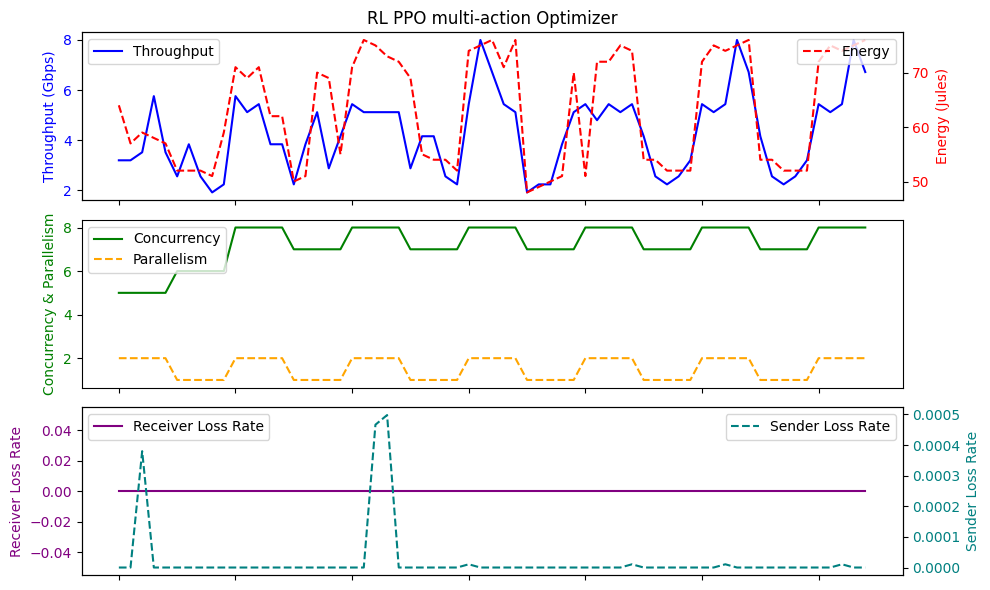

Average Throughput: 4.302769230769232
Avg Energy: 63.04615384615385
Total loss rate: 0.001386293094570866
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.086154       0.0   3.246154  32.893846  61.369231   0.000103
std      1.527109       0.0   1.031243   0.430435  11.058890   0.000349
min      1.920000       0.0   2.000000  32.500000  46.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  52.000000   0.000000
50%      4.160000       0.0   3.000000  32.700000  56.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  73.000000   0.000000
max      8.320000       0.0   6.000000  34.100000  77.000000   0.001884
Episode reward: 5.248
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1])],   13
rewards [3.776

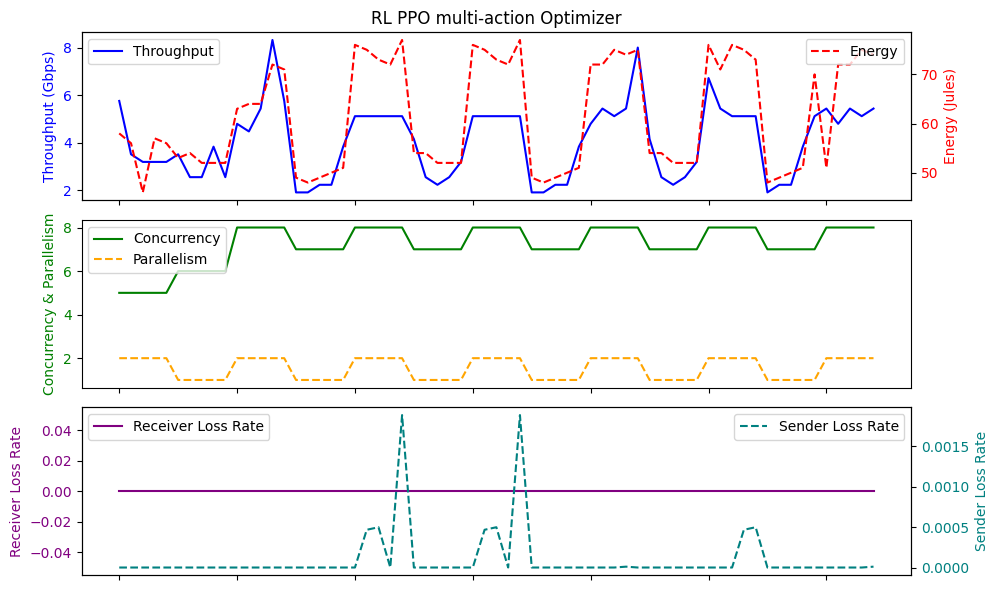

Average Throughput: 4.086153846153847
Avg Energy: 61.36923076923077
Total loss rate: 0.006681310053953296
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     3.953231       0.0   3.153846  32.889231  60.030769   0.000095
std      1.596427       0.0   1.049267   0.421353  11.348140   0.000346
min      1.920000       0.0   2.000000  32.500000  47.000000   0.000000
25%      2.240000       0.0   2.000000  32.600000  50.000000   0.000000
50%      4.160000       0.0   3.000000  32.700000  54.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  72.000000   0.000000
max      8.320000       0.0   6.000000  34.100000  77.000000   0.001884
Episode reward: 6.08
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1])],   13
rewards [3.5839

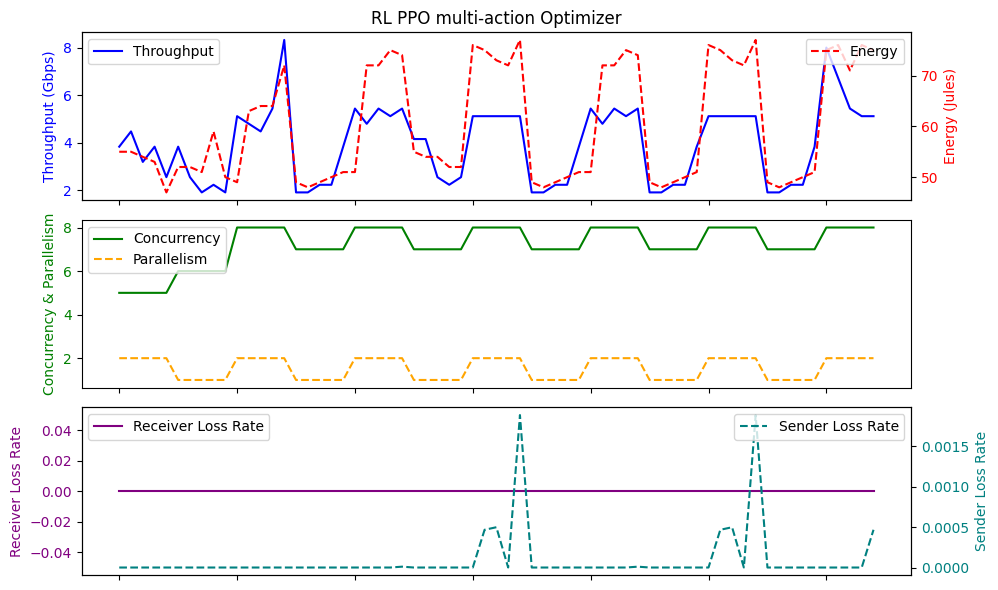

Average Throughput: 3.9532307692307698
Avg Energy: 60.03076923076923
Total loss rate: 0.006183486255131004
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000   65.000000  65.000000
mean     3.963077       0.0   3.169231  32.913846   62.753846   0.000212
std      1.816099       0.0   1.364382   0.450998   13.917200   0.000931
min      0.960000       0.0   1.000000  32.500000   47.000000   0.000000
25%      2.240000       0.0   2.000000  32.600000   50.000000   0.000000
50%      4.800000       0.0   3.000000  32.700000   56.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000   74.000000   0.000000
max     11.840000       0.0  10.000000  34.100000  106.000000   0.007067
Episode reward: 5.12
actions [array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0])],   13
rewar

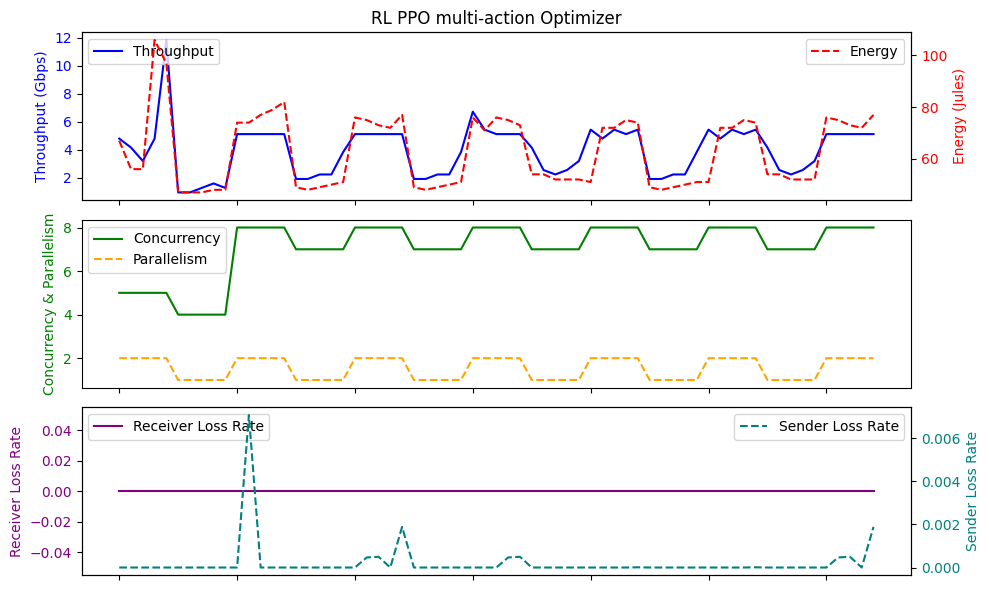

Average Throughput: 3.9630769230769234
Avg Energy: 62.753846153846155
Total loss rate: 0.013748211838713368
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.179692       0.0   3.338462  32.896923  62.230769   0.000088
std      1.303383       0.0   0.871007   0.419438  10.381428   0.000343
min      1.920000       0.0   2.000000  32.500000  48.000000   0.000000
25%      2.880000       0.0   3.000000  32.600000  52.000000   0.000000
50%      4.480000       0.0   4.000000  32.700000  62.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  72.000000   0.000000
max      8.000000       0.0   6.000000  34.100000  77.000000   0.001884
Episode reward: 5.12
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1])],   13
rewards [4.03

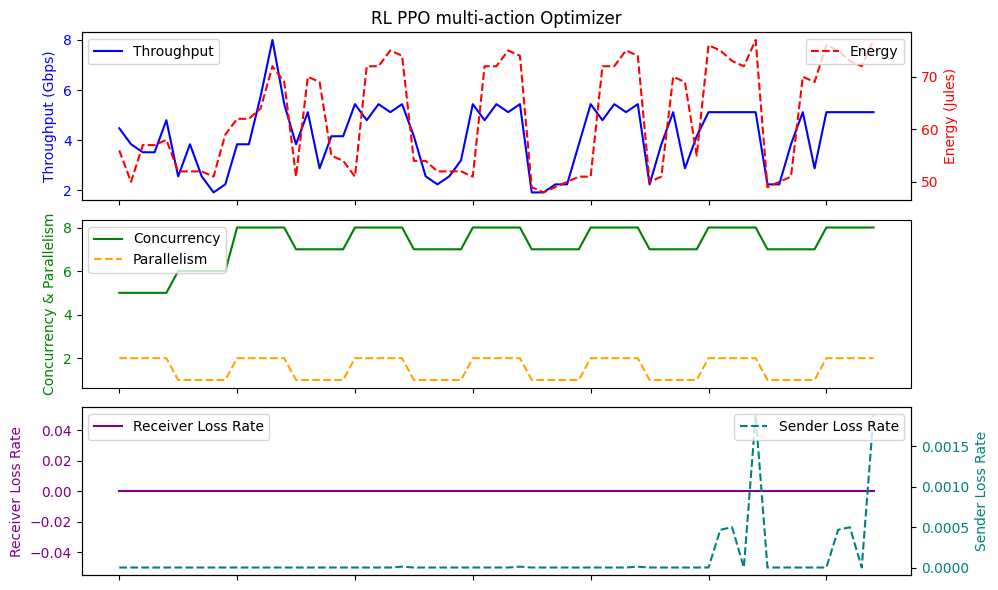

Average Throughput: 4.179692307692307
Avg Energy: 62.23076923076923
Total loss rate: 0.00572769393669279
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.243692       0.0   3.400000  32.876923  62.430769   0.000051
std      1.714201       0.0   1.156503   0.441860  11.033995   0.000252
min      0.960000       0.0   1.000000  32.500000  46.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  52.000000   0.000000
50%      4.480000       0.0   4.000000  32.700000  62.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  73.000000   0.000000
max      8.320000       0.0   6.000000  34.100000  77.000000   0.001884
Episode reward: 6.08
actions [array([0, 1]), array([4, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0])],   13
rewards [3.84, -

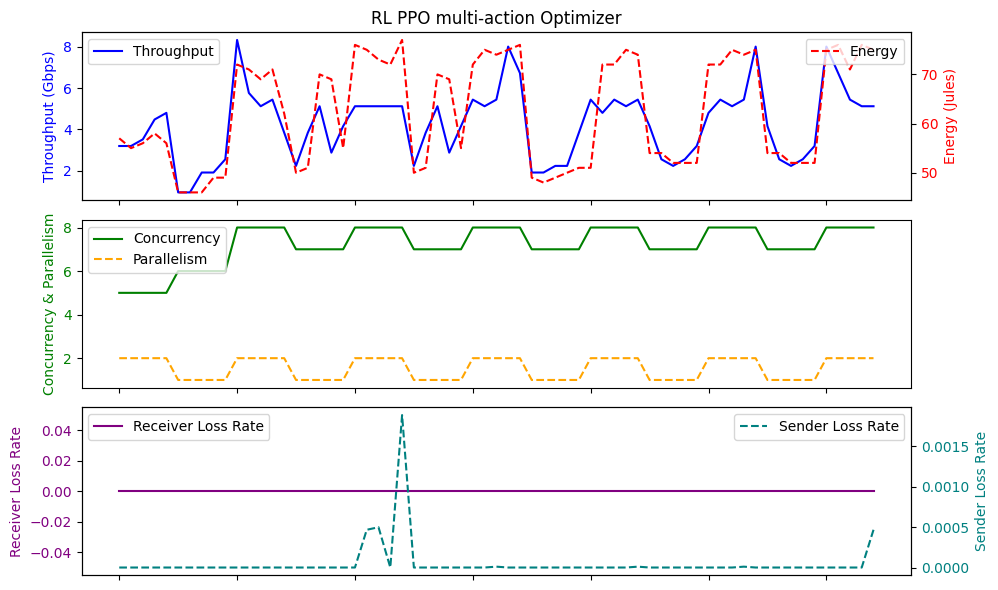

Average Throughput: 4.243692307692308
Avg Energy: 62.43076923076923
Total loss rate: 0.003346027853146576
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.174769       0.0   3.323077  33.056923  61.784615   0.000074
std      1.313841       0.0   0.885785   1.412331  10.539349   0.000268
min      1.920000       0.0   2.000000  32.500000  48.000000   0.000000
25%      2.880000       0.0   3.000000  32.600000  52.000000   0.000000
50%      4.480000       0.0   4.000000  32.700000  57.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  72.000000   0.000000
max      8.320000       0.0   6.000000  43.800000  77.000000   0.001884
Episode reward: 5.184
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1])],   13
rewards [3.520

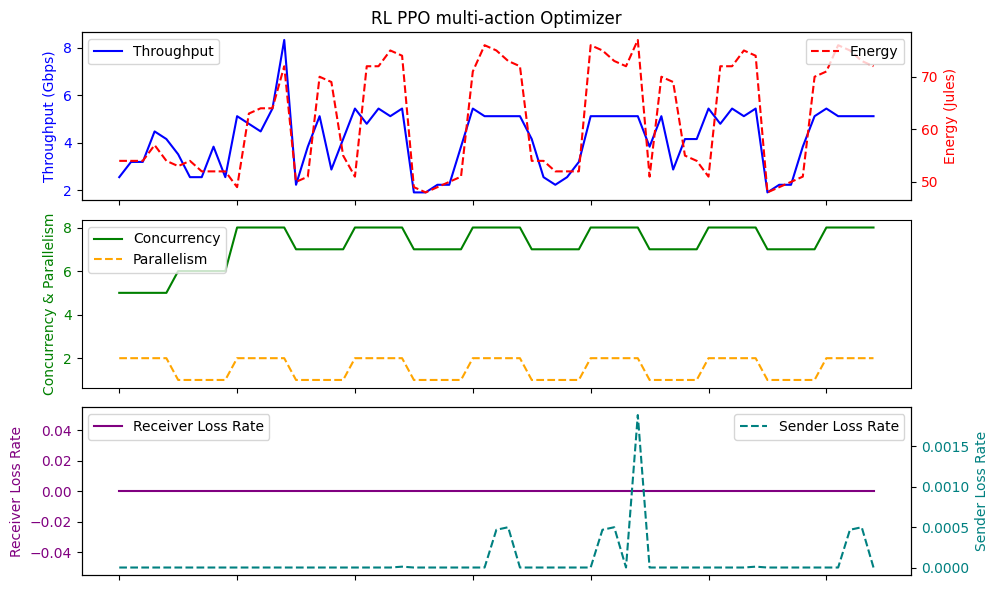

Average Throughput: 4.174769230769231
Avg Energy: 61.784615384615385
Total loss rate: 0.004797467769229373
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.150154       0.0   3.353846  32.900000  64.292308   0.000103
std      1.513639       0.0   1.052241   0.459619  10.689836   0.000349
min      1.600000       0.0   1.000000  32.500000  48.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  52.000000   0.000000
50%      4.160000       0.0   4.000000  32.700000  69.000000   0.000000
75%      5.120000       0.0   4.000000  33.000000  74.000000   0.000000
max      8.000000       0.0   6.000000  34.100000  84.000000   0.001884
Episode reward: 6.144
actions [array([0, 1]), array([4, 0]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0])],   13
rewards [3.26

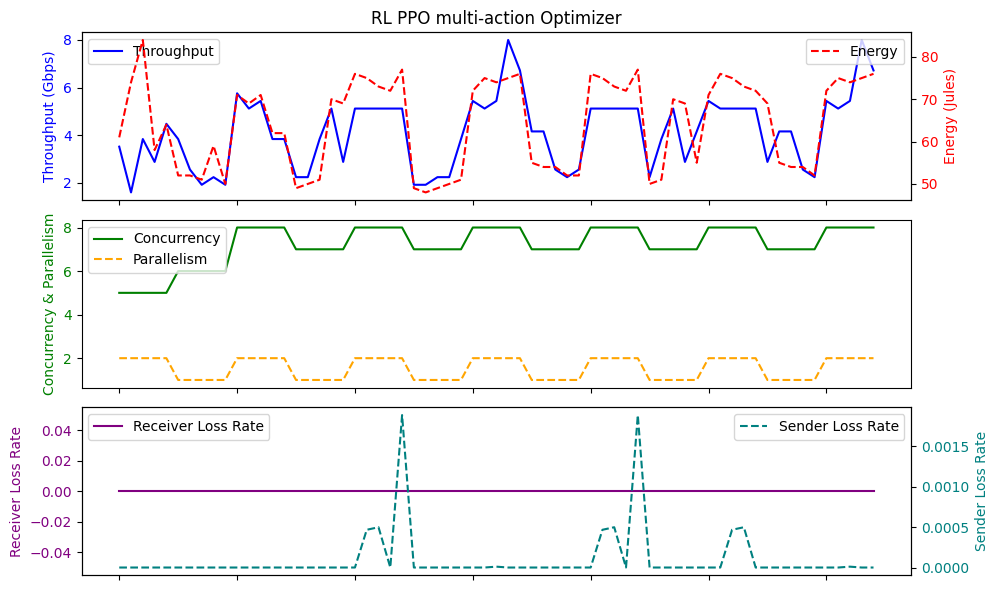

Average Throughput: 4.150153846153847
Avg Energy: 64.29230769230769
Total loss rate: 0.006681310053953295
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.041846       0.0   3.246154  32.872308  61.553846   0.000103
std      1.539422       0.0   1.046285   0.436072  11.032666   0.000349
min      1.920000       0.0   2.000000  32.500000  48.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  52.000000   0.000000
50%      4.160000       0.0   3.000000  32.700000  56.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  73.000000   0.000000
max      8.000000       0.0   6.000000  34.100000  77.000000   0.001884
Episode reward: 5.12
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0])],   13
rewards [3.7760

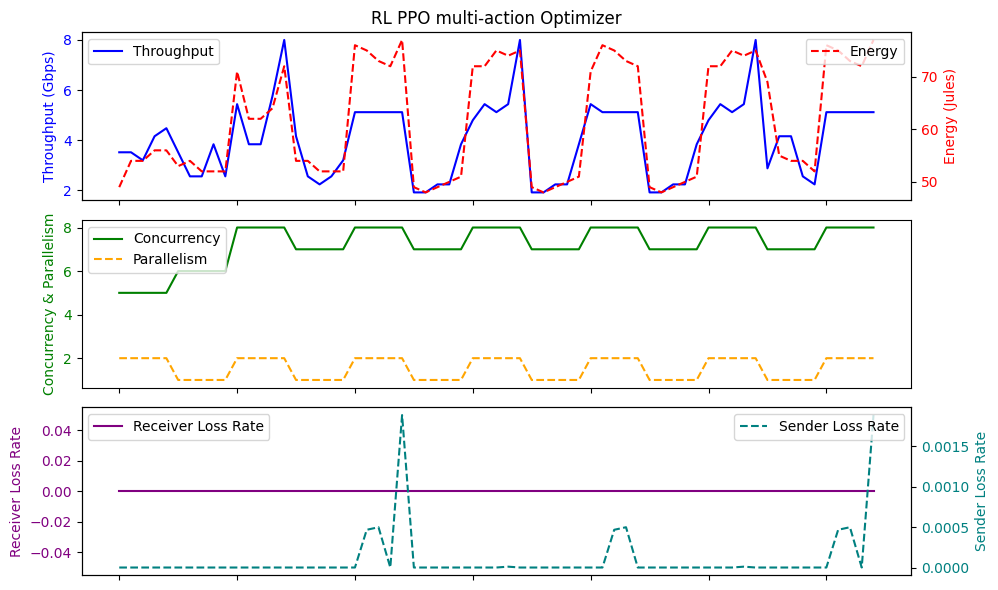

Average Throughput: 4.041846153846154
Avg Energy: 61.55384615384615
Total loss rate: 0.006681310053953296
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.130462       0.0   3.307692  32.906154  63.184615   0.000074
std      1.589690       0.0   1.116958   0.448914  11.499854   0.000268
min      0.960000       0.0   1.000000  32.500000  46.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  52.000000   0.000000
50%      4.160000       0.0   4.000000  32.700000  64.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  73.000000   0.000000
max      8.320000       0.0   6.000000  34.100000  91.000000   0.001884
Episode reward: 5.12
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0])],   13
rewards [3.7760

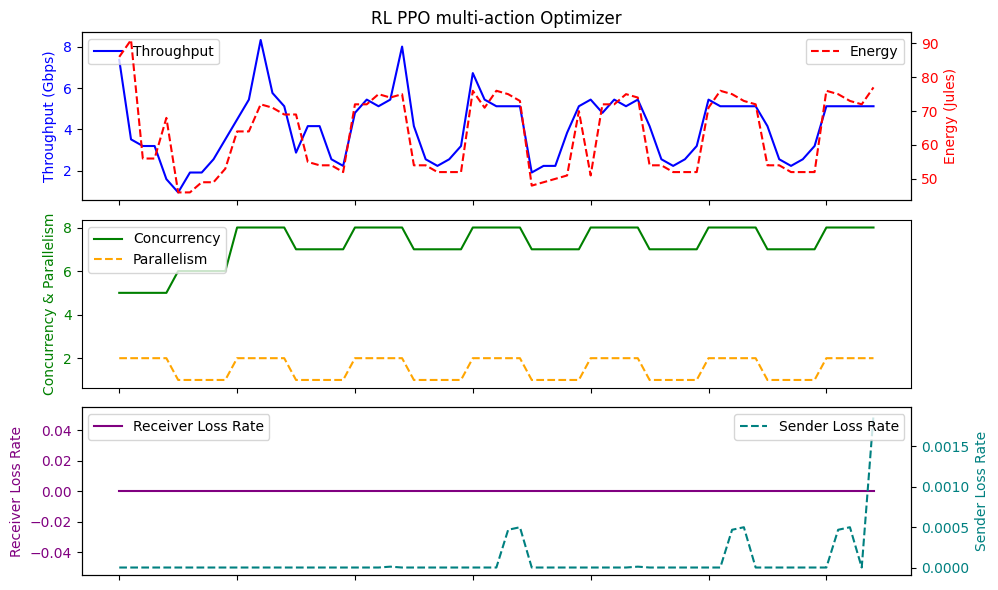

Average Throughput: 4.130461538461539
Avg Energy: 63.184615384615384
Total loss rate: 0.004797467769229373
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000   65.000000  65.000000
mean     4.278154       0.0   3.446154  32.910769   65.138462   0.000095
std      1.457196       0.0   1.015978   0.440569   11.276187   0.000346
min      1.920000       0.0   2.000000  32.500000   50.000000   0.000000
25%      2.880000       0.0   3.000000  32.600000   54.000000   0.000000
50%      4.160000       0.0   4.000000  32.700000   69.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000   74.000000   0.000000
max      8.000000       0.0   6.000000  34.100000  107.000000   0.001884
Episode reward: 5.76
actions [array([0, 1]), array([4, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0])],   13
rewar

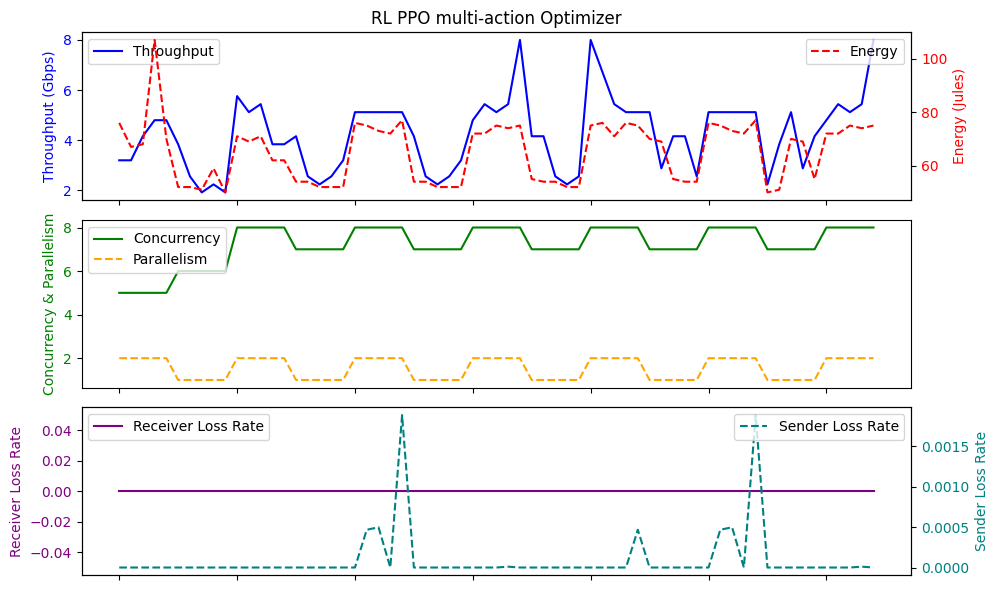

Average Throughput: 4.278153846153847
Avg Energy: 65.13846153846154
Total loss rate: 0.006183486255131003
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.214154       0.0   3.353846  32.915385  62.076923   0.000044
std      1.808928       0.0   1.217461   0.457995  11.038721   0.000246
min      1.920000       0.0   2.000000  32.500000  48.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  52.000000   0.000000
50%      4.160000       0.0   3.000000  32.700000  58.000000   0.000000
75%      5.440000       0.0   4.000000  33.100000  74.000000   0.000000
max      8.320000       0.0   6.000000  34.100000  77.000000   0.001884
Episode reward: 5.12
actions [array([0, 1]), array([4, 0]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1])],   13
rewards [3.6480

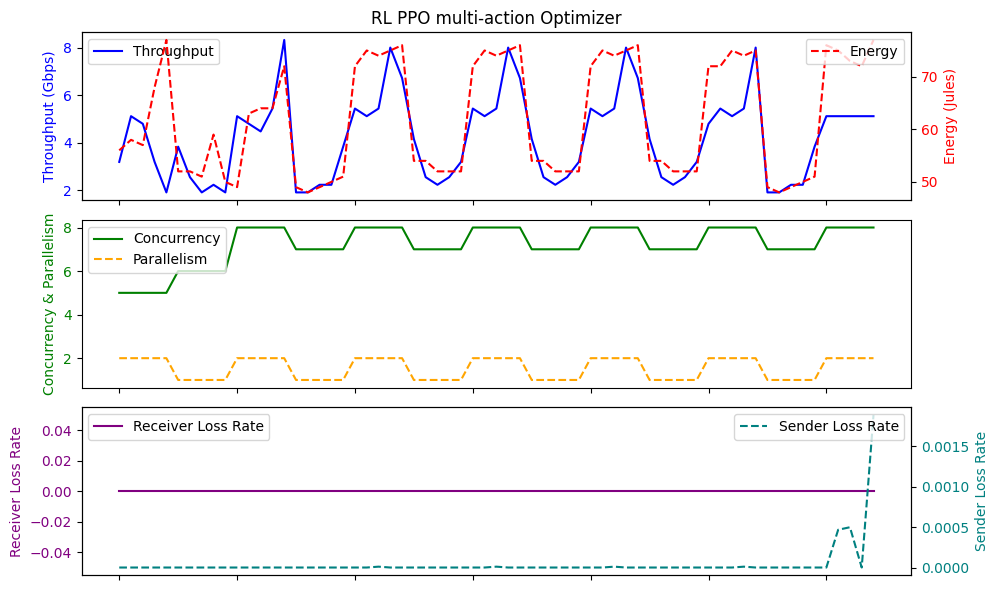

Average Throughput: 4.214153846153846
Avg Energy: 62.07692307692308
Total loss rate: 0.0028902355347083615
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   70.000000      70.0  70.000000  70.000000  70.000000  70.000000
mean     3.762286       0.0   3.057143  32.918571  60.828571   0.000140
std      1.546165       0.0   1.061660   0.434155  11.614548   0.000403
min      0.960000       0.0   1.000000  32.500000  46.000000   0.000000
25%      2.240000       0.0   2.000000  32.600000  50.250000   0.000000
50%      4.000000       0.0   3.000000  32.700000  54.500000   0.000000
75%      5.120000       0.0   4.000000  33.100000  73.000000   0.000000
max      8.320000       0.0   6.000000  34.100000  79.000000   0.001884
Episode reward: 2.432
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3])],   1

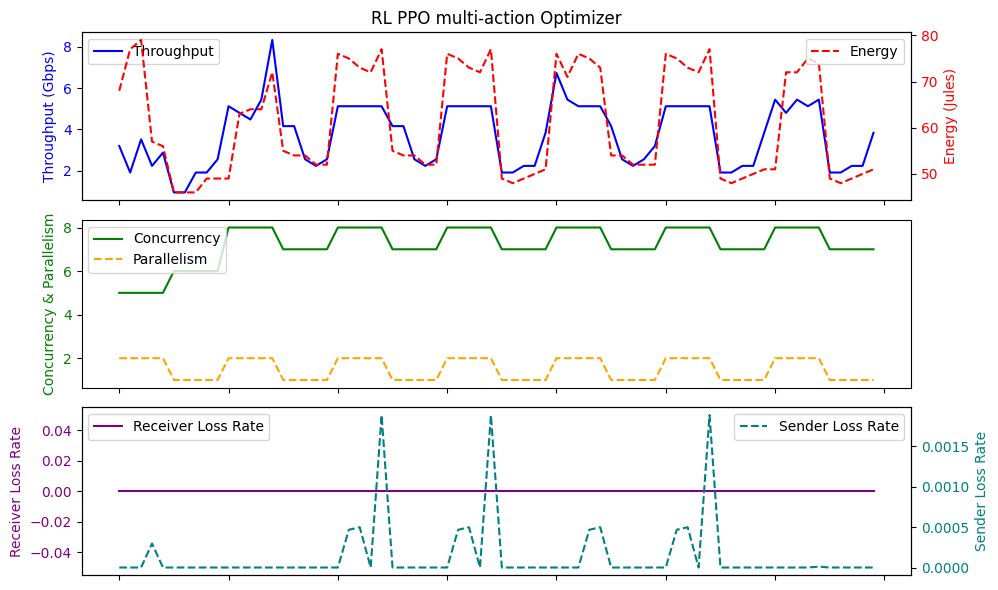

Average Throughput: 3.7622857142857136
Avg Energy: 60.82857142857143
Total loss rate: 0.009815493354865803
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.046769       0.0   3.215385  32.893846  62.369231   0.000102
std      1.609403       0.0   1.082421   0.452382  11.464032   0.000349
min      1.280000       0.0   1.000000  32.500000  48.000000   0.000000
25%      2.240000       0.0   2.000000  32.600000  51.000000   0.000000
50%      4.160000       0.0   3.000000  32.700000  62.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  74.000000   0.000000
max      8.000000       0.0   6.000000  34.100000  79.000000   0.001884
Episode reward: 6.08
actions [array([0, 1]), array([4, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1])],   13
rewards [3.072

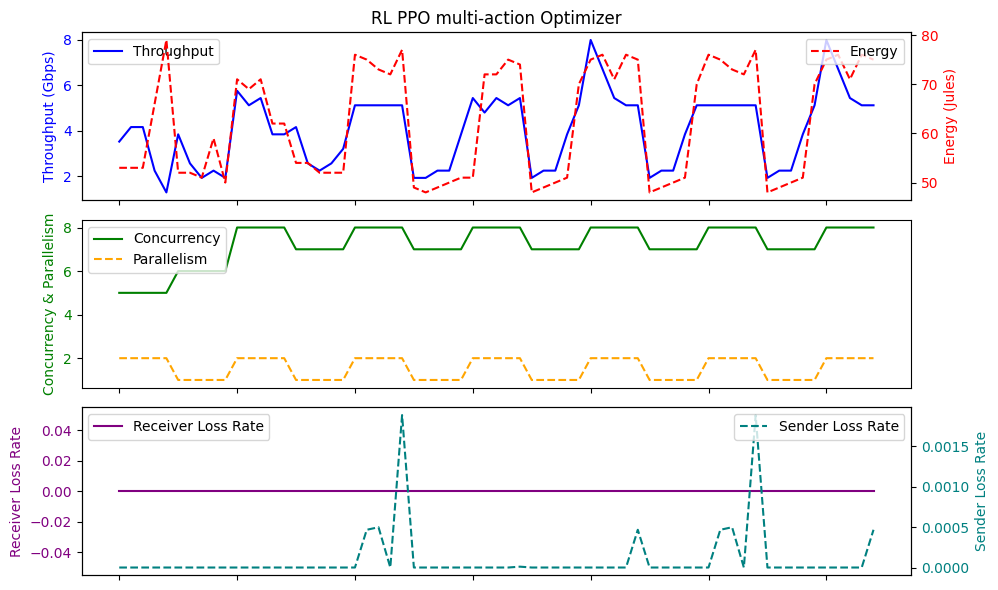

Average Throughput: 4.046769230769231
Avg Energy: 62.36923076923077
Total loss rate: 0.006639278573569218
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.096000       0.0   3.323077  32.952308  62.569231   0.000153
std      1.474259       0.0   1.032408   0.466740  10.502930   0.000418
min      1.920000       0.0   2.000000  32.500000  48.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  52.000000   0.000000
50%      4.160000       0.0   4.000000  32.700000  59.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  73.000000   0.000000
max      8.320000       0.0   6.000000  34.100000  77.000000   0.001884
Episode reward: 5.12
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1])],   13
rewards [3.7760

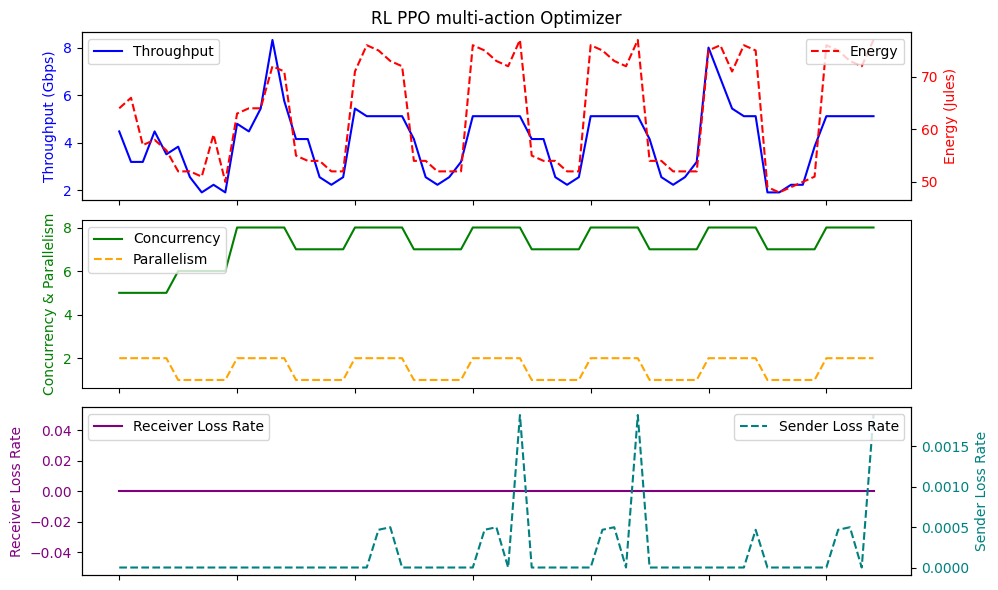

Average Throughput: 4.096
Avg Energy: 62.56923076923077
Total loss rate: 0.009974560774375937
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.051692       0.0   3.246154  32.910769  61.523077   0.000088
std      1.574067       0.0   1.015978   0.438792  11.159508   0.000343
min      1.920000       0.0   2.000000  32.500000  48.000000   0.000000
25%      2.240000       0.0   2.000000  32.600000  50.000000   0.000000
50%      4.160000       0.0   3.000000  32.700000  59.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  72.000000   0.000000
max      8.000000       0.0   6.000000  34.100000  77.000000   0.001884
Episode reward: 5.12
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1])],   13
rewards [3.3280000000000003

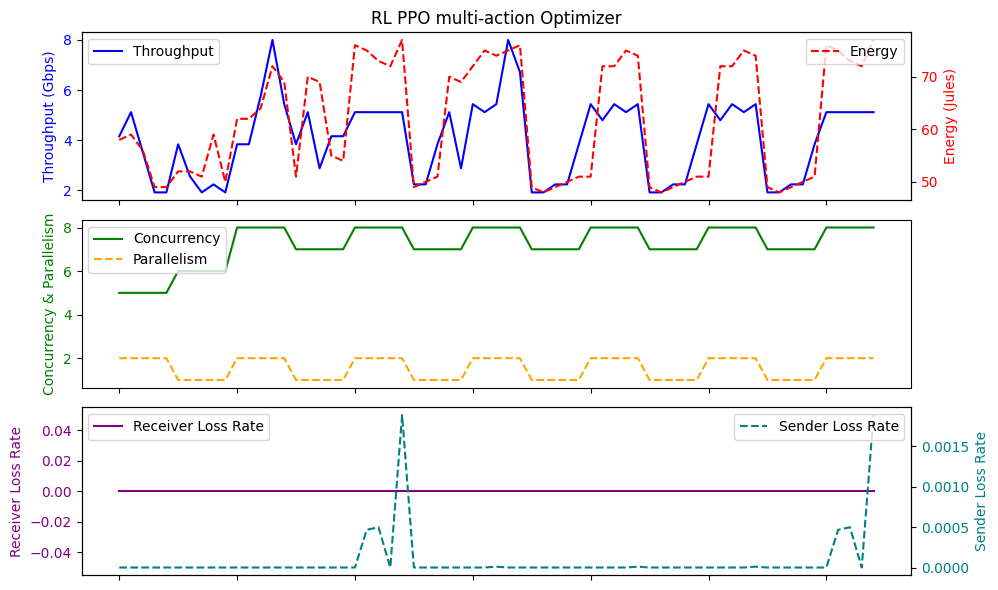

Average Throughput: 4.051692307692308
Avg Energy: 61.52307692307692
Total loss rate: 0.00572769393669279
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.115692       0.0   3.307692  32.956923  61.830769   0.000086
std      1.609847       0.0   1.088621   0.538508  10.600073   0.000283
min      1.920000       0.0   2.000000  32.500000  48.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  52.000000   0.000000
50%      4.160000       0.0   3.000000  32.700000  58.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  73.000000   0.000000
max      8.320000       0.0   6.000000  35.500000  77.000000   0.001884
Episode reward: 5.184
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1])],   13
rewards [3.904,

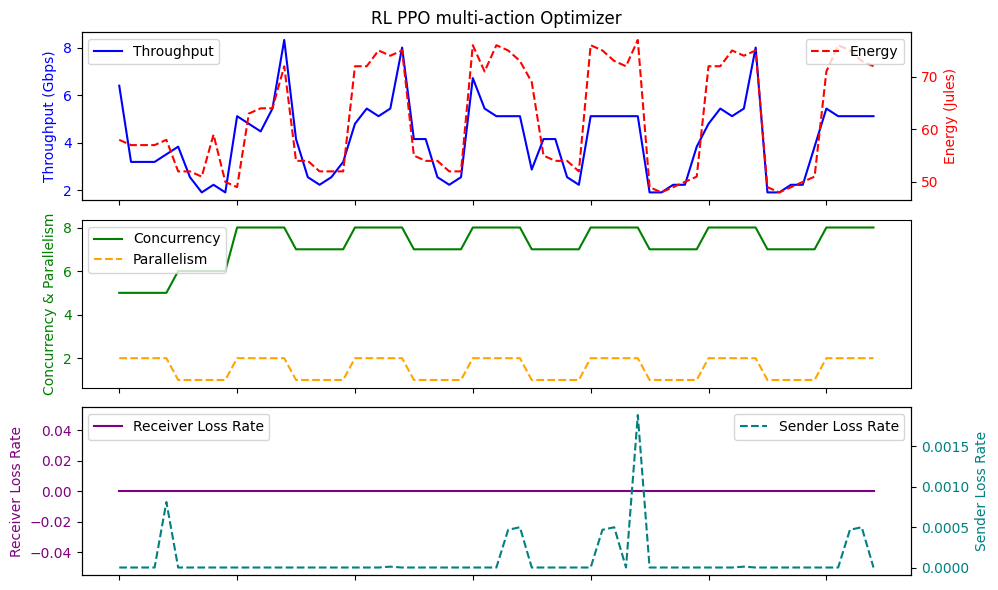

Average Throughput: 4.115692307692308
Avg Energy: 61.83076923076923
Total loss rate: 0.005607028293516189
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000   65.000000  65.000000
mean     4.283077       0.0   3.446154  32.933846   64.523077   0.000132
std      1.311722       0.0   0.901921   0.434913   11.565179   0.000413
min      1.920000       0.0   2.000000  32.500000   48.000000   0.000000
25%      3.200000       0.0   3.000000  32.600000   53.000000   0.000000
50%      4.800000       0.0   4.000000  32.700000   69.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000   73.000000   0.000000
max      8.000000       0.0   6.000000  34.100000  107.000000   0.001884
Episode reward: 5.76
actions [array([0, 1]), array([4, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0])],   13
reward

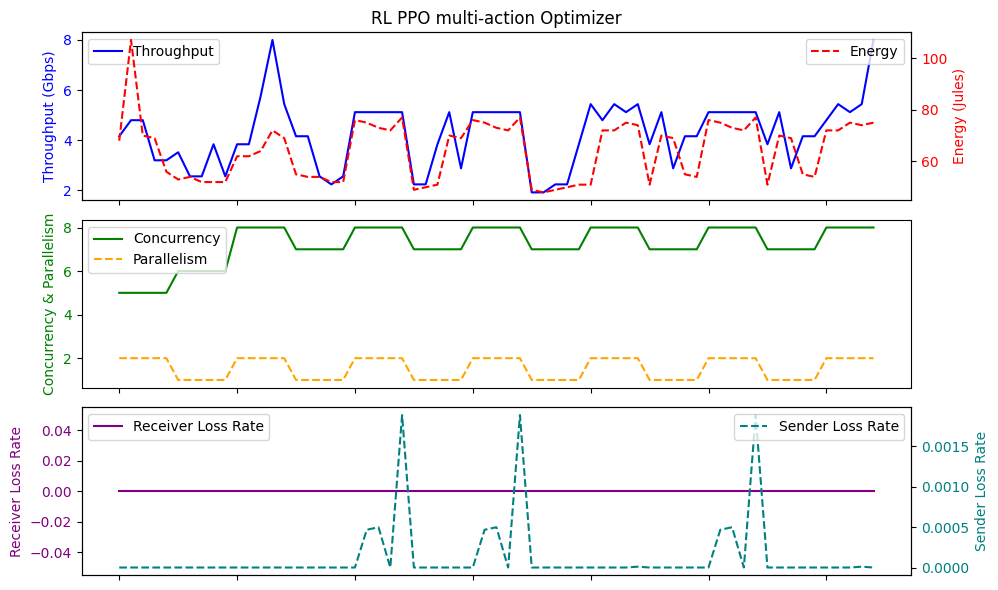

Average Throughput: 4.283076923076923
Avg Energy: 64.52307692307693
Total loss rate: 0.008565152338677218
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.022154       0.0   3.184615  32.852308  61.953846   0.000072
std      1.723224       0.0   1.144174   0.409690  11.596647   0.000275
min      0.960000       0.0   1.000000  32.500000  46.000000   0.000000
25%      2.240000       0.0   2.000000  32.600000  50.000000   0.000000
50%      4.160000       0.0   3.000000  32.700000  69.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  72.000000   0.000000
max      8.320000       0.0   6.000000  34.100000  77.000000   0.001884
Episode reward: 5.12
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0])],   13
rewards [2.7520

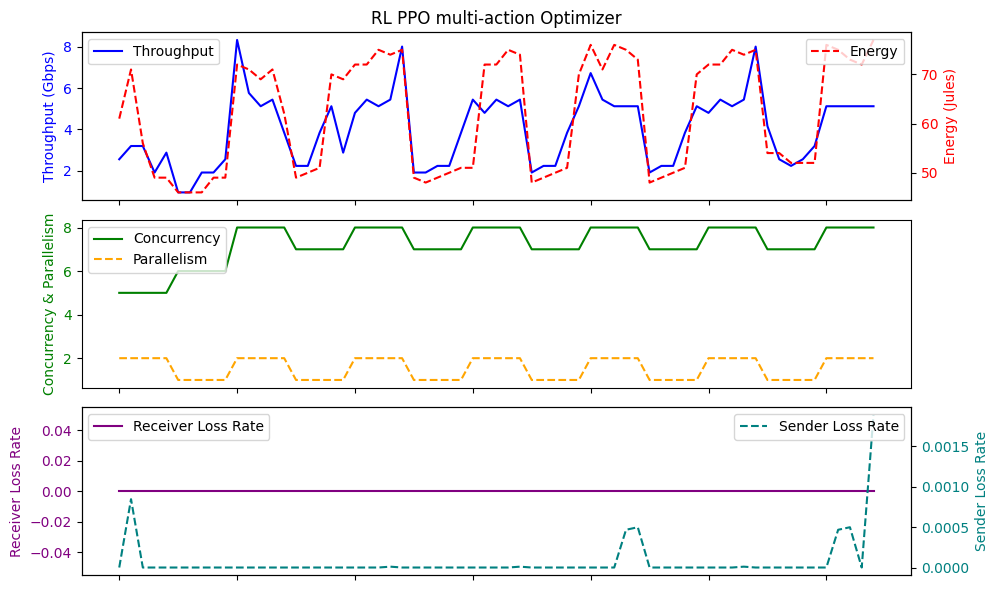

Average Throughput: 4.022153846153846
Avg Energy: 61.95384615384615
Total loss rate: 0.004688607354069856
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     3.968000       0.0   3.200000  32.860000  61.692308   0.000103
std      1.521894       0.0   1.018577   0.423453  11.438590   0.000349
min      0.960000       0.0   1.000000  32.500000  46.000000   0.000000
25%      2.240000       0.0   2.000000  32.600000  50.000000   0.000000
50%      4.160000       0.0   3.000000  32.700000  62.000000   0.000000
75%      5.120000       0.0   4.000000  33.000000  73.000000   0.000000
max      8.000000       0.0   6.000000  34.100000  77.000000   0.001884
Episode reward: 6.144
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1])],   13
rewards [3.776

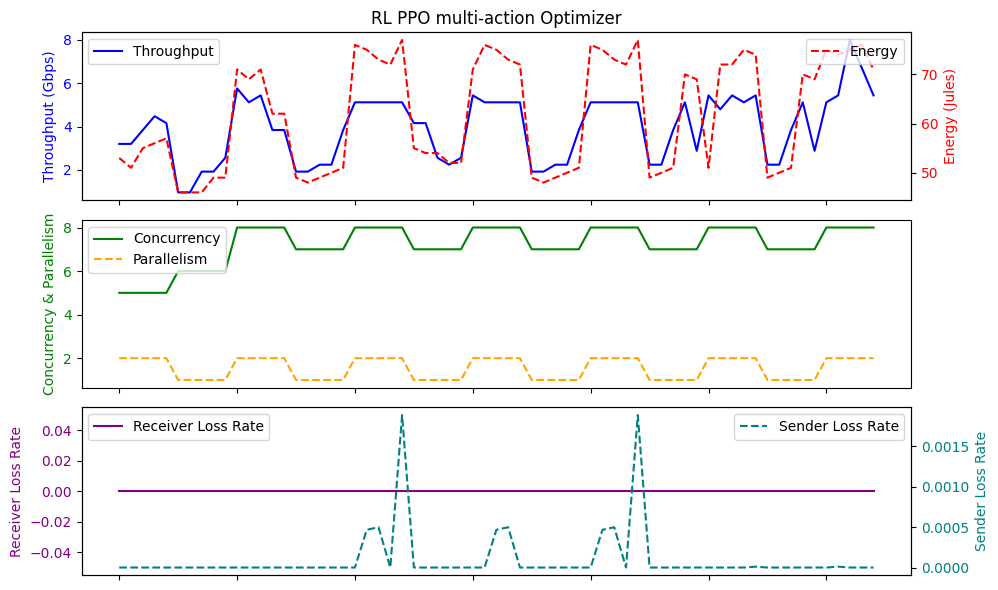

Average Throughput: 3.9680000000000004
Avg Energy: 61.69230769230769
Total loss rate: 0.006681310053953295
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.027077       0.0   3.246154  32.843077  62.323077   0.000103
std      1.286101       0.0   0.848358   0.406959  10.583164   0.000349
min      1.920000       0.0   2.000000  32.500000  48.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  52.000000   0.000000
50%      4.160000       0.0   4.000000  32.700000  62.000000   0.000000
75%      5.120000       0.0   4.000000  33.000000  72.000000   0.000000
max      5.760000       0.0   4.000000  34.100000  77.000000   0.001884
Episode reward: 5.248
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1])],   13
rewards [3.64

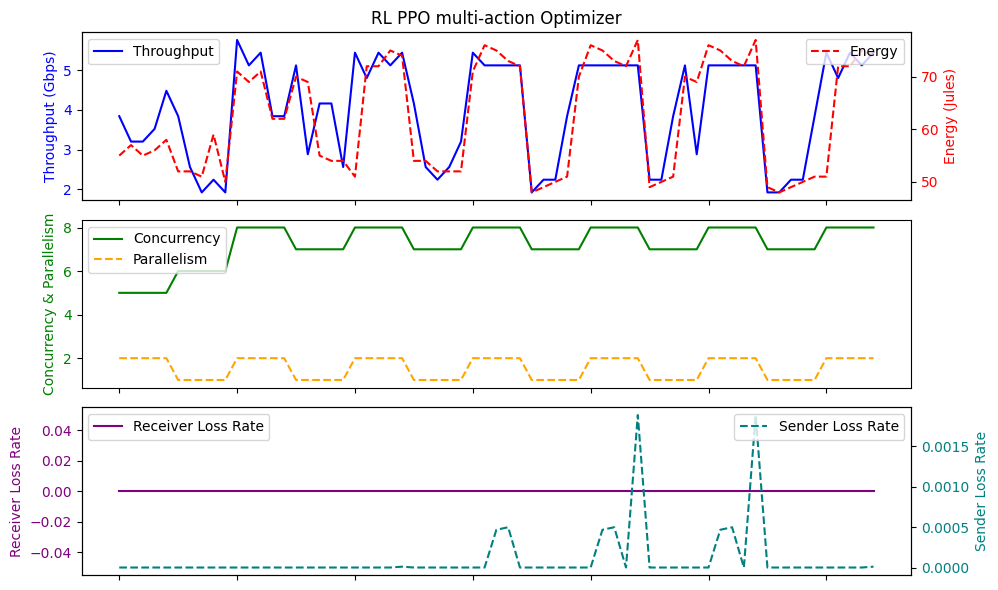

Average Throughput: 4.027076923076923
Avg Energy: 62.323076923076925
Total loss rate: 0.006681310053953295
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   60.000000      60.0  60.000000  60.000000  60.000000  60.000000
mean     4.368000       0.0   3.566667  32.930000  64.033333   0.000064
std      1.652639       0.0   1.226358   0.439298  11.455095   0.000268
min      1.920000       0.0   2.000000  32.500000  50.000000   0.000000
25%      2.880000       0.0   3.000000  32.600000  54.000000   0.000000
50%      4.160000       0.0   4.000000  32.700000  63.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  72.250000   0.000000
max     10.560000       0.0   9.000000  34.100000  98.000000   0.001884
Episode reward: 3.2
actions [array([0, 1]), array([4, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3])],   12
rewards [5.5680000000000005, -

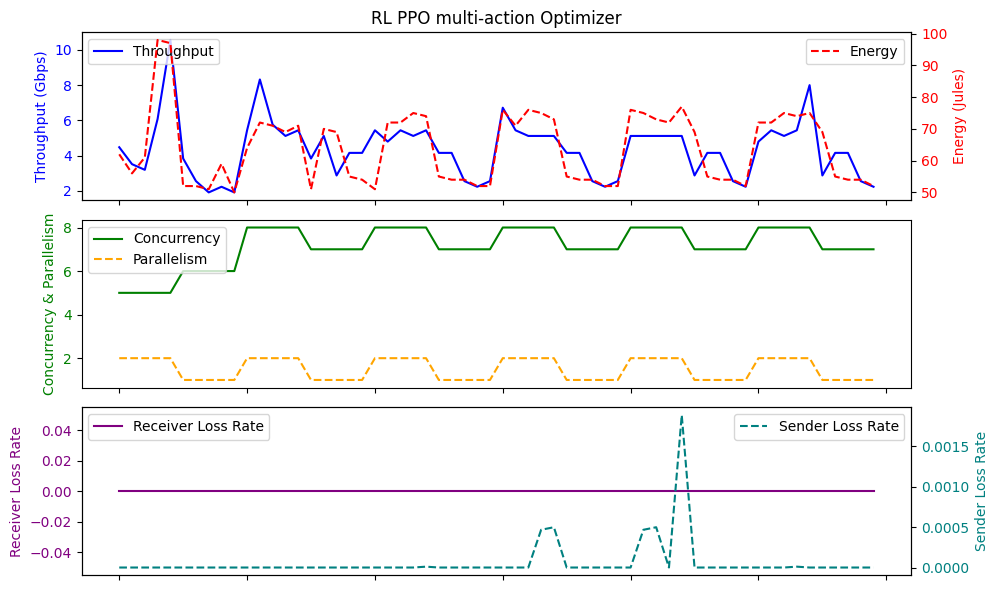

Average Throughput: 4.368
Avg Energy: 64.03333333333333
Total loss rate: 0.0038332962254240804
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000   65.000000  65.000000
mean     4.076308       0.0   3.307692  32.898462   63.800000   0.000175
std      1.500162       0.0   1.088621   0.438211   12.691286   0.000469
min      0.960000       0.0   1.000000  32.500000   46.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000   52.000000   0.000000
50%      4.160000       0.0   4.000000  32.700000   62.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000   74.000000   0.000000
max      8.320000       0.0   7.000000  34.100000  104.000000   0.001884
Episode reward: 5.12
actions [array([0, 1]), array([4, 0]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0])],   13
rewards [0.335999

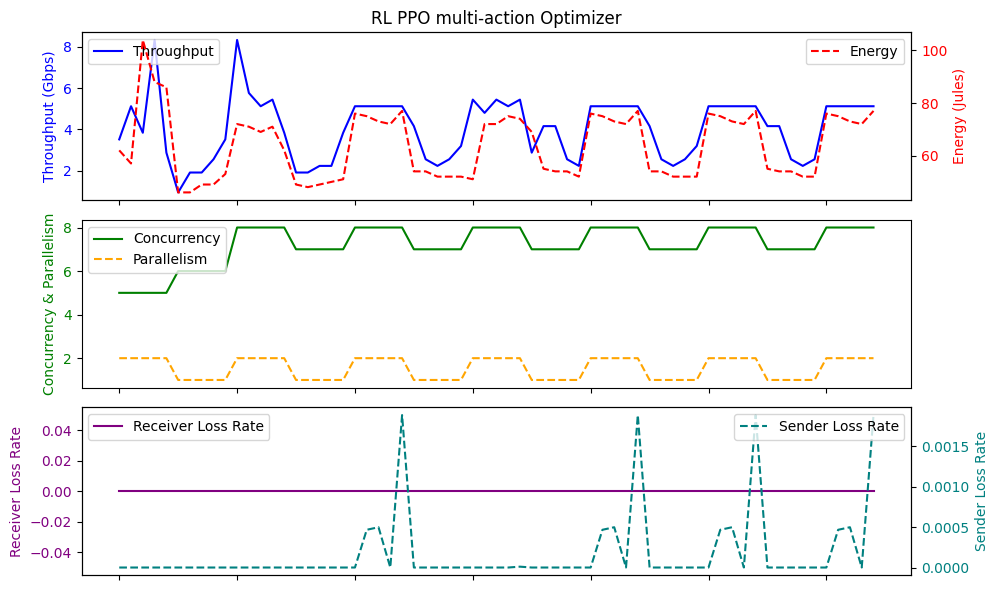

Average Throughput: 4.076307692307693
Avg Energy: 63.8
Total loss rate: 0.011402610740661645
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000   65.000000  65.000000
mean     4.105846       0.0   3.261538  32.910769   62.046154   0.000051
std      1.736727       0.0   1.189497   0.451083   12.361016   0.000252
min      0.960000       0.0   1.000000  32.500000   46.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000   52.000000   0.000000
50%      4.160000       0.0   3.000000  32.700000   56.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000   73.000000   0.000000
max      8.000000       0.0   6.000000  34.100000  106.000000   0.001884
Episode reward: 5.12
actions [array([0, 1]), array([4, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1])],   13
rewards [4.48, -2.8

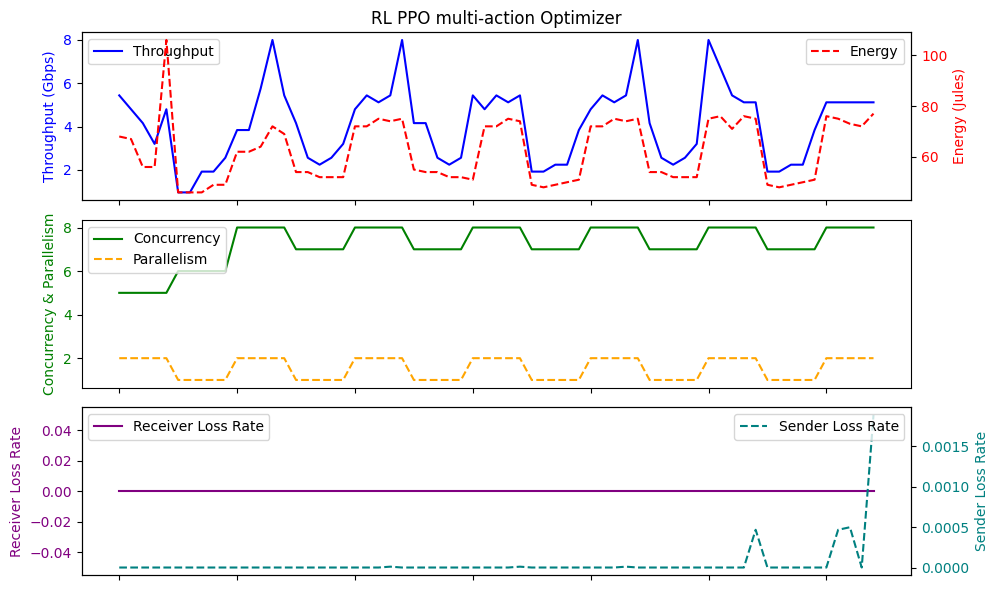

Average Throughput: 4.105846153846154
Avg Energy: 62.04615384615385
Total loss rate: 0.0033460278531465756
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.238769       0.0   3.384615  32.947692  64.800000   0.000228
std      1.636612       0.0   1.220813   0.475035  12.345546   0.000937
min      1.280000       0.0   1.000000  32.600000  48.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  52.000000   0.000000
50%      5.120000       0.0   4.000000  32.700000  70.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  75.000000   0.000000
max      8.000000       0.0   6.000000  34.200000  93.000000   0.007067
Episode reward: 5.759999999999999
actions [array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1])],   13
r

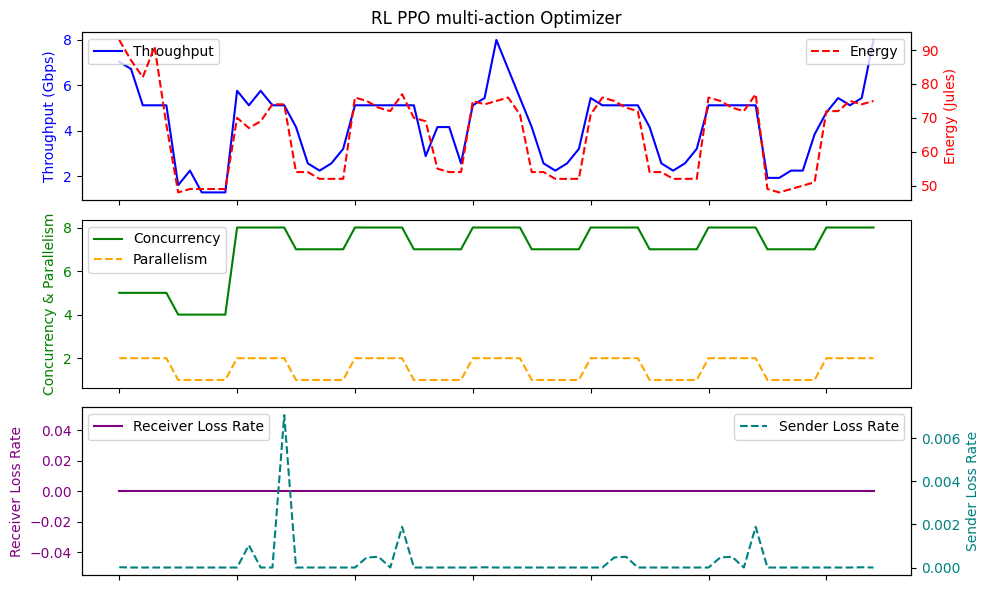

Average Throughput: 4.238769230769231
Avg Energy: 64.8
Total loss rate: 0.014801579886492536
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.283077       0.0   3.415385  32.920000  62.615385   0.000103
std      1.460622       0.0   0.982540   0.450416  10.836415   0.000349
min      1.920000       0.0   2.000000  32.500000  48.000000   0.000000
25%      2.880000       0.0   3.000000  32.600000  52.000000   0.000000
50%      4.800000       0.0   4.000000  32.700000  64.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  73.000000   0.000000
max      8.320000       0.0   6.000000  34.100000  77.000000   0.001884
Episode reward: 5.12
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1])],   13
rewards [3.7119999999999997,

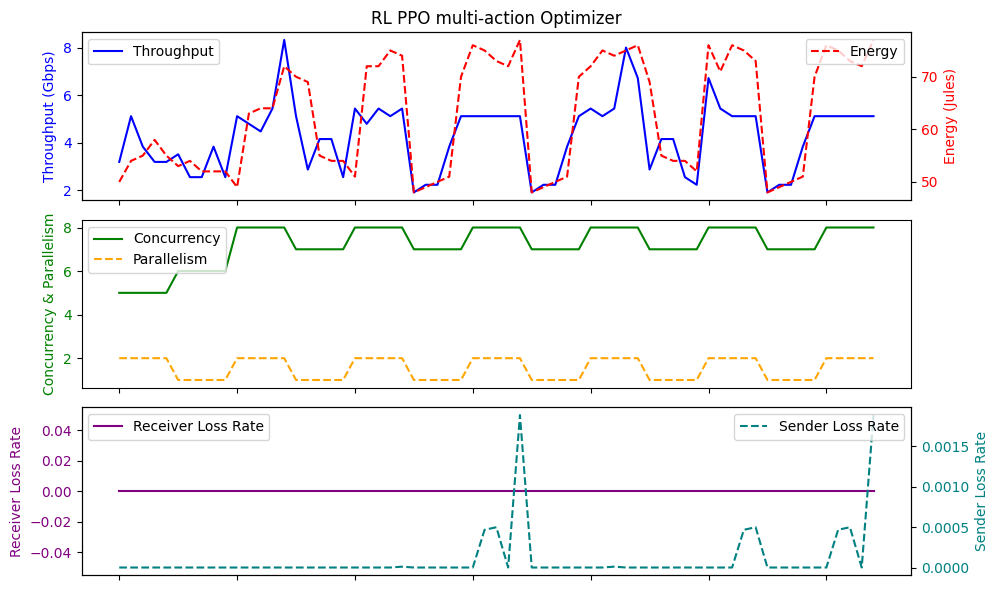

Average Throughput: 4.283076923076923
Avg Energy: 62.61538461538461
Total loss rate: 0.006681310053953296
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.214154       0.0   3.384615  32.947692  62.553846   0.000081
std      1.640068       0.0   1.113726   0.477660  11.139781   0.000272
min      0.960000       0.0   1.000000  32.500000  46.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  51.000000   0.000000
50%      4.800000       0.0   4.000000  32.700000  64.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  73.000000   0.000000
max      8.000000       0.0   6.000000  34.100000  77.000000   0.001884
Episode reward: 6.08
actions [array([0, 1]), array([4, 0]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0])],   13
rewards [4.16, 

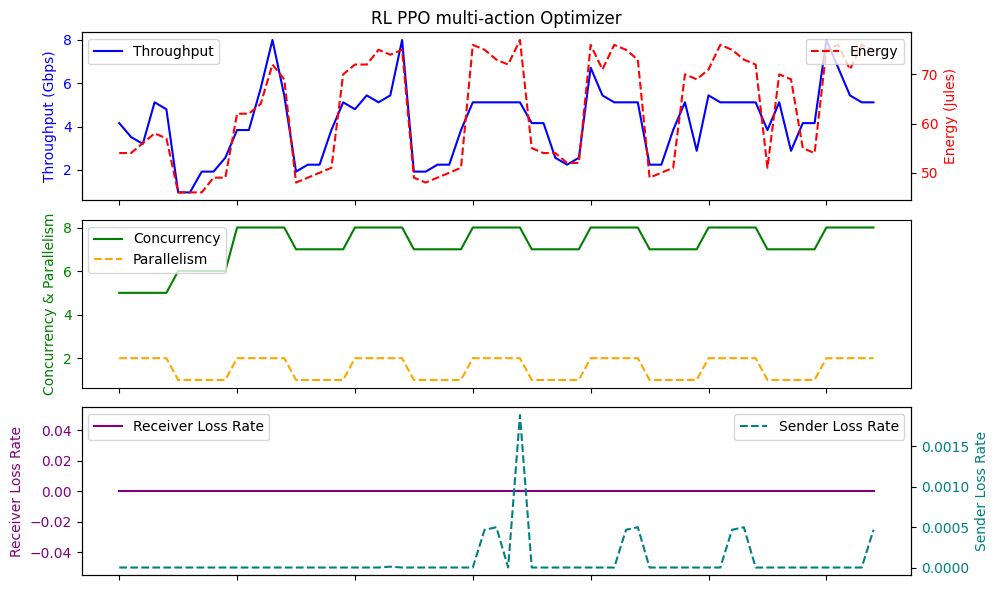

Average Throughput: 4.214153846153846
Avg Energy: 62.55384615384615
Total loss rate: 0.005253260087667587
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.071385       0.0   3.307692  32.927692  62.769231   0.000153
std      1.445000       0.0   0.983029   0.475496  10.981190   0.000418
min      1.920000       0.0   2.000000  32.500000  48.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  52.000000   0.000000
50%      4.160000       0.0   4.000000  32.700000  62.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  73.000000   0.000000
max      8.000000       0.0   6.000000  34.100000  77.000000   0.001884
Episode reward: 5.5040000000000004
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1])],   13
r

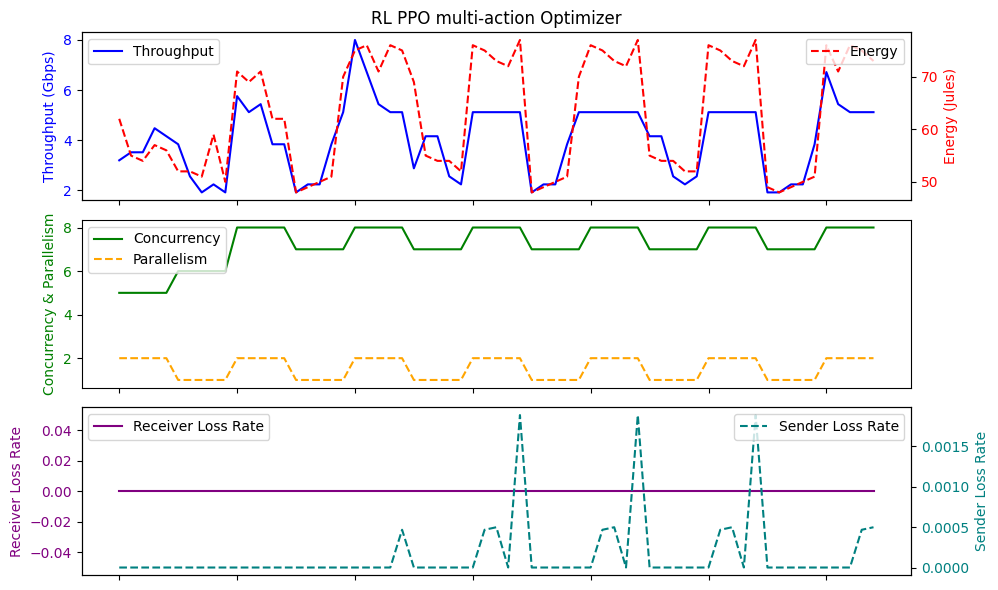

Average Throughput: 4.071384615384616
Avg Energy: 62.76923076923077
Total loss rate: 0.009974560774375937
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.022154       0.0   3.230769  32.930769  61.723077   0.000103
std      1.672334       0.0   1.142492   0.645398  11.465311   0.000349
min      0.960000       0.0   1.000000  32.500000  46.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  51.000000   0.000000
50%      4.480000       0.0   4.000000  32.700000  55.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  73.000000   0.000000
max      8.320000       0.0   6.000000  36.900000  77.000000   0.001884
Episode reward: 5.119999999999999
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1])],   13
re

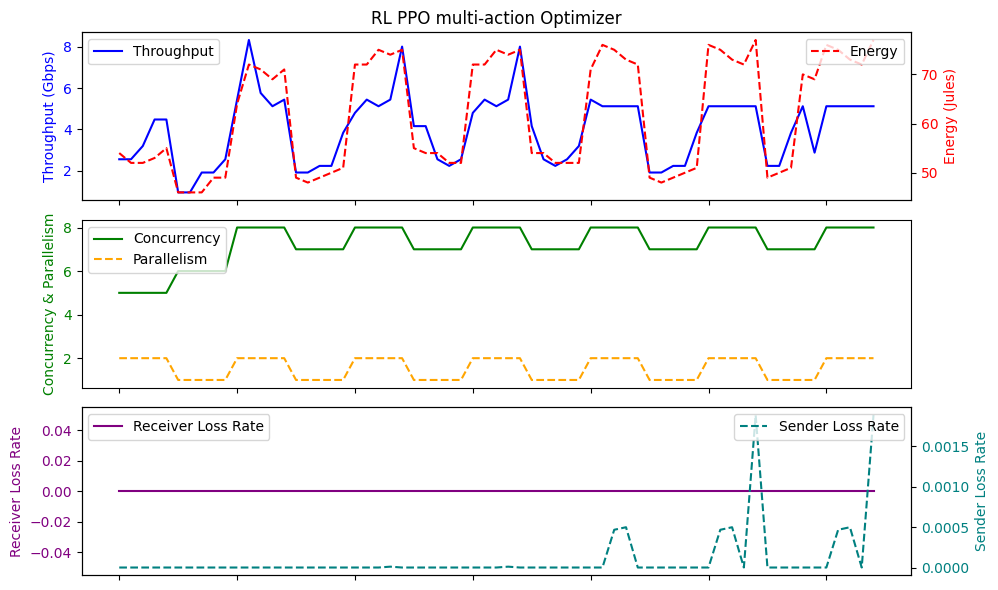

Average Throughput: 4.022153846153846
Avg Energy: 61.723076923076924
Total loss rate: 0.006681310053953296
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000   65.000000  65.000000
mean     3.992615       0.0   3.200000  32.881538   62.507692   0.000059
std      1.565741       0.0   1.033804   0.426062   12.831995   0.000258
min      0.960000       0.0   1.000000  32.500000   46.000000   0.000000
25%      2.240000       0.0   2.000000  32.600000   50.000000   0.000000
50%      4.160000       0.0   4.000000  32.700000   67.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000   73.000000   0.000000
max      8.320000       0.0   6.000000  34.100000  108.000000   0.001884
Episode reward: 5.12
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1])],   13
rewar

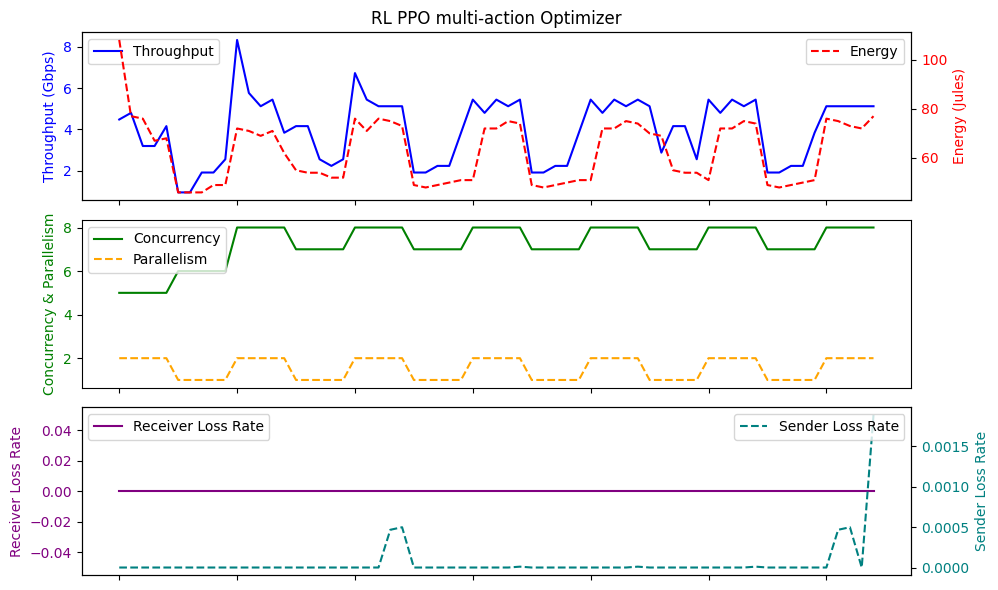

Average Throughput: 3.992615384615385
Avg Energy: 62.50769230769231
Total loss rate: 0.003843851651968867
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     3.997538       0.0   3.215385  32.903077  61.076923   0.000074
std      1.555504       0.0   1.038212   0.456881  10.819987   0.000268
min      1.920000       0.0   2.000000  32.500000  48.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  51.000000   0.000000
50%      3.840000       0.0   3.000000  32.700000  57.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  72.000000   0.000000
max      8.000000       0.0   6.000000  34.100000  77.000000   0.001884
Episode reward: 6.144
actions [array([0, 1]), array([4, 0]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0])],   13
rewards [3.904

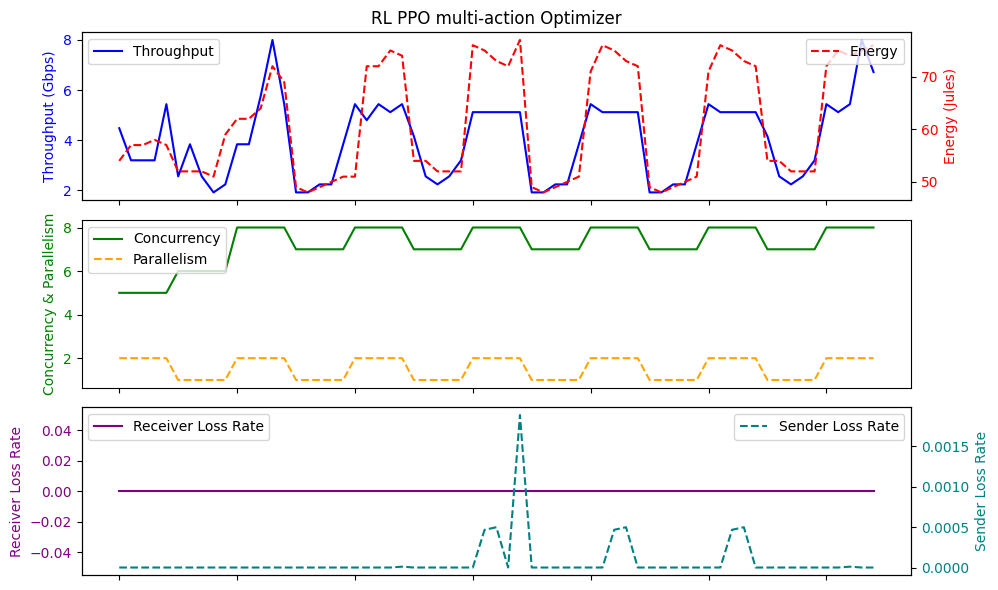

Average Throughput: 3.997538461538462
Avg Energy: 61.07692307692308
Total loss rate: 0.004797467769229372
       Throughput  LossRate      Score        RTT     Energy   SenderLR
count   65.000000      65.0  65.000000  65.000000  65.000000  65.000000
mean     4.194462       0.0   3.415385  33.184615  62.676923   0.000095
std      1.703759       0.0   1.171168   1.987164  11.015767   0.000346
min      0.960000       0.0   1.000000  32.500000  46.000000   0.000000
25%      2.560000       0.0   2.000000  32.600000  52.000000   0.000000
50%      4.160000       0.0   4.000000  32.700000  62.000000   0.000000
75%      5.120000       0.0   4.000000  33.100000  74.000000   0.000000
max      8.000000       0.0   6.000000  48.500000  77.000000   0.001884
Episode reward: 5.76
actions [array([0, 1]), array([3, 0]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 1]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0]), array([4, 3]), array([0, 0])],   13
rewards [3.84, 

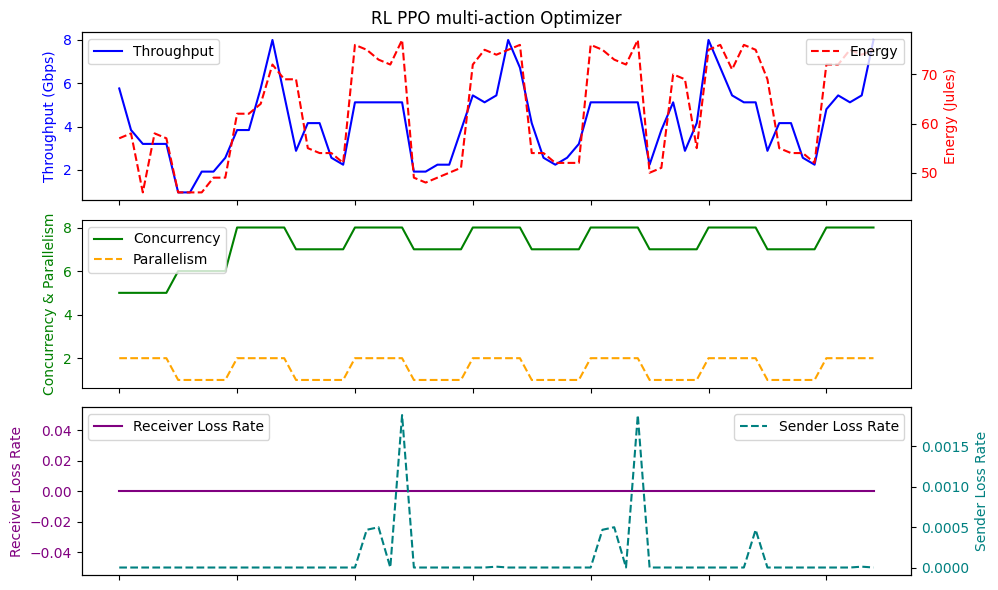

Average Throughput: 4.194461538461538
Avg Energy: 62.676923076923075
Total loss rate: 0.006183486255131003


In [22]:
num_of_run=50

rl_energy_sla_throughput_list=[]
rl_energy_sla_energy_list=[]
rl_energy_sla_plr_list=[]


model = PPO.load("./ppo_multi_action_in_de_energySLA/ppo_best_model/best_model.zip")
for i in range(0,num_of_run):
    done = False
    episode_reward = 0
    env=transferClass_multi_action_increase_decrease_energy_SLA(cluster_dictionary,initial_value_cluster_dictionary,'energySLA')
    action_list=[]
    reward_list=[]
    obs = env.reset()
    while not done:
        action, _ = model.predict(obs, deterministic=True)
        action_list.append(action)
    #     print("action: ",action)
        obs, reward, done, info = env.step(action)
    #     obs = obs.astype(np.float32)
    #     print("obs: ", obs,".... reward: ",reward)
        reward_list.append(reward)
        episode_reward += reward

    accumulator_df = pd.concat(env.obs_df)  # Add more DataFrames in the list if needed
    env.close()
    print(accumulator_df.describe())
    print(f"Episode reward: {episode_reward}")
    print(f"actions {action_list},   {len(action_list)}")
    print(f"rewards {reward_list},  {len(reward_list)}")
    rl_energy_sla_throughput_list.append(accumulator_df['Throughput'].mean())
    rl_energy_sla_energy_list.append(accumulator_df['Energy'].mean())
    rl_energy_sla_plr_list.append(accumulator_df['SenderLR'].mean())
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 6), sharex=True)

    df=accumulator_df.reset_index()
    # Top plot with Throughput and Energy
    ax1.plot( df['Throughput'], label='Throughput', color='blue')
    ax1.set_ylabel('Throughput (Gbps)', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.set_title('RL PPO multi-action Optimizer')

    ax2_twin = ax1.twinx()
    ax2_twin.plot(df['Energy'], label='Energy', color='red', linestyle='--')
    ax2_twin.set_ylabel('Energy (Jules)', color='red')
    ax2_twin.tick_params(axis='y', labelcolor='red')

    # Bottom plot with Concurrency, Parallelism, and CC
    ax2.plot(df['Concurrency'], label='Concurrency', color='green')
    ax2.plot(df['Parallelism'], label='Parallelism', color='orange', linestyle='--')
    ax2.set_ylabel('Concurrency & Parallelism', color='green')
    ax2.tick_params(axis='y', labelcolor='green')


    # Bottom plot with Receiver Loss Rate and Sender Loss Rate
    ax3.plot( df['LossRate'], label='Receiver Loss Rate', color='purple', linestyle='-')
    ax3.set_ylabel('Receiver Loss Rate', color='purple')
    ax3.tick_params(axis='y', labelcolor='purple')

    ax4_twin = ax3.twinx()
    ax4_twin.plot( df['SenderLR'], label='Sender Loss Rate', color='teal', linestyle='--')
    ax4_twin.set_ylabel('Sender Loss Rate', color='teal')
    ax4_twin.tick_params(axis='y', labelcolor='teal')
    ax1.set_xticklabels([])
    ax2.set_xticklabels([])
    # Fix for overlapping layouts
    fig.tight_layout()

    # Legend
    ax1.legend(loc='upper left')
    ax2_twin.legend(loc='upper right')
    ax2.legend(loc='upper left')
#     ax3_twin.legend(loc='upper right')
    ax3.legend(loc='upper left')
    ax4_twin.legend(loc='upper right')
#     plt.savefig('withBT.png', format='png', dpi=300, bbox_inches='tight')
    plt.show()

    average_throughput = accumulator_df['Throughput'].mean()
    print("Average Throughput:", average_throughput)
    total_energy = accumulator_df['Energy'].mean()
    print("Avg Energy:", total_energy)
    total_plr = accumulator_df['SenderLR'].sum()
    print("Total loss rate:", total_plr)

**Throughput SLA**

In [23]:
class transferClass_multi_action_increase_decrease_throughput_SLA(gym.Env):
    metadata = {"render_modes": ["human"], "render_fps": 30}
    def __init__(self,transaction_dfs,initial_dfs,optimizer,total_steps=20,min_values=[0.32, 0.0, 1, 1, -3081.0, 0.0, 44.0, 0.0],max_values = [19.2, 2.0, 8, 8, 16.0, 70.1, 120.0, 74.166],total_file_size=256):
        super().__init__()
        self.min_action=1
        self.max_action=8
        self.action_i_d_array=[1,4,0,-1,-4]

        self.transaction_dfs = transaction_dfs
        self.initial_dfs= initial_dfs

        self.action_space = spaces.MultiDiscrete([5, 5])  # example action space
        self.current_action_parallelism_value=1
        self.current_action_concurrency_value=1
        self.observation_space = spaces.Box(low=0, high=np.inf, shape=(40,), dtype=np.float32) # example observation space
        self.current_observation = np.zeros(40,) # initialize current observation
        self.throughput_sla=9
        self.optimizer=optimizer
        self.old_action=None
        self.step_number=0
        self.total_steps=total_steps
        self.sampling_metric='Score'
        self.min_values=np.array(min_values)
        self.max_values=np.array(max_values)
        self.previous_reward=0
        self.obs_df=[]
        self.total_file_size= total_file_size
        self.current_download_size=0

    def reset(self):
        self.current_observation = np.zeros(40,) # initialize current observation
        self.old_action=None
        self.step_number=0
        self.previous_reward=0
        self.current_action_parallelism_value=1
        self.current_action_concurrency_value=1
        self.obs_df=[]
        self.current_download_size=0
        return self.current_observation

    def step(self, action):
        # perform action using transfer_service
        action_1,action_2=action

        self.current_action_parallelism_value+=self.action_i_d_array[action_1]
        if self.current_action_parallelism_value<self.min_action:
            self.current_action_parallelism_value=self.min_action
        elif self.current_action_parallelism_value>self.max_action:
            self.current_action_parallelism_value=self.max_action

        self.current_action_concurrency_value+=self.action_i_d_array[action_2]
        if self.current_action_concurrency_value<self.min_action:
            self.current_action_concurrency_value=self.min_action
        elif self.current_action_concurrency_value>self.max_action:
            self.current_action_concurrency_value=self.max_action


        action_t=(self.current_action_parallelism_value,self.current_action_concurrency_value)
#         print(f"action_t {action_t}")

        if self.old_action==None:
            done=False
            observation_df=sample_row_and_neighbors(self.initial_dfs[action_t],self.sampling_metric)
            self.obs_df.append(observation_df)
            observation,result_array,e_array,t_array=normalize_and_flatten(observation_df,self.min_values,self.max_values)
            self.current_download_size+=np.sum(t_array)
            throughput_part_reward=np.mean(t_array)
            if throughput_part_reward < self.throughput_sla:
                throughput_penalty=(self.throughput_sla-throughput_part_reward)*5
            else:
                throughput_penalty=0                
            reward_=throughput_part_reward-throughput_penalty
            self.old_action=action_t
            reward=reward_- self.previous_reward
            self.previous_reward=reward_

        elif self.old_action==action_t:
            done=False
            observation_df=sample_row_and_neighbors(self.initial_dfs[action_t],self.sampling_metric)
            self.obs_df.append(observation_df)
            observation,result_array,e_array,t_array=normalize_and_flatten(observation_df,self.min_values,self.max_values)
            self.current_download_size+=np.sum(t_array)
            energy_part_reward=np.mean(e_array)
            throughput_part_reward=np.mean(t_array)
            if throughput_part_reward < self.throughput_sla:
                throughput_penalty=(self.throughput_sla-throughput_part_reward)*5
            else:
                throughput_penalty=0                
            reward_=throughput_part_reward-throughput_penalty
            self.old_action=action_t
            reward=reward_- self.previous_reward
            self.previous_reward=reward_
            
        else:
            done=False
            key_name=(self.old_action, action_t)
            work_df=self.transaction_dfs[key_name]
            if work_df.empty:
                observation_df=sample_row_and_neighbors(self.initial_dfs[action_t],self.sampling_metric)
            else:
                observation_df=sample_row_and_neighbors(self.transaction_dfs[key_name],self.sampling_metric)
            self.obs_df.append(observation_df)
            observation,result_array,e_array,t_array=normalize_and_flatten(observation_df,self.min_values,self.max_values)
            self.current_download_size+=np.sum(t_array)
            throughput_part_reward=np.mean(t_array)
            if throughput_part_reward < self.throughput_sla:
                throughput_penalty=(self.throughput_sla-throughput_part_reward)*5
            else:
                throughput_penalty=0                
            reward_=throughput_part_reward-throughput_penalty
            self.old_action=action_t
            reward=reward_- self.previous_reward
            self.previous_reward=reward_

        self.step_number+=1
        if self.current_download_size>=self.total_file_size:
            done=True
        observation = np.asarray(observation).astype(np.float32)
        self.current_observation=observation
        return self.current_observation, reward, done, {}

    def bayes_step(self,action):
        params = [1 if x<1 else int(np.round(x)) for x in action]
        self.current_action_array_index+=self.action_i_d_array[params[0]]
        if self.current_action_array_index<self.min_action:
            self.current_action_array_index=self.min_action
        elif self.current_action_array_index>self.max_action:
            self.current_action_array_index=self.max_action
        action_t=self.action_array[self.current_action_array_index]

        print("Bayes Step: ",action_t)
        obs,score_b,done_b,__=self.step(action_t)
        print("Bayes Step Score: ", score_b)
        return np.round(score_b * (-1))

    def render(self, mode="human"):
        pass

    def close(self):
        self.reset()


In [ ]:
env=transferClass_multi_action_increase_decrease_throughput_SLA(cluster_dictionary,initial_value_cluster_dictionary,'throughputSLA')
evaluation_env=transferClass_multi_action_increase_decrease_throughput_SLA(cluster_dictionary,initial_value_cluster_dictionary,'throughputSLA')

policy_kwargs = dict(activation_fn=th.nn.ReLU,net_arch=[{'pi': [128, 128], 'vf': [128, 128]}])

run_string='multi_action_in_de_throughputSLA'
model = PPO("MlpPolicy", env=env, policy_kwargs=policy_kwargs, verbose=1,tensorboard_log=f"./ppo_tensorboard_{run_string}/",ent_coef=0.01)

eval_callback = EvalCallback(evaluation_env, best_model_save_path=f'./ppo_{run_string}/ppo_best_model/',
                               log_path=f'./ppo_{run_string}/ppo_logs/', eval_freq=1000,
                               deterministic=True, render=False)
# Callback for saving checkpoints every 1000 timesteps
checkpoint_callback = CheckpointCallback(save_freq=100000, save_path=f'./ppo_{run_string}/ppo_checkpoints/',
                                           name_prefix=f'ppo_model_{run_string}')

# Combine both callbacks
callback = CallbackList([checkpoint_callback, eval_callback])
model.learn(total_timesteps=1500000, callback=callback)

Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Logging to ./ppo_tensorboard_multi_action_in_de_throughputSLA/PPO_2
Eval num_timesteps=1000, episode_reward=-26.03 +/- 4.48
Episode length: 24.20 +/- 3.92
---------------------------------
| eval/              |          |
|    mean_ep_length  | 24.2     |
|    mean_reward     | -26      |
| time/              |          |
|    total_timesteps | 1000     |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
Eval num_timesteps=2000, episode_reward=-22.34 +/- 6.86
Episode length: 21.60 +/- 3.44
---------------------------------
| eval/              |          |
|    mean_ep_length  | 21.6     |
|    mean_reward     | -22.3    |
| time/              |          |
|    total_timesteps | 2000     |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.6     |
|    ep_rew_mean     | -9.95    |
| time/              |          |
|    fps             | 497      |
|    iterations      | 1        |
|    time_elapsed    | 4        |
|    total_timesteps | 2048     |
---------------------------------
Eval num_timesteps=3000, episode_reward=4.63 +/- 3.90
Episode length: 10.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 10          |
|    mean_reward          | 4.63        |
| time/                   |             |
|    total_timesteps      | 3000        |
| train/                  |             |
|    approx_kl            | 0.017021298 |
|    clip_fraction        | 0.205       |
|    clip_range           | 0.2         |
|    entropy_loss         | -3.21       |
|    explained_variance   | -0.00197    |
|    learning_rate        | 0.0003      |
|    lo

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
Eval num_timesteps=4000, episode_reward=-0.46 +/- 2.24
Episode length: 9.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 9.8      |
|    mean_reward     | -0.456   |
| time/              |          |
|    total_timesteps | 4000     |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 13.9     |
|    ep_rew_mean     | -6.82    |
| time/              |          |
|    fps             | 475      |
|    iterations      | 2        |
|    time_elapsed    | 8        |
|    total_timesteps | 4096     |
---------------------------------
Eval num_timesteps=5000, episode_reward=1.46 +/- 4.64
Episode length: 8.40 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 8.4         |
|    mean_reward          | 1.46        |
| time/                   |             |
|    total_timesteps      | 5000        |
| train/                  |             |
|    approx_kl            | 0.014897332 |
|    clip_fraction        | 0.189       |
|    clip_range           | 0.2         |
|    entropy_loss         | -3.17       |
|    explained_variance   | 0.597       |
|    learning_rate        | 0.0003      |
|    loss                 | 45

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=6000, episode_reward=3.01 +/- 4.76
Episode length: 8.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 8.6      |
|    mean_reward     | 3.01     |
| time/              |          |
|    total_timesteps | 6000     |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.4     |
|    ep_rew_mean     | -4.89    |
| time/              |          |
|    fps             | 469      |
|    iterations      | 3        |
|    time_elapsed    | 13       |
|    total_timesteps | 6144     |
---------------------------------
Eval num_timesteps=7000, episode_reward=2.92 +/- 2.83
Episode length: 7.80 +/- 0.75
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7.8         |
|    mean_reward          | 2.92        |
| time/                   |             |
|    total_timesteps      | 7000        |
| train/                  |             |
|    approx_kl            | 0.011902258 |
|    clip_fraction        | 0.17        |
|    clip_range           | 0.2         |
|    entropy_loss         | -3.13       |
|    explained_variance   | 0.709       |
|    learning_rate        | 0.0003      |
|    loss                 | 45

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=8000, episode_reward=4.27 +/- 3.37
Episode length: 8.00 +/- 0.63
---------------------------------
| eval/              |          |
|    mean_ep_length  | 8        |
|    mean_reward     | 4.27     |
| time/              |          |
|    total_timesteps | 8000     |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 11.2     |
|    ep_rew_mean     | -3.62    |
| time/              |          |
|    fps             | 461      |
|    iterations      | 4        |
|    time_elapsed    | 17       |
|    total_timesteps | 8192     |
---------------------------------
Eval num_timesteps=9000, episode_reward=-3.14 +/- 5.02
Episode length: 8.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 8           |
|    mean_reward          | -3.14       |
| time/                   |             |
|    total_timesteps      | 9000        |
| train/                  |             |
|    approx_kl            | 0.010744829 |
|    clip_fraction        | 0.157       |
|    clip_range           | 0.2         |
|    entropy_loss         | -3.08       |
|    explained_variance   | 0.804       |
|    learning_rate        | 0.0003      |
|    loss                 | 2

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=10000, episode_reward=3.44 +/- 5.86
Episode length: 8.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 8.2      |
|    mean_reward     | 3.44     |
| time/              |          |
|    total_timesteps | 10000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10.8     |
|    ep_rew_mean     | -1.4     |
| time/              |          |
|    fps             | 460      |
|    iterations      | 5        |
|    time_elapsed    | 22       |
|    total_timesteps | 10240    |
---------------------------------
Eval num_timesteps=11000, episode_reward=-0.53 +/- 5.43
Episode length: 8.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 8          |
|    mean_reward          | -0.533     |
| time/                   |            |
|    total_timesteps      | 11000      |
| train/                  |            |
|    approx_kl            | 0.00919774 |
|    clip_fraction        | 0.139      |
|    clip_range           | 0.2        |
|    entropy_loss         | -3.02      |
|    explained_variance   | 0.83       |
|    learning_rate        | 0.0003     |
|    loss                 | 14.8       |


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=12000, episode_reward=-1.45 +/- 4.57
Episode length: 8.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 8        |
|    mean_reward     | -1.45    |
| time/              |          |
|    total_timesteps | 12000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10.7     |
|    ep_rew_mean     | -0.703   |
| time/              |          |
|    fps             | 460      |
|    iterations      | 6        |
|    time_elapsed    | 26       |
|    total_timesteps | 12288    |
---------------------------------
Eval num_timesteps=13000, episode_reward=0.94 +/- 5.71
Episode length: 8.40 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 8.4         |
|    mean_reward          | 0.941       |
| time/                   |             |
|    total_timesteps      | 13000       |
| train/                  |             |
|    approx_kl            | 0.010727218 |
|    clip_fraction        | 0.136       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.98       |
|    explained_variance   | 0.858       |
|    learning_rate        | 0.0003      |
|    loss                 | 1

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=14000, episode_reward=0.70 +/- 6.58
Episode length: 8.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 8.2      |
|    mean_reward     | 0.696    |
| time/              |          |
|    total_timesteps | 14000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.97     |
|    ep_rew_mean     | -0.567   |
| time/              |          |
|    fps             | 458      |
|    iterations      | 7        |
|    time_elapsed    | 31       |
|    total_timesteps | 14336    |
---------------------------------
Eval num_timesteps=15000, episode_reward=1.69 +/- 4.47
Episode length: 8.20 +/- 0.75
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 8.2         |
|    mean_reward          | 1.69        |
| time/                   |             |
|    total_timesteps      | 15000       |
| train/                  |             |
|    approx_kl            | 0.011173072 |
|    clip_fraction        | 0.15        |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.92       |
|    explained_variance   | 0.883       |
|    learning_rate        | 0.0003      |
|    loss                 | 1

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=16000, episode_reward=-4.99 +/- 4.77
Episode length: 8.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 8        |
|    mean_reward     | -4.99    |
| time/              |          |
|    total_timesteps | 16000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | 1.4      |
| time/              |          |
|    fps             | 458      |
|    iterations      | 8        |
|    time_elapsed    | 35       |
|    total_timesteps | 16384    |
---------------------------------
Eval num_timesteps=17000, episode_reward=4.96 +/- 5.28
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 4.96        |
| time/                   |             |
|    total_timesteps      | 17000       |
| train/                  |             |
|    approx_kl            | 0.009244213 |
|    clip_fraction        | 0.123       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.85       |
|    explained_variance   | 0.865       |
|    learning_rate        | 0.0003      |
|    loss                 | 1

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
Eval num_timesteps=18000, episode_reward=1.15 +/- 7.91
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 1.15     |
| time/              |          |
|    total_timesteps | 18000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.33     |
|    ep_rew_mean     | 1.11     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 9        |
|    time_elapsed    | 40       |
|    total_timesteps | 18432    |
---------------------------------
Eval num_timesteps=19000, episode_reward=-2.76 +/- 8.15
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | -2.76       |
| time/                   |             |
|    total_timesteps      | 19000       |
| train/                  |             |
|    approx_kl            | 0.008512888 |
|    clip_fraction        | 0.134       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.8        |
|    explained_variance   | 0.894       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=20000, episode_reward=0.30 +/- 4.55
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 0.301    |
| time/              |          |
|    total_timesteps | 20000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.1      |
|    ep_rew_mean     | 0.198    |
| time/              |          |
|    fps             | 458      |
|    iterations      | 10       |
|    time_elapsed    | 44       |
|    total_timesteps | 20480    |
---------------------------------
Eval num_timesteps=21000, episode_reward=-2.07 +/- 7.10
Episode length: 6.80 +/- 0.75
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | -2.07       |
| time/                   |             |
|    total_timesteps      | 21000       |
| train/                  |             |
|    approx_kl            | 0.008312168 |
|    clip_fraction        | 0.116       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.77       |
|    explained_variance   | 0.9         |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=22000, episode_reward=4.38 +/- 4.30
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 4.38     |
| time/              |          |
|    total_timesteps | 22000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 8.89     |
|    ep_rew_mean     | 0.105    |
| time/              |          |
|    fps             | 459      |
|    iterations      | 11       |
|    time_elapsed    | 49       |
|    total_timesteps | 22528    |
---------------------------------
Eval num_timesteps=23000, episode_reward=0.47 +/- 3.43
Episode length: 7.20 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7.2          |
|    mean_reward          | 0.466        |
| time/                   |              |
|    total_timesteps      | 23000        |
| train/                  |              |
|    approx_kl            | 0.0073286956 |
|    clip_fraction        | 0.074        |
|    clip_range           | 0.2          |
|    entropy_loss         | -2.77        |
|    explained_variance   | 0.904        |
|    learning_rate        | 0.0003       |
|    loss       

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=24000, episode_reward=4.62 +/- 5.64
Episode length: 7.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.4      |
|    mean_reward     | 4.62     |
| time/              |          |
|    total_timesteps | 24000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 8.83     |
|    ep_rew_mean     | 2.23     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 12       |
|    time_elapsed    | 53       |
|    total_timesteps | 24576    |
---------------------------------
Eval num_timesteps=25000, episode_reward=3.97 +/- 4.15
Episode length: 7.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7.2         |
|    mean_reward          | 3.97        |
| time/                   |             |
|    total_timesteps      | 25000       |
| train/                  |             |
|    approx_kl            | 0.012663481 |
|    clip_fraction        | 0.131       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.73       |
|    explained_variance   | 0.902       |
|    learning_rate        | 0.0003      |
|    loss                 | 1

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=26000, episode_reward=-1.38 +/- 6.07
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | -1.38    |
| time/              |          |
|    total_timesteps | 26000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 8.75     |
|    ep_rew_mean     | 2.32     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 13       |
|    time_elapsed    | 58       |
|    total_timesteps | 26624    |
---------------------------------
Eval num_timesteps=27000, episode_reward=7.15 +/- 3.12
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 7.15        |
| time/                   |             |
|    total_timesteps      | 27000       |
| train/                  |             |
|    approx_kl            | 0.008223808 |
|    clip_fraction        | 0.112       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.68       |
|    explained_variance   | 0.895       |
|    learning_rate        | 0.0003      |
|    loss                 | 1

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
Eval num_timesteps=28000, episode_reward=-2.53 +/- 7.79
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | -2.53    |
| time/              |          |
|    total_timesteps | 28000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 8.67     |
|    ep_rew_mean     | 2.94     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 14       |
|    time_elapsed    | 62       |
|    total_timesteps | 28672    |
---------------------------------
Eval num_timesteps=29000, episode_reward=2.85 +/- 3.04
Episode length: 7.00 +/- 0.63
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 2.85        |
| time/                   |             |
|    total_timesteps      | 29000       |
| train/                  |             |
|    approx_kl            | 0.012439899 |
|    clip_fraction        | 0.116       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.67       |
|    explained_variance   | 0.896       |
|    learning_rate        | 0.0003      |
|    loss                 | 1

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=30000, episode_reward=-2.30 +/- 3.77
Episode length: 7.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.4      |
|    mean_reward     | -2.3     |
| time/              |          |
|    total_timesteps | 30000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 8.69     |
|    ep_rew_mean     | 1.27     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 15       |
|    time_elapsed    | 67       |
|    total_timesteps | 30720    |
---------------------------------
Eval num_timesteps=31000, episode_reward=-3.53 +/- 10.80
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | -3.53       |
| time/                   |             |
|    total_timesteps      | 31000       |
| train/                  |             |
|    approx_kl            | 0.007999454 |
|    clip_fraction        | 0.0934      |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.66       |
|    explained_variance   | 0.887       |
|    learning_rate        | 0.0003      |
|    loss                 |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=32000, episode_reward=2.53 +/- 3.94
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 2.53     |
| time/              |          |
|    total_timesteps | 32000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 8.7      |
|    ep_rew_mean     | 2.54     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 16       |
|    time_elapsed    | 71       |
|    total_timesteps | 32768    |
---------------------------------
Eval num_timesteps=33000, episode_reward=5.74 +/- 4.28
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 5.74        |
| time/                   |             |
|    total_timesteps      | 33000       |
| train/                  |             |
|    approx_kl            | 0.009366188 |
|    clip_fraction        | 0.0992      |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.66       |
|    explained_variance   | 0.903       |
|    learning_rate        | 0.0003      |
|    loss                 | 1

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=34000, episode_reward=4.32 +/- 5.34
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 4.32     |
| time/              |          |
|    total_timesteps | 34000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 8.52     |
|    ep_rew_mean     | 1.53     |
| time/              |          |
|    fps             | 456      |
|    iterations      | 17       |
|    time_elapsed    | 76       |
|    total_timesteps | 34816    |
---------------------------------
Eval num_timesteps=35000, episode_reward=5.09 +/- 3.75
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 5.09        |
| time/                   |             |
|    total_timesteps      | 35000       |
| train/                  |             |
|    approx_kl            | 0.010581169 |
|    clip_fraction        | 0.163       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.59       |
|    explained_variance   | 0.883       |
|    learning_rate        | 0.0003      |
|    loss                 | 1

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=36000, episode_reward=3.23 +/- 3.36
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 3.23     |
| time/              |          |
|    total_timesteps | 36000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 8.51     |
|    ep_rew_mean     | 2.71     |
| time/              |          |
|    fps             | 456      |
|    iterations      | 18       |
|    time_elapsed    | 80       |
|    total_timesteps | 36864    |
---------------------------------
Eval num_timesteps=37000, episode_reward=6.01 +/- 4.50
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 6.01        |
| time/                   |             |
|    total_timesteps      | 37000       |
| train/                  |             |
|    approx_kl            | 0.010998685 |
|    clip_fraction        | 0.113       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.56       |
|    explained_variance   | 0.879       |
|    learning_rate        | 0.0003      |
|    loss                 | 1

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=38000, episode_reward=3.77 +/- 7.53
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 3.77     |
| time/              |          |
|    total_timesteps | 38000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 8.37     |
|    ep_rew_mean     | 1.88     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 19       |
|    time_elapsed    | 85       |
|    total_timesteps | 38912    |
---------------------------------
Eval num_timesteps=39000, episode_reward=4.01 +/- 4.92
Episode length: 7.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7.2         |
|    mean_reward          | 4.01        |
| time/                   |             |
|    total_timesteps      | 39000       |
| train/                  |             |
|    approx_kl            | 0.011612656 |
|    clip_fraction        | 0.156       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.53       |
|    explained_variance   | 0.897       |
|    learning_rate        | 0.0003      |
|    loss                 | 1

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=40000, episode_reward=4.61 +/- 1.32
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4.61     |
| time/              |          |
|    total_timesteps | 40000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 8.4      |
|    ep_rew_mean     | 2.9      |
| time/              |          |
|    fps             | 456      |
|    iterations      | 20       |
|    time_elapsed    | 89       |
|    total_timesteps | 40960    |
---------------------------------
Eval num_timesteps=41000, episode_reward=4.86 +/- 3.90
Episode length: 7.40 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7.4         |
|    mean_reward          | 4.86        |
| time/                   |             |
|    total_timesteps      | 41000       |
| train/                  |             |
|    approx_kl            | 0.008362655 |
|    clip_fraction        | 0.0942      |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.47       |
|    explained_variance   | 0.886       |
|    learning_rate        | 0.0003      |
|    loss                 | 1

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=42000, episode_reward=7.77 +/- 3.55
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 7.77     |
| time/              |          |
|    total_timesteps | 42000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
Eval num_timesteps=43000, episode_reward=5.28 +/- 3.74
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 5.28     |
| time/              |          |
|    total_timesteps | 43000    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 8.27     |
|    ep_rew_mean     | 2.99     |
| time/              |          |
|    fps             | 456      |
|    iterations      | 21       |
|    time_elapsed    | 94       |
|    total_timesteps | 43008    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=44000, episode_reward=0.76 +/- 6.30
Episode length: 7.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7.6         |
|    mean_reward          | 0.762       |
| time/                   |             |
|    total_timesteps      | 44000       |
| train/                  |             |
|    approx_kl            | 0.011560047 |
|    clip_fraction        | 0.136       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.38       |
|    explained_variance   | 0.886       |
|    learning_rate        | 0.0003      |
|    loss                 | 10.6        |
|    n_updates            | 210         |
|    policy_gradient_loss | -0.00992    |
|    value_loss           | 22.2        |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=45000, episode_reward=4.36 +/- 4.86
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4.36     |
| time/              |          |
|    total_timesteps | 45000    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 8.11     |
|    ep_rew_mean     | 2.61     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 22       |
|    time_elapsed    | 98       |
|    total_timesteps | 45056    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=46000, episode_reward=3.22 +/- 3.88
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 3.22        |
| time/                   |             |
|    total_timesteps      | 46000       |
| train/                  |             |
|    approx_kl            | 0.008293523 |
|    clip_fraction        | 0.108       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.36       |
|    explained_variance   | 0.88        |
|    learning_rate        | 0.0003      |
|    loss                 | 12.5        |
|    n_updates            | 220         |
|    policy_gradient_loss | -0.00493    |
|    value_loss           | 22.1        |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=47000, episode_reward=0.37 +/- 8.48
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 0.366    |
| time/              |          |
|    total_timesteps | 47000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 8.02     |
|    ep_rew_mean     | 2.27     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 23       |
|    time_elapsed    | 102      |
|    total_timesteps | 47104    |
---------------------------------
Eval num_timesteps=48000, episode_reward=7.40 +/- 2.92
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.4         |
| time/                   |             |
|    total_timesteps      | 48000       |
| train/                  |             |
|    approx_kl            | 0.011137056 |
|    clip_fraction        | 0.122       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.34       |
|    explained_variance   | 0.859       |
|    learning_rate        | 0.0003      |
|    loss                 | 1

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=49000, episode_reward=-2.13 +/- 8.52
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | -2.13    |
| time/              |          |
|    total_timesteps | 49000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 8.12     |
|    ep_rew_mean     | 3.78     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 24       |
|    time_elapsed    | 107      |
|    total_timesteps | 49152    |
---------------------------------
Eval num_timesteps=50000, episode_reward=1.32 +/- 7.24
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 1.32        |
| time/                   |             |
|    total_timesteps      | 50000       |
| train/                  |             |
|    approx_kl            | 0.009015936 |
|    clip_fraction        | 0.111       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.28       |
|    explained_variance   | 0.86        |
|    learning_rate        | 0.0003      |
|    loss                 | 9

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=51000, episode_reward=-1.76 +/- 5.14
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | -1.76    |
| time/              |          |
|    total_timesteps | 51000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.87     |
|    ep_rew_mean     | 2.23     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 25       |
|    time_elapsed    | 112      |
|    total_timesteps | 51200    |
---------------------------------
Eval num_timesteps=52000, episode_reward=5.38 +/- 2.17
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 5.38        |
| time/                   |             |
|    total_timesteps      | 52000       |
| train/                  |             |
|    approx_kl            | 0.011807971 |
|    clip_fraction        | 0.116       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.24       |
|    explained_variance   | 0.862       |
|    learning_rate        | 0.0003      |
|    loss                 | 9

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=53000, episode_reward=4.00 +/- 3.01
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4        |
| time/              |          |
|    total_timesteps | 53000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.86     |
|    ep_rew_mean     | 3.77     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 26       |
|    time_elapsed    | 116      |
|    total_timesteps | 53248    |
---------------------------------
Eval num_timesteps=54000, episode_reward=0.70 +/- 0.42
Episode length: 7.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7.2         |
|    mean_reward          | 0.696       |
| time/                   |             |
|    total_timesteps      | 54000       |
| train/                  |             |
|    approx_kl            | 0.008430656 |
|    clip_fraction        | 0.118       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.14       |
|    explained_variance   | 0.876       |
|    learning_rate        | 0.0003      |
|    loss                 | 7

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=55000, episode_reward=5.36 +/- 5.43
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 5.36     |
| time/              |          |
|    total_timesteps | 55000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.79     |
|    ep_rew_mean     | 2.26     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 27       |
|    time_elapsed    | 120      |
|    total_timesteps | 55296    |
---------------------------------
Eval num_timesteps=56000, episode_reward=7.33 +/- 2.60
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.33        |
| time/                   |             |
|    total_timesteps      | 56000       |
| train/                  |             |
|    approx_kl            | 0.012381506 |
|    clip_fraction        | 0.112       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.1        |
|    explained_variance   | 0.868       |
|    learning_rate        | 0.0003      |
|    loss                 | 1

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=57000, episode_reward=5.60 +/- 3.08
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 5.6      |
| time/              |          |
|    total_timesteps | 57000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.72     |
|    ep_rew_mean     | 3.65     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 28       |
|    time_elapsed    | 125      |
|    total_timesteps | 57344    |
---------------------------------
Eval num_timesteps=58000, episode_reward=0.90 +/- 7.31
Episode length: 7.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7.2         |
|    mean_reward          | 0.902       |
| time/                   |             |
|    total_timesteps      | 58000       |
| train/                  |             |
|    approx_kl            | 0.008222362 |
|    clip_fraction        | 0.117       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.1        |
|    explained_variance   | 0.863       |
|    learning_rate        | 0.0003      |
|    loss                 | 1

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=59000, episode_reward=6.58 +/- 4.02
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 6.58     |
| time/              |          |
|    total_timesteps | 59000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.71     |
|    ep_rew_mean     | 3.02     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 29       |
|    time_elapsed    | 129      |
|    total_timesteps | 59392    |
---------------------------------
Eval num_timesteps=60000, episode_reward=4.90 +/- 3.83
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 4.9         |
| time/                   |             |
|    total_timesteps      | 60000       |
| train/                  |             |
|    approx_kl            | 0.009585144 |
|    clip_fraction        | 0.127       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.06       |
|    explained_variance   | 0.866       |
|    learning_rate        | 0.0003      |
|    loss                 | 8

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=61000, episode_reward=5.36 +/- 3.37
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 5.36     |
| time/              |          |
|    total_timesteps | 61000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.9      |
|    ep_rew_mean     | 3.71     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 30       |
|    time_elapsed    | 134      |
|    total_timesteps | 61440    |
---------------------------------
Eval num_timesteps=62000, episode_reward=5.13 +/- 3.72
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 5.13        |
| time/                   |             |
|    total_timesteps      | 62000       |
| train/                  |             |
|    approx_kl            | 0.011664497 |
|    clip_fraction        | 0.136       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.02       |
|    explained_variance   | 0.884       |
|    learning_rate        | 0.0003      |
|    loss                 | 1

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=63000, episode_reward=2.20 +/- 5.53
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 2.2      |
| time/              |          |
|    total_timesteps | 63000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.7      |
|    ep_rew_mean     | 2.79     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 31       |
|    time_elapsed    | 138      |
|    total_timesteps | 63488    |
---------------------------------
Eval num_timesteps=64000, episode_reward=2.08 +/- 8.02
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 2.08        |
| time/                   |             |
|    total_timesteps      | 64000       |
| train/                  |             |
|    approx_kl            | 0.007394378 |
|    clip_fraction        | 0.0786      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.97       |
|    explained_variance   | 0.838       |
|    learning_rate        | 0.0003      |
|    loss                 | 9

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=65000, episode_reward=7.36 +/- 2.90
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 7.36     |
| time/              |          |
|    total_timesteps | 65000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.62     |
|    ep_rew_mean     | 3.98     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 32       |
|    time_elapsed    | 143      |
|    total_timesteps | 65536    |
---------------------------------
Eval num_timesteps=66000, episode_reward=3.08 +/- 4.45
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 3.08        |
| time/                   |             |
|    total_timesteps      | 66000       |
| train/                  |             |
|    approx_kl            | 0.009736165 |
|    clip_fraction        | 0.128       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.03       |
|    explained_variance   | 0.869       |
|    learning_rate        | 0.0003      |
|    loss                 | 8

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=67000, episode_reward=3.43 +/- 8.42
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 3.43     |
| time/              |          |
|    total_timesteps | 67000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.63     |
|    ep_rew_mean     | 2.05     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 33       |
|    time_elapsed    | 147      |
|    total_timesteps | 67584    |
---------------------------------
Eval num_timesteps=68000, episode_reward=8.29 +/- 2.84
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 8.29        |
| time/                   |             |
|    total_timesteps      | 68000       |
| train/                  |             |
|    approx_kl            | 0.010175542 |
|    clip_fraction        | 0.116       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.97       |
|    explained_variance   | 0.838       |
|    learning_rate        | 0.0003      |
|    loss                 | 1

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
Eval num_timesteps=69000, episode_reward=4.24 +/- 3.05
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 4.24     |
| time/              |          |
|    total_timesteps | 69000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.55     |
|    ep_rew_mean     | 3.01     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 34       |
|    time_elapsed    | 152      |
|    total_timesteps | 69632    |
---------------------------------
Eval num_timesteps=70000, episode_reward=6.77 +/- 2.70
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 6.77         |
| time/                   |              |
|    total_timesteps      | 70000        |
| train/                  |              |
|    approx_kl            | 0.0109478915 |
|    clip_fraction        | 0.118        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.92        |
|    explained_variance   | 0.85         |
|    learning_rate        | 0.0003       |
|    loss       

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=71000, episode_reward=5.01 +/- 3.93
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 5.01     |
| time/              |          |
|    total_timesteps | 71000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.68     |
|    ep_rew_mean     | 2.46     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 35       |
|    time_elapsed    | 156      |
|    total_timesteps | 71680    |
---------------------------------
Eval num_timesteps=72000, episode_reward=4.80 +/- 4.17
Episode length: 7.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7.2         |
|    mean_reward          | 4.8         |
| time/                   |             |
|    total_timesteps      | 72000       |
| train/                  |             |
|    approx_kl            | 0.010980856 |
|    clip_fraction        | 0.143       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.89       |
|    explained_variance   | 0.853       |
|    learning_rate        | 0.0003      |
|    loss                 | 8

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=73000, episode_reward=5.64 +/- 3.87
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 5.64     |
| time/              |          |
|    total_timesteps | 73000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.44     |
|    ep_rew_mean     | 3.8      |
| time/              |          |
|    fps             | 457      |
|    iterations      | 36       |
|    time_elapsed    | 161      |
|    total_timesteps | 73728    |
---------------------------------
Eval num_timesteps=74000, episode_reward=1.30 +/- 7.15
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 1.3         |
| time/                   |             |
|    total_timesteps      | 74000       |
| train/                  |             |
|    approx_kl            | 0.011903098 |
|    clip_fraction        | 0.144       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.77       |
|    explained_variance   | 0.809       |
|    learning_rate        | 0.0003      |
|    loss                 | 8

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=75000, episode_reward=7.23 +/- 1.92
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.23     |
| time/              |          |
|    total_timesteps | 75000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.52     |
|    ep_rew_mean     | 2.92     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 37       |
|    time_elapsed    | 165      |
|    total_timesteps | 75776    |
---------------------------------
Eval num_timesteps=76000, episode_reward=-1.22 +/- 9.02
Episode length: 6.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.6         |
|    mean_reward          | -1.22       |
| time/                   |             |
|    total_timesteps      | 76000       |
| train/                  |             |
|    approx_kl            | 0.009450577 |
|    clip_fraction        | 0.138       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.69       |
|    explained_variance   | 0.8         |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=77000, episode_reward=3.50 +/- 3.19
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 3.5      |
| time/              |          |
|    total_timesteps | 77000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.39     |
|    ep_rew_mean     | 4.17     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 38       |
|    time_elapsed    | 169      |
|    total_timesteps | 77824    |
---------------------------------
Eval num_timesteps=78000, episode_reward=5.08 +/- 3.73
Episode length: 7.00 +/- 0.63
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 5.08        |
| time/                   |             |
|    total_timesteps      | 78000       |
| train/                  |             |
|    approx_kl            | 0.008038596 |
|    clip_fraction        | 0.104       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.71       |
|    explained_variance   | 0.798       |
|    learning_rate        | 0.0003      |
|    loss                 | 1

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=79000, episode_reward=7.46 +/- 3.98
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 7.46     |
| time/              |          |
|    total_timesteps | 79000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.35     |
|    ep_rew_mean     | 3.22     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 39       |
|    time_elapsed    | 174      |
|    total_timesteps | 79872    |
---------------------------------
Eval num_timesteps=80000, episode_reward=4.82 +/- 4.97
Episode length: 7.20 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7.2          |
|    mean_reward          | 4.82         |
| time/                   |              |
|    total_timesteps      | 80000        |
| train/                  |              |
|    approx_kl            | 0.0077180536 |
|    clip_fraction        | 0.0925       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.64        |
|    explained_variance   | 0.837        |
|    learning_rate        | 0.0003       |
|    loss       

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=81000, episode_reward=6.81 +/- 3.07
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 6.81     |
| time/              |          |
|    total_timesteps | 81000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.4      |
|    ep_rew_mean     | 3.7      |
| time/              |          |
|    fps             | 457      |
|    iterations      | 40       |
|    time_elapsed    | 179      |
|    total_timesteps | 81920    |
---------------------------------
Eval num_timesteps=82000, episode_reward=7.63 +/- 2.15
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 7.63        |
| time/                   |             |
|    total_timesteps      | 82000       |
| train/                  |             |
|    approx_kl            | 0.010384606 |
|    clip_fraction        | 0.111       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.61       |
|    explained_variance   | 0.828       |
|    learning_rate        | 0.0003      |
|    loss                 | 8

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=83000, episode_reward=5.77 +/- 3.21
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 5.77     |
| time/              |          |
|    total_timesteps | 83000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.52     |
|    ep_rew_mean     | 4.08     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 41       |
|    time_elapsed    | 183      |
|    total_timesteps | 83968    |
---------------------------------
Eval num_timesteps=84000, episode_reward=3.44 +/- 3.34
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 3.44        |
| time/                   |             |
|    total_timesteps      | 84000       |
| train/                  |             |
|    approx_kl            | 0.009917499 |
|    clip_fraction        | 0.0931      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.56       |
|    explained_variance   | 0.847       |
|    learning_rate        | 0.0003      |
|    loss                 | 1

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=85000, episode_reward=4.31 +/- 4.74
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4.31     |
| time/              |          |
|    total_timesteps | 85000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=86000, episode_reward=0.00 +/- 6.03
Episode length: 7.00 +/- 0.63
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 0.0048   |
| time/              |          |
|    total_timesteps | 86000    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.27     |
|    ep_rew_mean     | 4.19     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 42       |
|    time_elapsed    | 188      |
|    total_timesteps | 86016    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=87000, episode_reward=5.60 +/- 3.21
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 5.6         |
| time/                   |             |
|    total_timesteps      | 87000       |
| train/                  |             |
|    approx_kl            | 0.008330025 |
|    clip_fraction        | 0.102       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.53       |
|    explained_variance   | 0.832       |
|    learning_rate        | 0.0003      |
|    loss                 | 8.46        |
|    n_updates            | 420         |
|    policy_gradient_loss | -0.00399    |
|    value_loss           | 17.5        |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=88000, episode_reward=8.74 +/- 1.73
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 8.74     |
| time/              |          |
|    total_timesteps | 88000    |
---------------------------------
New best mean reward!
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.32     |
|    ep_rew_mean     | 3.57     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 43       |
|    time_elapsed    | 192      |
|    total_timesteps | 88064    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=89000, episode_reward=7.66 +/- 2.18
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.66        |
| time/                   |             |
|    total_timesteps      | 89000       |
| train/                  |             |
|    approx_kl            | 0.006720228 |
|    clip_fraction        | 0.0964      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.53       |
|    explained_variance   | 0.804       |
|    learning_rate        | 0.0003      |
|    loss                 | 8           |
|    n_updates            | 430         |
|    policy_gradient_loss | -0.00205    |
|    value_loss           | 21.7        |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=90000, episode_reward=1.24 +/- 4.30
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 1.24     |
| time/              |          |
|    total_timesteps | 90000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.42     |
|    ep_rew_mean     | 4.81     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 44       |
|    time_elapsed    | 197      |
|    total_timesteps | 90112    |
---------------------------------
Eval num_timesteps=91000, episode_reward=3.36 +/- 6.16
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 3.36        |
| time/                   |             |
|    total_timesteps      | 91000       |
| train/                  |             |
|    approx_kl            | 0.010106305 |
|    clip_fraction        | 0.126       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.55       |
|    explained_variance   | 0.819       |
|    learning_rate        | 0.0003      |
|    loss                 | 8

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=92000, episode_reward=1.81 +/- 5.35
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 1.81     |
| time/              |          |
|    total_timesteps | 92000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.36     |
|    ep_rew_mean     | 3        |
| time/              |          |
|    fps             | 457      |
|    iterations      | 45       |
|    time_elapsed    | 201      |
|    total_timesteps | 92160    |
---------------------------------
Eval num_timesteps=93000, episode_reward=5.22 +/- 3.52
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 5.22        |
| time/                   |             |
|    total_timesteps      | 93000       |
| train/                  |             |
|    approx_kl            | 0.007329166 |
|    clip_fraction        | 0.1         |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.51       |
|    explained_variance   | 0.806       |
|    learning_rate        | 0.0003      |
|    loss                 | 8

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=94000, episode_reward=3.53 +/- 3.17
Episode length: 7.00 +/- 0.63
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 3.53     |
| time/              |          |
|    total_timesteps | 94000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.32     |
|    ep_rew_mean     | 3.1      |
| time/              |          |
|    fps             | 457      |
|    iterations      | 46       |
|    time_elapsed    | 205      |
|    total_timesteps | 94208    |
---------------------------------
Eval num_timesteps=95000, episode_reward=6.59 +/- 2.36
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 6.59        |
| time/                   |             |
|    total_timesteps      | 95000       |
| train/                  |             |
|    approx_kl            | 0.009236789 |
|    clip_fraction        | 0.117       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.45       |
|    explained_variance   | 0.815       |
|    learning_rate        | 0.0003      |
|    loss                 | 1

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=96000, episode_reward=6.15 +/- 3.23
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 6.15     |
| time/              |          |
|    total_timesteps | 96000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.41     |
|    ep_rew_mean     | 4.52     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 47       |
|    time_elapsed    | 210      |
|    total_timesteps | 96256    |
---------------------------------
Eval num_timesteps=97000, episode_reward=5.09 +/- 3.94
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 5.09        |
| time/                   |             |
|    total_timesteps      | 97000       |
| train/                  |             |
|    approx_kl            | 0.011560304 |
|    clip_fraction        | 0.115       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.49       |
|    explained_variance   | 0.815       |
|    learning_rate        | 0.0003      |
|    loss                 | 8

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=98000, episode_reward=1.16 +/- 7.14
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 1.16     |
| time/              |          |
|    total_timesteps | 98000    |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.34     |
|    ep_rew_mean     | 4        |
| time/              |          |
|    fps             | 457      |
|    iterations      | 48       |
|    time_elapsed    | 214      |
|    total_timesteps | 98304    |
---------------------------------
Eval num_timesteps=99000, episode_reward=4.44 +/- 4.03
Episode length: 6.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 6.8          |
|    mean_reward          | 4.44         |
| time/                   |              |
|    total_timesteps      | 99000        |
| train/                  |              |
|    approx_kl            | 0.0096366275 |
|    clip_fraction        | 0.106        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.49        |
|    explained_variance   | 0.815        |
|    learning_rate        | 0.0003       |
|    loss       

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=100000, episode_reward=2.71 +/- 6.26
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 2.71     |
| time/              |          |
|    total_timesteps | 100000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.33     |
|    ep_rew_mean     | 3.05     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 49       |
|    time_elapsed    | 219      |
|    total_timesteps | 100352   |
---------------------------------
Eval num_timesteps=101000, episode_reward=1.62 +/- 5.60
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 1.62        |
| time/                   |             |
|    total_timesteps      | 101000      |
| train/                  |             |
|    approx_kl            | 0.014355886 |
|    clip_fraction        | 0.138       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.44       |
|    explained_variance   | 0.794       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=102000, episode_reward=6.79 +/- 3.46
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 6.79     |
| time/              |          |
|    total_timesteps | 102000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.33     |
|    ep_rew_mean     | 3.92     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 50       |
|    time_elapsed    | 223      |
|    total_timesteps | 102400   |
---------------------------------
Eval num_timesteps=103000, episode_reward=5.15 +/- 1.91
Episode length: 7.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 7          |
|    mean_reward          | 5.15       |
| time/                   |            |
|    total_timesteps      | 103000     |
| train/                  |            |
|    approx_kl            | 0.01241054 |
|    clip_fraction        | 0.107      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.42      |
|    explained_variance   | 0.781      |
|    learning_rate        | 0.0003     |
|    loss                 | 12.9       |


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=104000, episode_reward=6.53 +/- 1.92
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 6.53     |
| time/              |          |
|    total_timesteps | 104000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.18     |
|    ep_rew_mean     | 4.13     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 51       |
|    time_elapsed    | 228      |
|    total_timesteps | 104448   |
---------------------------------
Eval num_timesteps=105000, episode_reward=4.54 +/- 0.97
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 4.54         |
| time/                   |              |
|    total_timesteps      | 105000       |
| train/                  |              |
|    approx_kl            | 0.0073759947 |
|    clip_fraction        | 0.0989       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | 0.791        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=106000, episode_reward=5.96 +/- 3.42
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 5.96     |
| time/              |          |
|    total_timesteps | 106000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.26     |
|    ep_rew_mean     | 3.8      |
| time/              |          |
|    fps             | 457      |
|    iterations      | 52       |
|    time_elapsed    | 232      |
|    total_timesteps | 106496   |
---------------------------------
Eval num_timesteps=107000, episode_reward=5.00 +/- 2.15
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 5           |
| time/                   |             |
|    total_timesteps      | 107000      |
| train/                  |             |
|    approx_kl            | 0.006850425 |
|    clip_fraction        | 0.0815      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.27       |
|    explained_variance   | 0.808       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=108000, episode_reward=4.23 +/- 1.04
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4.23     |
| time/              |          |
|    total_timesteps | 108000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.18     |
|    ep_rew_mean     | 4.2      |
| time/              |          |
|    fps             | 457      |
|    iterations      | 53       |
|    time_elapsed    | 237      |
|    total_timesteps | 108544   |
---------------------------------
Eval num_timesteps=109000, episode_reward=0.54 +/- 3.87
Episode length: 7.00 +/- 0.63
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 0.542       |
| time/                   |             |
|    total_timesteps      | 109000      |
| train/                  |             |
|    approx_kl            | 0.006008673 |
|    clip_fraction        | 0.0999      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.22       |
|    explained_variance   | 0.777       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=110000, episode_reward=3.54 +/- 1.37
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 3.54     |
| time/              |          |
|    total_timesteps | 110000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.19     |
|    ep_rew_mean     | 4.94     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 54       |
|    time_elapsed    | 241      |
|    total_timesteps | 110592   |
---------------------------------
Eval num_timesteps=111000, episode_reward=2.54 +/- 2.14
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 2.54         |
| time/                   |              |
|    total_timesteps      | 111000       |
| train/                  |              |
|    approx_kl            | 0.0054500573 |
|    clip_fraction        | 0.106        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.17        |
|    explained_variance   | 0.814        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=112000, episode_reward=4.38 +/- 2.40
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 4.38     |
| time/              |          |
|    total_timesteps | 112000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.12     |
|    ep_rew_mean     | 4.36     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 55       |
|    time_elapsed    | 246      |
|    total_timesteps | 112640   |
---------------------------------
Eval num_timesteps=113000, episode_reward=5.54 +/- 3.47
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 5.54        |
| time/                   |             |
|    total_timesteps      | 113000      |
| train/                  |             |
|    approx_kl            | 0.010975904 |
|    clip_fraction        | 0.125       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.15       |
|    explained_variance   | 0.757       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=114000, episode_reward=4.84 +/- 2.26
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4.84     |
| time/              |          |
|    total_timesteps | 114000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.21     |
|    ep_rew_mean     | 4.09     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 56       |
|    time_elapsed    | 250      |
|    total_timesteps | 114688   |
---------------------------------
Eval num_timesteps=115000, episode_reward=5.50 +/- 3.06
Episode length: 7.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7.2         |
|    mean_reward          | 5.5         |
| time/                   |             |
|    total_timesteps      | 115000      |
| train/                  |             |
|    approx_kl            | 0.008889891 |
|    clip_fraction        | 0.105       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.11       |
|    explained_variance   | 0.823       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=116000, episode_reward=4.84 +/- 2.26
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4.84     |
| time/              |          |
|    total_timesteps | 116000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.11     |
|    ep_rew_mean     | 4.51     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 57       |
|    time_elapsed    | 255      |
|    total_timesteps | 116736   |
---------------------------------
Eval num_timesteps=117000, episode_reward=5.74 +/- 2.79
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 5.74        |
| time/                   |             |
|    total_timesteps      | 117000      |
| train/                  |             |
|    approx_kl            | 0.017031718 |
|    clip_fraction        | 0.15        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.08       |
|    explained_variance   | 0.827       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=118000, episode_reward=4.08 +/- 2.82
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 4.08     |
| time/              |          |
|    total_timesteps | 118000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.14     |
|    ep_rew_mean     | 4.44     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 58       |
|    time_elapsed    | 259      |
|    total_timesteps | 118784   |
---------------------------------
Eval num_timesteps=119000, episode_reward=3.61 +/- 1.23
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 3.61        |
| time/                   |             |
|    total_timesteps      | 119000      |
| train/                  |             |
|    approx_kl            | 0.009079674 |
|    clip_fraction        | 0.0919      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.05       |
|    explained_variance   | 0.828       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=120000, episode_reward=3.00 +/- 1.48
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 3        |
| time/              |          |
|    total_timesteps | 120000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.09     |
|    ep_rew_mean     | 4.16     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 59       |
|    time_elapsed    | 264      |
|    total_timesteps | 120832   |
---------------------------------
Eval num_timesteps=121000, episode_reward=3.69 +/- 2.92
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 3.69         |
| time/                   |              |
|    total_timesteps      | 121000       |
| train/                  |              |
|    approx_kl            | 0.0069523593 |
|    clip_fraction        | 0.0815       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.993       |
|    explained_variance   | 0.786        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=122000, episode_reward=5.15 +/- 3.53
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 5.15     |
| time/              |          |
|    total_timesteps | 122000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.02     |
|    ep_rew_mean     | 4.39     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 60       |
|    time_elapsed    | 268      |
|    total_timesteps | 122880   |
---------------------------------
Eval num_timesteps=123000, episode_reward=3.38 +/- 1.65
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 3.38        |
| time/                   |             |
|    total_timesteps      | 123000      |
| train/                  |             |
|    approx_kl            | 0.010052514 |
|    clip_fraction        | 0.0832      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.961      |
|    explained_variance   | 0.79        |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=124000, episode_reward=3.38 +/- 1.82
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 3.38     |
| time/              |          |
|    total_timesteps | 124000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.07     |
|    ep_rew_mean     | 4.57     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 61       |
|    time_elapsed    | 272      |
|    total_timesteps | 124928   |
---------------------------------
Eval num_timesteps=125000, episode_reward=4.96 +/- 2.66
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 4.96        |
| time/                   |             |
|    total_timesteps      | 125000      |
| train/                  |             |
|    approx_kl            | 0.013923569 |
|    clip_fraction        | 0.105       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.975      |
|    explained_variance   | 0.806       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=126000, episode_reward=4.54 +/- 2.38
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4.54     |
| time/              |          |
|    total_timesteps | 126000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.13     |
|    ep_rew_mean     | 4.42     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 62       |
|    time_elapsed    | 277      |
|    total_timesteps | 126976   |
---------------------------------
Eval num_timesteps=127000, episode_reward=3.77 +/- 0.69
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 3.77        |
| time/                   |             |
|    total_timesteps      | 127000      |
| train/                  |             |
|    approx_kl            | 0.010840558 |
|    clip_fraction        | 0.0927      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.01       |
|    explained_variance   | 0.808       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=128000, episode_reward=3.00 +/- 1.48
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 3        |
| time/              |          |
|    total_timesteps | 128000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=129000, episode_reward=6.08 +/- 2.75
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 6.08     |
| time/              |          |
|    total_timesteps | 129000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.15     |
|    ep_rew_mean     | 4.91     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 63       |
|    time_elapsed    | 281      |
|    total_timesteps | 129024   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=130000, episode_reward=1.92 +/- 1.32
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 1.92        |
| time/                   |             |
|    total_timesteps      | 130000      |
| train/                  |             |
|    approx_kl            | 0.008590108 |
|    clip_fraction        | 0.104       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1          |
|    explained_variance   | 0.806       |
|    learning_rate        | 0.0003      |
|    loss                 | 6.93        |
|    n_updates            | 630         |
|    policy_gradient_loss | -0.00177    |
|    value_loss           | 12.2        |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=131000, episode_reward=4.50 +/- 2.97
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 4.5      |
| time/              |          |
|    total_timesteps | 131000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.07     |
|    ep_rew_mean     | 4.54     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 64       |
|    time_elapsed    | 286      |
|    total_timesteps | 131072   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=132000, episode_reward=5.23 +/- 3.23
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 5.23         |
| time/                   |              |
|    total_timesteps      | 132000       |
| train/                  |              |
|    approx_kl            | 0.0064161117 |
|    clip_fraction        | 0.079        |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.998       |
|    explained_variance   | 0.772        |
|    learning_rate        | 0.0003       |
|    loss                 | 5.16         |
|    n_updates            | 640          |
|    policy_gradient_loss | -0.000479    |
|    value_loss           | 13.2         |
------------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=133000, episode_reward=5.34 +/- 2.41
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 5.34     |
| time/              |          |
|    total_timesteps | 133000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.13     |
|    ep_rew_mean     | 3.97     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 65       |
|    time_elapsed    | 290      |
|    total_timesteps | 133120   |
---------------------------------
Eval num_timesteps=134000, episode_reward=4.35 +/- 2.98
Episode length: 6.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.6         |
|    mean_reward          | 4.35        |
| time/                   |             |
|    total_timesteps      | 134000      |
| train/                  |             |
|    approx_kl            | 0.006269271 |
|    clip_fraction        | 0.0607      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.962      |
|    explained_variance   | 0.788       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=135000, episode_reward=4.27 +/- 3.08
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 4.27     |
| time/              |          |
|    total_timesteps | 135000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.06     |
|    ep_rew_mean     | 3.95     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 66       |
|    time_elapsed    | 295      |
|    total_timesteps | 135168   |
---------------------------------
Eval num_timesteps=136000, episode_reward=4.38 +/- 3.97
Episode length: 7.40 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7.4         |
|    mean_reward          | 4.38        |
| time/                   |             |
|    total_timesteps      | 136000      |
| train/                  |             |
|    approx_kl            | 0.014084362 |
|    clip_fraction        | 0.0948      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.922      |
|    explained_variance   | 0.782       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=137000, episode_reward=4.73 +/- 2.99
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 4.73     |
| time/              |          |
|    total_timesteps | 137000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.11     |
|    ep_rew_mean     | 4.27     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 67       |
|    time_elapsed    | 299      |
|    total_timesteps | 137216   |
---------------------------------
Eval num_timesteps=138000, episode_reward=3.61 +/- 0.75
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 3.61        |
| time/                   |             |
|    total_timesteps      | 138000      |
| train/                  |             |
|    approx_kl            | 0.007668175 |
|    clip_fraction        | 0.0675      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.895      |
|    explained_variance   | 0.837       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=139000, episode_reward=3.46 +/- 1.50
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 3.46     |
| time/              |          |
|    total_timesteps | 139000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.07     |
|    ep_rew_mean     | 4.22     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 68       |
|    time_elapsed    | 304      |
|    total_timesteps | 139264   |
---------------------------------
Eval num_timesteps=140000, episode_reward=6.08 +/- 2.57
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 6.08        |
| time/                   |             |
|    total_timesteps      | 140000      |
| train/                  |             |
|    approx_kl            | 0.010776215 |
|    clip_fraction        | 0.0786      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.942      |
|    explained_variance   | 0.769       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=141000, episode_reward=5.19 +/- 2.39
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 5.19     |
| time/              |          |
|    total_timesteps | 141000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.12     |
|    ep_rew_mean     | 4.31     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 69       |
|    time_elapsed    | 308      |
|    total_timesteps | 141312   |
---------------------------------
Eval num_timesteps=142000, episode_reward=6.19 +/- 2.72
Episode length: 6.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 6.8          |
|    mean_reward          | 6.19         |
| time/                   |              |
|    total_timesteps      | 142000       |
| train/                  |              |
|    approx_kl            | 0.0073637627 |
|    clip_fraction        | 0.0638       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.919       |
|    explained_variance   | 0.816        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=143000, episode_reward=3.00 +/- 1.83
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 3        |
| time/              |          |
|    total_timesteps | 143000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.09     |
|    ep_rew_mean     | 4.62     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 70       |
|    time_elapsed    | 313      |
|    total_timesteps | 143360   |
---------------------------------
Eval num_timesteps=144000, episode_reward=3.61 +/- 0.75
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 3.61        |
| time/                   |             |
|    total_timesteps      | 144000      |
| train/                  |             |
|    approx_kl            | 0.006733073 |
|    clip_fraction        | 0.055       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.939      |
|    explained_variance   | 0.818       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=145000, episode_reward=4.23 +/- 1.15
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4.23     |
| time/              |          |
|    total_timesteps | 145000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.08     |
|    ep_rew_mean     | 4.82     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 71       |
|    time_elapsed    | 317      |
|    total_timesteps | 145408   |
---------------------------------
Eval num_timesteps=146000, episode_reward=4.00 +/- 1.94
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 4           |
| time/                   |             |
|    total_timesteps      | 146000      |
| train/                  |             |
|    approx_kl            | 0.011046158 |
|    clip_fraction        | 0.047       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.926      |
|    explained_variance   | 0.789       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=147000, episode_reward=4.50 +/- 2.97
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 4.5      |
| time/              |          |
|    total_timesteps | 147000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.05     |
|    ep_rew_mean     | 3.98     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 72       |
|    time_elapsed    | 322      |
|    total_timesteps | 147456   |
---------------------------------
Eval num_timesteps=148000, episode_reward=7.00 +/- 2.68
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7           |
| time/                   |             |
|    total_timesteps      | 148000      |
| train/                  |             |
|    approx_kl            | 0.011229358 |
|    clip_fraction        | 0.102       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.885      |
|    explained_variance   | 0.803       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=149000, episode_reward=3.23 +/- 1.57
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 3.23     |
| time/              |          |
|    total_timesteps | 149000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.02     |
|    ep_rew_mean     | 4.05     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 73       |
|    time_elapsed    | 326      |
|    total_timesteps | 149504   |
---------------------------------
Eval num_timesteps=150000, episode_reward=2.69 +/- 1.99
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 2.69        |
| time/                   |             |
|    total_timesteps      | 150000      |
| train/                  |             |
|    approx_kl            | 0.008502994 |
|    clip_fraction        | 0.0578      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.885      |
|    explained_variance   | 0.809       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=151000, episode_reward=3.31 +/- 2.22
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 3.31     |
| time/              |          |
|    total_timesteps | 151000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.03     |
|    ep_rew_mean     | 4.29     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 74       |
|    time_elapsed    | 331      |
|    total_timesteps | 151552   |
---------------------------------
Eval num_timesteps=152000, episode_reward=3.77 +/- 3.29
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 3.77         |
| time/                   |              |
|    total_timesteps      | 152000       |
| train/                  |              |
|    approx_kl            | 0.0076736463 |
|    clip_fraction        | 0.0696       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.854       |
|    explained_variance   | 0.807        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=153000, episode_reward=6.84 +/- 2.57
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 6.84     |
| time/              |          |
|    total_timesteps | 153000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.08     |
|    ep_rew_mean     | 4.6      |
| time/              |          |
|    fps             | 457      |
|    iterations      | 75       |
|    time_elapsed    | 335      |
|    total_timesteps | 153600   |
---------------------------------
Eval num_timesteps=154000, episode_reward=5.57 +/- 2.29
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 5.57        |
| time/                   |             |
|    total_timesteps      | 154000      |
| train/                  |             |
|    approx_kl            | 0.012227349 |
|    clip_fraction        | 0.0733      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.865      |
|    explained_variance   | 0.841       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=155000, episode_reward=3.15 +/- 2.15
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 3.15     |
| time/              |          |
|    total_timesteps | 155000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.03     |
|    ep_rew_mean     | 4.63     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 76       |
|    time_elapsed    | 339      |
|    total_timesteps | 155648   |
---------------------------------
Eval num_timesteps=156000, episode_reward=3.92 +/- 2.54
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 3.92        |
| time/                   |             |
|    total_timesteps      | 156000      |
| train/                  |             |
|    approx_kl            | 0.016160753 |
|    clip_fraction        | 0.116       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.854      |
|    explained_variance   | 0.776       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=157000, episode_reward=4.84 +/- 1.86
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4.84     |
| time/              |          |
|    total_timesteps | 157000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.2      |
|    ep_rew_mean     | 3.63     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 77       |
|    time_elapsed    | 344      |
|    total_timesteps | 157696   |
---------------------------------
Eval num_timesteps=158000, episode_reward=4.61 +/- 3.23
Episode length: 7.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 7          |
|    mean_reward          | 4.61       |
| time/                   |            |
|    total_timesteps      | 158000     |
| train/                  |            |
|    approx_kl            | 0.02115671 |
|    clip_fraction        | 0.117      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.887     |
|    explained_variance   | 0.805      |
|    learning_rate        | 0.0003     |
|    loss                 | 6.33       |


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=159000, episode_reward=5.57 +/- 2.29
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 5.57     |
| time/              |          |
|    total_timesteps | 159000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.08     |
|    ep_rew_mean     | 3.86     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 78       |
|    time_elapsed    | 348      |
|    total_timesteps | 159744   |
---------------------------------
Eval num_timesteps=160000, episode_reward=6.06 +/- 2.56
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 6.06        |
| time/                   |             |
|    total_timesteps      | 160000      |
| train/                  |             |
|    approx_kl            | 0.009317381 |
|    clip_fraction        | 0.0688      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.835      |
|    explained_variance   | 0.808       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=161000, episode_reward=3.38 +/- 1.46
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 3.38     |
| time/              |          |
|    total_timesteps | 161000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.03     |
|    ep_rew_mean     | 4.19     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 79       |
|    time_elapsed    | 353      |
|    total_timesteps | 161792   |
---------------------------------
Eval num_timesteps=162000, episode_reward=4.69 +/- 1.97
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 4.69        |
| time/                   |             |
|    total_timesteps      | 162000      |
| train/                  |             |
|    approx_kl            | 0.005419438 |
|    clip_fraction        | 0.061       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.859      |
|    explained_variance   | 0.793       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=163000, episode_reward=5.08 +/- 2.11
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 5.08     |
| time/              |          |
|    total_timesteps | 163000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.97     |
|    ep_rew_mean     | 4.64     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 80       |
|    time_elapsed    | 357      |
|    total_timesteps | 163840   |
---------------------------------
Eval num_timesteps=164000, episode_reward=3.08 +/- 1.54
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 3.08        |
| time/                   |             |
|    total_timesteps      | 164000      |
| train/                  |             |
|    approx_kl            | 0.010424936 |
|    clip_fraction        | 0.0455      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.91       |
|    explained_variance   | 0.852       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=165000, episode_reward=5.18 +/- 3.42
Episode length: 7.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.4      |
|    mean_reward     | 5.18     |
| time/              |          |
|    total_timesteps | 165000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.09     |
|    ep_rew_mean     | 3.78     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 81       |
|    time_elapsed    | 362      |
|    total_timesteps | 165888   |
---------------------------------
Eval num_timesteps=166000, episode_reward=3.77 +/- 0.49
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 3.77        |
| time/                   |             |
|    total_timesteps      | 166000      |
| train/                  |             |
|    approx_kl            | 0.015411044 |
|    clip_fraction        | 0.14        |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.954      |
|    explained_variance   | 0.825       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=167000, episode_reward=4.15 +/- 3.25
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 4.15     |
| time/              |          |
|    total_timesteps | 167000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.03     |
|    ep_rew_mean     | 4.85     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 82       |
|    time_elapsed    | 366      |
|    total_timesteps | 167936   |
---------------------------------
Eval num_timesteps=168000, episode_reward=7.30 +/- 1.73
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.3         |
| time/                   |             |
|    total_timesteps      | 168000      |
| train/                  |             |
|    approx_kl            | 0.008820524 |
|    clip_fraction        | 0.0856      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.991      |
|    explained_variance   | 0.753       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=169000, episode_reward=4.77 +/- 2.43
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4.77     |
| time/              |          |
|    total_timesteps | 169000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.97     |
|    ep_rew_mean     | 4.48     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 83       |
|    time_elapsed    | 371      |
|    total_timesteps | 169984   |
---------------------------------
Eval num_timesteps=170000, episode_reward=3.77 +/- 5.91
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 3.77        |
| time/                   |             |
|    total_timesteps      | 170000      |
| train/                  |             |
|    approx_kl            | 0.012513335 |
|    clip_fraction        | 0.133       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.988      |
|    explained_variance   | 0.773       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=171000, episode_reward=4.31 +/- 2.57
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4.31     |
| time/              |          |
|    total_timesteps | 171000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=172000, episode_reward=6.45 +/- 2.54
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 6.45     |
| time/              |          |
|    total_timesteps | 172000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.05     |
|    ep_rew_mean     | 4.38     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 84       |
|    time_elapsed    | 375      |
|    total_timesteps | 172032   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=173000, episode_reward=4.31 +/- 2.97
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 4.31         |
| time/                   |              |
|    total_timesteps      | 173000       |
| train/                  |              |
|    approx_kl            | 0.0048417803 |
|    clip_fraction        | 0.0886       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1           |
|    explained_variance   | 0.789        |
|    learning_rate        | 0.0003       |
|    loss                 | 7.4          |
|    n_updates            | 840          |
|    policy_gradient_loss | 0.000432     |
|    value_loss           | 13.1         |
------------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=174000, episode_reward=3.12 +/- 3.48
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 3.12     |
| time/              |          |
|    total_timesteps | 174000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.02     |
|    ep_rew_mean     | 4.38     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 85       |
|    time_elapsed    | 380      |
|    total_timesteps | 174080   |
---------------------------------
Eval num_timesteps=175000, episode_reward=7.50 +/- 3.99
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 7.5         |
| time/                   |             |
|    total_timesteps      | 175000      |
| train/                  |             |
|    approx_kl            | 0.014547191 |
|    clip_fraction        | 0.114       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.966      |
|    explained_variance   | 0.741       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=176000, episode_reward=4.67 +/- 3.69
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 4.67     |
| time/              |          |
|    total_timesteps | 176000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.98     |
|    ep_rew_mean     | 4.36     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 86       |
|    time_elapsed    | 384      |
|    total_timesteps | 176128   |
---------------------------------
Eval num_timesteps=177000, episode_reward=5.37 +/- 2.92
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 5.37        |
| time/                   |             |
|    total_timesteps      | 177000      |
| train/                  |             |
|    approx_kl            | 0.008397142 |
|    clip_fraction        | 0.0907      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.94       |
|    explained_variance   | 0.743       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=178000, episode_reward=2.31 +/- 1.20
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 2.31     |
| time/              |          |
|    total_timesteps | 178000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.95     |
|    ep_rew_mean     | 4.03     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 87       |
|    time_elapsed    | 389      |
|    total_timesteps | 178176   |
---------------------------------
Eval num_timesteps=179000, episode_reward=4.29 +/- 2.85
Episode length: 7.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 7          |
|    mean_reward          | 4.29       |
| time/                   |            |
|    total_timesteps      | 179000     |
| train/                  |            |
|    approx_kl            | 0.00979289 |
|    clip_fraction        | 0.0909     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.947     |
|    explained_variance   | 0.717      |
|    learning_rate        | 0.0003     |
|    loss                 | 6.49       |


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=180000, episode_reward=3.86 +/- 3.35
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 3.86     |
| time/              |          |
|    total_timesteps | 180000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.92     |
|    ep_rew_mean     | 4.76     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 88       |
|    time_elapsed    | 393      |
|    total_timesteps | 180224   |
---------------------------------
Eval num_timesteps=181000, episode_reward=1.85 +/- 3.67
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 1.85        |
| time/                   |             |
|    total_timesteps      | 181000      |
| train/                  |             |
|    approx_kl            | 0.011457074 |
|    clip_fraction        | 0.126       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.963      |
|    explained_variance   | 0.756       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=182000, episode_reward=7.86 +/- 2.15
Episode length: 6.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.4      |
|    mean_reward     | 7.86     |
| time/              |          |
|    total_timesteps | 182000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.93     |
|    ep_rew_mean     | 4.8      |
| time/              |          |
|    fps             | 457      |
|    iterations      | 89       |
|    time_elapsed    | 398      |
|    total_timesteps | 182272   |
---------------------------------
Eval num_timesteps=183000, episode_reward=6.27 +/- 3.65
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 6.27        |
| time/                   |             |
|    total_timesteps      | 183000      |
| train/                  |             |
|    approx_kl            | 0.006266393 |
|    clip_fraction        | 0.0783      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.963      |
|    explained_variance   | 0.759       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=184000, episode_reward=2.77 +/- 2.72
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 2.77     |
| time/              |          |
|    total_timesteps | 184000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.92     |
|    ep_rew_mean     | 3.7      |
| time/              |          |
|    fps             | 457      |
|    iterations      | 90       |
|    time_elapsed    | 402      |
|    total_timesteps | 184320   |
---------------------------------
Eval num_timesteps=185000, episode_reward=2.85 +/- 3.83
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 2.85        |
| time/                   |             |
|    total_timesteps      | 185000      |
| train/                  |             |
|    approx_kl            | 0.012355801 |
|    clip_fraction        | 0.0923      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.96       |
|    explained_variance   | 0.684       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=186000, episode_reward=1.48 +/- 4.61
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 1.48     |
| time/              |          |
|    total_timesteps | 186000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.92     |
|    ep_rew_mean     | 3.63     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 91       |
|    time_elapsed    | 406      |
|    total_timesteps | 186368   |
---------------------------------
Eval num_timesteps=187000, episode_reward=8.09 +/- 2.18
Episode length: 7.20 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7.2          |
|    mean_reward          | 8.09         |
| time/                   |              |
|    total_timesteps      | 187000       |
| train/                  |              |
|    approx_kl            | 0.0076894984 |
|    clip_fraction        | 0.114        |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.948       |
|    explained_variance   | 0.673        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=188000, episode_reward=4.86 +/- 3.92
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 4.86     |
| time/              |          |
|    total_timesteps | 188000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.93     |
|    ep_rew_mean     | 4.18     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 92       |
|    time_elapsed    | 411      |
|    total_timesteps | 188416   |
---------------------------------
Eval num_timesteps=189000, episode_reward=5.37 +/- 3.23
Episode length: 6.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 6.8          |
|    mean_reward          | 5.37         |
| time/                   |              |
|    total_timesteps      | 189000       |
| train/                  |              |
|    approx_kl            | 0.0067388425 |
|    clip_fraction        | 0.118        |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.985       |
|    explained_variance   | 0.689        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=190000, episode_reward=1.82 +/- 7.26
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 1.82     |
| time/              |          |
|    total_timesteps | 190000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.98     |
|    ep_rew_mean     | 3.81     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 93       |
|    time_elapsed    | 416      |
|    total_timesteps | 190464   |
---------------------------------
Eval num_timesteps=191000, episode_reward=4.36 +/- 4.17
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 4.36        |
| time/                   |             |
|    total_timesteps      | 191000      |
| train/                  |             |
|    approx_kl            | 0.008804446 |
|    clip_fraction        | 0.084       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.993      |
|    explained_variance   | 0.683       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=192000, episode_reward=3.08 +/- 1.99
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 3.08     |
| time/              |          |
|    total_timesteps | 192000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.93     |
|    ep_rew_mean     | 4.63     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 94       |
|    time_elapsed    | 420      |
|    total_timesteps | 192512   |
---------------------------------
Eval num_timesteps=193000, episode_reward=5.05 +/- 3.98
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 5.05         |
| time/                   |              |
|    total_timesteps      | 193000       |
| train/                  |              |
|    approx_kl            | 0.0096284505 |
|    clip_fraction        | 0.0928       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.04        |
|    explained_variance   | 0.674        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=194000, episode_reward=5.20 +/- 3.60
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 5.2      |
| time/              |          |
|    total_timesteps | 194000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.88     |
|    ep_rew_mean     | 4.74     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 95       |
|    time_elapsed    | 424      |
|    total_timesteps | 194560   |
---------------------------------
Eval num_timesteps=195000, episode_reward=1.85 +/- 4.45
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 1.85        |
| time/                   |             |
|    total_timesteps      | 195000      |
| train/                  |             |
|    approx_kl            | 0.005507958 |
|    clip_fraction        | 0.0826      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.985      |
|    explained_variance   | 0.677       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=196000, episode_reward=5.23 +/- 2.04
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 5.23     |
| time/              |          |
|    total_timesteps | 196000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.97     |
|    ep_rew_mean     | 3.89     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 96       |
|    time_elapsed    | 429      |
|    total_timesteps | 196608   |
---------------------------------
Eval num_timesteps=197000, episode_reward=4.91 +/- 3.42
Episode length: 6.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 6.8          |
|    mean_reward          | 4.91         |
| time/                   |              |
|    total_timesteps      | 197000       |
| train/                  |              |
|    approx_kl            | 0.0063717673 |
|    clip_fraction        | 0.0708       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.982       |
|    explained_variance   | 0.667        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=198000, episode_reward=2.69 +/- 1.54
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 2.69     |
| time/              |          |
|    total_timesteps | 198000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.98     |
|    ep_rew_mean     | 3.77     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 97       |
|    time_elapsed    | 433      |
|    total_timesteps | 198656   |
---------------------------------
Eval num_timesteps=199000, episode_reward=6.65 +/- 3.75
Episode length: 6.60 +/- 0.49
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 6.6          |
|    mean_reward          | 6.65         |
| time/                   |              |
|    total_timesteps      | 199000       |
| train/                  |              |
|    approx_kl            | 0.0077428753 |
|    clip_fraction        | 0.0937       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.971       |
|    explained_variance   | 0.668        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=200000, episode_reward=5.08 +/- 6.37
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 5.08     |
| time/              |          |
|    total_timesteps | 200000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.05     |
|    ep_rew_mean     | 3.52     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 98       |
|    time_elapsed    | 438      |
|    total_timesteps | 200704   |
---------------------------------
Eval num_timesteps=201000, episode_reward=3.61 +/- 3.48
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 3.61        |
| time/                   |             |
|    total_timesteps      | 201000      |
| train/                  |             |
|    approx_kl            | 0.005734476 |
|    clip_fraction        | 0.0734      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.981      |
|    explained_variance   | 0.677       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=202000, episode_reward=4.15 +/- 3.09
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 4.15     |
| time/              |          |
|    total_timesteps | 202000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.08     |
|    ep_rew_mean     | 4.53     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 99       |
|    time_elapsed    | 442      |
|    total_timesteps | 202752   |
---------------------------------
Eval num_timesteps=203000, episode_reward=3.39 +/- 3.35
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 3.39        |
| time/                   |             |
|    total_timesteps      | 203000      |
| train/                  |             |
|    approx_kl            | 0.009131664 |
|    clip_fraction        | 0.103       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.986      |
|    explained_variance   | 0.749       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=204000, episode_reward=3.73 +/- 6.01
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 3.73     |
| time/              |          |
|    total_timesteps | 204000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.92     |
|    ep_rew_mean     | 4.52     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 100      |
|    time_elapsed    | 447      |
|    total_timesteps | 204800   |
---------------------------------
Eval num_timesteps=205000, episode_reward=4.73 +/- 3.85
Episode length: 6.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.6         |
|    mean_reward          | 4.73        |
| time/                   |             |
|    total_timesteps      | 205000      |
| train/                  |             |
|    approx_kl            | 0.007399994 |
|    clip_fraction        | 0.103       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.961      |
|    explained_variance   | 0.762       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=206000, episode_reward=4.37 +/- 2.65
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4.37     |
| time/              |          |
|    total_timesteps | 206000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.98     |
|    ep_rew_mean     | 4.39     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 101      |
|    time_elapsed    | 451      |
|    total_timesteps | 206848   |
---------------------------------
Eval num_timesteps=207000, episode_reward=4.77 +/- 2.33
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 4.77        |
| time/                   |             |
|    total_timesteps      | 207000      |
| train/                  |             |
|    approx_kl            | 0.004214805 |
|    clip_fraction        | 0.0568      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1          |
|    explained_variance   | 0.706       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=208000, episode_reward=7.27 +/- 2.61
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 7.27     |
| time/              |          |
|    total_timesteps | 208000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.89     |
|    ep_rew_mean     | 3.88     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 102      |
|    time_elapsed    | 456      |
|    total_timesteps | 208896   |
---------------------------------
Eval num_timesteps=209000, episode_reward=6.83 +/- 3.46
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 6.83        |
| time/                   |             |
|    total_timesteps      | 209000      |
| train/                  |             |
|    approx_kl            | 0.009861446 |
|    clip_fraction        | 0.094       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.943      |
|    explained_variance   | 0.725       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=210000, episode_reward=3.92 +/- 0.75
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 3.92     |
| time/              |          |
|    total_timesteps | 210000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.97     |
|    ep_rew_mean     | 4.04     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 103      |
|    time_elapsed    | 460      |
|    total_timesteps | 210944   |
---------------------------------
Eval num_timesteps=211000, episode_reward=4.74 +/- 4.82
Episode length: 7.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 7          |
|    mean_reward          | 4.74       |
| time/                   |            |
|    total_timesteps      | 211000     |
| train/                  |            |
|    approx_kl            | 0.00930297 |
|    clip_fraction        | 0.0781     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.923     |
|    explained_variance   | 0.716      |
|    learning_rate        | 0.0003     |
|    loss                 | 5.22       |


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=212000, episode_reward=3.46 +/- 3.40
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 3.46     |
| time/              |          |
|    total_timesteps | 212000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.97     |
|    ep_rew_mean     | 4        |
| time/              |          |
|    fps             | 458      |
|    iterations      | 104      |
|    time_elapsed    | 464      |
|    total_timesteps | 212992   |
---------------------------------
Eval num_timesteps=213000, episode_reward=4.46 +/- 2.68
Episode length: 7.00 +/- 0.63
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 4.46        |
| time/                   |             |
|    total_timesteps      | 213000      |
| train/                  |             |
|    approx_kl            | 0.010161525 |
|    clip_fraction        | 0.102       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.95       |
|    explained_variance   | 0.717       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=214000, episode_reward=6.08 +/- 2.57
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 6.08     |
| time/              |          |
|    total_timesteps | 214000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=215000, episode_reward=3.69 +/- 5.70
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 3.69     |
| time/              |          |
|    total_timesteps | 215000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.91     |
|    ep_rew_mean     | 4.56     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 105      |
|    time_elapsed    | 469      |
|    total_timesteps | 215040   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=216000, episode_reward=7.27 +/- 2.10
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 7.27        |
| time/                   |             |
|    total_timesteps      | 216000      |
| train/                  |             |
|    approx_kl            | 0.009030558 |
|    clip_fraction        | 0.11        |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.912      |
|    explained_variance   | 0.738       |
|    learning_rate        | 0.0003      |
|    loss                 | 10.8        |
|    n_updates            | 1050        |
|    policy_gradient_loss | -0.0036     |
|    value_loss           | 16          |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=217000, episode_reward=7.00 +/- 3.00
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 7        |
| time/              |          |
|    total_timesteps | 217000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.94     |
|    ep_rew_mean     | 4.98     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 106      |
|    time_elapsed    | 474      |
|    total_timesteps | 217088   |
---------------------------------
Eval num_timesteps=218000, episode_reward=5.50 +/- 3.70
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 5.5         |
| time/                   |             |
|    total_timesteps      | 218000      |
| train/                  |             |
|    approx_kl            | 0.007858812 |
|    clip_fraction        | 0.105       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.931      |
|    explained_variance   | 0.759       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=219000, episode_reward=1.16 +/- 7.09
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 1.16     |
| time/              |          |
|    total_timesteps | 219000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.92     |
|    ep_rew_mean     | 4.55     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 107      |
|    time_elapsed    | 478      |
|    total_timesteps | 219136   |
---------------------------------
Eval num_timesteps=220000, episode_reward=5.84 +/- 2.59
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 5.84        |
| time/                   |             |
|    total_timesteps      | 220000      |
| train/                  |             |
|    approx_kl            | 0.011656465 |
|    clip_fraction        | 0.115       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.908      |
|    explained_variance   | 0.692       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=221000, episode_reward=3.38 +/- 1.14
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 3.38     |
| time/              |          |
|    total_timesteps | 221000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7        |
|    ep_rew_mean     | 4.6      |
| time/              |          |
|    fps             | 458      |
|    iterations      | 108      |
|    time_elapsed    | 482      |
|    total_timesteps | 221184   |
---------------------------------
Eval num_timesteps=222000, episode_reward=5.28 +/- 3.53
Episode length: 6.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 6.8          |
|    mean_reward          | 5.28         |
| time/                   |              |
|    total_timesteps      | 222000       |
| train/                  |              |
|    approx_kl            | 0.0069406666 |
|    clip_fraction        | 0.0986       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.941       |
|    explained_variance   | 0.774        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=223000, episode_reward=3.84 +/- 4.32
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 3.84     |
| time/              |          |
|    total_timesteps | 223000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.99     |
|    ep_rew_mean     | 4.44     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 109      |
|    time_elapsed    | 487      |
|    total_timesteps | 223232   |
---------------------------------
Eval num_timesteps=224000, episode_reward=5.38 +/- 3.46
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 5.38        |
| time/                   |             |
|    total_timesteps      | 224000      |
| train/                  |             |
|    approx_kl            | 0.008092087 |
|    clip_fraction        | 0.0935      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.963      |
|    explained_variance   | 0.8         |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=225000, episode_reward=4.67 +/- 2.32
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 4.67     |
| time/              |          |
|    total_timesteps | 225000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.07     |
|    ep_rew_mean     | 3.46     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 110      |
|    time_elapsed    | 491      |
|    total_timesteps | 225280   |
---------------------------------
Eval num_timesteps=226000, episode_reward=5.32 +/- 3.88
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 5.32        |
| time/                   |             |
|    total_timesteps      | 226000      |
| train/                  |             |
|    approx_kl            | 0.005624152 |
|    clip_fraction        | 0.0657      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.972      |
|    explained_variance   | 0.777       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=227000, episode_reward=6.95 +/- 3.67
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 6.95     |
| time/              |          |
|    total_timesteps | 227000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.07     |
|    ep_rew_mean     | 4.69     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 111      |
|    time_elapsed    | 496      |
|    total_timesteps | 227328   |
---------------------------------
Eval num_timesteps=228000, episode_reward=4.31 +/- 4.09
Episode length: 6.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.6         |
|    mean_reward          | 4.31        |
| time/                   |             |
|    total_timesteps      | 228000      |
| train/                  |             |
|    approx_kl            | 0.009733051 |
|    clip_fraction        | 0.106       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.971      |
|    explained_variance   | 0.745       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=229000, episode_reward=4.92 +/- 2.88
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4.92     |
| time/              |          |
|    total_timesteps | 229000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.03     |
|    ep_rew_mean     | 3.81     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 112      |
|    time_elapsed    | 500      |
|    total_timesteps | 229376   |
---------------------------------
Eval num_timesteps=230000, episode_reward=3.77 +/- 0.69
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 3.77        |
| time/                   |             |
|    total_timesteps      | 230000      |
| train/                  |             |
|    approx_kl            | 0.005983826 |
|    clip_fraction        | 0.071       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.01       |
|    explained_variance   | 0.752       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=231000, episode_reward=4.15 +/- 2.88
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4.15     |
| time/              |          |
|    total_timesteps | 231000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7        |
|    ep_rew_mean     | 4.61     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 113      |
|    time_elapsed    | 505      |
|    total_timesteps | 231424   |
---------------------------------
Eval num_timesteps=232000, episode_reward=3.35 +/- 6.19
Episode length: 6.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 6.8          |
|    mean_reward          | 3.35         |
| time/                   |              |
|    total_timesteps      | 232000       |
| train/                  |              |
|    approx_kl            | 0.0063623535 |
|    clip_fraction        | 0.0975       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.988       |
|    explained_variance   | 0.744        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=233000, episode_reward=4.15 +/- 1.24
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 4.15     |
| time/              |          |
|    total_timesteps | 233000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7        |
|    ep_rew_mean     | 4.1      |
| time/              |          |
|    fps             | 458      |
|    iterations      | 114      |
|    time_elapsed    | 509      |
|    total_timesteps | 233472   |
---------------------------------
Eval num_timesteps=234000, episode_reward=5.60 +/- 2.13
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 5.6         |
| time/                   |             |
|    total_timesteps      | 234000      |
| train/                  |             |
|    approx_kl            | 0.007404524 |
|    clip_fraction        | 0.0937      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.944      |
|    explained_variance   | 0.748       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=235000, episode_reward=6.45 +/- 3.94
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 6.45     |
| time/              |          |
|    total_timesteps | 235000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.01     |
|    ep_rew_mean     | 4.15     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 115      |
|    time_elapsed    | 514      |
|    total_timesteps | 235520   |
---------------------------------
Eval num_timesteps=236000, episode_reward=7.79 +/- 2.10
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 7.79        |
| time/                   |             |
|    total_timesteps      | 236000      |
| train/                  |             |
|    approx_kl            | 0.006782101 |
|    clip_fraction        | 0.0693      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.953      |
|    explained_variance   | 0.763       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=237000, episode_reward=5.11 +/- 2.47
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 5.11     |
| time/              |          |
|    total_timesteps | 237000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.99     |
|    ep_rew_mean     | 4.55     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 116      |
|    time_elapsed    | 518      |
|    total_timesteps | 237568   |
---------------------------------
Eval num_timesteps=238000, episode_reward=5.96 +/- 2.45
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 5.96         |
| time/                   |              |
|    total_timesteps      | 238000       |
| train/                  |              |
|    approx_kl            | 0.0071712015 |
|    clip_fraction        | 0.0664       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.963       |
|    explained_variance   | 0.769        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=239000, episode_reward=6.37 +/- 2.45
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 6.37     |
| time/              |          |
|    total_timesteps | 239000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.94     |
|    ep_rew_mean     | 4.16     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 117      |
|    time_elapsed    | 522      |
|    total_timesteps | 239616   |
---------------------------------
Eval num_timesteps=240000, episode_reward=4.69 +/- 2.30
Episode length: 6.80 +/- 0.40
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 6.8        |
|    mean_reward          | 4.69       |
| time/                   |            |
|    total_timesteps      | 240000     |
| train/                  |            |
|    approx_kl            | 0.00798375 |
|    clip_fraction        | 0.0794     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.935     |
|    explained_variance   | 0.776      |
|    learning_rate        | 0.0003     |
|    loss                 | 8.43       |


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=241000, episode_reward=4.15 +/- 2.62
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 4.15     |
| time/              |          |
|    total_timesteps | 241000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.06     |
|    ep_rew_mean     | 3.92     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 118      |
|    time_elapsed    | 527      |
|    total_timesteps | 241664   |
---------------------------------
Eval num_timesteps=242000, episode_reward=2.17 +/- 5.43
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 2.17        |
| time/                   |             |
|    total_timesteps      | 242000      |
| train/                  |             |
|    approx_kl            | 0.008123545 |
|    clip_fraction        | 0.0883      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.942      |
|    explained_variance   | 0.787       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=243000, episode_reward=5.08 +/- 2.61
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 5.08     |
| time/              |          |
|    total_timesteps | 243000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.01     |
|    ep_rew_mean     | 4.31     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 119      |
|    time_elapsed    | 532      |
|    total_timesteps | 243712   |
---------------------------------
Eval num_timesteps=244000, episode_reward=3.99 +/- 6.63
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 3.99        |
| time/                   |             |
|    total_timesteps      | 244000      |
| train/                  |             |
|    approx_kl            | 0.010329263 |
|    clip_fraction        | 0.0849      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.97       |
|    explained_variance   | 0.794       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=245000, episode_reward=6.54 +/- 2.90
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 6.54     |
| time/              |          |
|    total_timesteps | 245000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.93     |
|    ep_rew_mean     | 4.19     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 120      |
|    time_elapsed    | 536      |
|    total_timesteps | 245760   |
---------------------------------
Eval num_timesteps=246000, episode_reward=3.84 +/- 0.86
Episode length: 6.80 +/- 0.40
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 6.8        |
|    mean_reward          | 3.84       |
| time/                   |            |
|    total_timesteps      | 246000     |
| train/                  |            |
|    approx_kl            | 0.01217205 |
|    clip_fraction        | 0.0871     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.942     |
|    explained_variance   | 0.754      |
|    learning_rate        | 0.0003     |
|    loss                 | 6.19       |


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=247000, episode_reward=6.34 +/- 2.55
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 6.34     |
| time/              |          |
|    total_timesteps | 247000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.91     |
|    ep_rew_mean     | 3.98     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 121      |
|    time_elapsed    | 540      |
|    total_timesteps | 247808   |
---------------------------------
Eval num_timesteps=248000, episode_reward=5.27 +/- 3.35
Episode length: 6.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.6         |
|    mean_reward          | 5.27        |
| time/                   |             |
|    total_timesteps      | 248000      |
| train/                  |             |
|    approx_kl            | 0.007824311 |
|    clip_fraction        | 0.068       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.943      |
|    explained_variance   | 0.745       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=249000, episode_reward=4.00 +/- 6.43
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4        |
| time/              |          |
|    total_timesteps | 249000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.95     |
|    ep_rew_mean     | 4.37     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 122      |
|    time_elapsed    | 545      |
|    total_timesteps | 249856   |
---------------------------------
Eval num_timesteps=250000, episode_reward=5.33 +/- 3.60
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 5.33        |
| time/                   |             |
|    total_timesteps      | 250000      |
| train/                  |             |
|    approx_kl            | 0.008280479 |
|    clip_fraction        | 0.0887      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.94       |
|    explained_variance   | 0.814       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=251000, episode_reward=6.65 +/- 3.01
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 6.65     |
| time/              |          |
|    total_timesteps | 251000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.01     |
|    ep_rew_mean     | 3.95     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 123      |
|    time_elapsed    | 549      |
|    total_timesteps | 251904   |
---------------------------------
Eval num_timesteps=252000, episode_reward=5.00 +/- 2.26
Episode length: 6.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 6.8          |
|    mean_reward          | 5            |
| time/                   |              |
|    total_timesteps      | 252000       |
| train/                  |              |
|    approx_kl            | 0.0073830243 |
|    clip_fraction        | 0.0845       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.903       |
|    explained_variance   | 0.779        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=253000, episode_reward=2.23 +/- 4.38
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 2.23     |
| time/              |          |
|    total_timesteps | 253000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.91     |
|    ep_rew_mean     | 5.03     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 124      |
|    time_elapsed    | 554      |
|    total_timesteps | 253952   |
---------------------------------
Eval num_timesteps=254000, episode_reward=4.08 +/- 1.12
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 4.08        |
| time/                   |             |
|    total_timesteps      | 254000      |
| train/                  |             |
|    approx_kl            | 0.004273217 |
|    clip_fraction        | 0.0699      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.939      |
|    explained_variance   | 0.781       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=255000, episode_reward=4.97 +/- 2.51
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4.97     |
| time/              |          |
|    total_timesteps | 255000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=256000, episode_reward=2.16 +/- 1.87
Episode length: 7.00 +/- 0.63
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 2.16     |
| time/              |          |
|    total_timesteps | 256000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7        |
|    ep_rew_mean     | 4.44     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 125      |
|    time_elapsed    | 558      |
|    total_timesteps | 256000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=257000, episode_reward=-2.53 +/- 3.97
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | -2.53       |
| time/                   |             |
|    total_timesteps      | 257000      |
| train/                  |             |
|    approx_kl            | 0.012965365 |
|    clip_fraction        | 0.0884      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.953      |
|    explained_variance   | 0.801       |
|    learning_rate        | 0.0003      |
|    loss                 | 6.05        |
|    n_updates            | 1250        |
|    policy_gradient_loss | -0.00445    |
|    value_loss           | 11.2        |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=258000, episode_reward=5.27 +/- 3.27
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 5.27     |
| time/              |          |
|    total_timesteps | 258000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.02     |
|    ep_rew_mean     | 4.8      |
| time/              |          |
|    fps             | 458      |
|    iterations      | 126      |
|    time_elapsed    | 563      |
|    total_timesteps | 258048   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=259000, episode_reward=5.61 +/- 2.64
Episode length: 6.60 +/- 0.49
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 6.6          |
|    mean_reward          | 5.61         |
| time/                   |              |
|    total_timesteps      | 259000       |
| train/                  |              |
|    approx_kl            | 0.0060586394 |
|    clip_fraction        | 0.0945       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.943       |
|    explained_variance   | 0.839        |
|    learning_rate        | 0.0003       |
|    loss                 | 4.46         |
|    n_updates            | 1260         |
|    policy_gradient_loss | -0.00369     |
|    value_loss           | 9.69         |
------------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=260000, episode_reward=5.11 +/- 2.66
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 5.11     |
| time/              |          |
|    total_timesteps | 260000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.97     |
|    ep_rew_mean     | 4.69     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 127      |
|    time_elapsed    | 567      |
|    total_timesteps | 260096   |
---------------------------------
Eval num_timesteps=261000, episode_reward=4.60 +/- 2.51
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 4.6         |
| time/                   |             |
|    total_timesteps      | 261000      |
| train/                  |             |
|    approx_kl            | 0.008030463 |
|    clip_fraction        | 0.0663      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.96       |
|    explained_variance   | 0.79        |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=262000, episode_reward=4.69 +/- 1.97
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4.69     |
| time/              |          |
|    total_timesteps | 262000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.94     |
|    ep_rew_mean     | 4.61     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 128      |
|    time_elapsed    | 572      |
|    total_timesteps | 262144   |
---------------------------------
Eval num_timesteps=263000, episode_reward=7.15 +/- 2.36
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.15        |
| time/                   |             |
|    total_timesteps      | 263000      |
| train/                  |             |
|    approx_kl            | 0.006748077 |
|    clip_fraction        | 0.0635      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.946      |
|    explained_variance   | 0.823       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=264000, episode_reward=3.15 +/- 1.41
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 3.15     |
| time/              |          |
|    total_timesteps | 264000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.95     |
|    ep_rew_mean     | 4.94     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 129      |
|    time_elapsed    | 576      |
|    total_timesteps | 264192   |
---------------------------------
Eval num_timesteps=265000, episode_reward=4.92 +/- 2.18
Episode length: 7.00 +/- 0.63
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 4.92        |
| time/                   |             |
|    total_timesteps      | 265000      |
| train/                  |             |
|    approx_kl            | 0.006915532 |
|    clip_fraction        | 0.058       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.929      |
|    explained_variance   | 0.819       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=266000, episode_reward=4.54 +/- 0.97
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4.54     |
| time/              |          |
|    total_timesteps | 266000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.99     |
|    ep_rew_mean     | 4.26     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 130      |
|    time_elapsed    | 581      |
|    total_timesteps | 266240   |
---------------------------------
Eval num_timesteps=267000, episode_reward=5.49 +/- 6.37
Episode length: 6.80 +/- 0.75
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 6.8          |
|    mean_reward          | 5.49         |
| time/                   |              |
|    total_timesteps      | 267000       |
| train/                  |              |
|    approx_kl            | 0.0062773135 |
|    clip_fraction        | 0.0834       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.848       |
|    explained_variance   | 0.846        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=268000, episode_reward=5.31 +/- 4.88
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 5.31     |
| time/              |          |
|    total_timesteps | 268000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.95     |
|    ep_rew_mean     | 5.49     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 131      |
|    time_elapsed    | 585      |
|    total_timesteps | 268288   |
---------------------------------
Eval num_timesteps=269000, episode_reward=5.46 +/- 2.09
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 5.46         |
| time/                   |              |
|    total_timesteps      | 269000       |
| train/                  |              |
|    approx_kl            | 0.0058743097 |
|    clip_fraction        | 0.0657       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.871       |
|    explained_variance   | 0.778        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=270000, episode_reward=5.00 +/- 2.09
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 5        |
| time/              |          |
|    total_timesteps | 270000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.96     |
|    ep_rew_mean     | 4.49     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 132      |
|    time_elapsed    | 590      |
|    total_timesteps | 270336   |
---------------------------------
Eval num_timesteps=271000, episode_reward=6.06 +/- 2.56
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 6.06        |
| time/                   |             |
|    total_timesteps      | 271000      |
| train/                  |             |
|    approx_kl            | 0.009149567 |
|    clip_fraction        | 0.0801      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.834      |
|    explained_variance   | 0.821       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=272000, episode_reward=3.77 +/- 1.19
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 3.77     |
| time/              |          |
|    total_timesteps | 272000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.98     |
|    ep_rew_mean     | 3.96     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 133      |
|    time_elapsed    | 594      |
|    total_timesteps | 272384   |
---------------------------------
Eval num_timesteps=273000, episode_reward=4.38 +/- 2.73
Episode length: 7.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7.2         |
|    mean_reward          | 4.38        |
| time/                   |             |
|    total_timesteps      | 273000      |
| train/                  |             |
|    approx_kl            | 0.005589551 |
|    clip_fraction        | 0.0684      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.813      |
|    explained_variance   | 0.796       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=274000, episode_reward=4.15 +/- 2.88
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4.15     |
| time/              |          |
|    total_timesteps | 274000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.95     |
|    ep_rew_mean     | 4.63     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 134      |
|    time_elapsed    | 599      |
|    total_timesteps | 274432   |
---------------------------------
Eval num_timesteps=275000, episode_reward=3.85 +/- 3.21
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 3.85        |
| time/                   |             |
|    total_timesteps      | 275000      |
| train/                  |             |
|    approx_kl            | 0.008802073 |
|    clip_fraction        | 0.0871      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.894      |
|    explained_variance   | 0.822       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=276000, episode_reward=3.77 +/- 3.32
Episode length: 7.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.4      |
|    mean_reward     | 3.77     |
| time/              |          |
|    total_timesteps | 276000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.89     |
|    ep_rew_mean     | 4.39     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 135      |
|    time_elapsed    | 603      |
|    total_timesteps | 276480   |
---------------------------------
Eval num_timesteps=277000, episode_reward=7.42 +/- 2.36
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 7.42        |
| time/                   |             |
|    total_timesteps      | 277000      |
| train/                  |             |
|    approx_kl            | 0.011589887 |
|    clip_fraction        | 0.0929      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.911      |
|    explained_variance   | 0.798       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=278000, episode_reward=3.85 +/- 2.90
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 3.85     |
| time/              |          |
|    total_timesteps | 278000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7        |
|    ep_rew_mean     | 3.94     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 136      |
|    time_elapsed    | 608      |
|    total_timesteps | 278528   |
---------------------------------
Eval num_timesteps=279000, episode_reward=5.30 +/- 1.54
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 5.3          |
| time/                   |              |
|    total_timesteps      | 279000       |
| train/                  |              |
|    approx_kl            | 0.0062595042 |
|    clip_fraction        | 0.0699       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.844       |
|    explained_variance   | 0.809        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=280000, episode_reward=5.54 +/- 3.33
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 5.54     |
| time/              |          |
|    total_timesteps | 280000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.96     |
|    ep_rew_mean     | 4.48     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 137      |
|    time_elapsed    | 612      |
|    total_timesteps | 280576   |
---------------------------------
Eval num_timesteps=281000, episode_reward=3.61 +/- 3.06
Episode length: 7.00 +/- 0.63
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 3.61        |
| time/                   |             |
|    total_timesteps      | 281000      |
| train/                  |             |
|    approx_kl            | 0.003115697 |
|    clip_fraction        | 0.0499      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.807      |
|    explained_variance   | 0.82        |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=282000, episode_reward=3.84 +/- 2.36
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 3.84     |
| time/              |          |
|    total_timesteps | 282000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.97     |
|    ep_rew_mean     | 3.38     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 138      |
|    time_elapsed    | 617      |
|    total_timesteps | 282624   |
---------------------------------
Eval num_timesteps=283000, episode_reward=5.35 +/- 3.61
Episode length: 6.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 6.8          |
|    mean_reward          | 5.35         |
| time/                   |              |
|    total_timesteps      | 283000       |
| train/                  |              |
|    approx_kl            | 0.0065174536 |
|    clip_fraction        | 0.0657       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.785       |
|    explained_variance   | 0.778        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=284000, episode_reward=6.38 +/- 3.96
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 6.38     |
| time/              |          |
|    total_timesteps | 284000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.97     |
|    ep_rew_mean     | 4.35     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 139      |
|    time_elapsed    | 621      |
|    total_timesteps | 284672   |
---------------------------------
Eval num_timesteps=285000, episode_reward=4.96 +/- 2.48
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 4.96        |
| time/                   |             |
|    total_timesteps      | 285000      |
| train/                  |             |
|    approx_kl            | 0.011920395 |
|    clip_fraction        | 0.0902      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.849      |
|    explained_variance   | 0.783       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=286000, episode_reward=5.92 +/- 2.40
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 5.92     |
| time/              |          |
|    total_timesteps | 286000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.98     |
|    ep_rew_mean     | 4.43     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 140      |
|    time_elapsed    | 625      |
|    total_timesteps | 286720   |
---------------------------------
Eval num_timesteps=287000, episode_reward=6.08 +/- 2.57
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 6.08        |
| time/                   |             |
|    total_timesteps      | 287000      |
| train/                  |             |
|    approx_kl            | 0.011299167 |
|    clip_fraction        | 0.0893      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.876      |
|    explained_variance   | 0.853       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=288000, episode_reward=4.84 +/- 2.26
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4.84     |
| time/              |          |
|    total_timesteps | 288000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.93     |
|    ep_rew_mean     | 5.08     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 141      |
|    time_elapsed    | 630      |
|    total_timesteps | 288768   |
---------------------------------
Eval num_timesteps=289000, episode_reward=4.58 +/- 3.01
Episode length: 6.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 6.8          |
|    mean_reward          | 4.58         |
| time/                   |              |
|    total_timesteps      | 289000       |
| train/                  |              |
|    approx_kl            | 0.0049763857 |
|    clip_fraction        | 0.0673       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.866       |
|    explained_variance   | 0.841        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=290000, episode_reward=2.54 +/- 1.60
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 2.54     |
| time/              |          |
|    total_timesteps | 290000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.97     |
|    ep_rew_mean     | 5.11     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 142      |
|    time_elapsed    | 634      |
|    total_timesteps | 290816   |
---------------------------------
Eval num_timesteps=291000, episode_reward=6.65 +/- 3.01
Episode length: 7.00 +/- 0.63
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 6.65         |
| time/                   |              |
|    total_timesteps      | 291000       |
| train/                  |              |
|    approx_kl            | 0.0056682266 |
|    clip_fraction        | 0.0543       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.872       |
|    explained_variance   | 0.792        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=292000, episode_reward=4.27 +/- 2.94
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 4.27     |
| time/              |          |
|    total_timesteps | 292000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.96     |
|    ep_rew_mean     | 5.28     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 143      |
|    time_elapsed    | 639      |
|    total_timesteps | 292864   |
---------------------------------
Eval num_timesteps=293000, episode_reward=6.04 +/- 2.56
Episode length: 6.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 6.8          |
|    mean_reward          | 6.04         |
| time/                   |              |
|    total_timesteps      | 293000       |
| train/                  |              |
|    approx_kl            | 0.0060768733 |
|    clip_fraction        | 0.0573       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.884       |
|    explained_variance   | 0.822        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=294000, episode_reward=4.46 +/- 2.84
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 4.46     |
| time/              |          |
|    total_timesteps | 294000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.91     |
|    ep_rew_mean     | 4.88     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 144      |
|    time_elapsed    | 643      |
|    total_timesteps | 294912   |
---------------------------------
Eval num_timesteps=295000, episode_reward=5.88 +/- 2.44
Episode length: 6.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.6         |
|    mean_reward          | 5.88        |
| time/                   |             |
|    total_timesteps      | 295000      |
| train/                  |             |
|    approx_kl            | 0.008538494 |
|    clip_fraction        | 0.0645      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.816      |
|    explained_variance   | 0.825       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=296000, episode_reward=3.99 +/- 3.07
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 3.99     |
| time/              |          |
|    total_timesteps | 296000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.91     |
|    ep_rew_mean     | 5.27     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 145      |
|    time_elapsed    | 648      |
|    total_timesteps | 296960   |
---------------------------------
Eval num_timesteps=297000, episode_reward=6.91 +/- 2.61
Episode length: 7.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7.2         |
|    mean_reward          | 6.91        |
| time/                   |             |
|    total_timesteps      | 297000      |
| train/                  |             |
|    approx_kl            | 0.006002843 |
|    clip_fraction        | 0.0777      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.839      |
|    explained_variance   | 0.841       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=298000, episode_reward=2.62 +/- 1.19
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 2.62     |
| time/              |          |
|    total_timesteps | 298000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=299000, episode_reward=2.77 +/- 1.37
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 2.77     |
| time/              |          |
|    total_timesteps | 299000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.97     |
|    ep_rew_mean     | 4.77     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 146      |
|    time_elapsed    | 652      |
|    total_timesteps | 299008   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=300000, episode_reward=6.07 +/- 1.95
Episode length: 6.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 6.8          |
|    mean_reward          | 6.07         |
| time/                   |              |
|    total_timesteps      | 300000       |
| train/                  |              |
|    approx_kl            | 0.0062383553 |
|    clip_fraction        | 0.0806       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.835       |
|    explained_variance   | 0.835        |
|    learning_rate        | 0.0003       |
|    loss                 | 3.51         |
|    n_updates            | 1460         |
|    policy_gradient_loss | -0.00776     |
|    value_loss           | 8.09         |
------------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=301000, episode_reward=7.15 +/- 3.25
Episode length: 7.00 +/- 0.63
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.15     |
| time/              |          |
|    total_timesteps | 301000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.92     |
|    ep_rew_mean     | 5        |
| time/              |          |
|    fps             | 458      |
|    iterations      | 147      |
|    time_elapsed    | 657      |
|    total_timesteps | 301056   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=302000, episode_reward=8.23 +/- 2.64
Episode length: 7.00 +/- 0.63
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 8.23         |
| time/                   |              |
|    total_timesteps      | 302000       |
| train/                  |              |
|    approx_kl            | 0.0071122665 |
|    clip_fraction        | 0.0789       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.8         |
|    explained_variance   | 0.819        |
|    learning_rate        | 0.0003       |
|    loss                 | 3.97         |
|    n_updates            | 1470         |
|    policy_gradient_loss | -0.007       |
|    value_loss           | 9.24         |
------------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=303000, episode_reward=5.38 +/- 3.32
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 5.38     |
| time/              |          |
|    total_timesteps | 303000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.98     |
|    ep_rew_mean     | 5.45     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 148      |
|    time_elapsed    | 661      |
|    total_timesteps | 303104   |
---------------------------------
Eval num_timesteps=304000, episode_reward=4.96 +/- 3.67
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 4.96         |
| time/                   |              |
|    total_timesteps      | 304000       |
| train/                  |              |
|    approx_kl            | 0.0044479207 |
|    clip_fraction        | 0.0729       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.783       |
|    explained_variance   | 0.835        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=305000, episode_reward=7.11 +/- 2.95
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 7.11     |
| time/              |          |
|    total_timesteps | 305000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.99     |
|    ep_rew_mean     | 5.58     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 149      |
|    time_elapsed    | 666      |
|    total_timesteps | 305152   |
---------------------------------
Eval num_timesteps=306000, episode_reward=5.11 +/- 3.36
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 5.11        |
| time/                   |             |
|    total_timesteps      | 306000      |
| train/                  |             |
|    approx_kl            | 0.010404274 |
|    clip_fraction        | 0.0807      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.762      |
|    explained_variance   | 0.84        |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=307000, episode_reward=6.23 +/- 1.97
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 6.23     |
| time/              |          |
|    total_timesteps | 307000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.95     |
|    ep_rew_mean     | 5.33     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 150      |
|    time_elapsed    | 670      |
|    total_timesteps | 307200   |
---------------------------------
Eval num_timesteps=308000, episode_reward=7.95 +/- 2.02
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.95        |
| time/                   |             |
|    total_timesteps      | 308000      |
| train/                  |             |
|    approx_kl            | 0.007891282 |
|    clip_fraction        | 0.0864      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.754      |
|    explained_variance   | 0.841       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=309000, episode_reward=5.65 +/- 2.92
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 5.65     |
| time/              |          |
|    total_timesteps | 309000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.01     |
|    ep_rew_mean     | 5.85     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 151      |
|    time_elapsed    | 675      |
|    total_timesteps | 309248   |
---------------------------------
Eval num_timesteps=310000, episode_reward=7.73 +/- 2.42
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 7.73        |
| time/                   |             |
|    total_timesteps      | 310000      |
| train/                  |             |
|    approx_kl            | 0.015175734 |
|    clip_fraction        | 0.113       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.747      |
|    explained_variance   | 0.854       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=311000, episode_reward=6.92 +/- 2.12
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 6.92     |
| time/              |          |
|    total_timesteps | 311000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.9      |
|    ep_rew_mean     | 5.58     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 152      |
|    time_elapsed    | 679      |
|    total_timesteps | 311296   |
---------------------------------
Eval num_timesteps=312000, episode_reward=7.23 +/- 1.58
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.23        |
| time/                   |             |
|    total_timesteps      | 312000      |
| train/                  |             |
|    approx_kl            | 0.008332858 |
|    clip_fraction        | 0.111       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.715      |
|    explained_variance   | 0.854       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=313000, episode_reward=6.76 +/- 2.46
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 6.76     |
| time/              |          |
|    total_timesteps | 313000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.95     |
|    ep_rew_mean     | 6.16     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 153      |
|    time_elapsed    | 684      |
|    total_timesteps | 313344   |
---------------------------------
Eval num_timesteps=314000, episode_reward=6.34 +/- 2.64
Episode length: 6.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 6.8          |
|    mean_reward          | 6.34         |
| time/                   |              |
|    total_timesteps      | 314000       |
| train/                  |              |
|    approx_kl            | 0.0066239163 |
|    clip_fraction        | 0.111        |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.712       |
|    explained_variance   | 0.883        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=315000, episode_reward=4.96 +/- 2.74
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 4.96     |
| time/              |          |
|    total_timesteps | 315000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.96     |
|    ep_rew_mean     | 6.13     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 154      |
|    time_elapsed    | 688      |
|    total_timesteps | 315392   |
---------------------------------
Eval num_timesteps=316000, episode_reward=6.61 +/- 1.60
Episode length: 6.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 6.8          |
|    mean_reward          | 6.61         |
| time/                   |              |
|    total_timesteps      | 316000       |
| train/                  |              |
|    approx_kl            | 0.0054846974 |
|    clip_fraction        | 0.0917       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.716       |
|    explained_variance   | 0.827        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=317000, episode_reward=8.57 +/- 1.08
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.57     |
| time/              |          |
|    total_timesteps | 317000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.91     |
|    ep_rew_mean     | 6.25     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 155      |
|    time_elapsed    | 693      |
|    total_timesteps | 317440   |
---------------------------------
Eval num_timesteps=318000, episode_reward=6.69 +/- 1.23
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 6.69         |
| time/                   |              |
|    total_timesteps      | 318000       |
| train/                  |              |
|    approx_kl            | 0.0071586138 |
|    clip_fraction        | 0.11         |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.704       |
|    explained_variance   | 0.847        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=319000, episode_reward=6.99 +/- 1.02
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 6.99     |
| time/              |          |
|    total_timesteps | 319000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.93     |
|    ep_rew_mean     | 6.29     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 156      |
|    time_elapsed    | 697      |
|    total_timesteps | 319488   |
---------------------------------
Eval num_timesteps=320000, episode_reward=7.19 +/- 1.63
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.19        |
| time/                   |             |
|    total_timesteps      | 320000      |
| train/                  |             |
|    approx_kl            | 0.020846874 |
|    clip_fraction        | 0.142       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.681      |
|    explained_variance   | 0.868       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=321000, episode_reward=7.49 +/- 1.94
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 7.49     |
| time/              |          |
|    total_timesteps | 321000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.92     |
|    ep_rew_mean     | 5.98     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 157      |
|    time_elapsed    | 701      |
|    total_timesteps | 321536   |
---------------------------------
Eval num_timesteps=322000, episode_reward=5.38 +/- 0.86
Episode length: 6.80 +/- 0.40
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 6.8        |
|    mean_reward          | 5.38       |
| time/                   |            |
|    total_timesteps      | 322000     |
| train/                  |            |
|    approx_kl            | 0.00880244 |
|    clip_fraction        | 0.108      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.665     |
|    explained_variance   | 0.859      |
|    learning_rate        | 0.0003     |
|    loss                 | 3.58       |


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=323000, episode_reward=8.46 +/- 1.82
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.46     |
| time/              |          |
|    total_timesteps | 323000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.9      |
|    ep_rew_mean     | 6.06     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 158      |
|    time_elapsed    | 706      |
|    total_timesteps | 323584   |
---------------------------------
Eval num_timesteps=324000, episode_reward=7.11 +/- 3.29
Episode length: 6.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.6         |
|    mean_reward          | 7.11        |
| time/                   |             |
|    total_timesteps      | 324000      |
| train/                  |             |
|    approx_kl            | 0.011761112 |
|    clip_fraction        | 0.1         |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.643      |
|    explained_variance   | 0.865       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=325000, episode_reward=8.15 +/- 1.66
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.15     |
| time/              |          |
|    total_timesteps | 325000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.92     |
|    ep_rew_mean     | 6.28     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 159      |
|    time_elapsed    | 710      |
|    total_timesteps | 325632   |
---------------------------------
Eval num_timesteps=326000, episode_reward=8.38 +/- 1.60
Episode length: 6.80 +/- 0.40
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 6.8        |
|    mean_reward          | 8.38       |
| time/                   |            |
|    total_timesteps      | 326000     |
| train/                  |            |
|    approx_kl            | 0.01007776 |
|    clip_fraction        | 0.105      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.608     |
|    explained_variance   | 0.868      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.78       |


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=327000, episode_reward=7.42 +/- 1.96
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 7.42     |
| time/              |          |
|    total_timesteps | 327000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.9      |
|    ep_rew_mean     | 6.8      |
| time/              |          |
|    fps             | 458      |
|    iterations      | 160      |
|    time_elapsed    | 715      |
|    total_timesteps | 327680   |
---------------------------------
Eval num_timesteps=328000, episode_reward=8.65 +/- 1.35
Episode length: 6.80 +/- 0.40
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 6.8        |
|    mean_reward          | 8.65       |
| time/                   |            |
|    total_timesteps      | 328000     |
| train/                  |            |
|    approx_kl            | 0.01033459 |
|    clip_fraction        | 0.0949     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.618     |
|    explained_variance   | 0.852      |
|    learning_rate        | 0.0003     |
|    loss                 | 5.84       |


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=329000, episode_reward=9.42 +/- 0.85
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 9.42     |
| time/              |          |
|    total_timesteps | 329000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.98     |
|    ep_rew_mean     | 6.24     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 161      |
|    time_elapsed    | 719      |
|    total_timesteps | 329728   |
---------------------------------
Eval num_timesteps=330000, episode_reward=7.42 +/- 3.57
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 7.42        |
| time/                   |             |
|    total_timesteps      | 330000      |
| train/                  |             |
|    approx_kl            | 0.009482229 |
|    clip_fraction        | 0.115       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.63       |
|    explained_variance   | 0.807       |
|    learning_rate        | 0.0003      |
|    l

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=331000, episode_reward=6.65 +/- 2.85
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 6.65     |
| time/              |          |
|    total_timesteps | 331000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.03     |
|    ep_rew_mean     | 6        |
| time/              |          |
|    fps             | 458      |
|    iterations      | 162      |
|    time_elapsed    | 724      |
|    total_timesteps | 331776   |
---------------------------------
Eval num_timesteps=332000, episode_reward=3.77 +/- 10.19
Episode length: 7.20 +/- 0.40
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 7.2        |
|    mean_reward          | 3.77       |
| time/                   |            |
|    total_timesteps      | 332000     |
| train/                  |            |
|    approx_kl            | 0.00949091 |
|    clip_fraction        | 0.0936     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.58      |
|    explained_variance   | 0.822      |
|    learning_rate        | 0.0003     |
|    loss                 | 3.78       |

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=333000, episode_reward=7.80 +/- 1.55
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.8      |
| time/              |          |
|    total_timesteps | 333000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.85     |
|    ep_rew_mean     | 7.02     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 163      |
|    time_elapsed    | 728      |
|    total_timesteps | 333824   |
---------------------------------
Eval num_timesteps=334000, episode_reward=5.30 +/- 1.90
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 5.3         |
| time/                   |             |
|    total_timesteps      | 334000      |
| train/                  |             |
|    approx_kl            | 0.011160085 |
|    clip_fraction        | 0.115       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.538      |
|    explained_variance   | 0.905       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=335000, episode_reward=6.50 +/- 4.16
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 6.5      |
| time/              |          |
|    total_timesteps | 335000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.96     |
|    ep_rew_mean     | 6.84     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 164      |
|    time_elapsed    | 733      |
|    total_timesteps | 335872   |
---------------------------------
Eval num_timesteps=336000, episode_reward=7.96 +/- 1.20
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.96        |
| time/                   |             |
|    total_timesteps      | 336000      |
| train/                  |             |
|    approx_kl            | 0.006848429 |
|    clip_fraction        | 0.0796      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.533      |
|    explained_variance   | 0.84        |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=337000, episode_reward=7.15 +/- 1.50
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.15     |
| time/              |          |
|    total_timesteps | 337000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7        |
|    ep_rew_mean     | 7.42     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 165      |
|    time_elapsed    | 737      |
|    total_timesteps | 337920   |
---------------------------------
Eval num_timesteps=338000, episode_reward=8.15 +/- 1.66
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 8.15         |
| time/                   |              |
|    total_timesteps      | 338000       |
| train/                  |              |
|    approx_kl            | 0.0073668314 |
|    clip_fraction        | 0.108        |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.56        |
|    explained_variance   | 0.891        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=339000, episode_reward=8.03 +/- 1.46
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 8.03     |
| time/              |          |
|    total_timesteps | 339000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.94     |
|    ep_rew_mean     | 7.13     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 166      |
|    time_elapsed    | 742      |
|    total_timesteps | 339968   |
---------------------------------
Eval num_timesteps=340000, episode_reward=8.04 +/- 2.25
Episode length: 7.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 7          |
|    mean_reward          | 8.04       |
| time/                   |            |
|    total_timesteps      | 340000     |
| train/                  |            |
|    approx_kl            | 0.00525987 |
|    clip_fraction        | 0.0807     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.547     |
|    explained_variance   | 0.875      |
|    learning_rate        | 0.0003     |
|    loss                 | 4.5        |


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=341000, episode_reward=9.30 +/- 1.27
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 9.3      |
| time/              |          |
|    total_timesteps | 341000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=342000, episode_reward=8.92 +/- 1.02
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.92     |
| time/              |          |
|    total_timesteps | 342000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.94     |
|    ep_rew_mean     | 6.5      |
| time/              |          |
|    fps             | 458      |
|    iterations      | 167      |
|    time_elapsed    | 746      |
|    total_timesteps | 342016   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=343000, episode_reward=8.46 +/- 1.67
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 8.46         |
| time/                   |              |
|    total_timesteps      | 343000       |
| train/                  |              |
|    approx_kl            | 0.0038837348 |
|    clip_fraction        | 0.0858       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.569       |
|    explained_variance   | 0.852        |
|    learning_rate        | 0.0003       |
|    loss                 | 6.31         |
|    n_updates            | 1670         |
|    policy_gradient_loss | -0.00034     |
|    value_loss           | 8.24         |
------------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=344000, episode_reward=6.46 +/- 0.69
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 6.46     |
| time/              |          |
|    total_timesteps | 344000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.98     |
|    ep_rew_mean     | 6.72     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 168      |
|    time_elapsed    | 751      |
|    total_timesteps | 344064   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=345000, episode_reward=6.99 +/- 1.02
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 6.99        |
| time/                   |             |
|    total_timesteps      | 345000      |
| train/                  |             |
|    approx_kl            | 0.007931126 |
|    clip_fraction        | 0.0989      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.559      |
|    explained_variance   | 0.806       |
|    learning_rate        | 0.0003      |
|    loss                 | 4.2         |
|    n_updates            | 1680        |
|    policy_gradient_loss | -0.0058     |
|    value_loss           | 12.6        |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=346000, episode_reward=0.08 +/- 9.98
Episode length: 7.00 +/- 0.63
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 0.0816   |
| time/              |          |
|    total_timesteps | 346000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.9      |
|    ep_rew_mean     | 6.36     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 169      |
|    time_elapsed    | 755      |
|    total_timesteps | 346112   |
---------------------------------
Eval num_timesteps=347000, episode_reward=7.72 +/- 1.57
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.72        |
| time/                   |             |
|    total_timesteps      | 347000      |
| train/                  |             |
|    approx_kl            | 0.011081893 |
|    clip_fraction        | 0.101       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.555      |
|    explained_variance   | 0.858       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=348000, episode_reward=6.61 +/- 1.75
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 6.61     |
| time/              |          |
|    total_timesteps | 348000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.98     |
|    ep_rew_mean     | 7.28     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 170      |
|    time_elapsed    | 760      |
|    total_timesteps | 348160   |
---------------------------------
Eval num_timesteps=349000, episode_reward=8.42 +/- 1.65
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 8.42        |
| time/                   |             |
|    total_timesteps      | 349000      |
| train/                  |             |
|    approx_kl            | 0.010358255 |
|    clip_fraction        | 0.119       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.534      |
|    explained_variance   | 0.908       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=350000, episode_reward=8.61 +/- 1.10
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.61     |
| time/              |          |
|    total_timesteps | 350000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.97     |
|    ep_rew_mean     | 7.77     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 171      |
|    time_elapsed    | 764      |
|    total_timesteps | 350208   |
---------------------------------
Eval num_timesteps=351000, episode_reward=8.26 +/- 1.29
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 8.26        |
| time/                   |             |
|    total_timesteps      | 351000      |
| train/                  |             |
|    approx_kl            | 0.013084257 |
|    clip_fraction        | 0.101       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.537      |
|    explained_variance   | 0.914       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=352000, episode_reward=2.31 +/- 9.50
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 2.31     |
| time/              |          |
|    total_timesteps | 352000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.97     |
|    ep_rew_mean     | 7.32     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 172      |
|    time_elapsed    | 768      |
|    total_timesteps | 352256   |
---------------------------------
Eval num_timesteps=353000, episode_reward=8.19 +/- 1.03
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 8.19        |
| time/                   |             |
|    total_timesteps      | 353000      |
| train/                  |             |
|    approx_kl            | 0.007222999 |
|    clip_fraction        | 0.117       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.528      |
|    explained_variance   | 0.855       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=354000, episode_reward=6.88 +/- 3.54
Episode length: 7.00 +/- 0.63
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 6.88     |
| time/              |          |
|    total_timesteps | 354000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.06     |
|    ep_rew_mean     | 7.11     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 173      |
|    time_elapsed    | 773      |
|    total_timesteps | 354304   |
---------------------------------
Eval num_timesteps=355000, episode_reward=7.11 +/- 2.83
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 7.11        |
| time/                   |             |
|    total_timesteps      | 355000      |
| train/                  |             |
|    approx_kl            | 0.009361023 |
|    clip_fraction        | 0.108       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.548      |
|    explained_variance   | 0.847       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=356000, episode_reward=8.42 +/- 1.04
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.42     |
| time/              |          |
|    total_timesteps | 356000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.89     |
|    ep_rew_mean     | 6.65     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 174      |
|    time_elapsed    | 777      |
|    total_timesteps | 356352   |
---------------------------------
Eval num_timesteps=357000, episode_reward=7.84 +/- 1.56
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.84        |
| time/                   |             |
|    total_timesteps      | 357000      |
| train/                  |             |
|    approx_kl            | 0.006810443 |
|    clip_fraction        | 0.0688      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.534      |
|    explained_variance   | 0.857       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=358000, episode_reward=9.26 +/- 1.07
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 9.26     |
| time/              |          |
|    total_timesteps | 358000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.94     |
|    ep_rew_mean     | 6.81     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 175      |
|    time_elapsed    | 782      |
|    total_timesteps | 358400   |
---------------------------------
Eval num_timesteps=359000, episode_reward=8.46 +/- 1.17
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 8.46        |
| time/                   |             |
|    total_timesteps      | 359000      |
| train/                  |             |
|    approx_kl            | 0.010016535 |
|    clip_fraction        | 0.0924      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.509      |
|    explained_variance   | 0.882       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=360000, episode_reward=7.92 +/- 0.61
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.92     |
| time/              |          |
|    total_timesteps | 360000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.03     |
|    ep_rew_mean     | 7.01     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 176      |
|    time_elapsed    | 786      |
|    total_timesteps | 360448   |
---------------------------------
Eval num_timesteps=361000, episode_reward=7.19 +/- 1.85
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 7.19         |
| time/                   |              |
|    total_timesteps      | 361000       |
| train/                  |              |
|    approx_kl            | 0.0045917206 |
|    clip_fraction        | 0.103        |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.497       |
|    explained_variance   | 0.896        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=362000, episode_reward=8.61 +/- 1.10
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.61     |
| time/              |          |
|    total_timesteps | 362000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.92     |
|    ep_rew_mean     | 7.4      |
| time/              |          |
|    fps             | 458      |
|    iterations      | 177      |
|    time_elapsed    | 791      |
|    total_timesteps | 362496   |
---------------------------------
Eval num_timesteps=363000, episode_reward=9.23 +/- 0.78
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 9.23         |
| time/                   |              |
|    total_timesteps      | 363000       |
| train/                  |              |
|    approx_kl            | 0.0032243063 |
|    clip_fraction        | 0.0827       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.487       |
|    explained_variance   | 0.897        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=364000, episode_reward=8.11 +/- 0.84
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 8.11     |
| time/              |          |
|    total_timesteps | 364000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.89     |
|    ep_rew_mean     | 7.46     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 178      |
|    time_elapsed    | 795      |
|    total_timesteps | 364544   |
---------------------------------
Eval num_timesteps=365000, episode_reward=7.99 +/- 0.84
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.99        |
| time/                   |             |
|    total_timesteps      | 365000      |
| train/                  |             |
|    approx_kl            | 0.018994346 |
|    clip_fraction        | 0.157       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.524      |
|    explained_variance   | 0.907       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=366000, episode_reward=7.45 +/- 1.23
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.45     |
| time/              |          |
|    total_timesteps | 366000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.24     |
|    ep_rew_mean     | 6.99     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 179      |
|    time_elapsed    | 800      |
|    total_timesteps | 366592   |
---------------------------------
Eval num_timesteps=367000, episode_reward=6.84 +/- 2.79
Episode length: 6.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 6.8          |
|    mean_reward          | 6.84         |
| time/                   |              |
|    total_timesteps      | 367000       |
| train/                  |              |
|    approx_kl            | 0.0076982873 |
|    clip_fraction        | 0.0809       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.55        |
|    explained_variance   | 0.904        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=368000, episode_reward=7.96 +/- 1.56
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.96     |
| time/              |          |
|    total_timesteps | 368000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.11     |
|    ep_rew_mean     | 7.25     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 180      |
|    time_elapsed    | 804      |
|    total_timesteps | 368640   |
---------------------------------
Eval num_timesteps=369000, episode_reward=6.30 +/- 2.59
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 6.3         |
| time/                   |             |
|    total_timesteps      | 369000      |
| train/                  |             |
|    approx_kl            | 0.010377357 |
|    clip_fraction        | 0.106       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.547      |
|    explained_variance   | 0.913       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=370000, episode_reward=6.99 +/- 1.02
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 6.99     |
| time/              |          |
|    total_timesteps | 370000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.09     |
|    ep_rew_mean     | 6.7      |
| time/              |          |
|    fps             | 458      |
|    iterations      | 181      |
|    time_elapsed    | 809      |
|    total_timesteps | 370688   |
---------------------------------
Eval num_timesteps=371000, episode_reward=8.11 +/- 1.21
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 8.11        |
| time/                   |             |
|    total_timesteps      | 371000      |
| train/                  |             |
|    approx_kl            | 0.007993313 |
|    clip_fraction        | 0.0956      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.535      |
|    explained_variance   | 0.928       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=372000, episode_reward=5.88 +/- 2.67
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 5.88     |
| time/              |          |
|    total_timesteps | 372000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.15     |
|    ep_rew_mean     | 6.41     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 182      |
|    time_elapsed    | 813      |
|    total_timesteps | 372736   |
---------------------------------
Eval num_timesteps=373000, episode_reward=8.57 +/- 1.14
Episode length: 6.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 6.8          |
|    mean_reward          | 8.57         |
| time/                   |              |
|    total_timesteps      | 373000       |
| train/                  |              |
|    approx_kl            | 0.0062281094 |
|    clip_fraction        | 0.112        |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.518       |
|    explained_variance   | 0.912        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=374000, episode_reward=8.15 +/- 1.87
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.15     |
| time/              |          |
|    total_timesteps | 374000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.04     |
|    ep_rew_mean     | 7.25     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 183      |
|    time_elapsed    | 818      |
|    total_timesteps | 374784   |
---------------------------------
Eval num_timesteps=375000, episode_reward=8.00 +/- 1.50
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 8           |
| time/                   |             |
|    total_timesteps      | 375000      |
| train/                  |             |
|    approx_kl            | 0.010025773 |
|    clip_fraction        | 0.0882      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.503      |
|    explained_variance   | 0.936       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=376000, episode_reward=7.76 +/- 0.75
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.76     |
| time/              |          |
|    total_timesteps | 376000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.09     |
|    ep_rew_mean     | 7.28     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 184      |
|    time_elapsed    | 822      |
|    total_timesteps | 376832   |
---------------------------------
Eval num_timesteps=377000, episode_reward=7.76 +/- 2.66
Episode length: 6.80 +/- 0.40
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 6.8        |
|    mean_reward          | 7.76       |
| time/                   |            |
|    total_timesteps      | 377000     |
| train/                  |            |
|    approx_kl            | 0.00896124 |
|    clip_fraction        | 0.085      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.484     |
|    explained_variance   | 0.938      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.32       |


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=378000, episode_reward=6.19 +/- 1.77
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 6.19     |
| time/              |          |
|    total_timesteps | 378000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.04     |
|    ep_rew_mean     | 7.79     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 185      |
|    time_elapsed    | 826      |
|    total_timesteps | 378880   |
---------------------------------
Eval num_timesteps=379000, episode_reward=6.38 +/- 2.90
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 6.38        |
| time/                   |             |
|    total_timesteps      | 379000      |
| train/                  |             |
|    approx_kl            | 0.011431544 |
|    clip_fraction        | 0.111       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.478      |
|    explained_variance   | 0.946       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=380000, episode_reward=5.69 +/- 2.58
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 5.69     |
| time/              |          |
|    total_timesteps | 380000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.02     |
|    ep_rew_mean     | 7.46     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 186      |
|    time_elapsed    | 831      |
|    total_timesteps | 380928   |
---------------------------------
Eval num_timesteps=381000, episode_reward=7.42 +/- 1.38
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.42        |
| time/                   |             |
|    total_timesteps      | 381000      |
| train/                  |             |
|    approx_kl            | 0.010268785 |
|    clip_fraction        | 0.084       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.479      |
|    explained_variance   | 0.913       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=382000, episode_reward=7.80 +/- 1.55
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 7.8      |
| time/              |          |
|    total_timesteps | 382000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.99     |
|    ep_rew_mean     | 7.71     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 187      |
|    time_elapsed    | 836      |
|    total_timesteps | 382976   |
---------------------------------
Eval num_timesteps=383000, episode_reward=6.92 +/- 2.64
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 6.92        |
| time/                   |             |
|    total_timesteps      | 383000      |
| train/                  |             |
|    approx_kl            | 0.008844256 |
|    clip_fraction        | 0.083       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.464      |
|    explained_variance   | 0.949       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=384000, episode_reward=9.11 +/- 0.99
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 9.11     |
| time/              |          |
|    total_timesteps | 384000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=385000, episode_reward=7.80 +/- 1.55
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.8      |
| time/              |          |
|    total_timesteps | 385000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7        |
|    ep_rew_mean     | 7.32     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 188      |
|    time_elapsed    | 840      |
|    total_timesteps | 385024   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=386000, episode_reward=7.34 +/- 1.70
Episode length: 7.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 7          |
|    mean_reward          | 7.34       |
| time/                   |            |
|    total_timesteps      | 386000     |
| train/                  |            |
|    approx_kl            | 0.00692164 |
|    clip_fraction        | 0.0712     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.479     |
|    explained_variance   | 0.927      |
|    learning_rate        | 0.0003     |
|    loss                 | 2.25       |
|    n_updates            | 1880       |
|    policy_gradient_loss | 0.00247    |
|    value_loss           | 4.29       |
----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=387000, episode_reward=3.84 +/- 3.85
Episode length: 6.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.4      |
|    mean_reward     | 3.84     |
| time/              |          |
|    total_timesteps | 387000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.99     |
|    ep_rew_mean     | 7.36     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 189      |
|    time_elapsed    | 845      |
|    total_timesteps | 387072   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=388000, episode_reward=8.69 +/- 0.38
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 8.69        |
| time/                   |             |
|    total_timesteps      | 388000      |
| train/                  |             |
|    approx_kl            | 0.015222444 |
|    clip_fraction        | 0.0733      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.483      |
|    explained_variance   | 0.926       |
|    learning_rate        | 0.0003      |
|    loss                 | 3.31        |
|    n_updates            | 1890        |
|    policy_gradient_loss | 0.00184     |
|    value_loss           | 4.07        |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=389000, episode_reward=7.30 +/- 3.08
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 7.3      |
| time/              |          |
|    total_timesteps | 389000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.09     |
|    ep_rew_mean     | 7.88     |
| time/              |          |
|    fps             | 458      |
|    iterations      | 190      |
|    time_elapsed    | 849      |
|    total_timesteps | 389120   |
---------------------------------
Eval num_timesteps=390000, episode_reward=6.38 +/- 4.76
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 6.38        |
| time/                   |             |
|    total_timesteps      | 390000      |
| train/                  |             |
|    approx_kl            | 0.008058567 |
|    clip_fraction        | 0.0994      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.475      |
|    explained_variance   | 0.95        |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=391000, episode_reward=8.22 +/- 0.75
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.22     |
| time/              |          |
|    total_timesteps | 391000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.94     |
|    ep_rew_mean     | 7.06     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 191      |
|    time_elapsed    | 854      |
|    total_timesteps | 391168   |
---------------------------------
Eval num_timesteps=392000, episode_reward=7.26 +/- 2.73
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 7.26        |
| time/                   |             |
|    total_timesteps      | 392000      |
| train/                  |             |
|    approx_kl            | 0.007633294 |
|    clip_fraction        | 0.0773      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.45       |
|    explained_variance   | 0.921       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=393000, episode_reward=7.34 +/- 1.85
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.34     |
| time/              |          |
|    total_timesteps | 393000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.89     |
|    ep_rew_mean     | 7.15     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 192      |
|    time_elapsed    | 858      |
|    total_timesteps | 393216   |
---------------------------------
Eval num_timesteps=394000, episode_reward=7.00 +/- 1.66
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 7           |
| time/                   |             |
|    total_timesteps      | 394000      |
| train/                  |             |
|    approx_kl            | 0.009768769 |
|    clip_fraction        | 0.0818      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.449      |
|    explained_variance   | 0.928       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=395000, episode_reward=9.07 +/- 0.65
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 9.07     |
| time/              |          |
|    total_timesteps | 395000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.96     |
|    ep_rew_mean     | 7.26     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 193      |
|    time_elapsed    | 863      |
|    total_timesteps | 395264   |
---------------------------------
Eval num_timesteps=396000, episode_reward=7.03 +/- 1.78
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.03        |
| time/                   |             |
|    total_timesteps      | 396000      |
| train/                  |             |
|    approx_kl            | 0.009240432 |
|    clip_fraction        | 0.092       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.459      |
|    explained_variance   | 0.919       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=397000, episode_reward=7.61 +/- 2.95
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 7.61     |
| time/              |          |
|    total_timesteps | 397000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.95     |
|    ep_rew_mean     | 7.81     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 194      |
|    time_elapsed    | 867      |
|    total_timesteps | 397312   |
---------------------------------
Eval num_timesteps=398000, episode_reward=7.57 +/- 0.93
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.57        |
| time/                   |             |
|    total_timesteps      | 398000      |
| train/                  |             |
|    approx_kl            | 0.008025834 |
|    clip_fraction        | 0.0889      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.468      |
|    explained_variance   | 0.932       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=399000, episode_reward=7.68 +/- 0.38
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 7.68     |
| time/              |          |
|    total_timesteps | 399000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.84     |
|    ep_rew_mean     | 6.85     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 195      |
|    time_elapsed    | 872      |
|    total_timesteps | 399360   |
---------------------------------
Eval num_timesteps=400000, episode_reward=6.46 +/- 1.91
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 6.46        |
| time/                   |             |
|    total_timesteps      | 400000      |
| train/                  |             |
|    approx_kl            | 0.016008059 |
|    clip_fraction        | 0.105       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.497      |
|    explained_variance   | 0.926       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=401000, episode_reward=6.65 +/- 2.85
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 6.65     |
| time/              |          |
|    total_timesteps | 401000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.96     |
|    ep_rew_mean     | 7.51     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 196      |
|    time_elapsed    | 876      |
|    total_timesteps | 401408   |
---------------------------------
Eval num_timesteps=402000, episode_reward=6.96 +/- 2.63
Episode length: 6.60 +/- 0.49
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.6         |
|    mean_reward          | 6.96        |
| time/                   |             |
|    total_timesteps      | 402000      |
| train/                  |             |
|    approx_kl            | 0.012712203 |
|    clip_fraction        | 0.115       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.567      |
|    explained_variance   | 0.928       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=403000, episode_reward=7.45 +/- 1.13
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.45     |
| time/              |          |
|    total_timesteps | 403000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.25     |
|    ep_rew_mean     | 7.1      |
| time/              |          |
|    fps             | 457      |
|    iterations      | 197      |
|    time_elapsed    | 881      |
|    total_timesteps | 403456   |
---------------------------------
Eval num_timesteps=404000, episode_reward=6.53 +/- 1.50
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 6.53        |
| time/                   |             |
|    total_timesteps      | 404000      |
| train/                  |             |
|    approx_kl            | 0.018259209 |
|    clip_fraction        | 0.097       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.556      |
|    explained_variance   | 0.942       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=405000, episode_reward=6.61 +/- 3.16
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 6.61     |
| time/              |          |
|    total_timesteps | 405000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.19     |
|    ep_rew_mean     | 6.59     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 198      |
|    time_elapsed    | 885      |
|    total_timesteps | 405504   |
---------------------------------
Eval num_timesteps=406000, episode_reward=7.34 +/- 3.05
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 7.34        |
| time/                   |             |
|    total_timesteps      | 406000      |
| train/                  |             |
|    approx_kl            | 0.009940814 |
|    clip_fraction        | 0.105       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.561      |
|    explained_variance   | 0.901       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=407000, episode_reward=7.76 +/- 1.23
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.76     |
| time/              |          |
|    total_timesteps | 407000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.26     |
|    ep_rew_mean     | 7.2      |
| time/              |          |
|    fps             | 457      |
|    iterations      | 199      |
|    time_elapsed    | 890      |
|    total_timesteps | 407552   |
---------------------------------
Eval num_timesteps=408000, episode_reward=7.72 +/- 2.27
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 7.72        |
| time/                   |             |
|    total_timesteps      | 408000      |
| train/                  |             |
|    approx_kl            | 0.015925989 |
|    clip_fraction        | 0.117       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.538      |
|    explained_variance   | 0.939       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=409000, episode_reward=6.08 +/- 4.71
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 6.08     |
| time/              |          |
|    total_timesteps | 409000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.06     |
|    ep_rew_mean     | 7.17     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 200      |
|    time_elapsed    | 894      |
|    total_timesteps | 409600   |
---------------------------------
Eval num_timesteps=410000, episode_reward=7.30 +/- 1.15
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.3         |
| time/                   |             |
|    total_timesteps      | 410000      |
| train/                  |             |
|    approx_kl            | 0.016792852 |
|    clip_fraction        | 0.114       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.54       |
|    explained_variance   | 0.942       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=411000, episode_reward=8.15 +/- 1.87
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.15     |
| time/              |          |
|    total_timesteps | 411000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.99     |
|    ep_rew_mean     | 7.04     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 201      |
|    time_elapsed    | 899      |
|    total_timesteps | 411648   |
---------------------------------
Eval num_timesteps=412000, episode_reward=8.61 +/- 1.10
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 8.61        |
| time/                   |             |
|    total_timesteps      | 412000      |
| train/                  |             |
|    approx_kl            | 0.010444503 |
|    clip_fraction        | 0.0944      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.519      |
|    explained_variance   | 0.906       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=413000, episode_reward=8.80 +/- 1.13
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.8      |
| time/              |          |
|    total_timesteps | 413000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.03     |
|    ep_rew_mean     | 7.64     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 202      |
|    time_elapsed    | 903      |
|    total_timesteps | 413696   |
---------------------------------
Eval num_timesteps=414000, episode_reward=6.96 +/- 1.67
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 6.96        |
| time/                   |             |
|    total_timesteps      | 414000      |
| train/                  |             |
|    approx_kl            | 0.011669728 |
|    clip_fraction        | 0.0905      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.479      |
|    explained_variance   | 0.939       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=415000, episode_reward=5.84 +/- 2.57
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 5.84     |
| time/              |          |
|    total_timesteps | 415000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.02     |
|    ep_rew_mean     | 7.38     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 203      |
|    time_elapsed    | 907      |
|    total_timesteps | 415744   |
---------------------------------
Eval num_timesteps=416000, episode_reward=6.76 +/- 1.43
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 6.76         |
| time/                   |              |
|    total_timesteps      | 416000       |
| train/                  |              |
|    approx_kl            | 0.0089683235 |
|    clip_fraction        | 0.0768       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.484       |
|    explained_variance   | 0.933        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=417000, episode_reward=7.38 +/- 2.01
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.38     |
| time/              |          |
|    total_timesteps | 417000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.93     |
|    ep_rew_mean     | 7.34     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 204      |
|    time_elapsed    | 912      |
|    total_timesteps | 417792   |
---------------------------------
Eval num_timesteps=418000, episode_reward=7.76 +/- 0.57
Episode length: 7.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 7          |
|    mean_reward          | 7.76       |
| time/                   |            |
|    total_timesteps      | 418000     |
| train/                  |            |
|    approx_kl            | 0.01055094 |
|    clip_fraction        | 0.0901     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.468     |
|    explained_variance   | 0.925      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.18       |


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=419000, episode_reward=7.50 +/- 2.87
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 7.5      |
| time/              |          |
|    total_timesteps | 419000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.97     |
|    ep_rew_mean     | 7.29     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 205      |
|    time_elapsed    | 917      |
|    total_timesteps | 419840   |
---------------------------------
Eval num_timesteps=420000, episode_reward=7.03 +/- 1.62
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 7.03         |
| time/                   |              |
|    total_timesteps      | 420000       |
| train/                  |              |
|    approx_kl            | 0.0061166775 |
|    clip_fraction        | 0.0849       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.461       |
|    explained_variance   | 0.924        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=421000, episode_reward=6.57 +/- 1.87
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 6.57     |
| time/              |          |
|    total_timesteps | 421000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.99     |
|    ep_rew_mean     | 6.94     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 206      |
|    time_elapsed    | 921      |
|    total_timesteps | 421888   |
---------------------------------
Eval num_timesteps=422000, episode_reward=6.92 +/- 2.55
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 6.92        |
| time/                   |             |
|    total_timesteps      | 422000      |
| train/                  |             |
|    approx_kl            | 0.005697485 |
|    clip_fraction        | 0.0839      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.474      |
|    explained_variance   | 0.913       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=423000, episode_reward=7.65 +/- 1.60
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.65     |
| time/              |          |
|    total_timesteps | 423000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.99     |
|    ep_rew_mean     | 7.62     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 207      |
|    time_elapsed    | 925      |
|    total_timesteps | 423936   |
---------------------------------
Eval num_timesteps=424000, episode_reward=8.61 +/- 1.32
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 8.61        |
| time/                   |             |
|    total_timesteps      | 424000      |
| train/                  |             |
|    approx_kl            | 0.008700408 |
|    clip_fraction        | 0.0819      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.472      |
|    explained_variance   | 0.938       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=425000, episode_reward=8.46 +/- 1.38
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.46     |
| time/              |          |
|    total_timesteps | 425000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.95     |
|    ep_rew_mean     | 7.11     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 208      |
|    time_elapsed    | 930      |
|    total_timesteps | 425984   |
---------------------------------
Eval num_timesteps=426000, episode_reward=6.34 +/- 2.62
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 6.34        |
| time/                   |             |
|    total_timesteps      | 426000      |
| train/                  |             |
|    approx_kl            | 0.006640145 |
|    clip_fraction        | 0.0878      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.51       |
|    explained_variance   | 0.861       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=427000, episode_reward=6.76 +/- 2.69
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 6.76     |
| time/              |          |
|    total_timesteps | 427000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=428000, episode_reward=4.69 +/- 4.46
Episode length: 6.60 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.6      |
|    mean_reward     | 4.69     |
| time/              |          |
|    total_timesteps | 428000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7        |
|    ep_rew_mean     | 7.75     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 209      |
|    time_elapsed    | 935      |
|    total_timesteps | 428032   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=429000, episode_reward=6.15 +/- 3.71
Episode length: 6.60 +/- 0.49
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 6.6          |
|    mean_reward          | 6.15         |
| time/                   |              |
|    total_timesteps      | 429000       |
| train/                  |              |
|    approx_kl            | 0.0061199055 |
|    clip_fraction        | 0.0961       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.487       |
|    explained_variance   | 0.907        |
|    learning_rate        | 0.0003       |
|    loss                 | 2.28         |
|    n_updates            | 2090         |
|    policy_gradient_loss | -3.07e-05    |
|    value_loss           | 4.99         |
------------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=430000, episode_reward=7.61 +/- 0.49
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.61     |
| time/              |          |
|    total_timesteps | 430000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.06     |
|    ep_rew_mean     | 7.47     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 210      |
|    time_elapsed    | 939      |
|    total_timesteps | 430080   |
---------------------------------
Eval num_timesteps=431000, episode_reward=8.61 +/- 1.78
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 8.61         |
| time/                   |              |
|    total_timesteps      | 431000       |
| train/                  |              |
|    approx_kl            | 0.0071973833 |
|    clip_fraction        | 0.0938       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.485       |
|    explained_variance   | 0.877        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=432000, episode_reward=6.92 +/- 1.38
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 6.92     |
| time/              |          |
|    total_timesteps | 432000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.04     |
|    ep_rew_mean     | 7.12     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 211      |
|    time_elapsed    | 943      |
|    total_timesteps | 432128   |
---------------------------------
Eval num_timesteps=433000, episode_reward=6.42 +/- 3.10
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 6.42        |
| time/                   |             |
|    total_timesteps      | 433000      |
| train/                  |             |
|    approx_kl            | 0.020020938 |
|    clip_fraction        | 0.124       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.459      |
|    explained_variance   | 0.878       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=434000, episode_reward=7.30 +/- 1.15
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.3      |
| time/              |          |
|    total_timesteps | 434000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.91     |
|    ep_rew_mean     | 7.21     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 212      |
|    time_elapsed    | 948      |
|    total_timesteps | 434176   |
---------------------------------
Eval num_timesteps=435000, episode_reward=7.45 +/- 1.23
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.45        |
| time/                   |             |
|    total_timesteps      | 435000      |
| train/                  |             |
|    approx_kl            | 0.013024033 |
|    clip_fraction        | 0.0915      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.459      |
|    explained_variance   | 0.905       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=436000, episode_reward=9.42 +/- 0.65
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 9.42     |
| time/              |          |
|    total_timesteps | 436000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


New best mean reward!
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7        |
|    ep_rew_mean     | 7.76     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 213      |
|    time_elapsed    | 953      |
|    total_timesteps | 436224   |
---------------------------------
Eval num_timesteps=437000, episode_reward=7.53 +/- 1.30
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.53        |
| time/                   |             |
|    total_timesteps      | 437000      |
| train/                  |             |
|    approx_kl            | 0.009475807 |
|    clip_fraction        | 0.0931      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.44       |
|    explained_variance   | 0.947       |
|    learning_rate        | 0.0003      |
|    l

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=438000, episode_reward=6.34 +/- 4.62
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 6.34     |
| time/              |          |
|    total_timesteps | 438000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.98     |
|    ep_rew_mean     | 7.81     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 214      |
|    time_elapsed    | 957      |
|    total_timesteps | 438272   |
---------------------------------
Eval num_timesteps=439000, episode_reward=8.42 +/- 0.91
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 8.42         |
| time/                   |              |
|    total_timesteps      | 439000       |
| train/                  |              |
|    approx_kl            | 0.0109202275 |
|    clip_fraction        | 0.0806       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.413       |
|    explained_variance   | 0.917        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=440000, episode_reward=7.84 +/- 0.46
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.84     |
| time/              |          |
|    total_timesteps | 440000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.98     |
|    ep_rew_mean     | 7.47     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 215      |
|    time_elapsed    | 961      |
|    total_timesteps | 440320   |
---------------------------------
Eval num_timesteps=441000, episode_reward=8.42 +/- 1.04
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 8.42        |
| time/                   |             |
|    total_timesteps      | 441000      |
| train/                  |             |
|    approx_kl            | 0.012262506 |
|    clip_fraction        | 0.0908      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.38       |
|    explained_variance   | 0.906       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=442000, episode_reward=8.11 +/- 0.69
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.11     |
| time/              |          |
|    total_timesteps | 442000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.99     |
|    ep_rew_mean     | 7.86     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 216      |
|    time_elapsed    | 966      |
|    total_timesteps | 442368   |
---------------------------------
Eval num_timesteps=443000, episode_reward=6.69 +/- 0.75
Episode length: 7.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 7          |
|    mean_reward          | 6.69       |
| time/                   |            |
|    total_timesteps      | 443000     |
| train/                  |            |
|    approx_kl            | 0.00723534 |
|    clip_fraction        | 0.108      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.376     |
|    explained_variance   | 0.922      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.81       |


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=444000, episode_reward=6.92 +/- 1.38
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 6.92     |
| time/              |          |
|    total_timesteps | 444000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.97     |
|    ep_rew_mean     | 7.54     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 217      |
|    time_elapsed    | 970      |
|    total_timesteps | 444416   |
---------------------------------
Eval num_timesteps=445000, episode_reward=8.38 +/- 0.00
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 8.38        |
| time/                   |             |
|    total_timesteps      | 445000      |
| train/                  |             |
|    approx_kl            | 0.011756397 |
|    clip_fraction        | 0.0778      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.369      |
|    explained_variance   | 0.941       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=446000, episode_reward=7.61 +/- 1.19
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.61     |
| time/              |          |
|    total_timesteps | 446000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.99     |
|    ep_rew_mean     | 7.72     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 218      |
|    time_elapsed    | 975      |
|    total_timesteps | 446464   |
---------------------------------
Eval num_timesteps=447000, episode_reward=7.65 +/- 1.60
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.65        |
| time/                   |             |
|    total_timesteps      | 447000      |
| train/                  |             |
|    approx_kl            | 0.014844777 |
|    clip_fraction        | 0.107       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.371      |
|    explained_variance   | 0.945       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=448000, episode_reward=7.76 +/- 0.57
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.76     |
| time/              |          |
|    total_timesteps | 448000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.04     |
|    ep_rew_mean     | 7.58     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 219      |
|    time_elapsed    | 979      |
|    total_timesteps | 448512   |
---------------------------------
Eval num_timesteps=449000, episode_reward=8.30 +/- 0.98
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 8.3         |
| time/                   |             |
|    total_timesteps      | 449000      |
| train/                  |             |
|    approx_kl            | 0.012630394 |
|    clip_fraction        | 0.104       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.36       |
|    explained_variance   | 0.934       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=450000, episode_reward=7.45 +/- 1.13
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.45     |
| time/              |          |
|    total_timesteps | 450000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.97     |
|    ep_rew_mean     | 7.57     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 220      |
|    time_elapsed    | 984      |
|    total_timesteps | 450560   |
---------------------------------
Eval num_timesteps=451000, episode_reward=8.30 +/- 1.54
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 8.3         |
| time/                   |             |
|    total_timesteps      | 451000      |
| train/                  |             |
|    approx_kl            | 0.012072567 |
|    clip_fraction        | 0.0866      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.355      |
|    explained_variance   | 0.92        |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=452000, episode_reward=7.34 +/- 1.98
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.34     |
| time/              |          |
|    total_timesteps | 452000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7        |
|    ep_rew_mean     | 7.61     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 221      |
|    time_elapsed    | 988      |
|    total_timesteps | 452608   |
---------------------------------
Eval num_timesteps=453000, episode_reward=7.61 +/- 0.69
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 7.61         |
| time/                   |              |
|    total_timesteps      | 453000       |
| train/                  |              |
|    approx_kl            | 0.0070803864 |
|    clip_fraction        | 0.0821       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.358       |
|    explained_variance   | 0.943        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=454000, episode_reward=8.26 +/- 1.09
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.26     |
| time/              |          |
|    total_timesteps | 454000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.03     |
|    ep_rew_mean     | 7.8      |
| time/              |          |
|    fps             | 457      |
|    iterations      | 222      |
|    time_elapsed    | 993      |
|    total_timesteps | 454656   |
---------------------------------
Eval num_timesteps=455000, episode_reward=7.76 +/- 1.23
Episode length: 7.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 7          |
|    mean_reward          | 7.76       |
| time/                   |            |
|    total_timesteps      | 455000     |
| train/                  |            |
|    approx_kl            | 0.01156218 |
|    clip_fraction        | 0.0974     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.316     |
|    explained_variance   | 0.92       |
|    learning_rate        | 0.0003     |
|    loss                 | 1.55       |


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=456000, episode_reward=7.53 +/- 0.51
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.53     |
| time/              |          |
|    total_timesteps | 456000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.03     |
|    ep_rew_mean     | 7.71     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 223      |
|    time_elapsed    | 997      |
|    total_timesteps | 456704   |
---------------------------------
Eval num_timesteps=457000, episode_reward=8.72 +/- 0.69
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 8.72        |
| time/                   |             |
|    total_timesteps      | 457000      |
| train/                  |             |
|    approx_kl            | 0.009106886 |
|    clip_fraction        | 0.102       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.344      |
|    explained_variance   | 0.919       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=458000, episode_reward=7.61 +/- 1.38
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.61     |
| time/              |          |
|    total_timesteps | 458000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.01     |
|    ep_rew_mean     | 8.16     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 224      |
|    time_elapsed    | 1001     |
|    total_timesteps | 458752   |
---------------------------------
Eval num_timesteps=459000, episode_reward=8.72 +/- 0.69
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 8.72        |
| time/                   |             |
|    total_timesteps      | 459000      |
| train/                  |             |
|    approx_kl            | 0.009820968 |
|    clip_fraction        | 0.0831      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.341      |
|    explained_variance   | 0.93        |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=460000, episode_reward=9.03 +/- 1.33
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 9.03     |
| time/              |          |
|    total_timesteps | 460000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.01     |
|    ep_rew_mean     | 7.5      |
| time/              |          |
|    fps             | 457      |
|    iterations      | 225      |
|    time_elapsed    | 1006     |
|    total_timesteps | 460800   |
---------------------------------
Eval num_timesteps=461000, episode_reward=8.57 +/- 0.83
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 8.57        |
| time/                   |             |
|    total_timesteps      | 461000      |
| train/                  |             |
|    approx_kl            | 0.012354363 |
|    clip_fraction        | 0.0863      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.361      |
|    explained_variance   | 0.936       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=462000, episode_reward=6.99 +/- 1.02
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 6.99     |
| time/              |          |
|    total_timesteps | 462000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.02     |
|    ep_rew_mean     | 7.72     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 226      |
|    time_elapsed    | 1010     |
|    total_timesteps | 462848   |
---------------------------------
Eval num_timesteps=463000, episode_reward=8.76 +/- 0.87
Episode length: 6.80 +/- 0.40
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 6.8        |
|    mean_reward          | 8.76       |
| time/                   |            |
|    total_timesteps      | 463000     |
| train/                  |            |
|    approx_kl            | 0.00611424 |
|    clip_fraction        | 0.0773     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.357     |
|    explained_variance   | 0.933      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.1        |


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=464000, episode_reward=7.21 +/- 2.95
Episode length: 7.40 +/- 0.49
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.4      |
|    mean_reward     | 7.21     |
| time/              |          |
|    total_timesteps | 464000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.01     |
|    ep_rew_mean     | 7.36     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 227      |
|    time_elapsed    | 1015     |
|    total_timesteps | 464896   |
---------------------------------
Eval num_timesteps=465000, episode_reward=6.23 +/- 5.68
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 6.23        |
| time/                   |             |
|    total_timesteps      | 465000      |
| train/                  |             |
|    approx_kl            | 0.009837311 |
|    clip_fraction        | 0.0708      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.367      |
|    explained_variance   | 0.841       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=466000, episode_reward=8.07 +/- 0.38
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.07     |
| time/              |          |
|    total_timesteps | 466000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.02     |
|    ep_rew_mean     | 7.46     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 228      |
|    time_elapsed    | 1019     |
|    total_timesteps | 466944   |
---------------------------------
Eval num_timesteps=467000, episode_reward=7.19 +/- 1.58
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.19        |
| time/                   |             |
|    total_timesteps      | 467000      |
| train/                  |             |
|    approx_kl            | 0.007000834 |
|    clip_fraction        | 0.0784      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.358      |
|    explained_variance   | 0.909       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=468000, episode_reward=8.46 +/- 1.67
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.46     |
| time/              |          |
|    total_timesteps | 468000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.02     |
|    ep_rew_mean     | 7.24     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 229      |
|    time_elapsed    | 1024     |
|    total_timesteps | 468992   |
---------------------------------
Eval num_timesteps=469000, episode_reward=6.84 +/- 0.84
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 6.84        |
| time/                   |             |
|    total_timesteps      | 469000      |
| train/                  |             |
|    approx_kl            | 0.015316152 |
|    clip_fraction        | 0.0962      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.375      |
|    explained_variance   | 0.911       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=470000, episode_reward=6.53 +/- 1.50
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 6.53     |
| time/              |          |
|    total_timesteps | 470000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=471000, episode_reward=8.42 +/- 0.55
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.42     |
| time/              |          |
|    total_timesteps | 471000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.98     |
|    ep_rew_mean     | 7.83     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 230      |
|    time_elapsed    | 1028     |
|    total_timesteps | 471040   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=472000, episode_reward=7.22 +/- 1.09
Episode length: 7.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7.2         |
|    mean_reward          | 7.22        |
| time/                   |             |
|    total_timesteps      | 472000      |
| train/                  |             |
|    approx_kl            | 0.007822345 |
|    clip_fraction        | 0.0842      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.364      |
|    explained_variance   | 0.923       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.61        |
|    n_updates            | 2300        |
|    policy_gradient_loss | 0.00258     |
|    value_loss           | 3.12        |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=473000, episode_reward=9.19 +/- 0.87
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 9.19     |
| time/              |          |
|    total_timesteps | 473000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.01     |
|    ep_rew_mean     | 7.49     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 231      |
|    time_elapsed    | 1033     |
|    total_timesteps | 473088   |
---------------------------------
Eval num_timesteps=474000, episode_reward=7.84 +/- 0.46
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 7.84         |
| time/                   |              |
|    total_timesteps      | 474000       |
| train/                  |              |
|    approx_kl            | 0.0104507655 |
|    clip_fraction        | 0.0899       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.355       |
|    explained_variance   | 0.913        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=475000, episode_reward=8.30 +/- 1.31
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.3      |
| time/              |          |
|    total_timesteps | 475000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.02     |
|    ep_rew_mean     | 7.67     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 232      |
|    time_elapsed    | 1037     |
|    total_timesteps | 475136   |
---------------------------------
Eval num_timesteps=476000, episode_reward=8.07 +/- 0.61
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 8.07        |
| time/                   |             |
|    total_timesteps      | 476000      |
| train/                  |             |
|    approx_kl            | 0.008381823 |
|    clip_fraction        | 0.0892      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.322      |
|    explained_variance   | 0.915       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=477000, episode_reward=7.80 +/- 1.62
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.8      |
| time/              |          |
|    total_timesteps | 477000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.02     |
|    ep_rew_mean     | 7.72     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 233      |
|    time_elapsed    | 1042     |
|    total_timesteps | 477184   |
---------------------------------
Eval num_timesteps=478000, episode_reward=7.76 +/- 0.75
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.76        |
| time/                   |             |
|    total_timesteps      | 478000      |
| train/                  |             |
|    approx_kl            | 0.008232002 |
|    clip_fraction        | 0.0823      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.322      |
|    explained_variance   | 0.929       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=479000, episode_reward=7.61 +/- 0.69
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.61     |
| time/              |          |
|    total_timesteps | 479000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 6.99     |
|    ep_rew_mean     | 7.55     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 234      |
|    time_elapsed    | 1046     |
|    total_timesteps | 479232   |
---------------------------------
Eval num_timesteps=480000, episode_reward=7.80 +/- 1.55
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.8         |
| time/                   |             |
|    total_timesteps      | 480000      |
| train/                  |             |
|    approx_kl            | 0.005690232 |
|    clip_fraction        | 0.0727      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.329      |
|    explained_variance   | 0.93        |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=481000, episode_reward=8.42 +/- 1.04
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.42     |
| time/              |          |
|    total_timesteps | 481000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.02     |
|    ep_rew_mean     | 7.57     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 235      |
|    time_elapsed    | 1051     |
|    total_timesteps | 481280   |
---------------------------------
Eval num_timesteps=482000, episode_reward=7.53 +/- 1.20
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.53        |
| time/                   |             |
|    total_timesteps      | 482000      |
| train/                  |             |
|    approx_kl            | 0.012311088 |
|    clip_fraction        | 0.0852      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.335      |
|    explained_variance   | 0.912       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=483000, episode_reward=7.76 +/- 0.57
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.76     |
| time/              |          |
|    total_timesteps | 483000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.05     |
|    ep_rew_mean     | 7.92     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 236      |
|    time_elapsed    | 1055     |
|    total_timesteps | 483328   |
---------------------------------
Eval num_timesteps=484000, episode_reward=7.96 +/- 1.38
Episode length: 7.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 7          |
|    mean_reward          | 7.96       |
| time/                   |            |
|    total_timesteps      | 484000     |
| train/                  |            |
|    approx_kl            | 0.00715492 |
|    clip_fraction        | 0.0763     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.33      |
|    explained_variance   | 0.954      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.97       |


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=485000, episode_reward=7.45 +/- 1.23
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.45     |
| time/              |          |
|    total_timesteps | 485000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.04     |
|    ep_rew_mean     | 8.2      |
| time/              |          |
|    fps             | 457      |
|    iterations      | 237      |
|    time_elapsed    | 1059     |
|    total_timesteps | 485376   |
---------------------------------
Eval num_timesteps=486000, episode_reward=7.46 +/- 1.32
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.46        |
| time/                   |             |
|    total_timesteps      | 486000      |
| train/                  |             |
|    approx_kl            | 0.014044577 |
|    clip_fraction        | 0.0749      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.321      |
|    explained_variance   | 0.942       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=487000, episode_reward=8.30 +/- 1.63
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.3      |
| time/              |          |
|    total_timesteps | 487000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.01     |
|    ep_rew_mean     | 7.7      |
| time/              |          |
|    fps             | 457      |
|    iterations      | 238      |
|    time_elapsed    | 1064     |
|    total_timesteps | 487424   |
---------------------------------
Eval num_timesteps=488000, episode_reward=7.45 +/- 1.13
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.45        |
| time/                   |             |
|    total_timesteps      | 488000      |
| train/                  |             |
|    approx_kl            | 0.019592158 |
|    clip_fraction        | 0.0842      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.354      |
|    explained_variance   | 0.934       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=489000, episode_reward=9.07 +/- 0.85
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 9.07     |
| time/              |          |
|    total_timesteps | 489000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7        |
|    ep_rew_mean     | 7.04     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 239      |
|    time_elapsed    | 1068     |
|    total_timesteps | 489472   |
---------------------------------
Eval num_timesteps=490000, episode_reward=8.11 +/- 1.31
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 8.11         |
| time/                   |              |
|    total_timesteps      | 490000       |
| train/                  |              |
|    approx_kl            | 0.0075370627 |
|    clip_fraction        | 0.078        |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.364       |
|    explained_variance   | 0.852        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=491000, episode_reward=8.03 +/- 1.05
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.03     |
| time/              |          |
|    total_timesteps | 491000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.03     |
|    ep_rew_mean     | 7.83     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 240      |
|    time_elapsed    | 1073     |
|    total_timesteps | 491520   |
---------------------------------
Eval num_timesteps=492000, episode_reward=7.92 +/- 1.43
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.92        |
| time/                   |             |
|    total_timesteps      | 492000      |
| train/                  |             |
|    approx_kl            | 0.010554725 |
|    clip_fraction        | 0.0967      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.347      |
|    explained_variance   | 0.906       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=493000, episode_reward=7.65 +/- 1.99
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.65     |
| time/              |          |
|    total_timesteps | 493000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7        |
|    ep_rew_mean     | 7.46     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 241      |
|    time_elapsed    | 1077     |
|    total_timesteps | 493568   |
---------------------------------
Eval num_timesteps=494000, episode_reward=7.96 +/- 0.98
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.96        |
| time/                   |             |
|    total_timesteps      | 494000      |
| train/                  |             |
|    approx_kl            | 0.010966856 |
|    clip_fraction        | 0.0872      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.311      |
|    explained_variance   | 0.916       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=495000, episode_reward=8.72 +/- 0.69
Episode length: 6.80 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 6.8      |
|    mean_reward     | 8.72     |
| time/              |          |
|    total_timesteps | 495000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.03     |
|    ep_rew_mean     | 7.7      |
| time/              |          |
|    fps             | 457      |
|    iterations      | 242      |
|    time_elapsed    | 1082     |
|    total_timesteps | 495616   |
---------------------------------
Eval num_timesteps=496000, episode_reward=7.61 +/- 1.19
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 7.61         |
| time/                   |              |
|    total_timesteps      | 496000       |
| train/                  |              |
|    approx_kl            | 0.0073638824 |
|    clip_fraction        | 0.0628       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.299       |
|    explained_variance   | 0.936        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=497000, episode_reward=7.72 +/- 1.57
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.72     |
| time/              |          |
|    total_timesteps | 497000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7        |
|    ep_rew_mean     | 7.68     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 243      |
|    time_elapsed    | 1086     |
|    total_timesteps | 497664   |
---------------------------------
Eval num_timesteps=498000, episode_reward=6.53 +/- 1.04
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 6.53        |
| time/                   |             |
|    total_timesteps      | 498000      |
| train/                  |             |
|    approx_kl            | 0.019477189 |
|    clip_fraction        | 0.0665      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.288      |
|    explained_variance   | 0.909       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=499000, episode_reward=6.69 +/- 1.23
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 6.69     |
| time/              |          |
|    total_timesteps | 499000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.01     |
|    ep_rew_mean     | 7.92     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 244      |
|    time_elapsed    | 1091     |
|    total_timesteps | 499712   |
---------------------------------
Eval num_timesteps=500000, episode_reward=7.03 +/- 1.62
Episode length: 7.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 7          |
|    mean_reward          | 7.03       |
| time/                   |            |
|    total_timesteps      | 500000     |
| train/                  |            |
|    approx_kl            | 0.00692455 |
|    clip_fraction        | 0.0735     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.272     |
|    explained_variance   | 0.935      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.9        |


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=501000, episode_reward=8.26 +/- 0.80
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.26     |
| time/              |          |
|    total_timesteps | 501000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.02     |
|    ep_rew_mean     | 7.91     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 245      |
|    time_elapsed    | 1095     |
|    total_timesteps | 501760   |
---------------------------------
Eval num_timesteps=502000, episode_reward=8.34 +/- 1.05
Episode length: 7.20 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7.2         |
|    mean_reward          | 8.34        |
| time/                   |             |
|    total_timesteps      | 502000      |
| train/                  |             |
|    approx_kl            | 0.008197624 |
|    clip_fraction        | 0.0661      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.26       |
|    explained_variance   | 0.94        |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=503000, episode_reward=7.65 +/- 1.60
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.65     |
| time/              |          |
|    total_timesteps | 503000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.01     |
|    ep_rew_mean     | 7.92     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 246      |
|    time_elapsed    | 1100     |
|    total_timesteps | 503808   |
---------------------------------
Eval num_timesteps=504000, episode_reward=5.76 +/- 1.52
Episode length: 6.80 +/- 0.40
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 6.8         |
|    mean_reward          | 5.76        |
| time/                   |             |
|    total_timesteps      | 504000      |
| train/                  |             |
|    approx_kl            | 0.007821248 |
|    clip_fraction        | 0.0417      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.266      |
|    explained_variance   | 0.934       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=505000, episode_reward=8.26 +/- 1.61
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.26     |
| time/              |          |
|    total_timesteps | 505000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.05     |
|    ep_rew_mean     | 7.59     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 247      |
|    time_elapsed    | 1104     |
|    total_timesteps | 505856   |
---------------------------------
Eval num_timesteps=506000, episode_reward=7.76 +/- 0.75
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.76        |
| time/                   |             |
|    total_timesteps      | 506000      |
| train/                  |             |
|    approx_kl            | 0.014698328 |
|    clip_fraction        | 0.0605      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.272      |
|    explained_variance   | 0.936       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=507000, episode_reward=8.76 +/- 0.47
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.76     |
| time/              |          |
|    total_timesteps | 507000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.04     |
|    ep_rew_mean     | 7.71     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 248      |
|    time_elapsed    | 1109     |
|    total_timesteps | 507904   |
---------------------------------
Eval num_timesteps=508000, episode_reward=7.34 +/- 1.31
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 7.34         |
| time/                   |              |
|    total_timesteps      | 508000       |
| train/                  |              |
|    approx_kl            | 0.0050362493 |
|    clip_fraction        | 0.0388       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.23        |
|    explained_variance   | 0.921        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=509000, episode_reward=9.07 +/- 0.85
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 9.07     |
| time/              |          |
|    total_timesteps | 509000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.02     |
|    ep_rew_mean     | 7.7      |
| time/              |          |
|    fps             | 457      |
|    iterations      | 249      |
|    time_elapsed    | 1113     |
|    total_timesteps | 509952   |
---------------------------------
Eval num_timesteps=510000, episode_reward=7.53 +/- 1.20
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 7.53         |
| time/                   |              |
|    total_timesteps      | 510000       |
| train/                  |              |
|    approx_kl            | 0.0036650868 |
|    clip_fraction        | 0.0301       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.188       |
|    explained_variance   | 0.942        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=511000, episode_reward=7.80 +/- 1.36
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.8      |
| time/              |          |
|    total_timesteps | 511000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=512000, episode_reward=8.30 +/- 1.50
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.3      |
| time/              |          |
|    total_timesteps | 512000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.05     |
|    ep_rew_mean     | 7.8      |
| time/              |          |
|    fps             | 457      |
|    iterations      | 250      |
|    time_elapsed    | 1118     |
|    total_timesteps | 512000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=513000, episode_reward=7.45 +/- 0.75
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.45        |
| time/                   |             |
|    total_timesteps      | 513000      |
| train/                  |             |
|    approx_kl            | 0.008310033 |
|    clip_fraction        | 0.0377      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.189      |
|    explained_variance   | 0.943       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.46        |
|    n_updates            | 2500        |
|    policy_gradient_loss | -0.000837   |
|    value_loss           | 2.06        |
-----------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=514000, episode_reward=7.38 +/- 1.13
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.38     |
| time/              |          |
|    total_timesteps | 514000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7        |
|    ep_rew_mean     | 7.36     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 251      |
|    time_elapsed    | 1122     |
|    total_timesteps | 514048   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=515000, episode_reward=8.11 +/- 0.84
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 8.11         |
| time/                   |              |
|    total_timesteps      | 515000       |
| train/                  |              |
|    approx_kl            | 0.0045935563 |
|    clip_fraction        | 0.05         |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.195       |
|    explained_variance   | 0.925        |
|    learning_rate        | 0.0003       |
|    loss                 | 0.879        |
|    n_updates            | 2510         |
|    policy_gradient_loss | -0.00283     |
|    value_loss           | 2.71         |
------------------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=516000, episode_reward=7.61 +/- 1.19
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.61     |
| time/              |          |
|    total_timesteps | 516000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.04     |
|    ep_rew_mean     | 7.72     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 252      |
|    time_elapsed    | 1127     |
|    total_timesteps | 516096   |
---------------------------------
Eval num_timesteps=517000, episode_reward=8.03 +/- 1.16
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 8.03        |
| time/                   |             |
|    total_timesteps      | 517000      |
| train/                  |             |
|    approx_kl            | 0.012018306 |
|    clip_fraction        | 0.0384      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.179      |
|    explained_variance   | 0.935       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=518000, episode_reward=7.26 +/- 1.30
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.26     |
| time/              |          |
|    total_timesteps | 518000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.02     |
|    ep_rew_mean     | 7.85     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 253      |
|    time_elapsed    | 1131     |
|    total_timesteps | 518144   |
---------------------------------
Eval num_timesteps=519000, episode_reward=7.53 +/- 0.51
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 7.53         |
| time/                   |              |
|    total_timesteps      | 519000       |
| train/                  |              |
|    approx_kl            | 0.0149752665 |
|    clip_fraction        | 0.058        |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.202       |
|    explained_variance   | 0.9          |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=520000, episode_reward=8.42 +/- 1.15
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.42     |
| time/              |          |
|    total_timesteps | 520000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.05     |
|    ep_rew_mean     | 7.85     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 254      |
|    time_elapsed    | 1136     |
|    total_timesteps | 520192   |
---------------------------------
Eval num_timesteps=521000, episode_reward=8.61 +/- 0.66
Episode length: 7.00 +/- 0.00
----------------------------------------
| eval/                   |            |
|    mean_ep_length       | 7          |
|    mean_reward          | 8.61       |
| time/                   |            |
|    total_timesteps      | 521000     |
| train/                  |            |
|    approx_kl            | 0.01648599 |
|    clip_fraction        | 0.0427     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.147     |
|    explained_variance   | 0.926      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.862      |


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=522000, episode_reward=8.11 +/- 1.56
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.11     |
| time/              |          |
|    total_timesteps | 522000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.02     |
|    ep_rew_mean     | 7.57     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 255      |
|    time_elapsed    | 1140     |
|    total_timesteps | 522240   |
---------------------------------
Eval num_timesteps=523000, episode_reward=7.34 +/- 1.85
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 7.34         |
| time/                   |              |
|    total_timesteps      | 523000       |
| train/                  |              |
|    approx_kl            | 0.0074798814 |
|    clip_fraction        | 0.0164       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.119       |
|    explained_variance   | 0.926        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=524000, episode_reward=6.04 +/- 3.17
Episode length: 7.20 +/- 0.40
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7.2      |
|    mean_reward     | 6.04     |
| time/              |          |
|    total_timesteps | 524000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.01     |
|    ep_rew_mean     | 7.56     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 256      |
|    time_elapsed    | 1145     |
|    total_timesteps | 524288   |
---------------------------------
Eval num_timesteps=525000, episode_reward=7.65 +/- 1.04
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 7.65        |
| time/                   |             |
|    total_timesteps      | 525000      |
| train/                  |             |
|    approx_kl            | 0.017597068 |
|    clip_fraction        | 0.032       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.125      |
|    explained_variance   | 0.872       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=526000, episode_reward=8.26 +/- 0.80
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.26     |
| time/              |          |
|    total_timesteps | 526000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.07     |
|    ep_rew_mean     | 8.07     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 257      |
|    time_elapsed    | 1149     |
|    total_timesteps | 526336   |
---------------------------------
Eval num_timesteps=527000, episode_reward=6.53 +/- 1.15
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 6.53        |
| time/                   |             |
|    total_timesteps      | 527000      |
| train/                  |             |
|    approx_kl            | 0.009802731 |
|    clip_fraction        | 0.03        |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.13       |
|    explained_variance   | 0.956       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=528000, episode_reward=7.80 +/- 1.53
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.8      |
| time/              |          |
|    total_timesteps | 528000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.03     |
|    ep_rew_mean     | 7.77     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 258      |
|    time_elapsed    | 1154     |
|    total_timesteps | 528384   |
---------------------------------
Eval num_timesteps=529000, episode_reward=8.00 +/- 1.50
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 8           |
| time/                   |             |
|    total_timesteps      | 529000      |
| train/                  |             |
|    approx_kl            | 0.015335949 |
|    clip_fraction        | 0.0251      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.149      |
|    explained_variance   | 0.919       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=530000, episode_reward=7.65 +/- 0.91
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.65     |
| time/              |          |
|    total_timesteps | 530000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.05     |
|    ep_rew_mean     | 7.69     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 259      |
|    time_elapsed    | 1158     |
|    total_timesteps | 530432   |
---------------------------------
Eval num_timesteps=531000, episode_reward=7.69 +/- 2.02
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 7.69         |
| time/                   |              |
|    total_timesteps      | 531000       |
| train/                  |              |
|    approx_kl            | 0.0056883786 |
|    clip_fraction        | 0.0288       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.174       |
|    explained_variance   | 0.959        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=532000, episode_reward=8.72 +/- 0.85
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.72     |
| time/              |          |
|    total_timesteps | 532000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7        |
|    ep_rew_mean     | 7.69     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 260      |
|    time_elapsed    | 1163     |
|    total_timesteps | 532480   |
---------------------------------
Eval num_timesteps=533000, episode_reward=8.26 +/- 0.80
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 8.26         |
| time/                   |              |
|    total_timesteps      | 533000       |
| train/                  |              |
|    approx_kl            | 0.0054522343 |
|    clip_fraction        | 0.0318       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.182       |
|    explained_variance   | 0.947        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=534000, episode_reward=7.88 +/- 1.58
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.88     |
| time/              |          |
|    total_timesteps | 534000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.04     |
|    ep_rew_mean     | 7.9      |
| time/              |          |
|    fps             | 457      |
|    iterations      | 261      |
|    time_elapsed    | 1167     |
|    total_timesteps | 534528   |
---------------------------------
Eval num_timesteps=535000, episode_reward=7.45 +/- 1.23
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 7.45         |
| time/                   |              |
|    total_timesteps      | 535000       |
| train/                  |              |
|    approx_kl            | 0.0062979106 |
|    clip_fraction        | 0.0415       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.174       |
|    explained_variance   | 0.949        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=536000, episode_reward=6.99 +/- 1.02
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 6.99     |
| time/              |          |
|    total_timesteps | 536000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.05     |
|    ep_rew_mean     | 7.94     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 262      |
|    time_elapsed    | 1172     |
|    total_timesteps | 536576   |
---------------------------------
Eval num_timesteps=537000, episode_reward=6.84 +/- 1.37
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 6.84        |
| time/                   |             |
|    total_timesteps      | 537000      |
| train/                  |             |
|    approx_kl            | 0.007532928 |
|    clip_fraction        | 0.04        |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.157      |
|    explained_variance   | 0.958       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=538000, episode_reward=7.49 +/- 1.90
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.49     |
| time/              |          |
|    total_timesteps | 538000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.02     |
|    ep_rew_mean     | 7.6      |
| time/              |          |
|    fps             | 457      |
|    iterations      | 263      |
|    time_elapsed    | 1176     |
|    total_timesteps | 538624   |
---------------------------------
Eval num_timesteps=539000, episode_reward=6.92 +/- 0.98
Episode length: 7.00 +/- 0.00
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 7           |
|    mean_reward          | 6.92        |
| time/                   |             |
|    total_timesteps      | 539000      |
| train/                  |             |
|    approx_kl            | 0.008862102 |
|    clip_fraction        | 0.0321      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.138      |
|    explained_variance   | 0.929       |
|    learning_rate        | 0.0003      |
|    loss                 | 

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=540000, episode_reward=7.84 +/- 0.83
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.84     |
| time/              |          |
|    total_timesteps | 540000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.06     |
|    ep_rew_mean     | 8        |
| time/              |          |
|    fps             | 457      |
|    iterations      | 264      |
|    time_elapsed    | 1180     |
|    total_timesteps | 540672   |
---------------------------------
Eval num_timesteps=541000, episode_reward=8.30 +/- 1.63
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 8.3          |
| time/                   |              |
|    total_timesteps      | 541000       |
| train/                  |              |
|    approx_kl            | 0.0059049604 |
|    clip_fraction        | 0.0353       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.139       |
|    explained_variance   | 0.934        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=542000, episode_reward=7.19 +/- 1.85
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.19     |
| time/              |          |
|    total_timesteps | 542000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.02     |
|    ep_rew_mean     | 8.03     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 265      |
|    time_elapsed    | 1185     |
|    total_timesteps | 542720   |
---------------------------------
Eval num_timesteps=543000, episode_reward=8.57 +/- 0.39
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 8.57         |
| time/                   |              |
|    total_timesteps      | 543000       |
| train/                  |              |
|    approx_kl            | 0.0067539676 |
|    clip_fraction        | 0.0237       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.133       |
|    explained_variance   | 0.939        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=544000, episode_reward=8.46 +/- 1.46
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 8.46     |
| time/              |          |
|    total_timesteps | 544000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.06     |
|    ep_rew_mean     | 7.96     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 266      |
|    time_elapsed    | 1189     |
|    total_timesteps | 544768   |
---------------------------------
Eval num_timesteps=545000, episode_reward=8.57 +/- 0.83
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 8.57         |
| time/                   |              |
|    total_timesteps      | 545000       |
| train/                  |              |
|    approx_kl            | 0.0048675453 |
|    clip_fraction        | 0.02         |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.108       |
|    explained_variance   | 0.925        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=546000, episode_reward=7.80 +/- 1.36
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.8      |
| time/              |          |
|    total_timesteps | 546000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.06     |
|    ep_rew_mean     | 7.82     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 267      |
|    time_elapsed    | 1194     |
|    total_timesteps | 546816   |
---------------------------------
Eval num_timesteps=547000, episode_reward=7.76 +/- 1.32
Episode length: 6.80 +/- 0.40
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 6.8          |
|    mean_reward          | 7.76         |
| time/                   |              |
|    total_timesteps      | 547000       |
| train/                  |              |
|    approx_kl            | 0.0019703247 |
|    clip_fraction        | 0.0248       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.0848      |
|    explained_variance   | 0.943        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=548000, episode_reward=7.30 +/- 1.15
Episode length: 7.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 7        |
|    mean_reward     | 7.3      |
| time/              |          |
|    total_timesteps | 548000   |
---------------------------------


/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 7.04     |
|    ep_rew_mean     | 7.92     |
| time/              |          |
|    fps             | 457      |
|    iterations      | 268      |
|    time_elapsed    | 1198     |
|    total_timesteps | 548864   |
---------------------------------
Eval num_timesteps=549000, episode_reward=7.61 +/- 0.69
Episode length: 7.00 +/- 0.00
------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 7            |
|    mean_reward          | 7.61         |
| time/                   |              |
|    total_timesteps      | 549000       |
| train/                  |              |
|    approx_kl            | 0.0041593313 |
|    clip_fraction        | 0.011        |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.108       |
|    explained_variance   | 0.952        |
|    learning_rate        | 0.0003       |
|    loss      

/home/jamilm/.pyenv/versions/transfer/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     7.917714       0.0   3.057143  34.014286   92.742857   0.000511
std      3.399293       0.0   1.454058   3.099254   11.035618   0.002192
min      0.960000       0.0   0.000000  32.500000   56.000000   0.000000
25%      4.960000       0.0   2.000000  32.750000   89.500000   0.000000
50%      8.320000       0.0   3.000000  33.000000   96.000000   0.000000
75%     10.560000       0.0   4.000000  33.750000   99.000000   0.000000
max     13.120000       0.0   5.000000  49.500000  105.000000   0.012031
Episode reward: 7.608000000000004
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-8.904, 10.751999999999999, -6.9119999999999955, 14.215999999999998, -5.384, 4.607999999999993, -0.76799999999999],  7


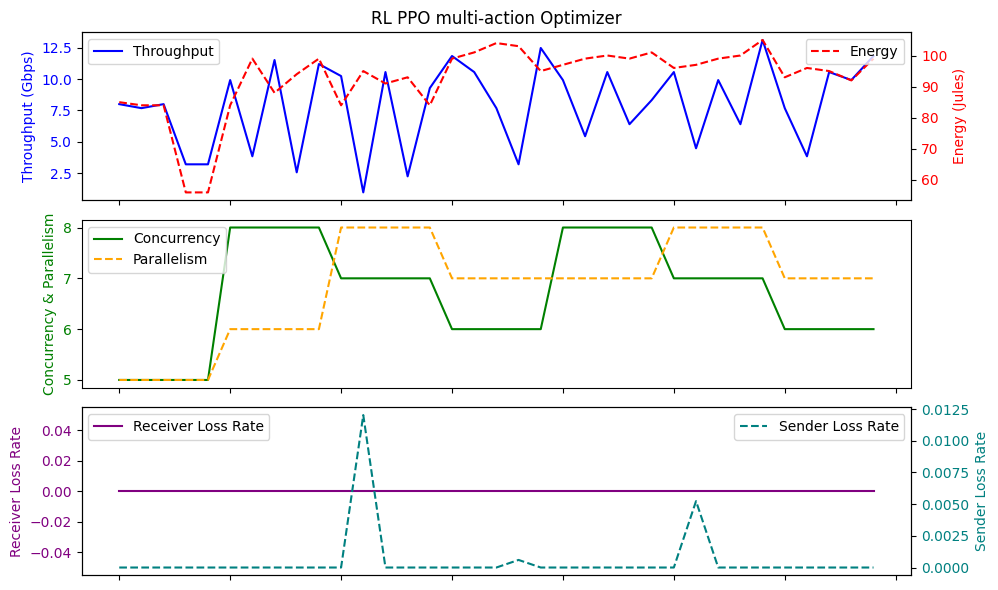

Average Throughput: 7.917714285714286
Total Energy: 3246.0
Total loss rate: 0.017868460375575945
       Throughput  LossRate       Score        RTT      Energy   SenderLR
count   35.000000      35.0   35.000000  35.000000   35.000000  35.000000
mean     8.054857       0.0   -2.085714  34.522857   95.714286   0.063447
std      3.456528       0.0   30.995608   4.164845    7.006600   0.370188
min      0.960000       0.0 -180.000000  32.500000   80.000000   0.000000
25%      5.600000       0.0    2.000000  32.700000   92.000000   0.000000
50%      8.640000       0.0    3.000000  33.000000   97.000000   0.000000
75%     10.560000       0.0    4.500000  34.000000  100.000000   0.000000
max     15.360000       0.0    5.000000  49.500000  109.000000   2.190872
Episode reward: 6.840000000000003
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-5.0639999999999965, 3.456000000000003, -1.9200000000000017, 13.63999999999

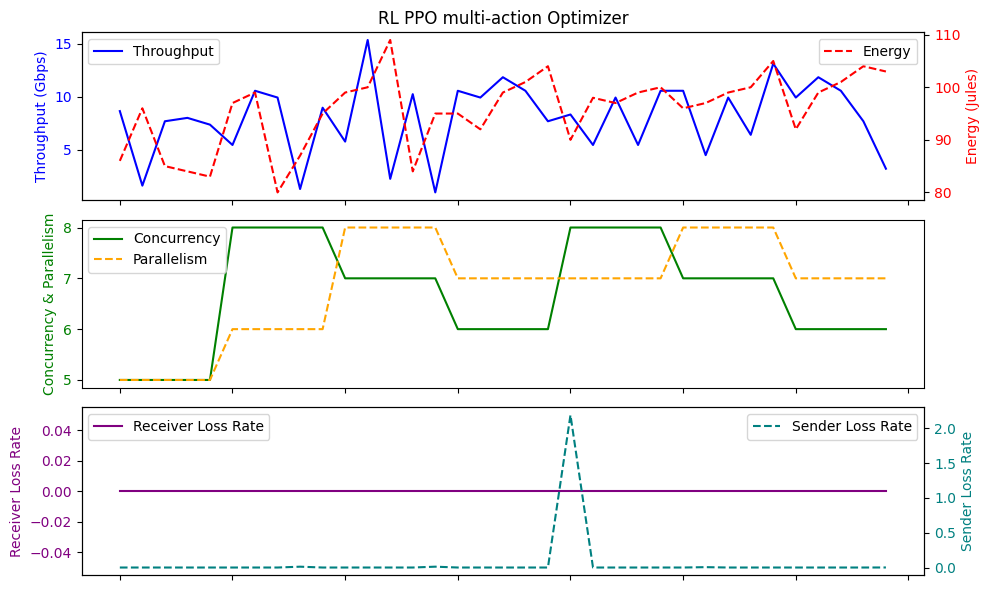

Average Throughput: 8.054857142857143
Total Energy: 3350.0
Total loss rate: 2.2206424116095795
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.246857       0.0   3.228571  34.860000   93.914286   0.001483
std      3.583669       0.0   1.591997   4.155945    9.127758   0.004458
min      0.960000       0.0   0.000000  32.500000   61.000000   0.000000
25%      6.080000       0.0   2.500000  32.800000   89.000000   0.000000
50%      9.920000       0.0   4.000000  33.200000   95.000000   0.000000
75%     10.560000       0.0   4.500000  34.300000   99.000000   0.000000
max     13.440000       0.0   5.000000  49.500000  113.000000   0.017043
Episode reward: 10.112
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-7.3679999999999986, 9.215999999999998, -12.672000000000002, 20.936000000000003, 0.06399999999999

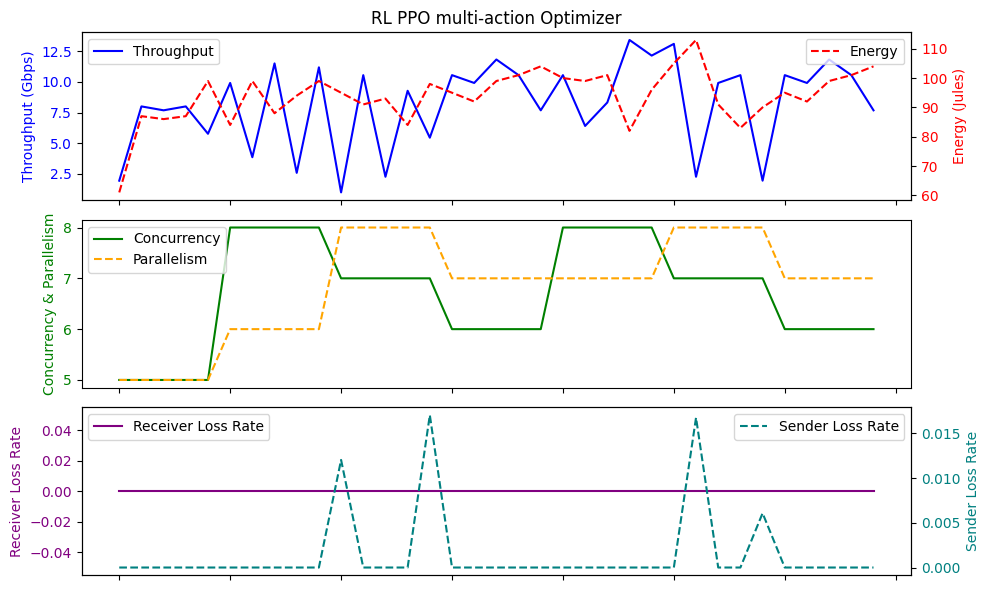

Average Throughput: 8.246857142857143
Total Energy: 3287.0
Total loss rate: 0.051901329459446054
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     7.899429       0.0   2.857143  34.205714   95.114286   0.004712
std      3.282486       0.0   2.439176   3.668943    6.973780   0.022884
min      0.960000       0.0  -8.000000  32.500000   80.000000   0.000000
25%      5.600000       0.0   2.000000  32.700000   89.500000   0.000000
50%      8.000000       0.0   3.000000  32.900000   97.000000   0.000000
75%     10.400000       0.0   5.000000  33.600000   99.000000   0.000000
max     15.360000       0.0   5.000000  49.500000  109.000000   0.135158
Episode reward: 5.304000000000002
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [2.2319999999999993, -1.1519999999999904, -4.608000000000004, 12.679999999999996, -8.

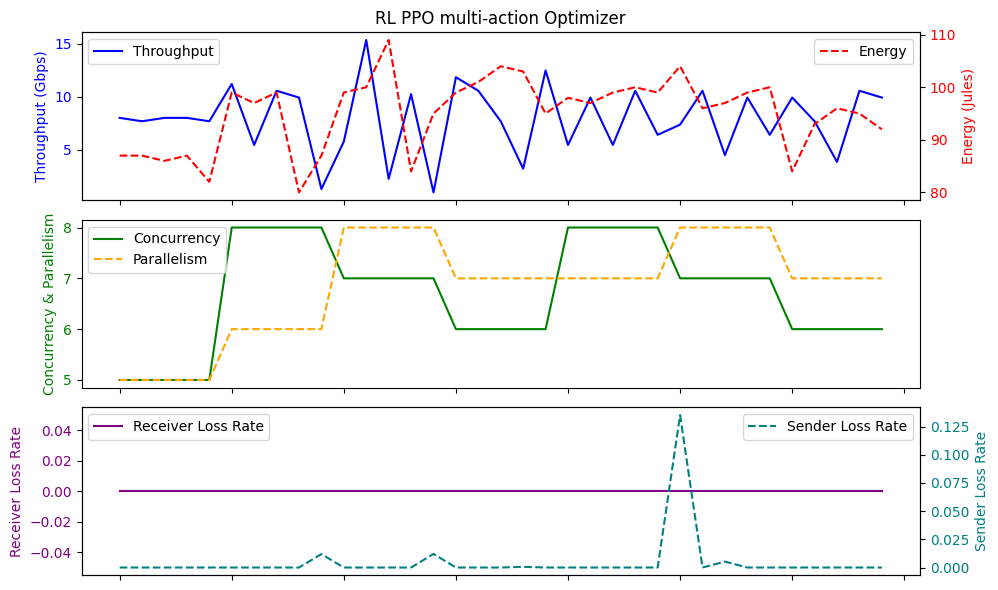

Average Throughput: 7.899428571428572
Total Energy: 3329.0
Total loss rate: 0.16492835823767532
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.365714       0.0   3.000000  34.017143   94.285714   0.004515
std      3.003012       0.0   2.376354   3.043458    6.626912   0.022927
min      2.240000       0.0  -8.000000  32.500000   82.000000   0.000000
25%      6.880000       0.0   2.000000  32.900000   87.500000   0.000000
50%      8.000000       0.0   3.000000  33.200000   96.000000   0.000000
75%     10.560000       0.0   4.500000  33.650000   99.000000   0.000000
max     13.440000       0.0   5.000000  49.500000  104.000000   0.135158
Episode reward: 8.376000000000005
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [3.0, -1.152000000000001, -0.7680000000000007, 6.528000000000006, 2.0559999999999974, 

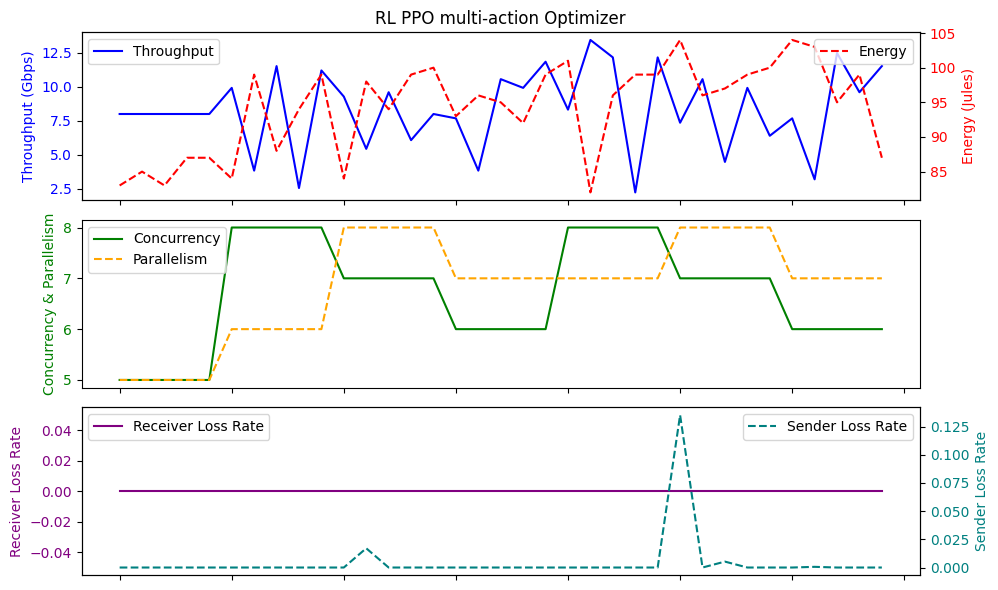

Average Throughput: 8.365714285714288
Total Energy: 3300.0
Total loss rate: 0.15803904864576565
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.265143       0.0   3.257143  34.914286   93.057143   0.001479
std      3.077647       0.0   1.441871   4.750674    7.104029   0.004449
min      1.280000       0.0   0.000000  32.500000   80.000000   0.000000
25%      7.040000       0.0   3.000000  32.900000   87.000000   0.000000
50%      9.280000       0.0   3.000000  33.200000   93.000000   0.000000
75%     10.560000       0.0   4.000000  33.900000   98.000000   0.000000
max     13.440000       0.0   5.000000  49.600000  113.000000   0.017043
Episode reward: 10.112
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-0.07200000000000273, -1.5359999999999907, 1.1519999999999904, 5.760000000000005, 4.871999999999

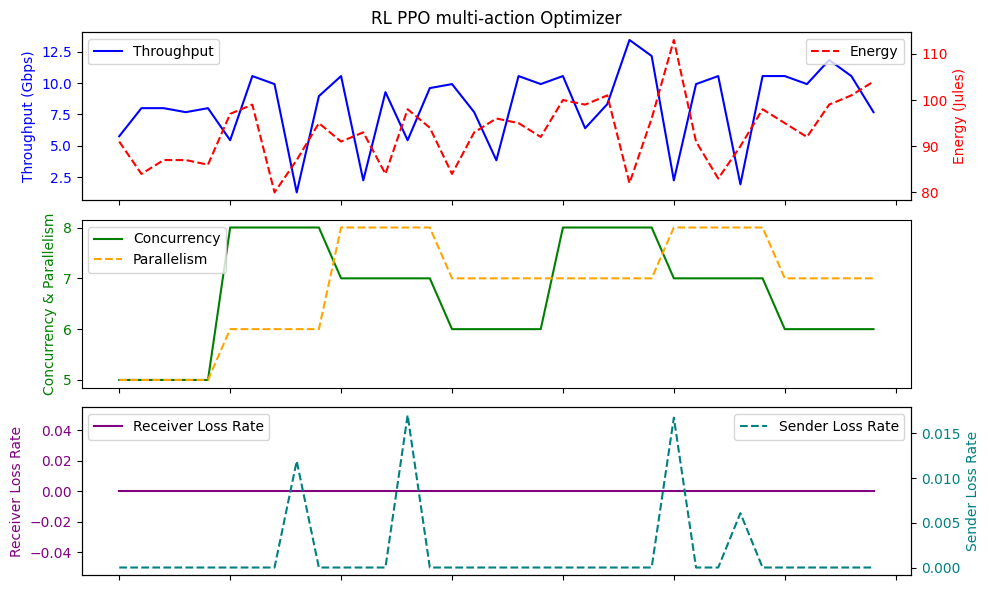

Average Throughput: 8.265142857142857
Total Energy: 3257.0
Total loss rate: 0.0517720915822008
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.329143       0.0   2.971429  34.534286   94.228571   0.004712
std      3.040234       0.0   2.345029   4.245686    6.092839   0.022922
min      2.240000       0.0  -8.000000  32.500000   82.000000   0.000000
25%      6.240000       0.0   2.000000  32.750000   90.000000   0.000000
50%      8.960000       0.0   3.000000  33.100000   96.000000   0.000000
75%     10.560000       0.0   4.000000  33.750000   99.000000   0.000000
max     13.440000       0.0   5.000000  49.500000  104.000000   0.135158
Episode reward: 9.344
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-1.223999999999993, 3.071999999999992, -0.7680000000000007, 6.528000000000006, 2.0559999999999974,

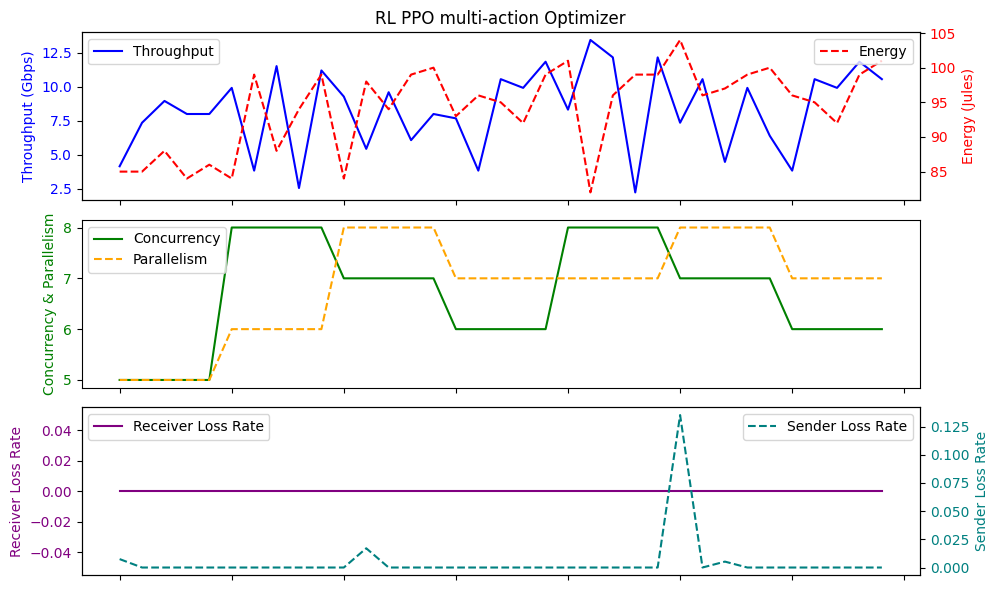

Average Throughput: 8.329142857142859
Total Energy: 3298.0
Total loss rate: 0.164904331975692
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     7.990857       0.0   3.057143  33.708571   94.285714   0.000971
std      3.769139       0.0   1.513524   1.842851    7.555954   0.002964
min      0.960000       0.0   0.000000  32.500000   80.000000   0.000000
25%      5.760000       0.0   2.000000  32.800000   87.000000   0.000000
50%      8.320000       0.0   3.000000  33.100000   96.000000   0.000000
75%     10.560000       0.0   4.000000  33.550000   99.500000   0.000000
max     15.360000       0.0   5.000000  40.200000  109.000000   0.012031
Episode reward: 9.152000000000001
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-8.136, 4.224000000000004, 0.38400000000000034, 11.904, 1.7999999999999936, -8.328, 7.3

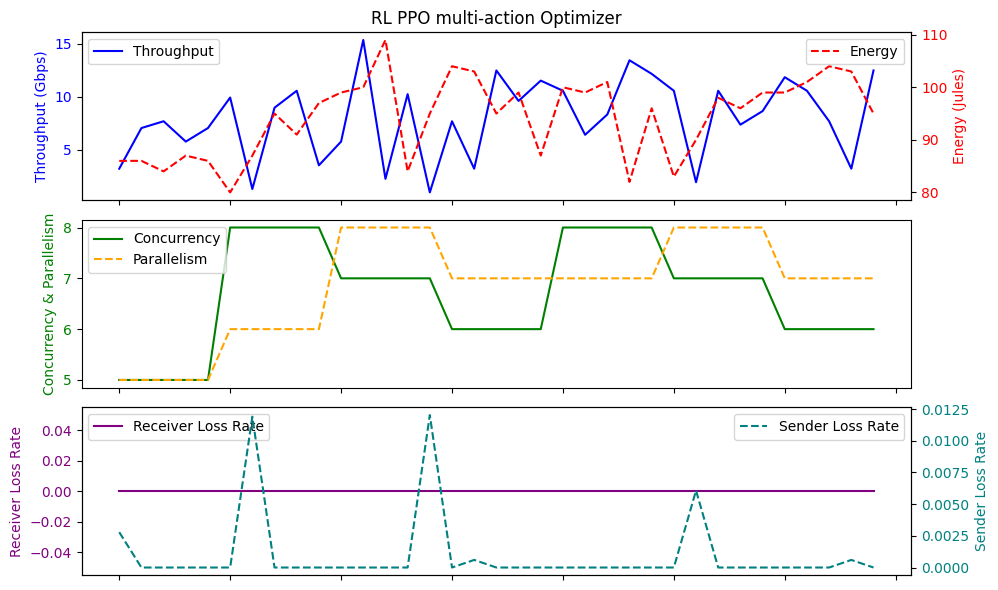

Average Throughput: 7.990857142857143
Total Energy: 3300.0
Total loss rate: 0.03399480054591641
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     7.963429       0.0   3.114286  34.457143   95.000000   0.001156
std      3.824102       0.0   1.567528   3.149350    7.120806   0.004064
min      0.960000       0.0   0.000000  32.500000   82.000000   0.000000
25%      4.000000       0.0   1.500000  32.950000   90.500000   0.000000
50%      9.280000       0.0   3.000000  33.200000   96.000000   0.000000
75%     10.880000       0.0   4.000000  34.200000   99.000000   0.000000
max     13.440000       0.0   5.000000  49.500000  113.000000   0.017043
Episode reward: 8.376000000000005
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-9.288, 11.136, -7.679999999999996, 15.175999999999997, 0.32000000000000206, -9.35199

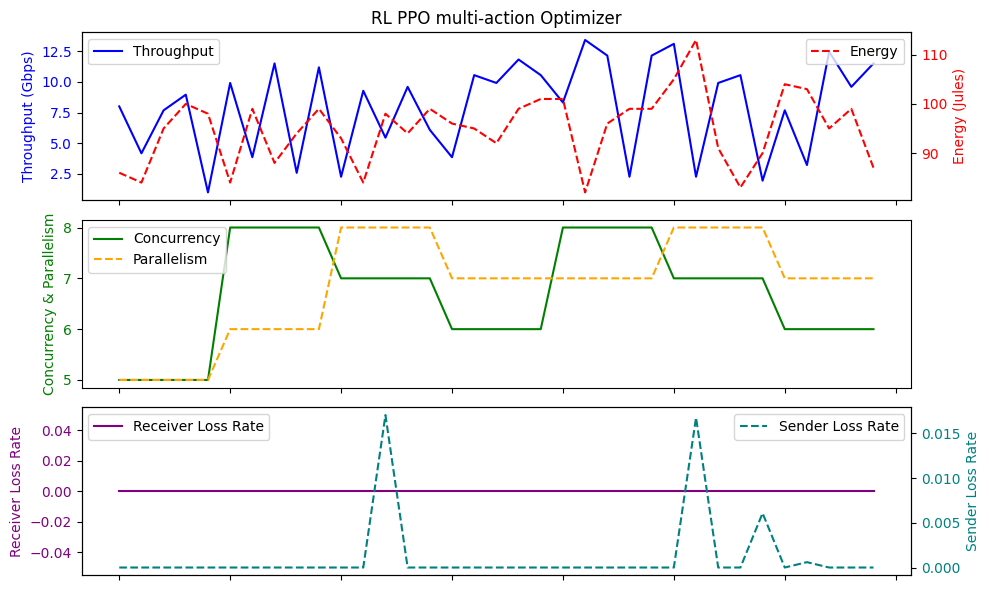

Average Throughput: 7.963428571428572
Total Energy: 3325.0
Total loss rate: 0.040469343321306195
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     7.972571       0.0   2.857143  34.528571   94.485714   0.004355
std      3.029203       0.0   2.378122   4.059018    6.103863   0.022865
min      0.960000       0.0  -8.000000  32.500000   84.000000   0.000000
25%      5.920000       0.0   2.000000  32.800000   91.500000   0.000000
50%      8.000000       0.0   3.000000  33.100000   96.000000   0.000000
75%     10.560000       0.0   4.500000  34.000000   99.000000   0.000000
max     11.840000       0.0   5.000000  49.500000  104.000000   0.135158
Episode reward: 7.608000000000004
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-1.9919999999999938, 3.8399999999999928, -6.9119999999999955, 15.175999999999997, -9

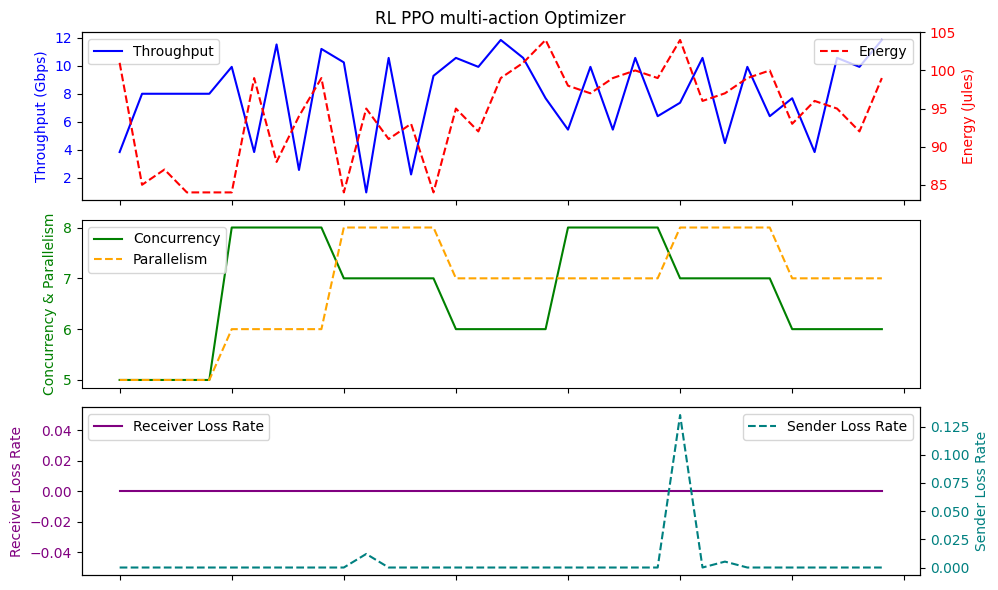

Average Throughput: 7.9725714285714275
Total Energy: 3307.0
Total loss rate: 0.1524279152261892
       Throughput  LossRate       Score        RTT      Energy   SenderLR
count   35.000000      35.0   35.000000  35.000000   35.000000  35.000000
mean     7.899429       0.0   -2.142857  34.574286   93.200000   0.063274
std      2.951042       0.0   30.974508   4.029986    6.854797   0.370219
min      1.920000       0.0 -180.000000  32.500000   72.000000   0.000000
25%      5.440000       0.0    2.000000  32.750000   89.000000   0.000000
50%      8.320000       0.0    3.000000  33.300000   94.000000   0.000000
75%     10.560000       0.0    4.000000  34.150000   98.500000   0.000000
max     11.840000       0.0    5.000000  49.500000  104.000000   2.190872
Episode reward: 6.840000000000003
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-3.9119999999999955, 8.447999999999997, -4.992000000000004, 5.76000000000000

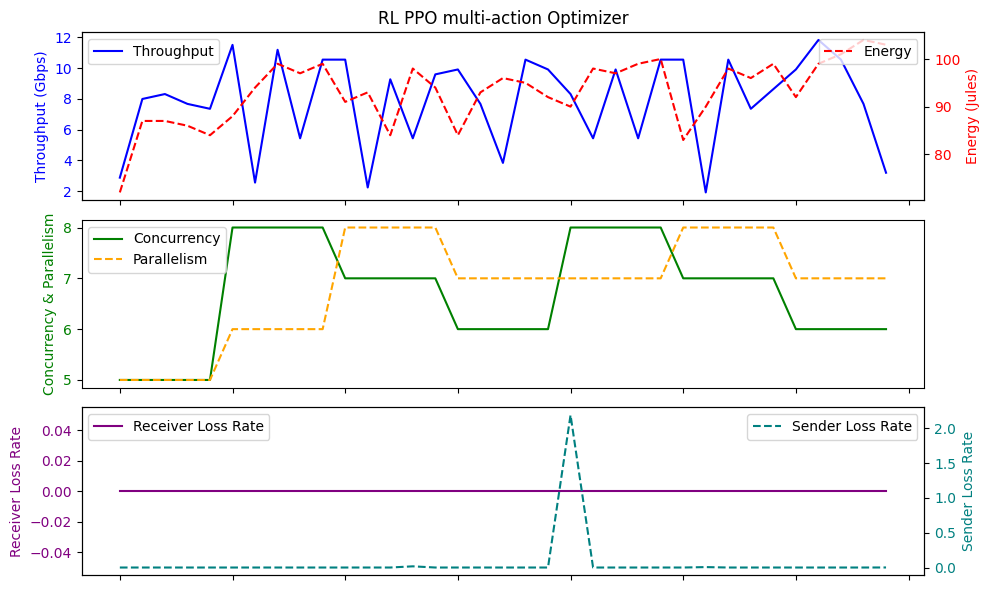

Average Throughput: 7.899428571428571
Total Energy: 3262.0
Total loss rate: 2.2145891191795815
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     7.872000       0.0   3.114286  34.274286   92.285714   0.001361
std      3.478861       0.0   1.567528   3.656207    6.537545   0.004019
min      0.960000       0.0   0.000000  32.500000   80.000000   0.000000
25%      6.400000       0.0   2.000000  32.900000   87.000000   0.000000
50%      8.320000       0.0   3.000000  33.100000   93.000000   0.000000
75%     10.560000       0.0   4.000000  33.400000   97.500000   0.000000
max     13.440000       0.0   5.000000  49.500000  104.000000   0.017043
Episode reward: 5.304000000000004
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [1.847999999999999, -5.7599999999999945, -6.912000000000008, 19.20000000000001, 1.28799

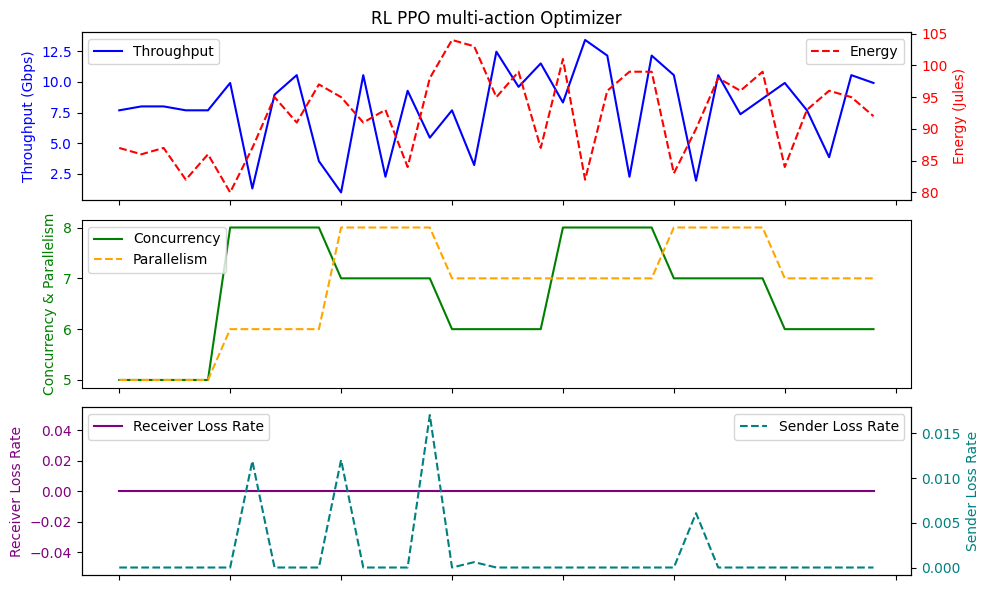

Average Throughput: 7.872000000000001
Total Energy: 3230.0
Total loss rate: 0.047649192731394355
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.054857       0.0   3.028571  33.634286   95.428571   0.001202
std      3.976769       0.0   1.599370   1.864363    8.586192   0.003900
min      0.960000       0.0   0.000000  32.500000   80.000000   0.000000
25%      5.280000       0.0   2.000000  32.800000   87.000000   0.000000
50%      8.320000       0.0   3.000000  33.000000   99.000000   0.000000
75%     10.880000       0.0   4.000000  33.200000  100.500000   0.000000
max     15.360000       0.0   5.000000  40.200000  113.000000   0.016753
Episode reward: 8.376000000000005
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-8.52, 9.600000000000009, 1.152000000000001, 6.143999999999995, -2.304000000000002, 

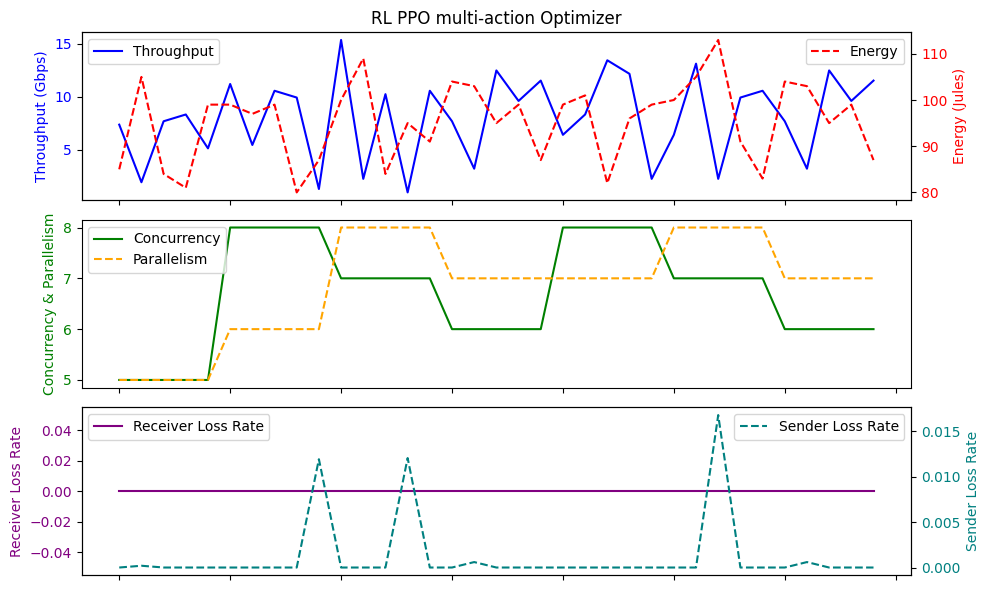

Average Throughput: 8.054857142857143
Total Energy: 3340.0
Total loss rate: 0.04207759877920984
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.109714       0.0   3.200000  34.142857   94.171429   0.001329
std      3.613678       0.0   1.623359   3.594382    7.441876   0.003959
min      0.960000       0.0   0.000000  32.500000   80.000000   0.000000
25%      5.920000       0.0   2.000000  32.800000   87.000000   0.000000
50%      8.320000       0.0   4.000000  33.000000   95.000000   0.000000
75%     10.560000       0.0   4.500000  33.400000   99.000000   0.000000
max     13.440000       0.0   5.000000  49.500000  113.000000   0.016753
Episode reward: 8.376000000000005
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [2.2319999999999993, -1.1519999999999904, -6.1440000000000055, 12.672, 2.0559999999999

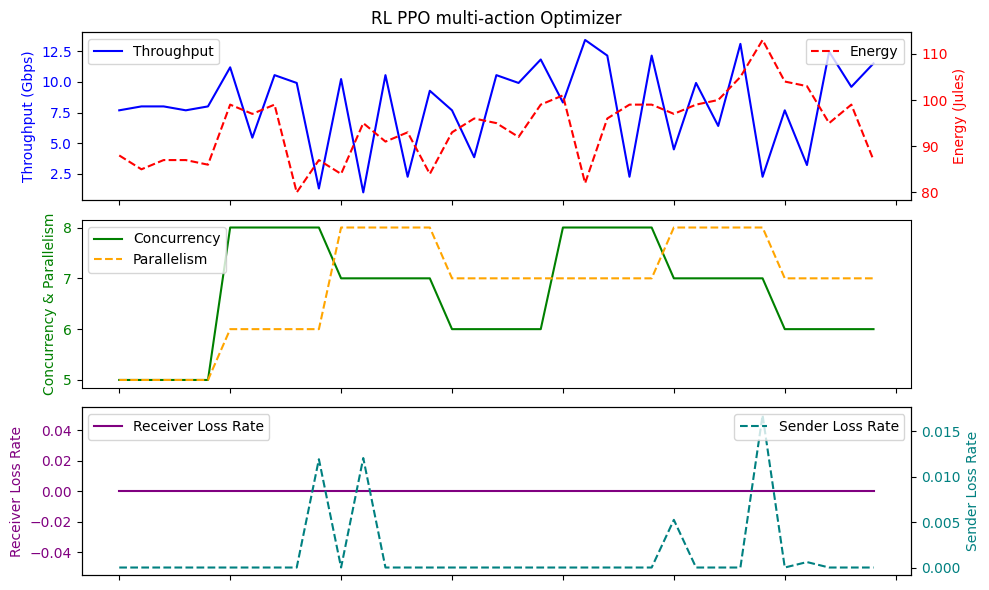

Average Throughput: 8.109714285714286
Total Energy: 3296.0
Total loss rate: 0.04652263575130418
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.036571       0.0   2.971429  34.008571   95.342857   0.001392
std      3.767769       0.0   1.464998   2.047864    7.549612   0.004174
min      1.920000       0.0   0.000000  32.700000   82.000000   0.000000
25%      4.640000       0.0   1.000000  32.900000   89.500000   0.000000
50%      9.280000       0.0   3.000000  33.200000   96.000000   0.000000
75%     11.360000       0.0   4.000000  33.950000   99.500000   0.000000
max     13.440000       0.0   5.000000  40.200000  113.000000   0.017043
Episode reward: 8.376000000000005
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-8.904, 10.751999999999999, -2.304000000000002, 8.832000000000008, 1.2879999999999967

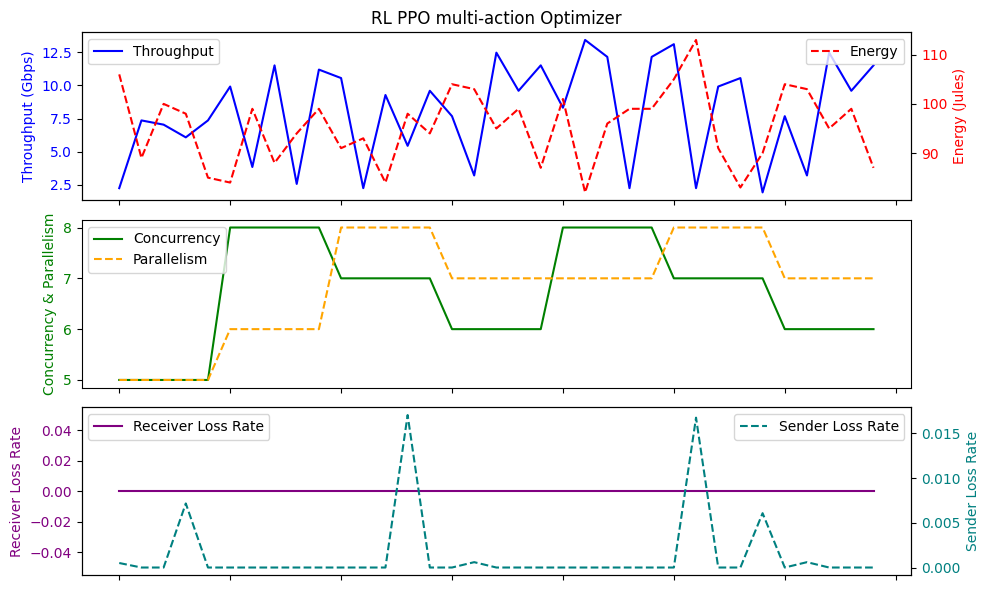

Average Throughput: 8.03657142857143
Total Energy: 3337.0
Total loss rate: 0.04873435813584606
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     7.872000       0.0   3.142857  34.091429   93.742857   0.001336
std      3.560156       0.0   1.611409   3.957820    7.224724   0.003991
min      0.960000       0.0   0.000000  32.500000   80.000000   0.000000
25%      5.440000       0.0   2.000000  32.700000   88.500000   0.000000
50%      8.960000       0.0   3.000000  32.800000   95.000000   0.000000
75%     10.560000       0.0   5.000000  33.250000   98.500000   0.000000
max     15.360000       0.0   5.000000  49.500000  113.000000   0.016753
Episode reward: 7.608000000000004
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [1.0799999999999983, -4.991999999999994, 6.1440000000000055, 7.111999999999989, -9.0320

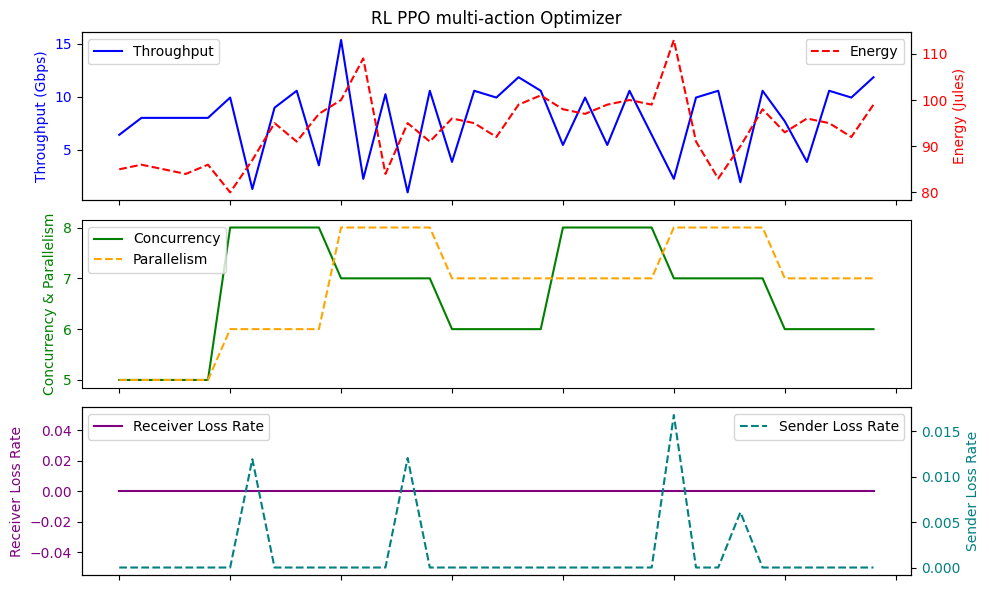

Average Throughput: 7.872
Total Energy: 3281.0
Total loss rate: 0.04675980553792011
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     7.570286       0.0   2.971429  34.311429   93.971429   0.000996
std      3.588588       0.0   1.524037   3.940422    7.176291   0.003546
min      0.960000       0.0   0.000000  32.500000   83.000000   0.000000
25%      4.640000       0.0   2.000000  32.700000   89.000000   0.000000
50%      7.680000       0.0   3.000000  33.100000   95.000000   0.000000
75%     10.400000       0.0   4.000000  33.750000   99.000000   0.000000
max     15.360000       0.0   5.000000  49.500000  113.000000   0.016753
Episode reward: 7.608000000000004
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-5.831999999999997, 7.679999999999996, -5.375999999999994, 8.831999999999997, -4.992000000000004,

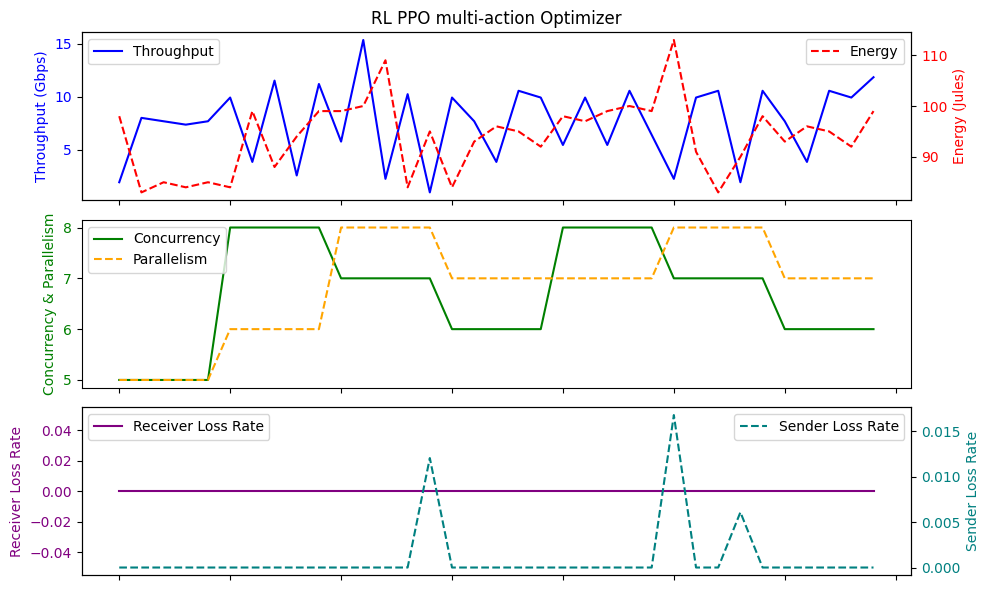

Average Throughput: 7.570285714285713
Total Energy: 3289.0
Total loss rate: 0.034858209901729734
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     7.890286       0.0   3.028571  33.808571   94.428571   0.000700
std      3.052549       0.0   1.360919   1.900986    6.590036   0.003024
min      1.920000       0.0   1.000000  32.600000   80.000000   0.000000
25%      5.440000       0.0   2.000000  32.700000   88.000000   0.000000
50%      7.680000       0.0   3.000000  33.000000   97.000000   0.000000
75%     10.560000       0.0   4.000000  33.950000   99.000000   0.000000
max     12.480000       0.0   6.000000  40.200000  104.000000   0.017043
Episode reward: 8.376000000000005
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-1.223999999999993, 5.7599999999999945, -10.367999999999999, 14.208000000000002, -8.

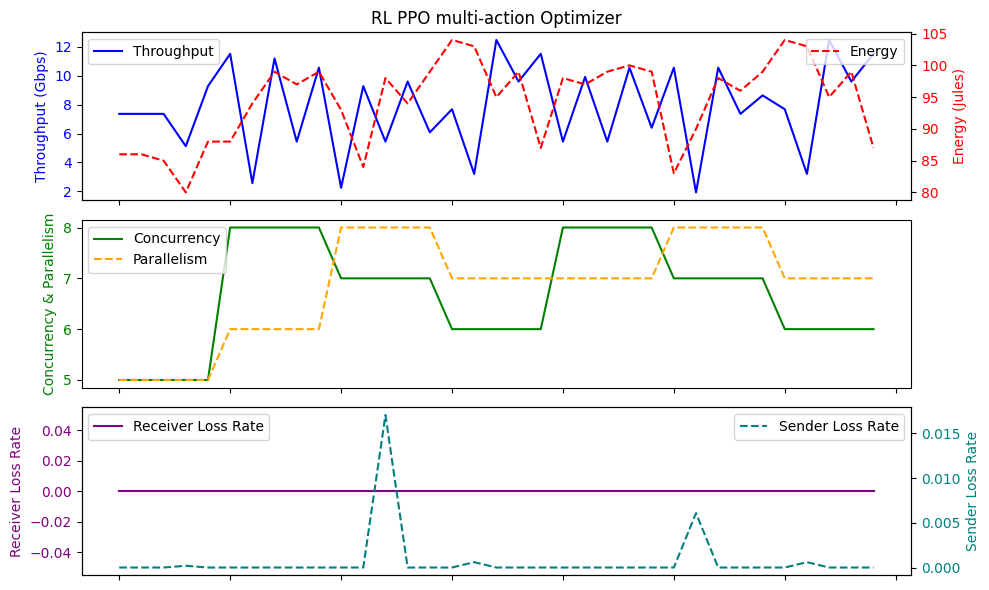

Average Throughput: 7.890285714285714
Total Energy: 3305.0
Total loss rate: 0.024510872244561253
       Throughput  LossRate       Score        RTT      Energy   SenderLR
count   35.000000      35.0   35.000000  35.000000   35.000000  35.000000
mean     7.798857       0.0   -2.828571  34.565714   93.800000   0.074587
std      3.368805       0.0   31.152835   3.793178    6.689764   0.374408
min      0.960000       0.0 -180.000000  32.500000   83.000000   0.000000
25%      5.440000       0.0    2.000000  32.850000   87.500000   0.000000
50%      8.000000       0.0    3.000000  33.200000   95.000000   0.000000
75%     10.400000       0.0    4.000000  33.950000   99.000000   0.000000
max     15.360000       0.0    5.000000  49.500000  109.000000   2.190872
Episode reward: 5.304000000000002
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [1.0799999999999983, -4.608000000000004, 5.760000000000016, 6.14399999999999

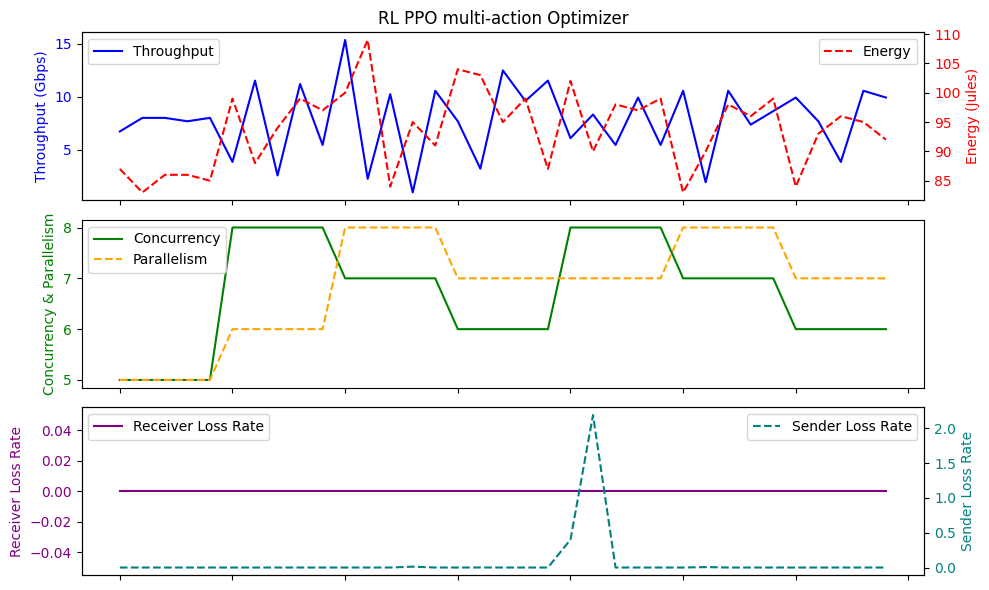

Average Throughput: 7.798857142857144
Total Energy: 3283.0
Total loss rate: 2.6105508591093267
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.082286       0.0   2.771429  34.045714   95.914286   0.004559
std      3.214408       0.0   2.301990   3.045763    6.237323   0.022920
min      0.960000       0.0  -8.000000  32.500000   81.000000   0.000000
25%      6.240000       0.0   2.000000  32.850000   94.000000   0.000000
50%      8.320000       0.0   3.000000  33.200000   98.000000   0.000000
75%     10.560000       0.0   4.000000  33.850000   99.500000   0.000000
max     13.440000       0.0   5.000000  49.500000  106.000000   0.135158
Episode reward: 7.608000000000004
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-13.512000000000006, 15.360000000000005, -0.7680000000000007, 8.072000000000003, 1.023

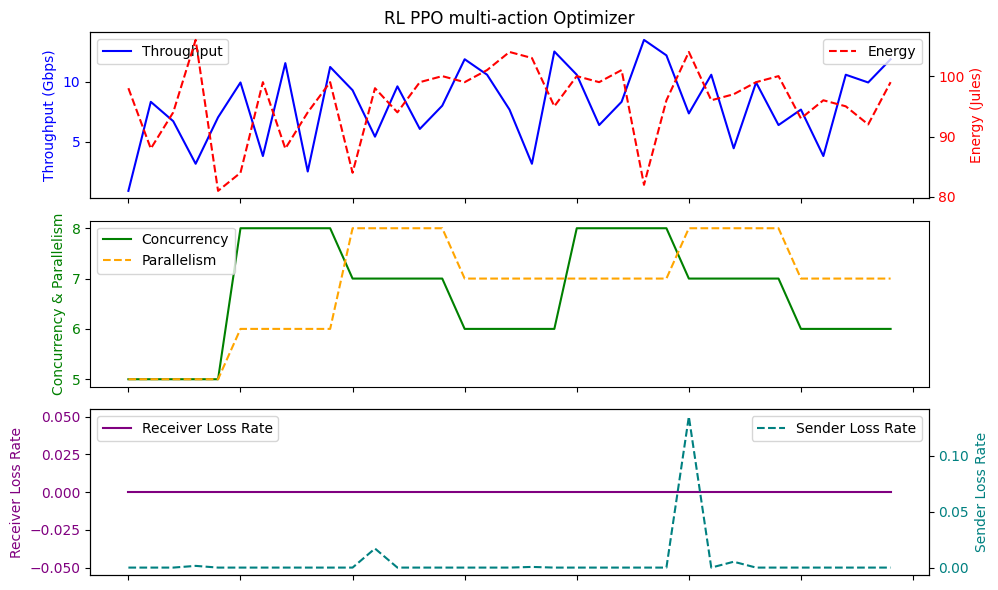

Average Throughput: 8.082285714285714
Total Energy: 3357.0
Total loss rate: 0.15956603657019813
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     7.634286       0.0   2.942857  34.048571   95.457143   0.001101
std      3.716559       0.0   1.493965   3.109697    6.921165   0.003555
min      0.960000       0.0   0.000000  32.500000   83.000000   0.000000
25%      5.440000       0.0   2.000000  32.700000   90.500000   0.000000
50%      7.680000       0.0   3.000000  33.100000   97.000000   0.000000
75%     10.560000       0.0   4.000000  33.750000   99.000000   0.000000
max     15.360000       0.0   5.000000  49.500000  113.000000   0.016753
Episode reward: 7.608000000000004
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-8.904, 13.440000000000001, -8.063999999999997, 11.904, -8.064000000000007, -3.071999

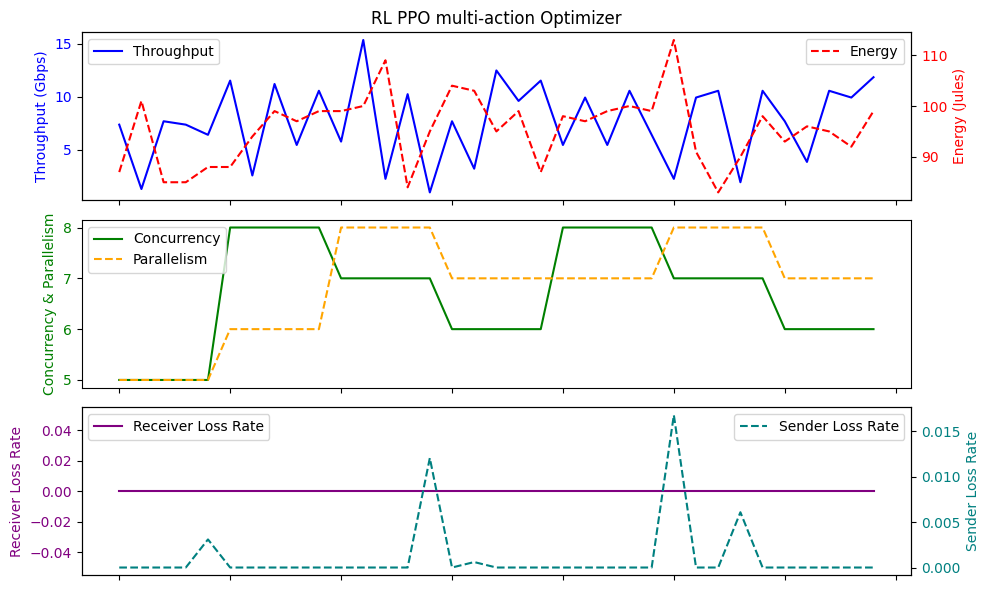

Average Throughput: 7.634285714285714
Total Energy: 3341.0
Total loss rate: 0.03854373923551105
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     7.890286       0.0   3.085714  33.620000   94.142857   0.000892
std      3.919140       0.0   1.704172   1.864656    9.471763   0.002952
min      0.960000       0.0   0.000000  32.500000   60.000000   0.000000
25%      5.280000       0.0   2.000000  32.750000   88.500000   0.000000
50%      8.320000       0.0   3.000000  33.000000   97.000000   0.000000
75%     10.560000       0.0   4.000000  33.400000   99.500000   0.000000
max     15.360000       0.0   8.000000  40.200000  109.000000   0.012031
Episode reward: 8.376000000000005
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-4.679999999999996, 3.0720000000000027, -1.9200000000000017, 12.679999999999996, -3.0

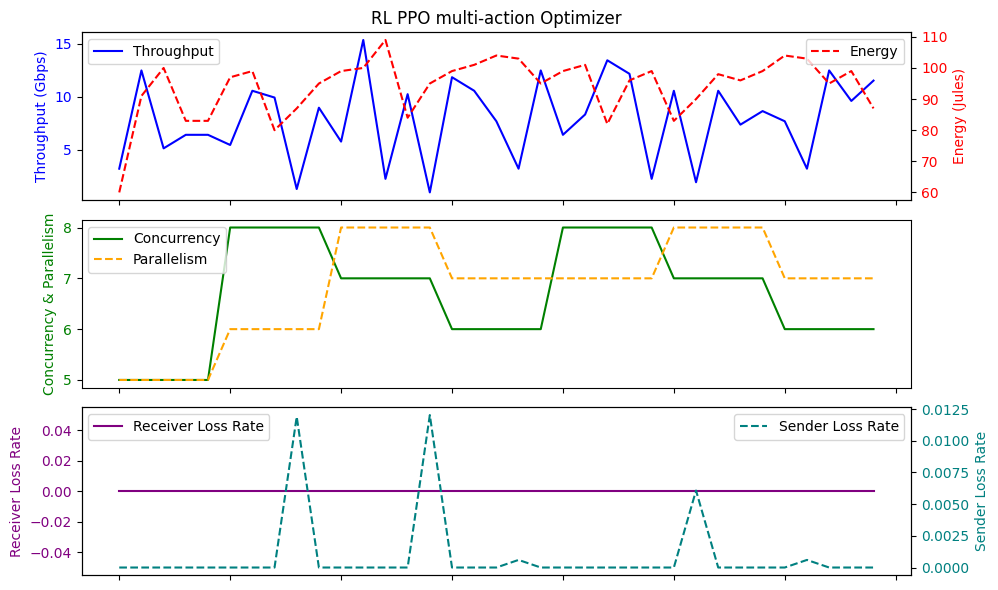

Average Throughput: 7.890285714285714
Total Energy: 3295.0
Total loss rate: 0.031204920548973808
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.018286       0.0   3.114286  33.945714   95.257143   0.001346
std      3.657583       0.0   1.676331   3.253084    8.360773   0.003955
min      0.960000       0.0   0.000000  32.500000   80.000000   0.000000
25%      5.920000       0.0   2.000000  32.750000   87.000000   0.000000
50%      8.000000       0.0   3.000000  32.900000   97.000000   0.000000
75%     10.560000       0.0   5.000000  33.200000  100.500000   0.000000
max     15.360000       0.0   5.000000  49.500000  113.000000   0.016753
Episode reward: 8.376000000000005
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [1.847999999999999, -5.7599999999999945, 6.1440000000000055, 4.607999999999993, 1.151

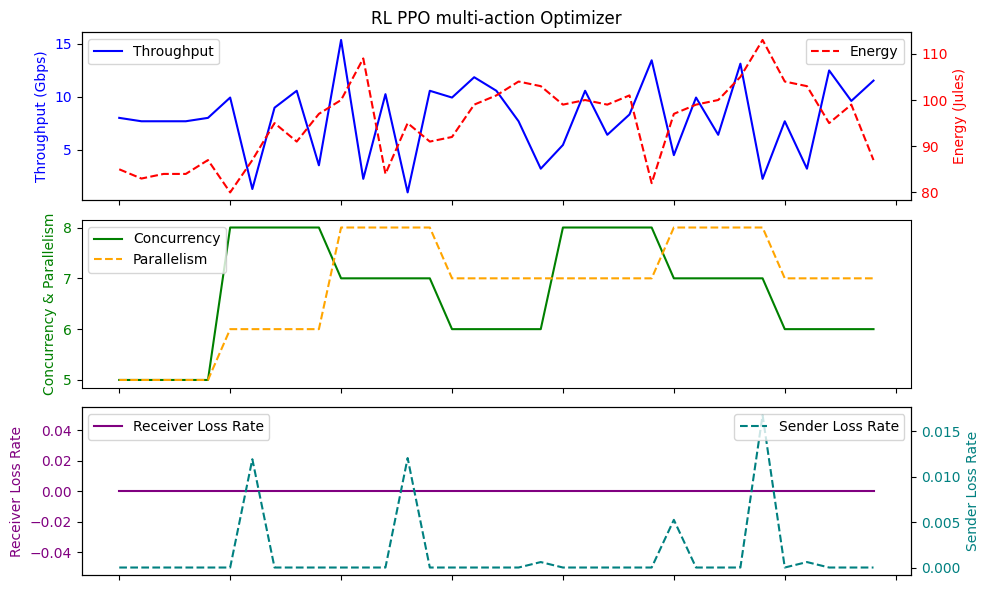

Average Throughput: 8.018285714285716
Total Energy: 3334.0
Total loss rate: 0.047121483126599945
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     7.753143       0.0   2.971429  34.111429   93.314286   0.001189
std      3.472697       0.0   1.464998   2.833806    9.706794   0.003615
min      0.960000       0.0   0.000000  32.500000   57.000000   0.000000
25%      5.440000       0.0   2.000000  32.800000   87.000000   0.000000
50%      8.320000       0.0   3.000000  33.000000   95.000000   0.000000
75%     10.560000       0.0   4.000000  33.750000   99.000000   0.000000
max     12.480000       0.0   5.000000  46.300000  113.000000   0.016753
Episode reward: 8.376000000000005
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-6.599999999999998, 11.136, -9.599999999999998, 13.440000000000001, -4.6080000000000

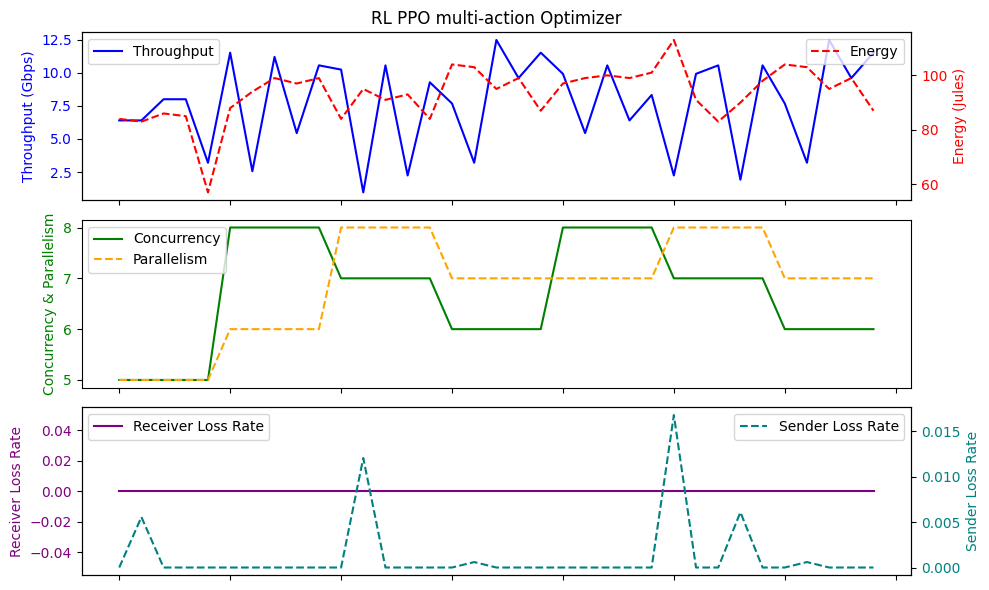

Average Throughput: 7.753142857142856
Total Energy: 3266.0
Total loss rate: 0.04160548520727934
       Throughput  LossRate       Score        RTT      Energy   SenderLR
count   35.000000      35.0   35.000000  35.000000   35.000000  35.000000
mean     8.109714       0.0   -2.714286  34.585714   94.200000   0.074546
std      3.339043       0.0   31.173680   4.293096    6.502488   0.374416
min      0.960000       0.0 -180.000000  32.500000   82.000000   0.000000
25%      5.760000       0.0    2.000000  32.750000   90.500000   0.000000
50%      8.000000       0.0    3.000000  33.100000   95.000000   0.000000
75%     10.560000       0.0    4.000000  34.000000   99.000000   0.000000
max     15.360000       0.0    5.000000  49.500000  109.000000   2.190872
Episode reward: 7.608000000000004
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [0.695999999999998, 1.152000000000001, 0.384000000000011, 5.375999999999994, 

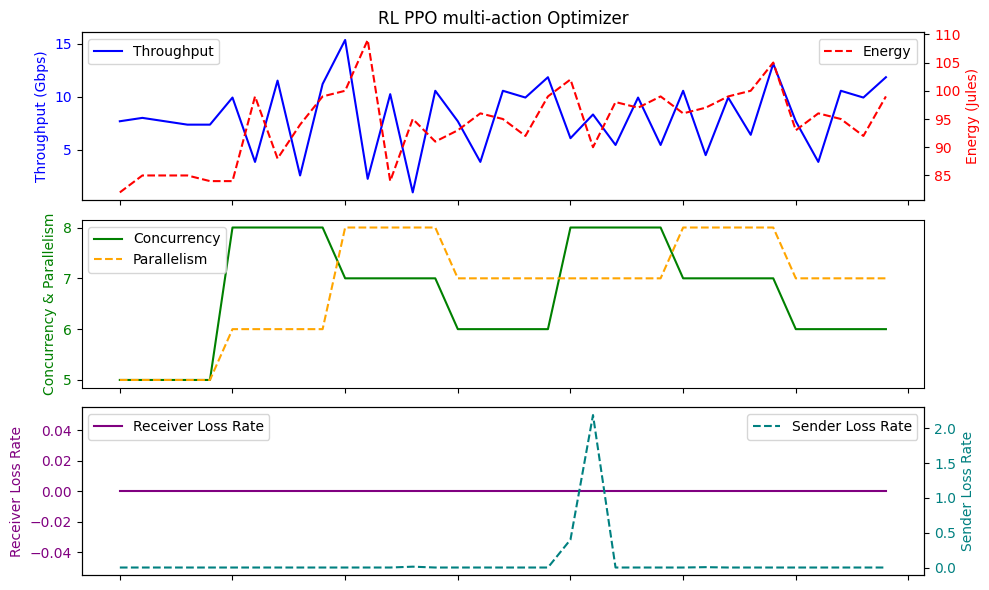

Average Throughput: 8.109714285714285
Total Energy: 3297.0
Total loss rate: 2.6091159945721194
       Throughput  LossRate       Score        RTT      Energy   SenderLR
count   35.000000      35.0   35.000000  35.000000   35.000000  35.000000
mean     7.424000       0.0   -3.028571  34.268571   92.371429   0.075072
std      3.464634       0.0   31.112212   3.144067   10.192517   0.374320
min      0.960000       0.0 -180.000000  32.600000   48.000000   0.000000
25%      5.120000       0.0    1.500000  32.900000   89.000000   0.000000
50%      8.000000       0.0    3.000000  33.200000   93.000000   0.000000
75%     10.400000       0.0    4.000000  33.950000   98.000000   0.000000
max     12.480000       0.0    5.000000  49.500000  113.000000   2.190872
Episode reward: 5.304000000000002
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-10.824000000000003, 15.360000000000005, -9.599999999999998, 13.4400000000000

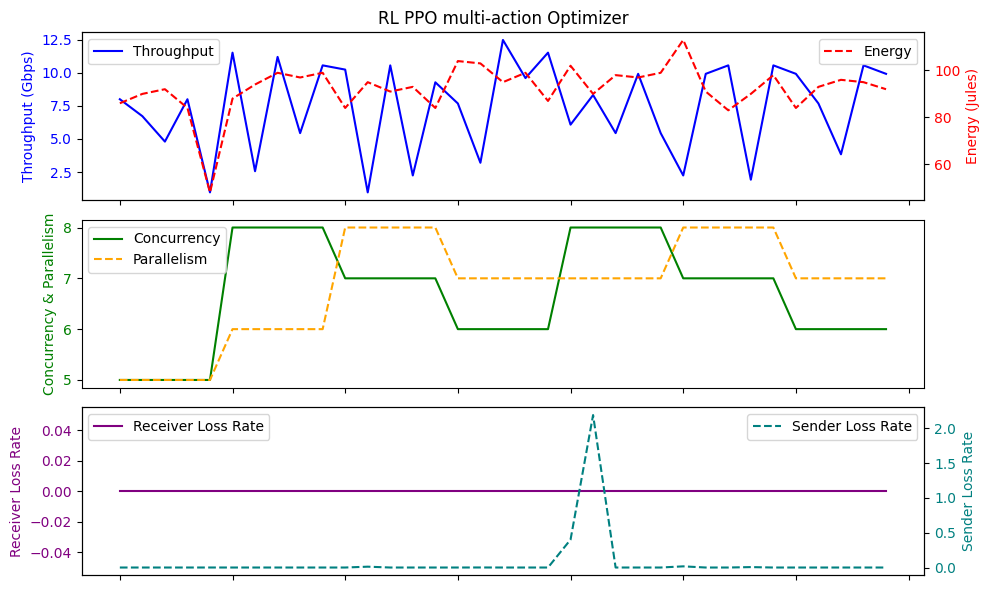

Average Throughput: 7.4239999999999995
Total Energy: 3233.0
Total loss rate: 2.62750900306967
       Throughput  LossRate       Score        RTT      Energy   SenderLR
count   35.000000      35.0   35.000000  35.000000   35.000000  35.000000
mean     8.155429       0.0   -2.657143  34.682857   96.400000   0.075168
std      2.882479       0.0   31.187236   4.134965    6.348691   0.374305
min      1.600000       0.0 -180.000000  32.500000   84.000000   0.000000
25%      6.080000       0.0    2.000000  32.800000   93.000000   0.000000
50%      8.320000       0.0    3.000000  33.100000   98.000000   0.000000
75%     10.560000       0.0    5.000000  34.250000   99.500000   0.000000
max     13.120000       0.0    5.000000  49.500000  113.000000   2.190872
Episode reward: 10.112
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-5.0639999999999965, 9.599999999999998, -3.456000000000003, 9.032000000000002, -12.872000

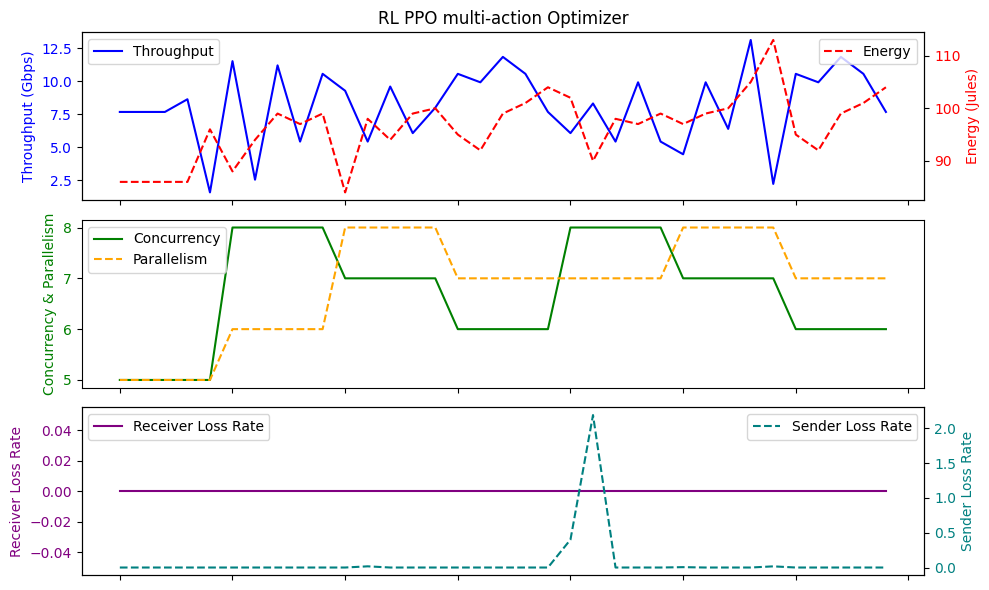

Average Throughput: 8.15542857142857
Total Energy: 3374.0
Total loss rate: 2.630880860355938
       Throughput  LossRate       Score        RTT      Energy   SenderLR
count   40.000000      40.0   40.000000  40.000000   40.000000  40.000000
mean     7.456000       0.0   -2.625000  34.112500   95.050000   0.069430
std      3.163027       0.0   29.106954   3.084468    6.706101   0.350339
min      0.960000       0.0 -180.000000  32.500000   80.000000   0.000000
25%      5.440000       0.0    1.750000  32.800000   90.000000   0.000000
50%      7.680000       0.0    3.000000  33.000000   97.000000   0.000000
75%      9.920000       0.0    4.000000  33.875000   99.250000   0.000150
max     13.440000       0.0    5.000000  49.500000  104.000000   2.190872
Episode reward: 7.9919999999999956
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3]), array([2, 1])],   8
rewards [-11.592000000000004, 9.98400000000001, -9.21600000000001, 19.20

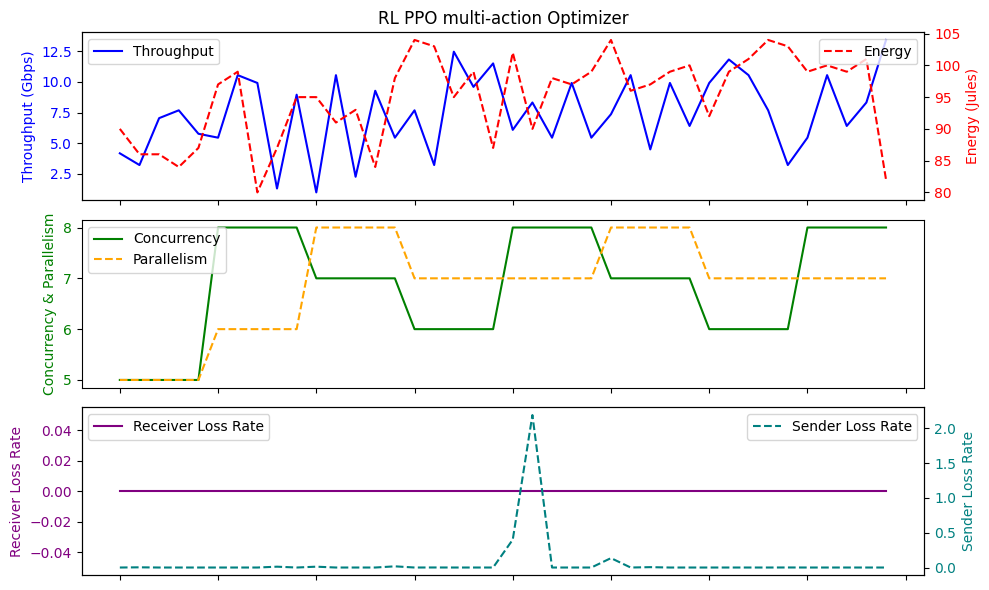

Average Throughput: 7.456
Total Energy: 3802.0
Total loss rate: 2.7772065867394695
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     7.835429       0.0   3.085714  34.865714   92.457143   0.000874
std      3.156763       0.0   1.401080   4.924127    6.950848   0.002955
min      0.960000       0.0   0.000000  32.500000   80.000000   0.000000
25%      6.400000       0.0   2.000000  32.750000   85.000000   0.000000
50%      8.320000       0.0   3.000000  33.100000   93.000000   0.000000
75%     10.400000       0.0   4.000000  33.650000   99.000000   0.000000
max     13.440000       0.0   5.000000  51.100000  104.000000   0.012031
Episode reward: 6.840000000000003
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-1.223999999999993, -0.38400000000000034, -3.456000000000003, 10.367999999999999, 2.68799999999999

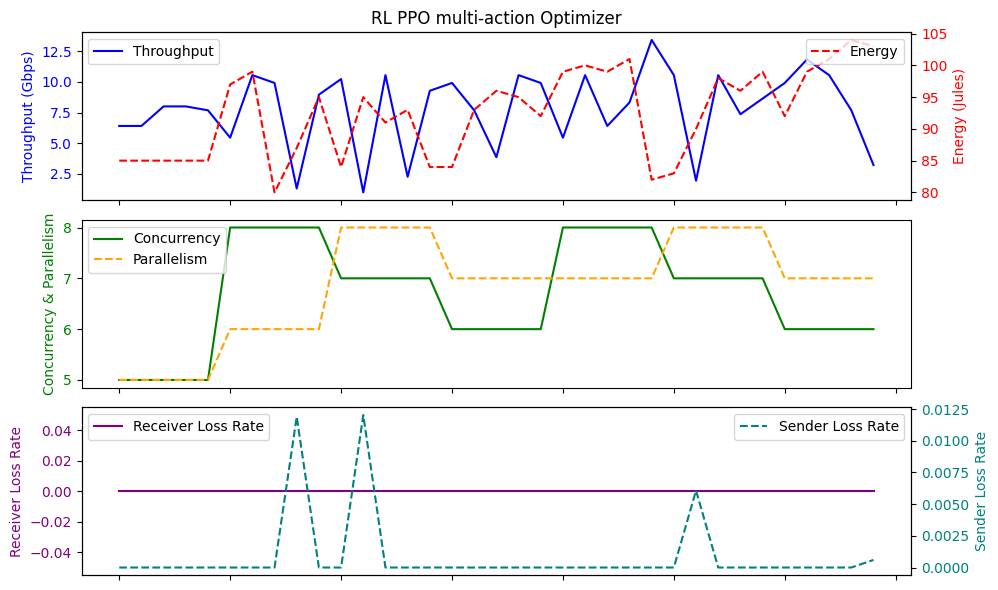

Average Throughput: 7.835428571428571
Total Energy: 3236.0
Total loss rate: 0.030606073173678035
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     7.753143       0.0   3.085714  34.437143   93.800000   0.001606
std      3.135429       0.0   1.541035   3.987044    7.932806   0.004469
min      1.280000       0.0   0.000000  32.500000   66.000000   0.000000
25%      5.440000       0.0   2.000000  32.700000   90.500000   0.000000
50%      8.960000       0.0   3.000000  33.000000   95.000000   0.000000
75%     10.560000       0.0   4.500000  34.150000   99.000000   0.000000
max     11.840000       0.0   5.000000  49.500000  113.000000   0.017043
Episode reward: 9.344
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-6.2159999999999975, 2.304000000000002, 4.991999999999994, 8.264000000000001, -9.032000000000002

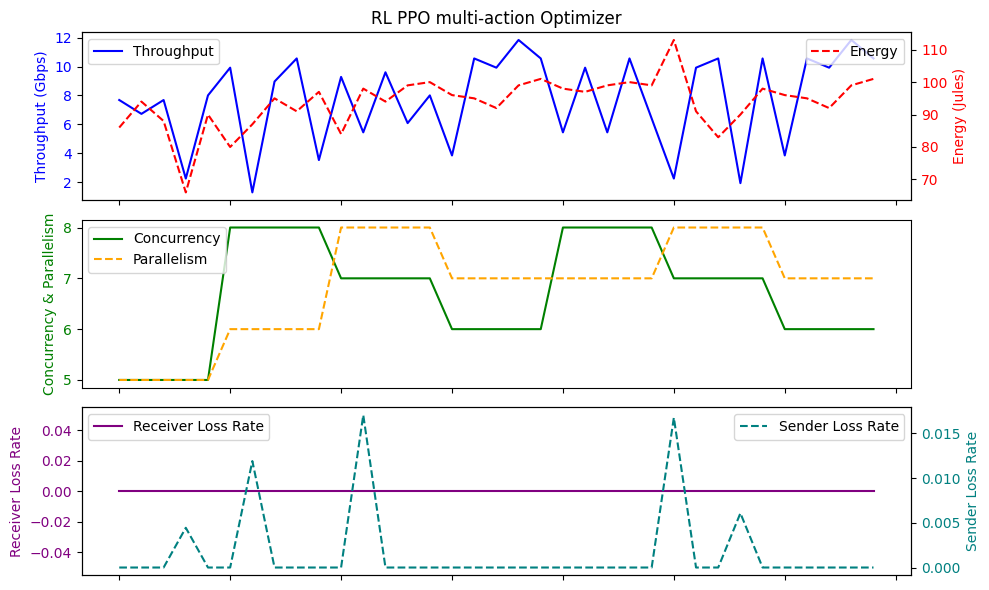

Average Throughput: 7.753142857142858
Total Energy: 3283.0
Total loss rate: 0.05621363663048356
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.393143       0.0   2.914286  33.482857   93.914286   0.004873
std      3.024939       0.0   2.356111   1.772583    7.188109   0.022943
min      1.280000       0.0  -8.000000  32.500000   80.000000   0.000000
25%      6.400000       0.0   2.500000  32.700000   87.000000   0.000000
50%      8.960000       0.0   3.000000  32.900000   95.000000   0.000000
75%     10.560000       0.0   4.000000  33.200000   99.000000   0.000000
max     13.440000       0.0   5.000000  40.200000  104.000000   0.135158
Episode reward: 8.376000000000005
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-0.8400000000000034, 5.376000000000005, -4.992000000000004, 8.832000000000008, 1.7999

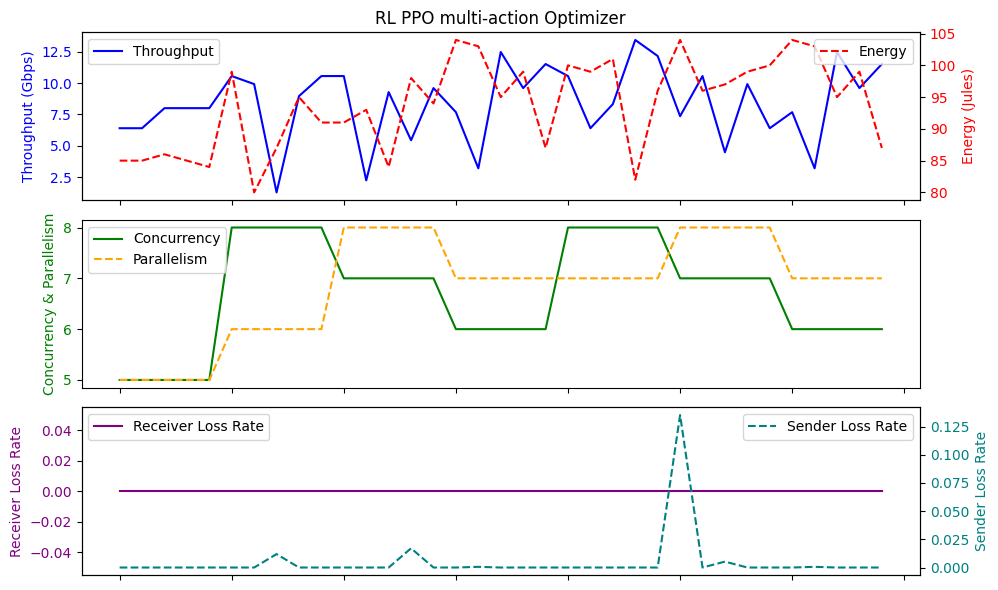

Average Throughput: 8.393142857142859
Total Energy: 3287.0
Total loss rate: 0.1705394916572518
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.054857       0.0   3.114286  33.920000   93.057143   0.000842
std      3.431166       0.0   1.470723   3.112291    8.602130   0.003434
min      0.960000       0.0   0.000000  32.500000   69.000000   0.000000
25%      5.920000       0.0   2.000000  32.700000   85.500000   0.000000
50%      8.320000       0.0   3.000000  32.900000   94.000000   0.000000
75%     10.560000       0.0   4.000000  33.600000   99.000000   0.000000
max     13.440000       0.0   5.000000  49.500000  113.000000   0.016753
Episode reward: 7.608000000000004
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-3.1440000000000055, 4.992000000000004, -6.9119999999999955, 13.440000000000001, -0.38

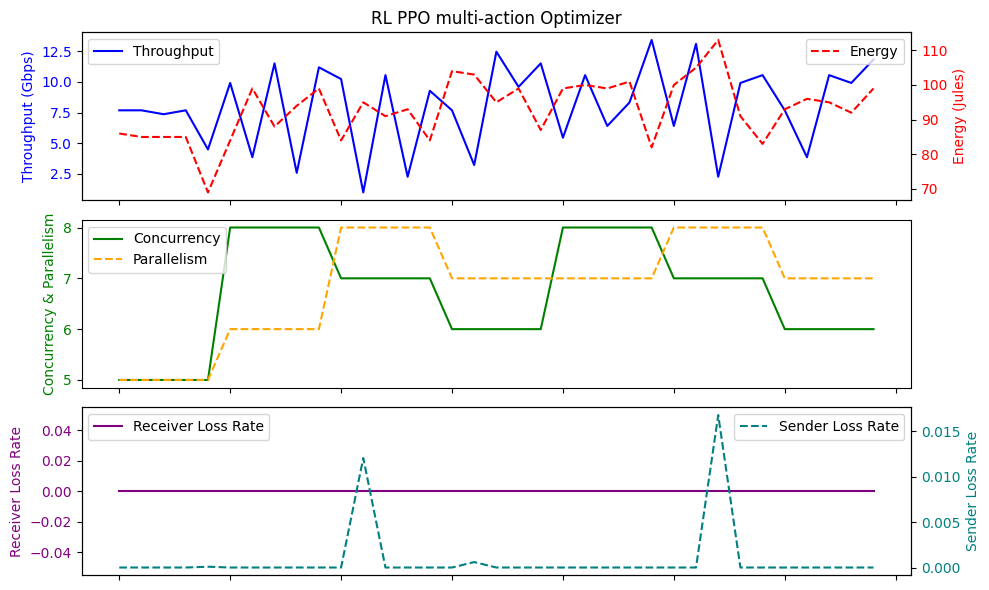

Average Throughput: 8.054857142857143
Total Energy: 3257.0
Total loss rate: 0.029470273302094292
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.338286       0.0   3.285714  34.248571   93.742857   0.001035
std      3.198063       0.0   1.466718   3.439508    7.329806   0.003566
min      1.280000       0.0   0.000000  32.500000   80.000000   0.000000
25%      7.520000       0.0   2.500000  32.900000   86.500000   0.000000
50%      8.320000       0.0   3.000000  33.200000   96.000000   0.000000
75%     10.560000       0.0   4.500000  33.650000   99.000000   0.000000
max     13.440000       0.0   5.000000  51.100000  104.000000   0.017043
Episode reward: 8.376000000000005
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [1.4639999999999986, -0.3839999999999897, -1.0658141036401503e-14, 7.2960000000000065

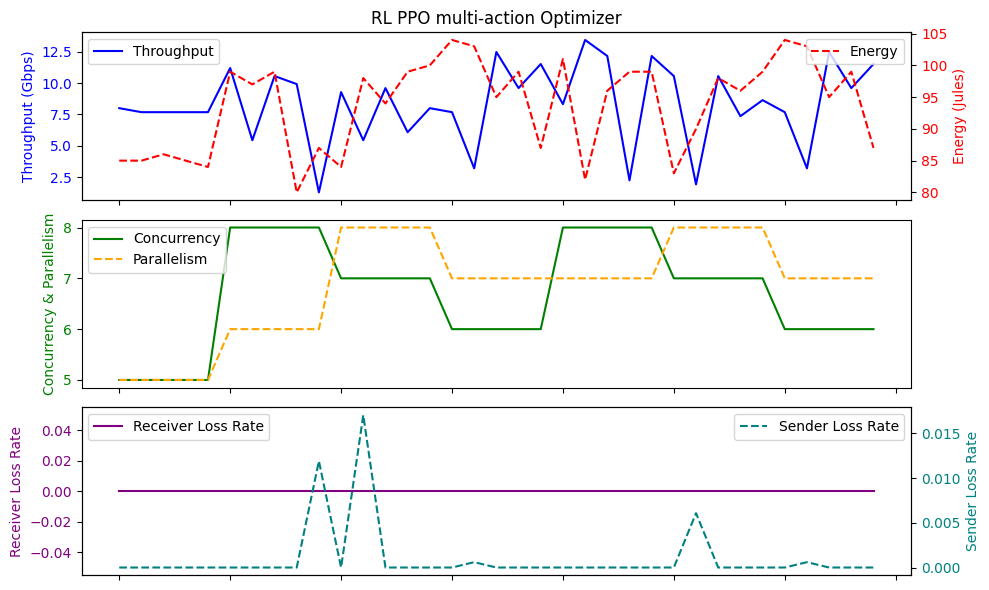

Average Throughput: 8.338285714285716
Total Energy: 3281.0
Total loss rate: 0.03621720659325449
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.320000       0.0   3.171429  33.951429   94.742857   0.000747
std      3.499405       0.0   1.424279   3.053000    6.625898   0.003011
min      1.920000       0.0   1.000000  32.500000   82.000000   0.000000
25%      5.920000       0.0   2.000000  32.800000   89.500000   0.000000
50%      9.600000       0.0   4.000000  33.100000   96.000000   0.000000
75%     10.880000       0.0   4.000000  33.650000   99.000000   0.000000
max     13.440000       0.0   5.000000  49.500000  105.000000   0.017043
Episode reward: 8.376000000000005
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-7.751999999999999, 9.599999999999998, -2.304000000000002, 9.800000000000002, 0.32000

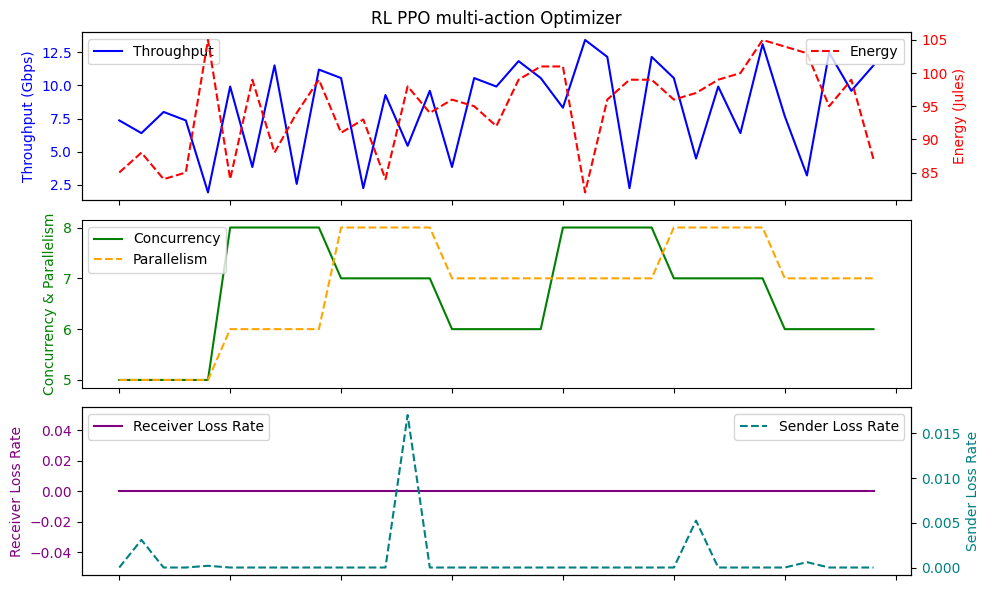

Average Throughput: 8.320000000000002
Total Energy: 3316.0
Total loss rate: 0.026162323517796605
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.201143       0.0   2.971429  34.928571   95.514286   0.004855
std      2.523368       0.0   2.382358   4.548728    6.648182   0.022947
min      1.280000       0.0  -8.000000  32.500000   80.000000   0.000000
25%      6.400000       0.0   2.000000  32.700000   92.000000   0.000000
50%      8.000000       0.0   3.000000  33.100000   98.000000   0.000000
75%     10.240000       0.0   5.000000  34.250000   99.500000   0.000000
max     11.840000       0.0   5.000000  49.500000  104.000000   0.135158
Episode reward: 10.112
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [3.0, -1.919999999999991, -1.0658141036401503e-14, 5.760000000000005, -6.528000000000006, 1.1520

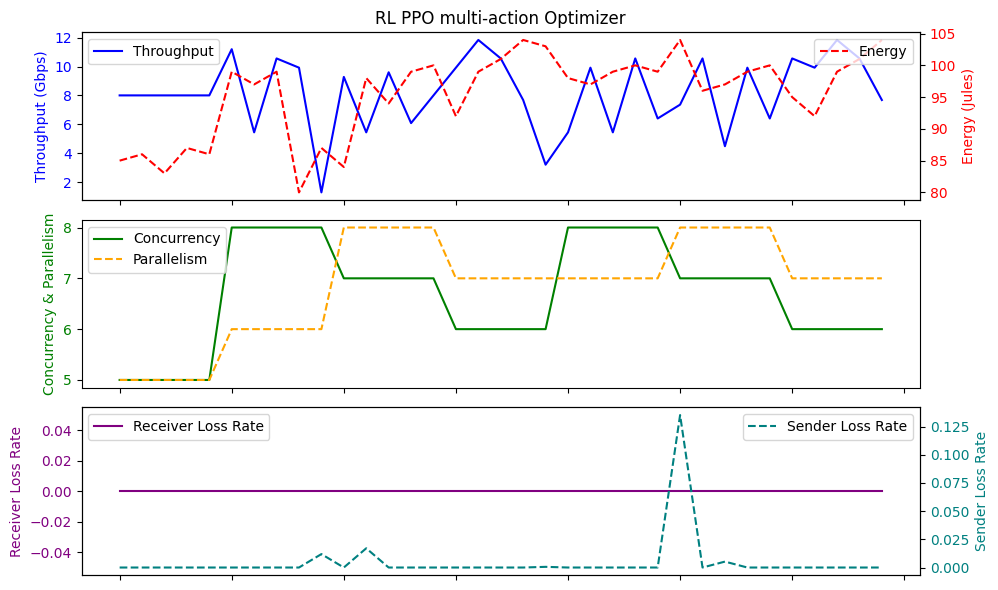

Average Throughput: 8.201142857142857
Total Energy: 3343.0
Total loss rate: 0.16994064428195602
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     7.981714       0.0   3.057143  34.094286   95.028571   0.001156
std      3.509669       0.0   1.433688   3.077235    6.866310   0.004064
min      1.280000       0.0   0.000000  32.500000   82.000000   0.000000
25%      5.440000       0.0   2.000000  32.900000   90.500000   0.000000
50%      8.960000       0.0   3.000000  33.100000   95.000000   0.000000
75%     10.560000       0.0   4.000000  33.750000   99.000000   0.000000
max     13.440000       0.0   5.000000  49.500000  113.000000   0.017043
Episode reward: 5.304000000000002
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-7.3679999999999986, 11.904, -10.367999999999999, 13.056000000000001, 2.9519999999999

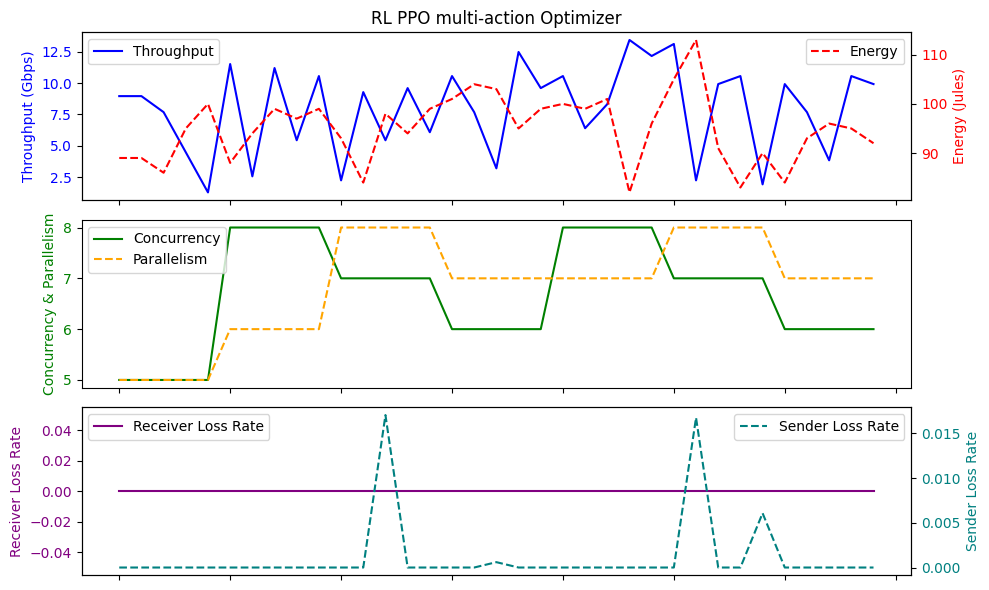

Average Throughput: 7.981714285714286
Total Energy: 3326.0
Total loss rate: 0.040469343321306195
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.530286       0.0   3.457143  34.282857   94.171429   0.000663
std      3.167784       0.0   1.521278   3.930386    6.089942   0.003029
min      1.920000       0.0   1.000000  32.500000   82.000000   0.000000
25%      6.720000       0.0   2.500000  32.700000   92.000000   0.000000
50%      9.280000       0.0   3.000000  33.100000   96.000000   0.000000
75%     10.560000       0.0   4.500000  33.650000   99.000000   0.000000
max     13.440000       0.0   8.000000  49.500000  101.000000   0.017043
Episode reward: 7.608000000000004
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [4.152000000000001, 0.38400000000000034, -3.456000000000003, 8.264000000000001, 0.320

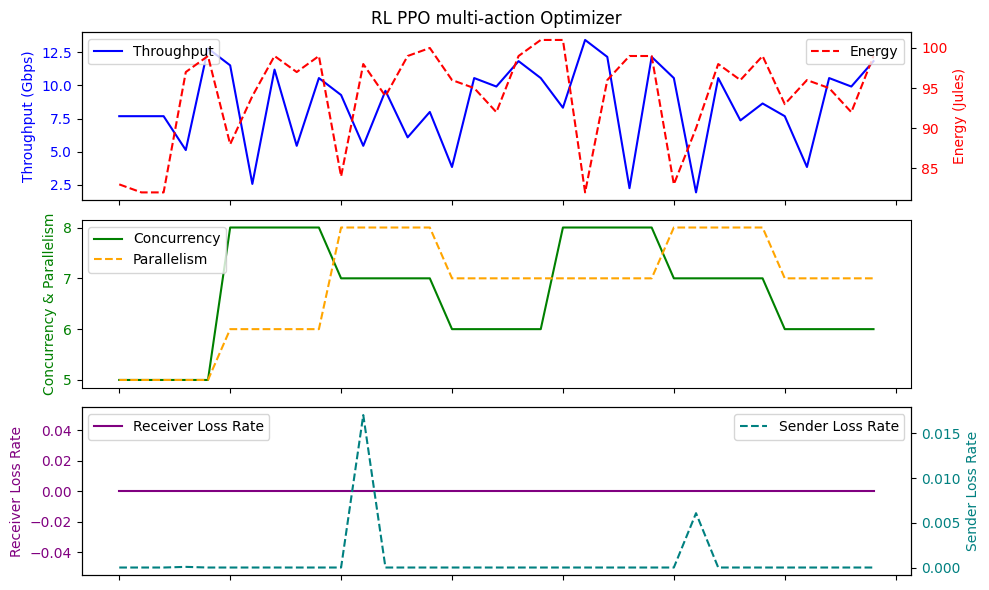

Average Throughput: 8.530285714285714
Total Energy: 3296.0
Total loss rate: 0.023189853477172517
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.320000       0.0   3.228571  34.382857   93.542857   0.000994
std      3.096685       0.0   1.415995   4.257277    6.895620   0.003537
min      1.280000       0.0   0.000000  32.500000   80.000000   0.000000
25%      6.880000       0.0   2.500000  32.800000   87.000000   0.000000
50%      8.320000       0.0   3.000000  33.000000   95.000000   0.000000
75%     10.240000       0.0   4.000000  33.500000   99.000000   0.000000
max     13.440000       0.0   5.000000  51.600000  105.000000   0.017043
Episode reward: 5.304000000000002
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [2.2319999999999993, -6.143999999999995, 4.991999999999994, 7.2960000000000065, 1.287

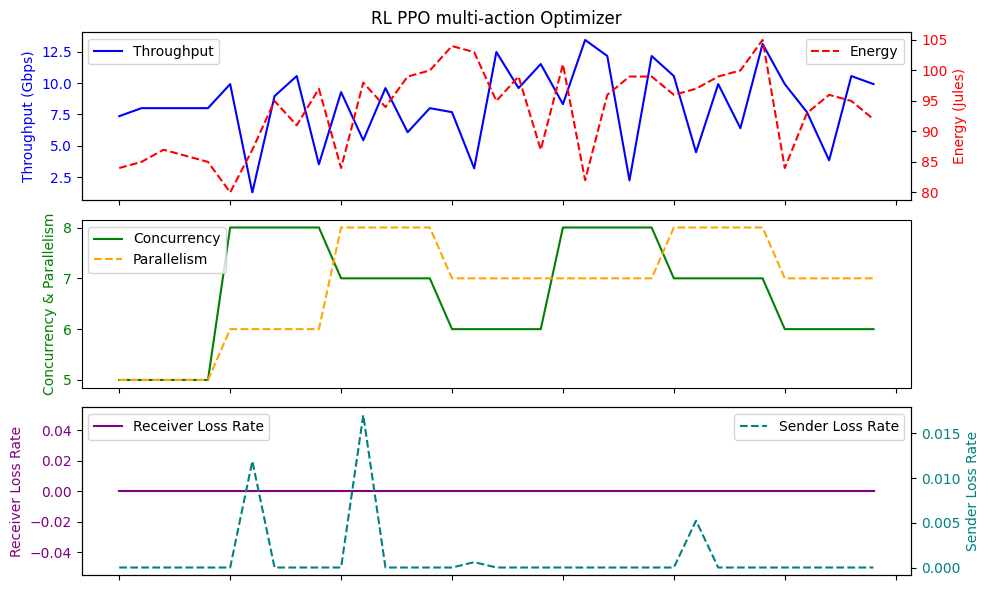

Average Throughput: 8.32
Total Energy: 3274.0
Total loss rate: 0.03478234205604701
       Throughput  LossRate       Score        RTT      Energy   SenderLR
count   35.000000      35.0   35.000000  35.000000   35.000000  35.000000
mean     7.789714       0.0   -2.228571  34.334286   92.485714   0.063651
std      3.546376       0.0   30.965907   3.236278   10.430079   0.370158
min      0.960000       0.0 -180.000000  32.500000   64.000000   0.000000
25%      4.640000       0.0    2.000000  32.800000   87.500000   0.000000
50%      9.280000       0.0    3.000000  33.100000   94.000000   0.000000
75%     10.560000       0.0    4.000000  34.150000   99.000000   0.000000
max     13.120000       0.0    5.000000  49.500000  113.000000   2.190872
Episode reward: 10.112
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-11.592000000000004, 13.440000000000003, -6.9119999999999955, 13.440000000000001, -5.760000000000005

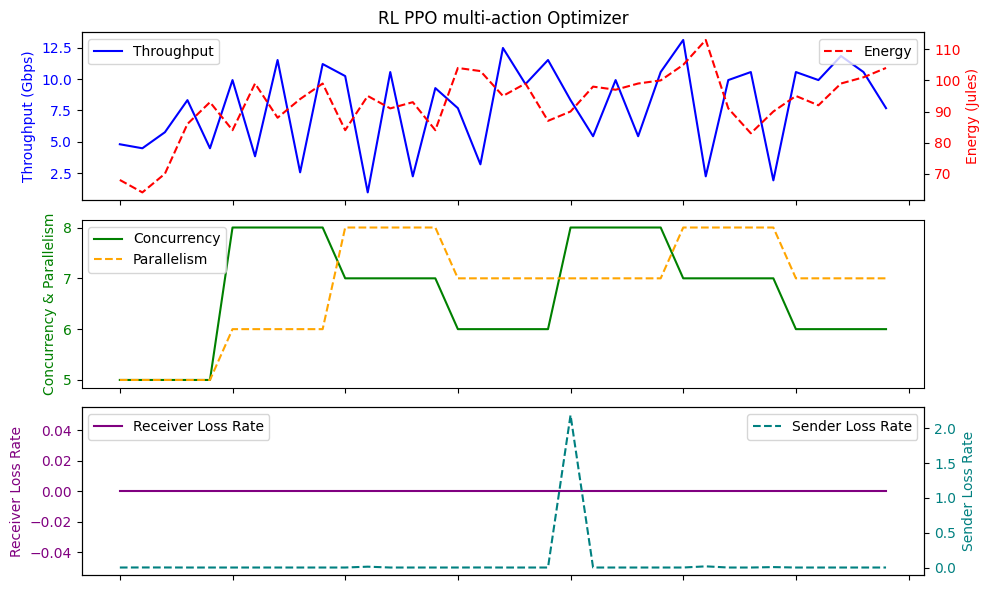

Average Throughput: 7.789714285714285
Total Energy: 3237.0
Total loss rate: 2.2277759063304226
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     7.817143       0.0   3.057143  34.134286   93.371429   0.000857
std      3.837871       0.0   1.513524   3.938568    7.264279   0.002958
min      0.960000       0.0   0.000000  32.500000   72.000000   0.000000
25%      4.640000       0.0   2.000000  32.700000   90.500000   0.000000
50%      8.640000       0.0   3.000000  33.000000   95.000000   0.000000
75%     10.560000       0.0   4.000000  33.350000   99.000000   0.000000
max     15.360000       0.0   5.000000  49.500000  109.000000   0.012031
Episode reward: 9.344
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-11.591999999999995, 7.68, 6.1440000000000055, 5.375999999999994, -1.5360000000000014, -4.22400000

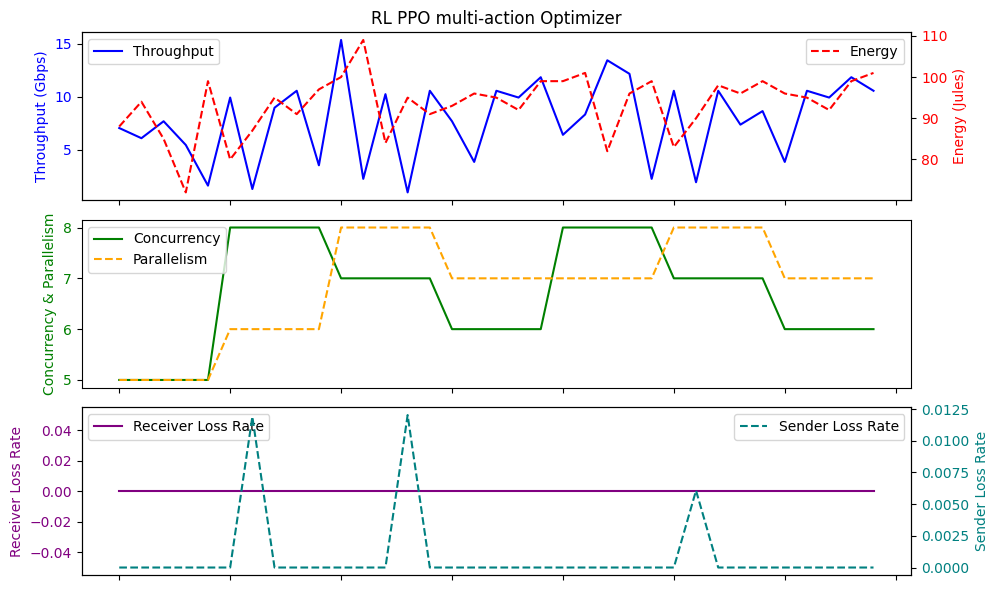

Average Throughput: 7.817142857142858
Total Energy: 3268.0
Total loss rate: 0.03000722579838226
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.100571       0.0   2.885714  34.425714   92.285714   0.004838
std      3.155236       0.0   2.361099   4.007445    8.379146   0.022950
min      1.280000       0.0  -8.000000  32.500000   70.000000   0.000000
25%      5.760000       0.0   2.500000  32.850000   89.000000   0.000000
50%      9.280000       0.0   3.000000  33.200000   95.000000   0.000000
75%     10.560000       0.0   4.000000  33.900000   98.500000   0.000000
max     13.440000       0.0   6.000000  49.500000  104.000000   0.135158
Episode reward: 10.112
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-5.831999999999997, 1.9200000000000017, 3.4559999999999924, 5.760000000000005, 4.359999999999999

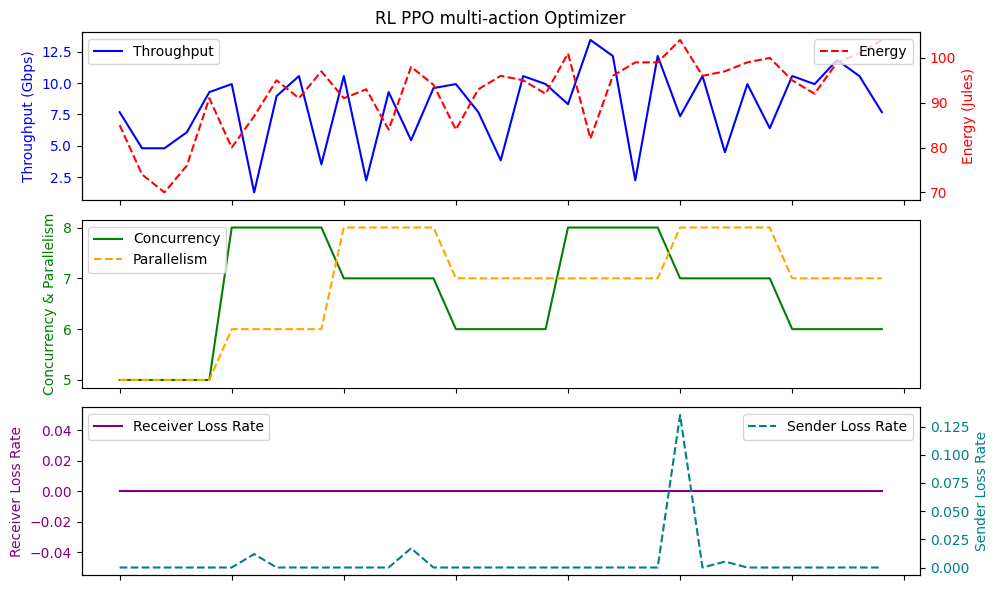

Average Throughput: 8.100571428571428
Total Energy: 3230.0
Total loss rate: 0.16934179690666026
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.283429       0.0   2.885714  34.465714   94.885714   0.004729
std      2.788369       0.0   2.310735   3.645379    6.910229   0.022919
min      2.560000       0.0  -8.000000  32.500000   82.000000   0.000000
25%      6.400000       0.0   2.000000  32.750000   88.000000   0.000000
50%      8.320000       0.0   3.000000  33.000000   98.000000   0.000000
75%     10.560000       0.0   4.000000  34.000000   99.500000   0.000000
max     13.440000       0.0   5.000000  49.500000  104.000000   0.135158
Episode reward: 10.112
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-3.527999999999995, 5.375999999999994, -0.7680000000000007, 7.2960000000000065, -0.3840000000000

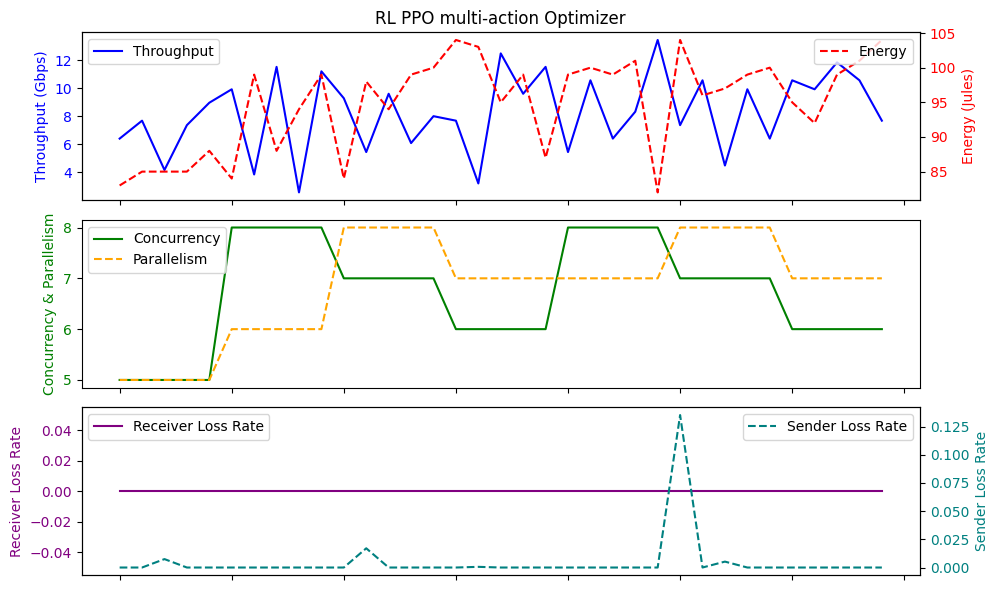

Average Throughput: 8.283428571428573
Total Energy: 3321.0
Total loss rate: 0.1655031793509878
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.137143       0.0   3.200000  34.077143   95.371429   0.000511
std      3.648797       0.0   1.510746   3.202489    6.795698   0.002192
min      0.960000       0.0   0.000000  32.500000   82.000000   0.000000
25%      5.920000       0.0   2.000000  32.750000   92.500000   0.000000
50%      8.000000       0.0   4.000000  33.000000   96.000000   0.000000
75%     10.560000       0.0   4.000000  33.650000   99.000000   0.000000
max     15.360000       0.0   5.000000  49.500000  109.000000   0.012031
Episode reward: 7.608000000000004
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-0.8400000000000034, 2.6880000000000024, -5.375999999999994, 10.751999999999999, -1.15

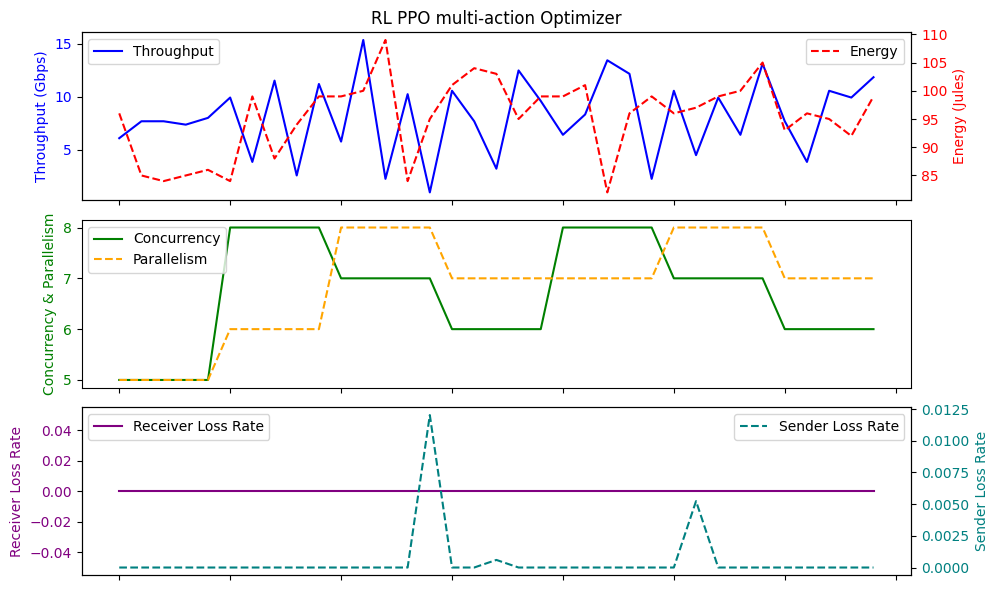

Average Throughput: 8.137142857142855
Total Energy: 3338.0
Total loss rate: 0.017868460375575945
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.603429       0.0   3.371429  34.582857   94.628571   0.001156
std      3.025622       0.0   1.415995   3.587928    7.821861   0.004064
min      1.920000       0.0   0.000000  32.500000   80.000000   0.000000
25%      7.520000       0.0   3.000000  32.900000   87.000000   0.000000
50%      9.280000       0.0   4.000000  33.100000   96.000000   0.000000
75%     10.560000       0.0   4.500000  34.150000   99.500000   0.000000
max     13.440000       0.0   5.000000  49.500000  113.000000   0.017043
Episode reward: 10.112
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [2.2319999999999993, 0.38400000000000034, -1.5360000000000014, 7.2960000000000065, 1.79999999999

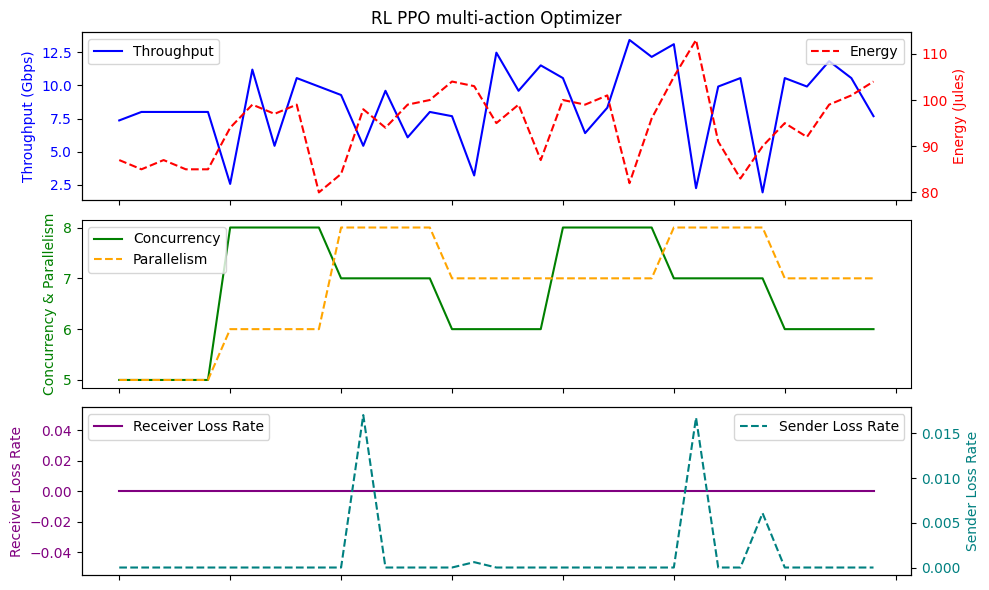

Average Throughput: 8.603428571428571
Total Energy: 3312.0
Total loss rate: 0.040469343321306195
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     7.981714       0.0   2.885714  34.508571   92.542857   0.004355
std      3.183906       0.0   2.336053   4.023999    8.211695   0.022865
min      0.960000       0.0  -8.000000  32.500000   71.000000   0.000000
25%      5.920000       0.0   2.000000  32.850000   85.000000   0.000000
50%      8.320000       0.0   3.000000  33.200000   95.000000   0.000000
75%     10.560000       0.0   4.000000  33.650000   99.000000   0.000000
max     13.440000       0.0   5.000000  49.500000  104.000000   0.135158
Episode reward: 10.112
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-5.831999999999997, 8.447999999999997, -7.679999999999996, 10.367999999999999, 0.76800000000000

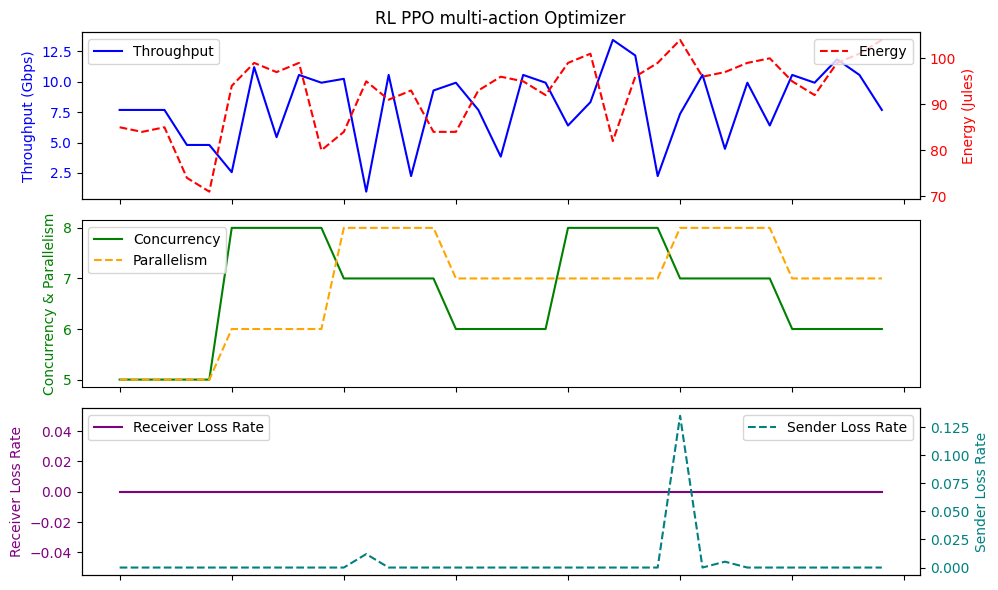

Average Throughput: 7.981714285714286
Total Energy: 3239.0
Total loss rate: 0.1524279152261892
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     7.844571       0.0   3.085714  34.265714   94.657143   0.000972
std      3.517750       0.0   1.502379   3.914749    7.526201   0.003514
min      0.960000       0.0   0.000000  32.500000   82.000000   0.000000
25%      4.960000       0.0   2.000000  32.750000   88.000000   0.000000
50%      8.320000       0.0   3.000000  33.100000   95.000000   0.000000
75%     10.080000       0.0   4.000000  33.650000   99.000000   0.000000
max     15.360000       0.0   5.000000  49.500000  113.000000   0.016753
Episode reward: 5.304000000000002
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-0.8400000000000034, 2.6880000000000024, -5.375999999999994, 8.831999999999997, 2.6879

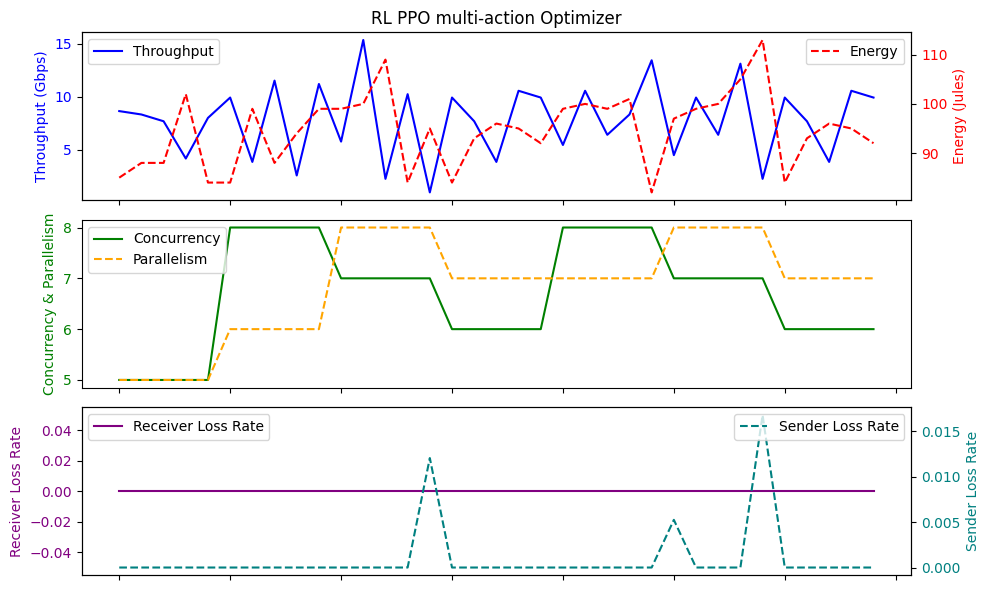

Average Throughput: 7.844571428571428
Total Energy: 3313.0
Total loss rate: 0.034022192739818026
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     7.817143       0.0   3.085714  34.340000   93.057143   0.001361
std      3.185176       0.0   1.482673   4.045128    6.833924   0.004019
min      0.960000       0.0   0.000000  32.500000   80.000000   0.000000
25%      5.920000       0.0   2.000000  32.700000   86.500000   0.000000
50%      8.000000       0.0   3.000000  33.000000   95.000000   0.000000
75%     10.560000       0.0   4.000000  33.600000   99.000000   0.000000
max     13.440000       0.0   5.000000  49.500000  104.000000   0.017043
Episode reward: 5.304000000000004
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [1.0799999999999983, 1.0658141036401503e-14, -11.904000000000012, 17.66400000000001, 

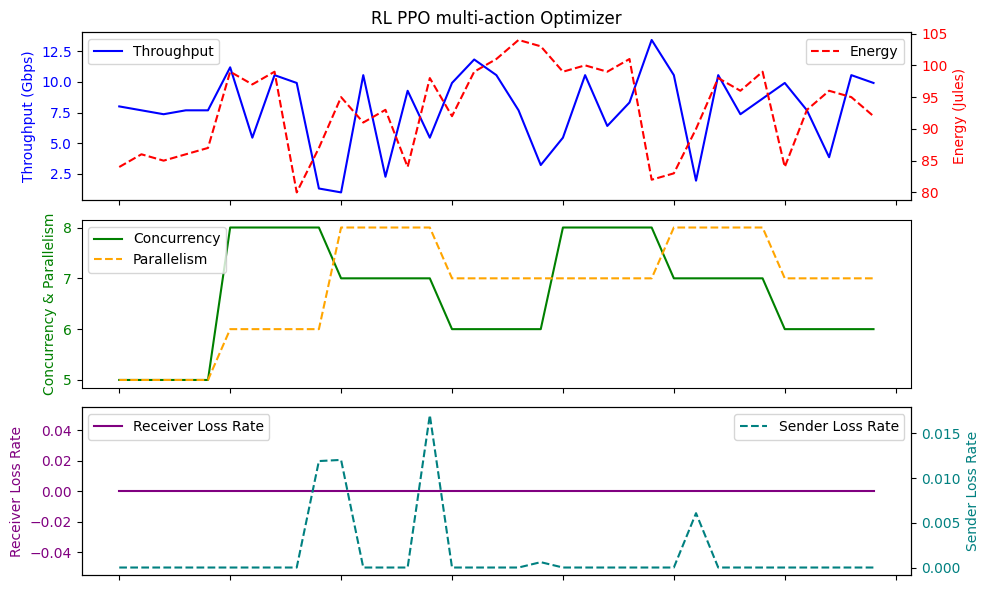

Average Throughput: 7.817142857142858
Total Energy: 3257.0
Total loss rate: 0.047649192731394355
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     7.881143       0.0   3.114286  34.625714   93.228571   0.001483
std      3.498618       0.0   1.510189   4.024363    8.623108   0.004458
min      0.960000       0.0   0.000000  32.500000   71.000000   0.000000
25%      5.440000       0.0   2.000000  32.850000   90.000000   0.000000
50%      8.320000       0.0   3.000000  33.100000   94.000000   0.000000
75%     10.560000       0.0   4.000000  34.150000   99.000000   0.000000
max     13.440000       0.0   5.000000  49.500000  113.000000   0.017043
Episode reward: 10.112000000000002
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-6.599999999999998, 8.447999999999997, -12.672000000000002, 18.43200000000001, 0.38

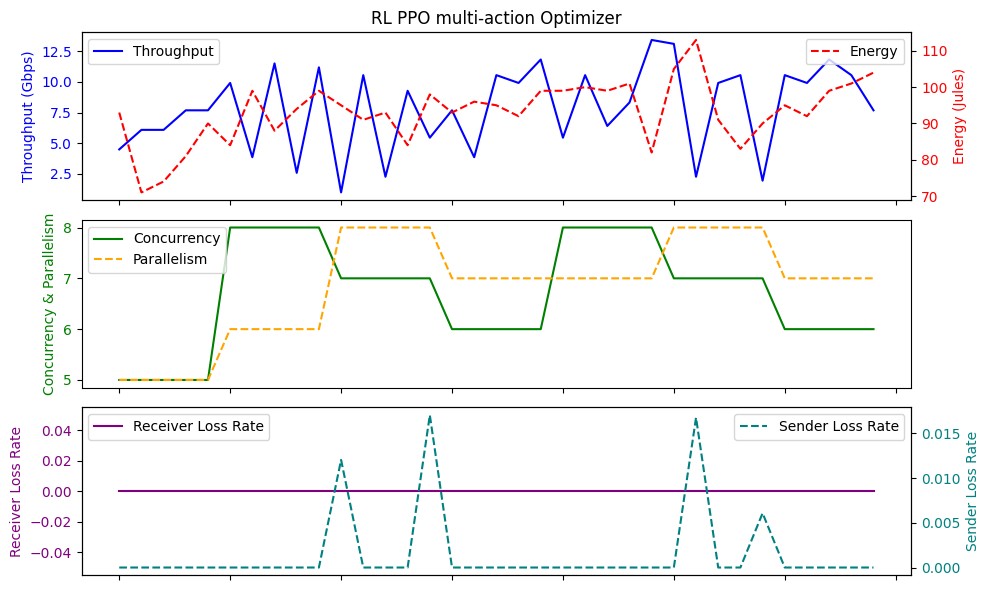

Average Throughput: 7.881142857142857
Total Energy: 3263.0
Total loss rate: 0.051901329459446054
       Throughput  LossRate      Score        RTT      Energy   SenderLR
count   35.000000      35.0  35.000000  35.000000   35.000000  35.000000
mean     8.256000       0.0   3.314286  34.920000   94.228571   0.000517
std      3.300812       0.0   1.490587   4.414268    6.412697   0.002251
min      0.960000       0.0   0.000000  32.500000   83.000000   0.000000
25%      6.880000       0.0   2.000000  32.800000   89.000000   0.000000
50%      8.640000       0.0   3.000000  33.300000   95.000000   0.000000
75%     10.560000       0.0   5.000000  34.150000   99.000000   0.000000
max     15.360000       0.0   5.000000  49.500000  109.000000   0.012031
Episode reward: 10.112
actions [array([1, 1]), array([0, 1]), array([1, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [2.2319999999999993, -0.38400000000000034, 0.384000000000011, 5.375999999999994, -7.296000000000

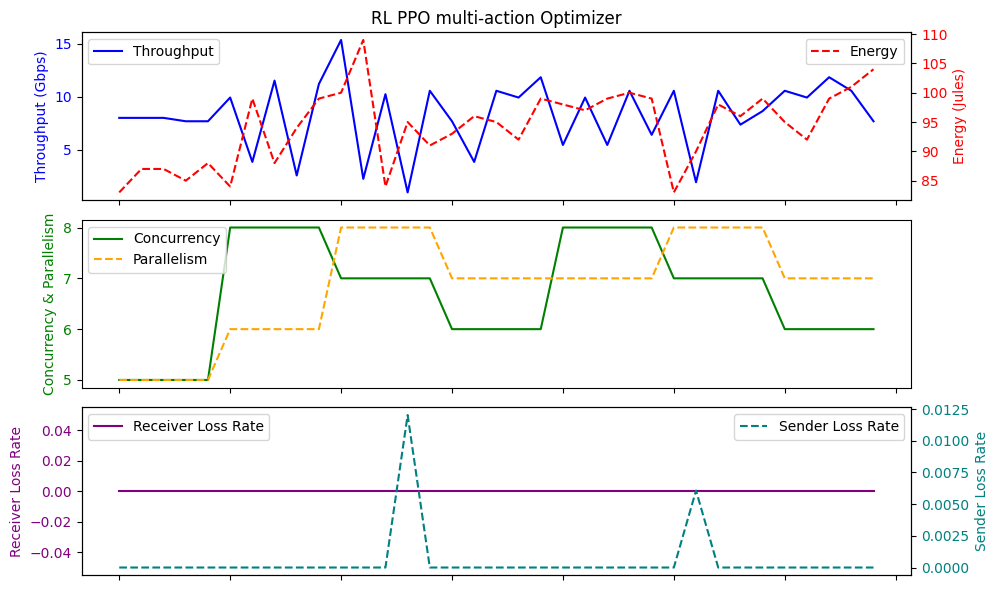

Average Throughput: 8.256
Total Energy: 3298.0
Total loss rate: 0.018105630162191882
       Throughput  LossRate       Score        RTT      Energy   SenderLR
count   35.000000      35.0   35.000000  35.000000   35.000000  35.000000
mean     8.118857       0.0   -2.228571  34.142857   93.085714   0.062787
std      3.886840       0.0   30.963057   3.254977   13.630354   0.370293
min      0.960000       0.0 -180.000000  32.500000   52.000000   0.000000
25%      5.280000       0.0    2.000000  32.700000   91.000000   0.000000
50%      8.320000       0.0    3.000000  33.000000   98.000000   0.000000
75%     10.560000       0.0    4.000000  33.700000   99.500000   0.000000
max     15.360000       0.0    5.000000  49.500000  113.000000   2.190872
Episode reward: 10.111999999999998
actions [array([1, 1]), array([1, 1]), array([2, 3]), array([3, 3]), array([2, 1]), array([1, 3]), array([3, 3])],   7
rewards [-18.504, 27.976, -5.3199999999999985, 4.224000000000004, -5.760000000000005, -0.768000

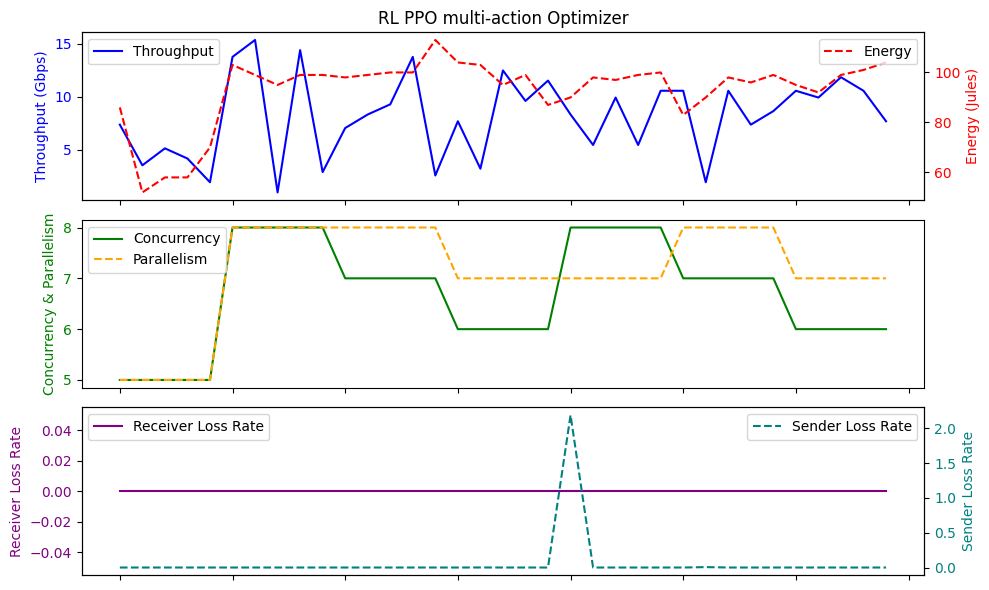

Average Throughput: 8.118857142857143
Total Energy: 3258.0
Total loss rate: 2.197545999621865


In [24]:
num_of_run=50

rl_throughput_sla_throughput_list=[]
rl_throughput_sla_energy_list=[]
rl_throughput_sla_plr_list=[]


model = PPO.load("./ppo_multi_action_in_de_throughputSLA/ppo_best_model/best_model.zip")
for i in range(0,num_of_run):
    done = False
    episode_reward = 0
    env=transferClass_multi_action_increase_decrease_throughput_SLA(cluster_dictionary,initial_value_cluster_dictionary,'throughputSLA')
    action_list=[]
    reward_list=[]
    obs = env.reset()
    while not done:
        action, _ = model.predict(obs, deterministic=True)
        action_list.append(action)
    #     print("action: ",action)
        obs, reward, done, info = env.step(action)
    #     obs = obs.astype(np.float32)
    #     print("obs: ", obs,".... reward: ",reward)
        reward_list.append(reward)
        episode_reward += reward

    accumulator_df = pd.concat(env.obs_df)  # Add more DataFrames in the list if needed
    env.close()
    print(accumulator_df.describe())
    print(f"Episode reward: {episode_reward}")
    print(f"actions {action_list},   {len(action_list)}")
    print(f"rewards {reward_list},  {len(reward_list)}")
    rl_throughput_sla_throughput_list.append(accumulator_df['Throughput'].mean())
    rl_throughput_sla_energy_list.append(accumulator_df['Energy'].mean())
    rl_throughput_sla_plr_list.append(accumulator_df['SenderLR'].mean())
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 6), sharex=True)

    df=accumulator_df.reset_index()
    # Top plot with Throughput and Energy
    ax1.plot( df['Throughput'], label='Throughput', color='blue')
    ax1.set_ylabel('Throughput (Gbps)', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.set_title('RL PPO multi-action Optimizer')

    ax2_twin = ax1.twinx()
    ax2_twin.plot(df['Energy'], label='Energy', color='red', linestyle='--')
    ax2_twin.set_ylabel('Energy (Jules)', color='red')
    ax2_twin.tick_params(axis='y', labelcolor='red')

    # Bottom plot with Concurrency, Parallelism, and CC
    ax2.plot(df['Concurrency'], label='Concurrency', color='green')
    ax2.plot(df['Parallelism'], label='Parallelism', color='orange', linestyle='--')
    ax2.set_ylabel('Concurrency & Parallelism', color='green')
    ax2.tick_params(axis='y', labelcolor='green')


    # Bottom plot with Receiver Loss Rate and Sender Loss Rate
    ax3.plot( df['LossRate'], label='Receiver Loss Rate', color='purple', linestyle='-')
    ax3.set_ylabel('Receiver Loss Rate', color='purple')
    ax3.tick_params(axis='y', labelcolor='purple')

    ax4_twin = ax3.twinx()
    ax4_twin.plot( df['SenderLR'], label='Sender Loss Rate', color='teal', linestyle='--')
    ax4_twin.set_ylabel('Sender Loss Rate', color='teal')
    ax4_twin.tick_params(axis='y', labelcolor='teal')
    ax1.set_xticklabels([])
    ax2.set_xticklabels([])
    # Fix for overlapping layouts
    fig.tight_layout()

    # Legend
    ax1.legend(loc='upper left')
    ax2_twin.legend(loc='upper right')
    ax2.legend(loc='upper left')
#     ax3_twin.legend(loc='upper right')
    ax3.legend(loc='upper left')
    ax4_twin.legend(loc='upper right')
#     plt.savefig('withBT.png', format='png', dpi=300, bbox_inches='tight')
    plt.show()

    average_throughput = accumulator_df['Throughput'].mean()
    print("Average Throughput:", average_throughput)
    total_energy = accumulator_df['Energy'].sum()
    print("Total Energy:", total_energy)
    total_plr = accumulator_df['SenderLR'].sum()
    print("Total loss rate:", total_plr)

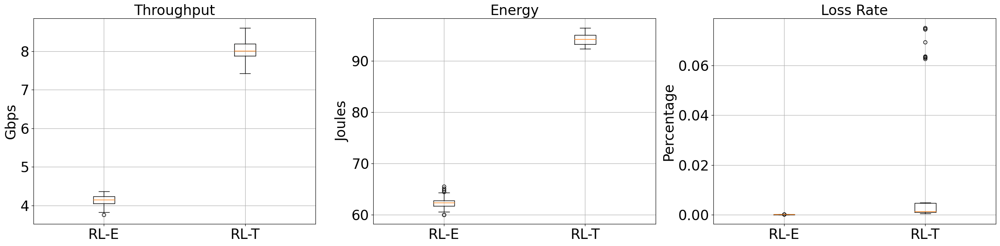

In [25]:
result_dictionary={"Throughput":[rl_energy_sla_throughput_list,rl_throughput_sla_throughput_list],"Energy":[rl_energy_sla_energy_list,rl_throughput_sla_energy_list],"lossRate":[rl_energy_sla_plr_list,rl_throughput_sla_plr_list]}
import matplotlib.pyplot as plt

labels = ['RL-E','RL-T']

# Assuming result_dictionary is already defined with the relevant data
# result_dictionary = {...}

# Creating subplots
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

# Font size for the ticks
tick_font_size = 24  # You can change this value as needed

# Plotting Throughput
axes[0].boxplot(result_dictionary['Throughput'], labels=labels)
axes[0].set_title('Throughput',fontsize=24)
axes[0].set_ylabel('Gbps',fontsize=24)
axes[0].tick_params(axis='both', which='major', labelsize=tick_font_size)  # Set tick font size
axes[0].grid(True)  # Adding grid

# Plotting Energy
axes[1].boxplot(result_dictionary['Energy'], labels=labels)
axes[1].set_title('Energy',fontsize=24)
axes[1].set_ylabel('Joules',fontsize=24)
axes[1].tick_params(axis='both', which='major', labelsize=tick_font_size)  # Set tick font size
axes[1].grid(True)  # Adding grid

# Plotting Loss Rate
axes[2].boxplot(result_dictionary['lossRate'], labels=labels)
axes[2].set_title('Loss Rate',fontsize=24)
axes[2].set_ylabel('Percentage',fontsize=24)
axes[2].tick_params(axis='both', which='major', labelsize=tick_font_size)  # Set tick font size
axes[2].grid(True)  # Adding grid

plt.tight_layout()
plt.show()
